The Task is to build a unified model that can both train and infer whether a picture is one of 4 different classes: HappyMale, HappyFemale, SadMale, SadFemale.

In [1]:
import h5py
import numpy as np
import glob
import os
from PIL import Image
from concurrent.futures import ThreadPoolExecutor


def load_h5_dataset(file_path, dataset_x_key, dataset_y_key):
    with h5py.File(file_path, 'r') as h5file:
        images = np.array(h5file[dataset_x_key])
        labels = np.array(h5file[dataset_y_key])
    return images, labels

So we start with loading datasets from H5 files

In [2]:
# Step 1: Load Happy/Sad Dataset
train_happy_images, train_happy_labels = load_h5_dataset('happy/train_happy.h5', 'train_set_x', 'train_set_y')
test_happy_images, test_happy_labels = load_h5_dataset('happy/test_happy.h5', 'test_set_x', 'test_set_y')


The Happy/Sad dataset is split into training and testing sets, each stored in separate H5 files.

In [3]:
#print the array itself and its shape, which indicates the dimensions of the array 
train_happy_images

array([[[[178, 190, 163],
         [172, 181, 173],
         [188, 196, 184],
         ...,
         [255, 255, 254],
         [254, 255, 250],
         [249, 253, 222]],

        [[184, 201, 165],
         [149, 154, 142],
         [149, 158, 139],
         ...,
         [255, 255, 253],
         [254, 255, 250],
         [251, 255, 230]],

        [[198, 207, 165],
         [141, 147, 128],
         [168, 184, 154],
         ...,
         [253, 255, 244],
         [254, 255, 248],
         [253, 255, 233]],

        ...,

        [[ 77,  82,  89],
         [ 60,  64,  68],
         [ 49,  53,  55],
         ...,
         [ 31,  32,  30],
         [ 47,  48,  46],
         [ 75,  75,  75]],

        [[ 68,  71,  76],
         [ 55,  58,  59],
         [ 44,  47,  47],
         ...,
         [ 30,  31,  29],
         [ 40,  41,  39],
         [ 63,  64,  63]],

        [[ 61,  64,  66],
         [ 52,  54,  54],
         [ 45,  47,  46],
         ...,
         [ 30,  31,  29],
        

In [40]:
train_happy_labels  #This typically represent the class or category to which each image belongs

array([[1., 0.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]], dtype=float32)

In [5]:
import h5py

def inspect_h5_file(file_path):
    with h5py.File(file_path, 'r') as h5file:
        print("Keys in the file:", list(h5file.keys()))
        for key in h5file.keys():
            print(f"Shape of data in '{key}':", h5file[key].shape)

# Inspect the structure of one of your .h5 files
inspect_h5_file('happy/train_happy.h5')

Keys in the file: ['list_classes', 'train_set_x', 'train_set_y']
Shape of data in 'list_classes': (2,)
Shape of data in 'train_set_x': (600, 64, 64, 3)
Shape of data in 'train_set_y': (600,)


The inspect_h5_file function above is designed to inspect the structure of an H5 file

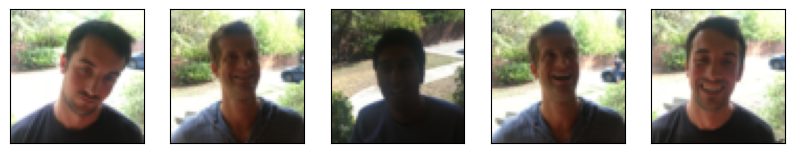

In [6]:
import matplotlib.pyplot as plt

def show_images_from_h5(file_path, dataset_key, num_images=5):
    with h5py.File(file_path, 'r') as h5file:
        images = np.array(h5file[dataset_key])
        plt.figure(figsize=(10, 10))
        for i in range(num_images):
            plt.subplot(1, num_images, i + 1)
            plt.xticks([])
            plt.yticks([])
            plt.grid(False)
            plt.imshow(images[i], cmap=plt.cm.binary)
        plt.show()

# Display the first few images from the happy/sad dataset
show_images_from_h5('happy/train_happy.h5', 'train_set_x')

The function above provides a quick way to visually inspect a subset of images from a dataset stored in an H5 file.

Displaying images 1 to 10


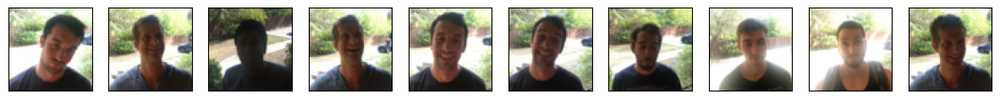

Displaying images 11 to 20


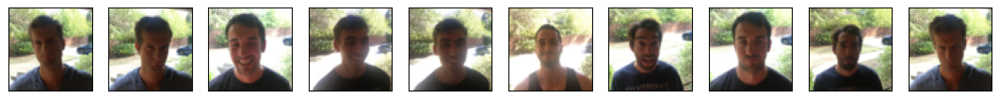

Displaying images 21 to 30


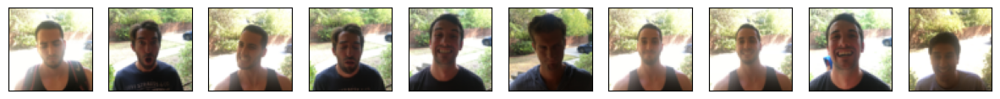

Displaying images 31 to 40


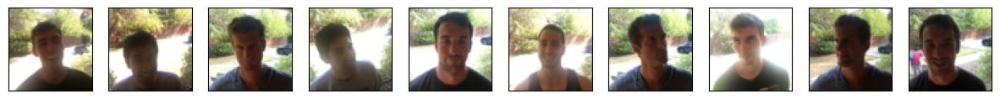

Displaying images 41 to 50


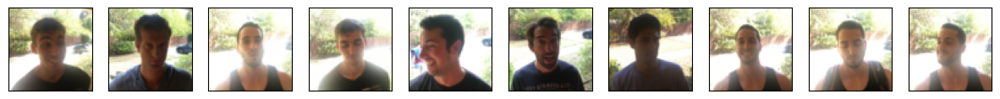

Displaying images 51 to 60


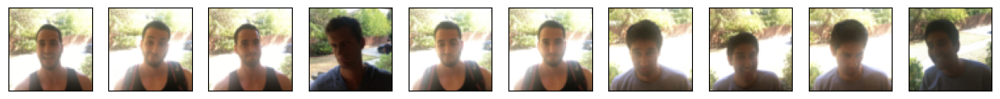

Displaying images 61 to 70


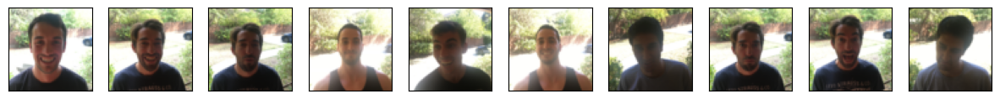

Displaying images 71 to 80


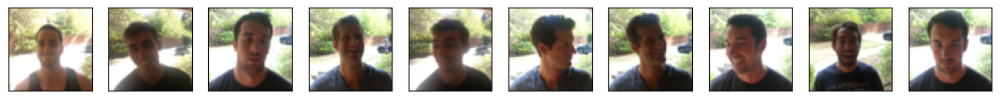

Displaying images 81 to 90


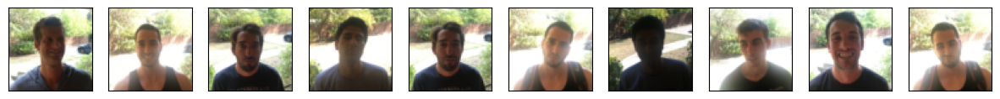

Displaying images 91 to 100


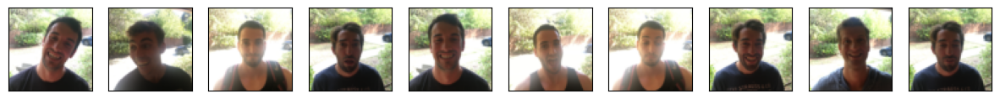

Displaying images 101 to 110


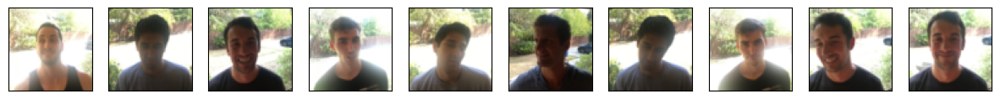

Displaying images 111 to 120


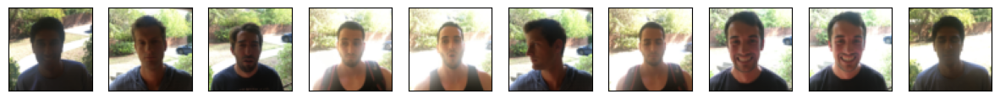

Displaying images 121 to 130


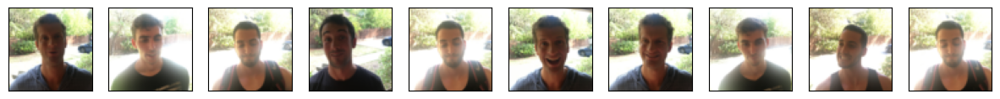

Displaying images 131 to 140


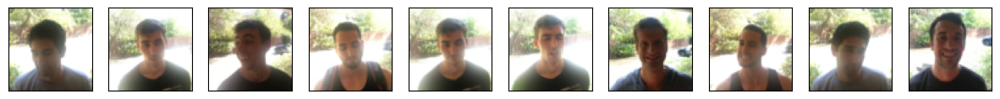

Displaying images 141 to 150


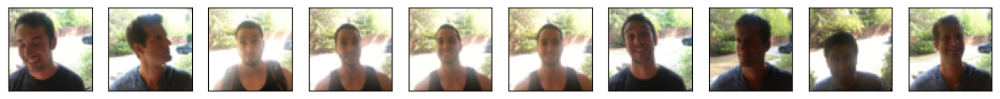

Displaying images 151 to 160


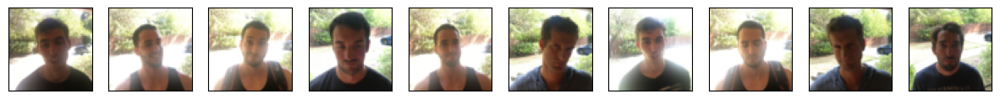

Displaying images 161 to 170


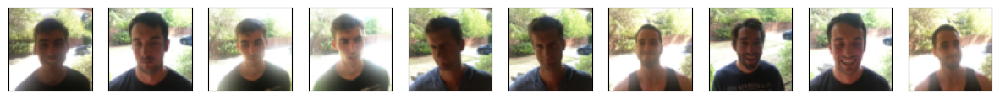

Displaying images 171 to 180


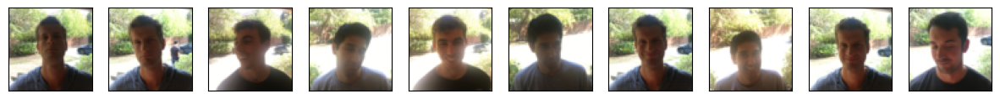

Displaying images 181 to 190


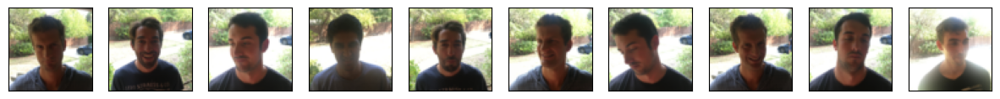

Displaying images 191 to 200


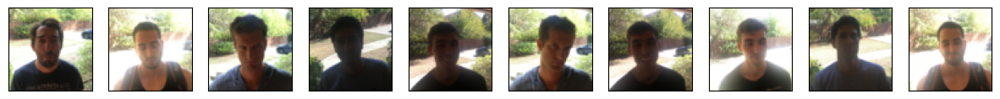

Displaying images 201 to 210


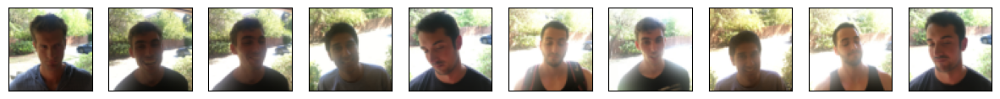

Displaying images 211 to 220


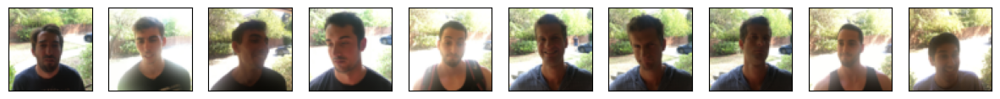

Displaying images 221 to 230


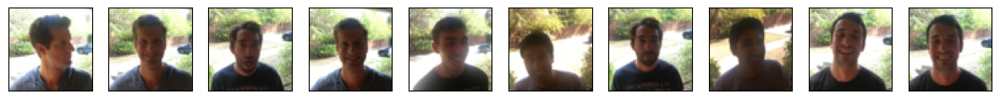

Displaying images 231 to 240


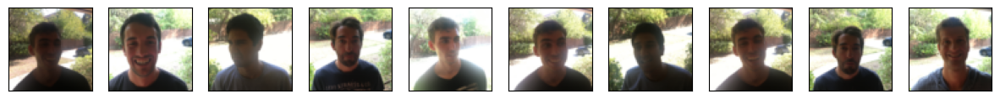

Displaying images 241 to 250


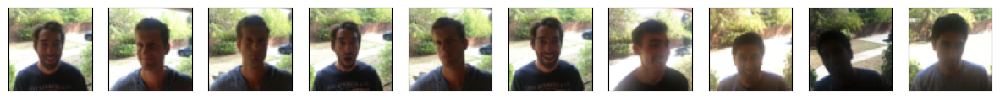

Displaying images 251 to 260


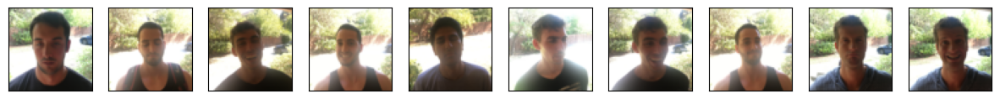

Displaying images 261 to 270


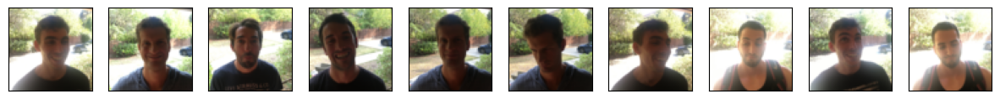

Displaying images 271 to 280


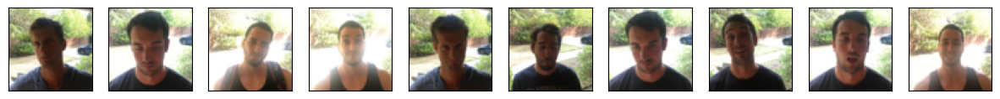

Displaying images 281 to 290


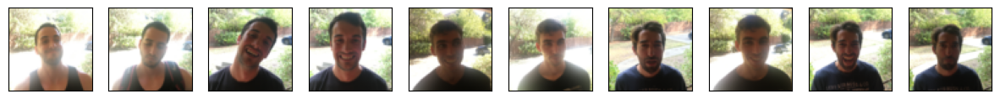

Displaying images 291 to 300


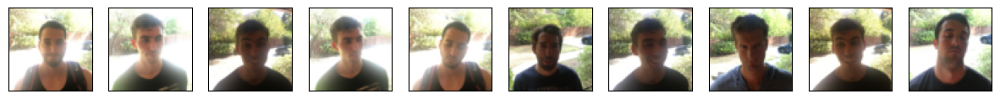

Displaying images 301 to 310


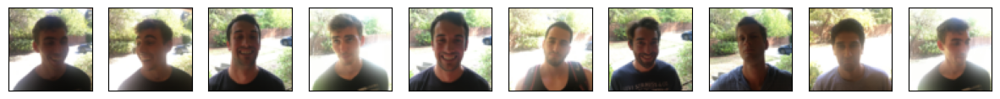

Displaying images 311 to 320


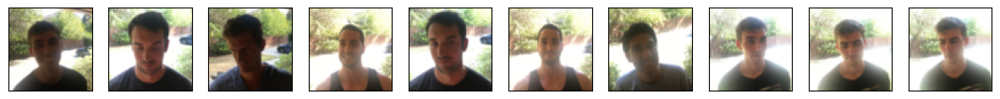

Displaying images 321 to 330


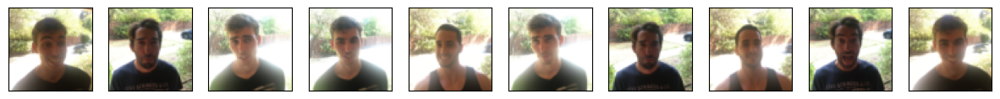

Displaying images 331 to 340


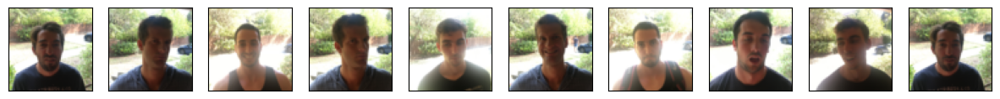

Displaying images 341 to 350


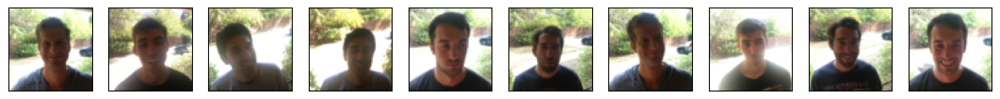

Displaying images 351 to 360


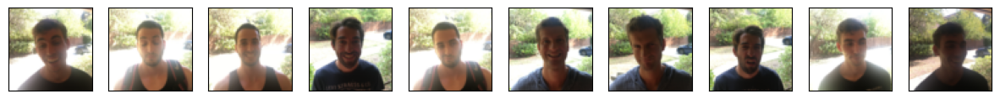

Displaying images 361 to 370


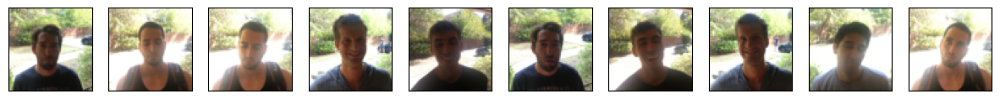

Displaying images 371 to 380


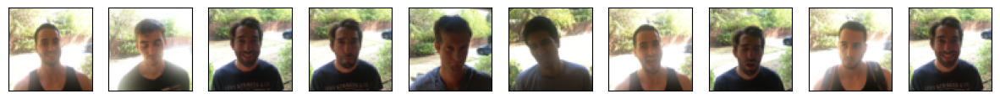

Displaying images 381 to 390


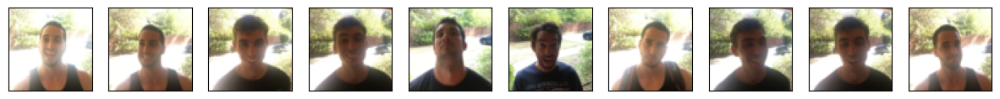

Displaying images 391 to 400


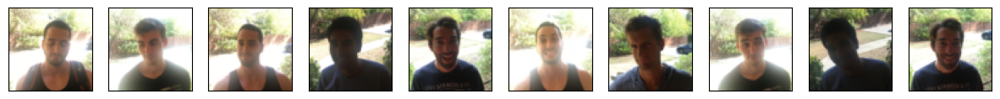

Displaying images 401 to 410


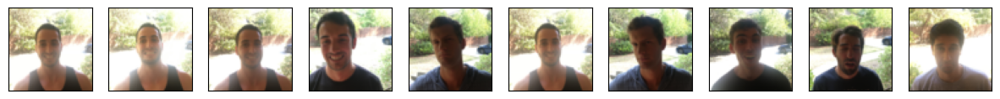

Displaying images 411 to 420


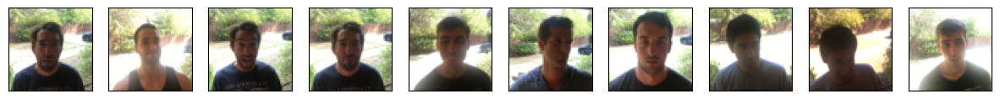

Displaying images 421 to 430


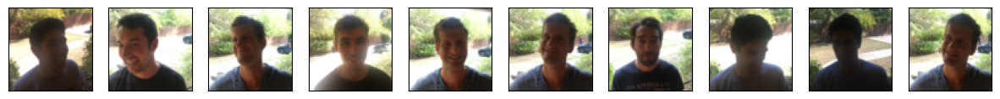

Displaying images 431 to 440


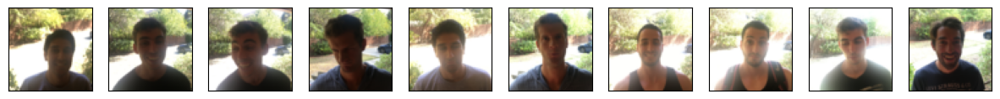

Displaying images 441 to 450


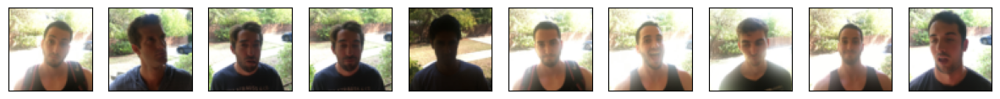

Displaying images 451 to 460


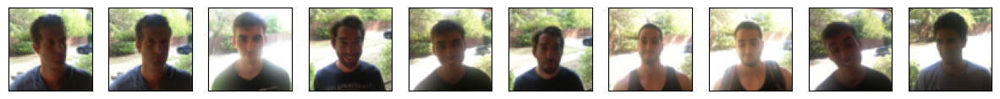

Displaying images 461 to 470


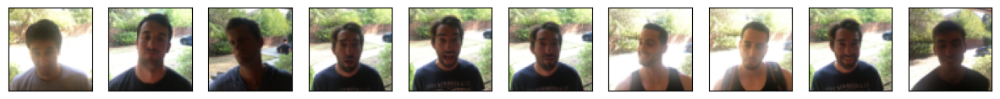

Displaying images 471 to 480


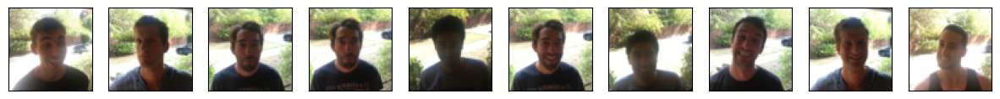

Displaying images 481 to 490


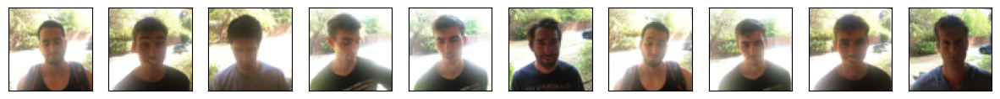

Displaying images 491 to 500


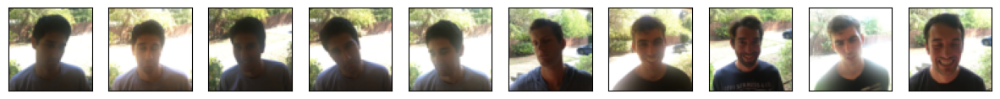

Displaying images 501 to 510


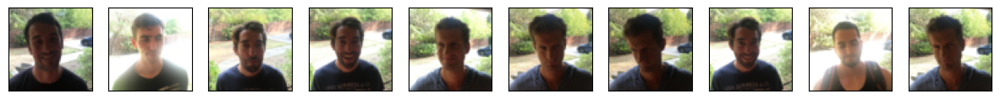

Displaying images 511 to 520


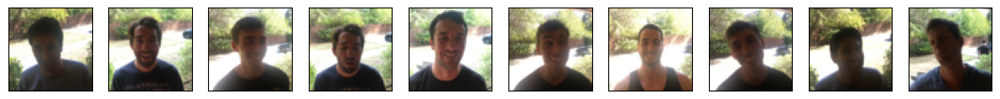

Displaying images 521 to 530


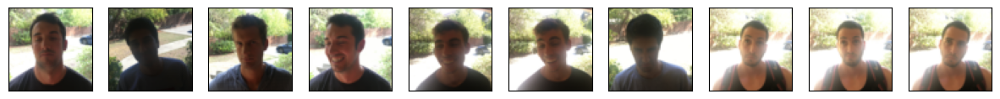

Displaying images 531 to 540


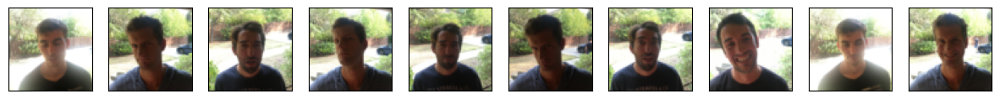

Displaying images 541 to 550


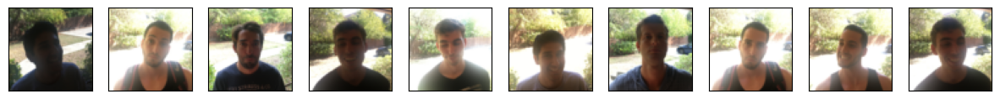

Displaying images 551 to 560


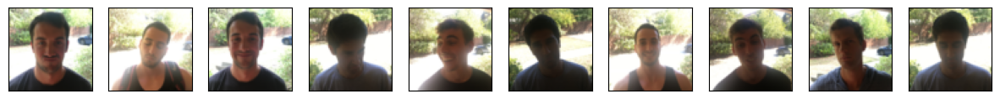

Displaying images 561 to 570


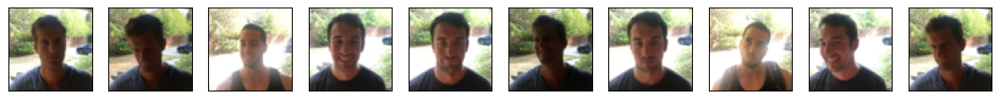

Displaying images 571 to 580


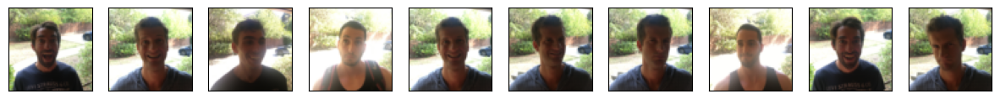

Displaying images 581 to 590


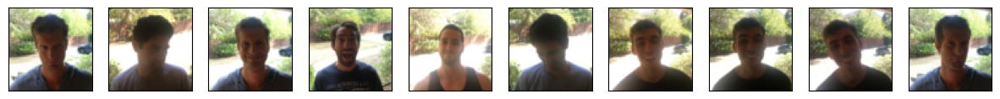

Displaying images 591 to 600


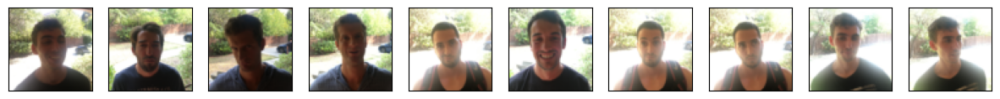

In [11]:
def explore_dataset_in_full_subsets(file_path, dataset_key, subset_size=10):
    with h5py.File(file_path, 'r') as h5file:
        images = np.array(h5file[dataset_key])
        total_images = images.shape[0]

        for offset in range(0, total_images, subset_size):
            end_index = offset + subset_size
            if end_index > total_images:
                end_index = total_images

            plt.figure(figsize=(15, 15))
            print(f"Displaying images {offset + 1} to {end_index}")

            for idx in range(offset, end_index):
                plt.subplot(1, subset_size, idx - offset + 1)
                plt.xticks([])
                plt.yticks([])
                plt.grid(False)
                plt.imshow(images[idx], cmap=plt.cm.binary)
            plt.show()

# Explore the dataset in full subsets
explore_dataset_in_full_subsets('happy/train_happy.h5', 'train_set_x')

The above function collectively load, iterate over, and display subsets of the dataset, providing a comprehensive exploration of the images stored in the H5 file.

In [12]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical


# Normalize the images
train_happy_images = train_happy_images / 255.0
test_happy_images = test_happy_images / 255.0

# Convert labels to categorical (binary format)
train_happy_labels = to_categorical(train_happy_labels, num_classes=2)
test_happy_labels = to_categorical(test_happy_labels, num_classes=2)

# Split train data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(train_happy_images, train_happy_labels, test_size=0.2, random_state=42)


So we are setting up the data in a format suitable for training a deep learning model,Normalizes pixel values of images to be in the range [0, 1] to converge faster and split of train and test data

In [13]:
#initializes the VGG16 mode where weights pre-trained on the ImageNet dataset
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(64, 64, 3))


for layer in base_model.layers[:-4]:
    layer.trainable = False

# Create the model
model = Sequential([
    base_model,
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.5),
    Dense(2, activation='softmax')  
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 2, 2, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 1024)              2098176   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 2)                 2050      
                                                                 
Total params: 16814914 (64.14 MB)
Trainable params: 9179650 (35.02 MB)
Non-trainable params: 7635264 (29.13 MB)
_________________________________________________________________


In [14]:
# Train the model
history_HAppySadModel = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32)

# Evaluate on the test set
test_loss, test_accuracy = model.evaluate(test_happy_images, test_happy_labels)
print(f"Test accuracy: {test_accuracy}, Test loss: {test_loss}")

Epoch 1/10
15/15 [==============================] - 6s 360ms/step - loss: 0.5956 - accuracy: 0.7063 - val_loss: 0.3412 - val_accuracy: 0.8833
Epoch 2/10
15/15 [==============================] - 5s 370ms/step - loss: 0.2454 - accuracy: 0.9167 - val_loss: 0.2459 - val_accuracy: 0.8750
Epoch 3/10
15/15 [==============================] - 5s 365ms/step - loss: 0.1856 - accuracy: 0.9250 - val_loss: 0.1943 - val_accuracy: 0.9083
Epoch 4/10
15/15 [==============================] - 5s 357ms/step - loss: 0.1192 - accuracy: 0.9604 - val_loss: 0.0933 - val_accuracy: 0.9667
Epoch 5/10
15/15 [==============================] - 5s 351ms/step - loss: 0.0986 - accuracy: 0.9667 - val_loss: 0.0747 - val_accuracy: 0.9750
Epoch 6/10
15/15 [==============================] - 5s 353ms/step - loss: 0.0881 - accuracy: 0.9688 - val_loss: 0.3278 - val_accuracy: 0.8917
Epoch 7/10
15/15 [==============================] - 5s 354ms/step - loss: 0.0923 - accuracy: 0.9729 - val_loss: 0.1530 - val_accuracy: 0.9417
Epoch 

Training the model on the Happy/Sad dataset allows it to learn from the provided images and labels, enabling it to make predictions on new, unseen images

In [15]:
from tensorflow.keras.preprocessing import image

def load_and_preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(64, 64))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array / 255.0

def detect_happy(model, image_path):
    # Load and preprocess the input image
    img_array = load_and_preprocess_image(image_path)

    # Make predictions using the model
    predictions = model.predict(img_array)

    # Get the predicted class (0 for sad, 1 for happy)
    predicted_class = np.argmax(predictions)

    if predicted_class == 1:
        return "Happy"
    else:
        return "Not Happy"

# Example usage:
image_path = '/male-female/Training/female/131486.jpg.jpg'
result = detect_happy(model, image_path)
print(f"The image is: {result}")

1/1 [==============================] - 0s 141ms/step
The image is: Happy


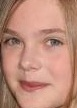

This code defines a function detect_happy that uses a pre-trained model to predict whether an input image is happy or not. The function loads and preprocesses the image, makes predictions using the model, and returns the result as "Happy" or "Not Happy" based on the predicted class (1 for happy, 0 for sad)

In [16]:
import tqdm
import os
import shutil
### we specify our data path here

path_male = "/male-female/Training/male"
path_male_val = "/male-female/Validation/male"

path_female = "/male-female/Training/female"
path_female_val = "/male-female/Validation/female"

path_male_smile = "/male-female/Training/HappySad/HappyMale"
path_male_sad = "/male-female/Training/HappySad/SadMale"
path_female_smile = "/male-female/Training/HappySad/HappyFemale"
path_female_sad = "/male-female/Training/HappySad/SadFemale"


#### Similarly we provide a math for val sad and smile folders
path_male_smile_val = "/male-female/Validation/HappySad/HappyMale"
path_male_sad_val = "/male-female/Validation/HappySad/SadMale"
path_female_smile_val = "/male-female/Validation/HappySad/HappyFemale"
path_female_sad_val = "/male-female/Validation/HappySad/SadFemale"


### we will iterate through the folders and files and use the detect_smile function to detect smiles and then move the files to the respective folders
### We first see how many files we have per male and female folder

files = [f for f in os.listdir(path_male) if os.path.isfile(os.path.join(path_male, f))]
print("Number of male images: "+ str(len(files)))

files2 = [f for f in os.listdir(path_female) if os.path.isfile(os.path.join(path_female, f))]
print("Number of female images: "+ str(len(files2)))

filesVal = [f for f in os.listdir(path_male_val) if os.path.isfile(os.path.join(path_male_val, f))]
print("Number of male validation images: "+ str(len(filesVal)))

filesVal2 = [f for f in os.listdir(path_female_val) if os.path.isfile(os.path.join(path_female_val, f))]
print("Number of female validation images: "+ str(len(filesVal2)))

Number of male images: 23766
Number of female images: 23243
Number of male validation images: 5808
Number of female validation images: 5841


We did the exploration of the dataset before proceeding with further operations, like happy detection and organizing images into labeled folders.It provides an overview of the dataset by counting the number of images in different folders for male and female categories in both the training and validation sets. 

In [17]:
#seperating images
print("Separating male images into smiling and sad")
for file in tqdm.tqdm(files):
    complete_path = os.path.join(path_male, file)
    if detect_happy(model,complete_path):
        shutil.copy2(complete_path, path_male_smile, follow_symlinks=True)
    else:
        shutil.copy2(complete_path, path_male_sad, follow_symlinks=True)

print("*" * 50)

print("Separating female images into smiling and sad")
for file in tqdm.tqdm(files2):
    complete_path = os.path.join(path_female, file)
    if detect_happy(model,complete_path):
        shutil.copy2(complete_path, path_female_smile, follow_symlinks=True)
    else:
        shutil.copy2(complete_path, path_female_sad, follow_symlinks=True)


Separating male images into smiling and sad


  0%|                                                 | 0/23766 [00:00<?, ?it/s]

1/1 [==============================] - 0s 95ms/step


  0%|                                       | 1/23766 [00:00<1:23:13,  4.76it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                         | 4/23766 [00:00<27:28, 14.42it/s]

1/1 [==============================] - 0s 19ms/step


  0%|                                         | 7/23766 [00:00<20:09, 19.64it/s]

1/1 [==============================] - 0s 19ms/step


  0%|                                        | 10/23766 [00:00<17:17, 22.89it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 13/23766 [00:00<16:02, 24.69it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 16/23766 [00:00<15:27, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


  0%|                                        | 19/23766 [00:00<15:09, 26.10it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                        | 22/23766 [00:00<15:02, 26.31it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 25/23766 [00:01<14:51, 26.64it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 28/23766 [00:01<14:41, 26.93it/s]

1/1 [==============================] - 0s 19ms/step


  0%|                                        | 31/23766 [00:01<14:29, 27.29it/s]

1/1 [==============================] - 0s 19ms/step


  0%|                                        | 34/23766 [00:01<14:08, 27.96it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 37/23766 [00:01<14:12, 27.83it/s]

1/1 [==============================] - 0s 18ms/step


  0%|                                        | 40/23766 [00:01<14:02, 28.15it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 43/23766 [00:01<13:58, 28.29it/s]

1/1 [==============================] - 0s 19ms/step


  0%|                                        | 46/23766 [00:01<13:52, 28.48it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 49/23766 [00:01<13:54, 28.43it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                        | 52/23766 [00:02<13:55, 28.37it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                        | 55/23766 [00:02<14:07, 27.99it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 58/23766 [00:02<14:15, 27.71it/s]

1/1 [==============================] - 0s 21ms/step


  0%|                                        | 61/23766 [00:02<14:16, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 64/23766 [00:02<14:11, 27.83it/s]

1/1 [==============================] - 0s 19ms/step


  0%|                                        | 67/23766 [00:02<14:00, 28.21it/s]

1/1 [==============================] - 0s 19ms/step


  0%|                                        | 70/23766 [00:02<14:00, 28.21it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                        | 73/23766 [00:02<13:58, 28.25it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                       | 76/23766 [00:02<13:57, 28.28it/s]

1/1 [==============================] - 0s 19ms/step


  0%|▏                                       | 79/23766 [00:02<13:54, 28.38it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                       | 82/23766 [00:03<13:52, 28.46it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                       | 85/23766 [00:03<13:51, 28.49it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                       | 88/23766 [00:03<14:00, 28.18it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                       | 91/23766 [00:03<13:56, 28.30it/s]

1/1 [==============================] - 0s 19ms/step


  0%|▏                                       | 94/23766 [00:03<13:52, 28.44it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▏                                       | 97/23766 [00:03<13:51, 28.46it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                      | 100/23766 [00:03<13:56, 28.29it/s]

1/1 [==============================] - 0s 19ms/step


  0%|▏                                      | 103/23766 [00:03<14:01, 28.13it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                      | 106/23766 [00:03<13:56, 28.27it/s]

1/1 [==============================] - 0s 19ms/step


  0%|▏                                      | 109/23766 [00:04<13:46, 28.63it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▏                                      | 112/23766 [00:04<13:49, 28.53it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                      | 115/23766 [00:04<13:50, 28.47it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                      | 118/23766 [00:04<13:53, 28.37it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏                                      | 121/23766 [00:04<13:56, 28.27it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏                                      | 124/23766 [00:04<13:57, 28.22it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏                                      | 127/23766 [00:04<14:03, 28.03it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏                                      | 130/23766 [00:04<14:02, 28.06it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏                                      | 133/23766 [00:04<14:03, 28.01it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏                                      | 136/23766 [00:05<14:06, 27.93it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏                                      | 139/23766 [00:05<14:11, 27.75it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏                                      | 142/23766 [00:05<14:12, 27.71it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏                                      | 145/23766 [00:05<14:09, 27.82it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏                                      | 148/23766 [00:05<13:54, 28.29it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏                                      | 151/23766 [00:05<13:53, 28.34it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 154/23766 [00:05<13:56, 28.23it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▎                                      | 157/23766 [00:05<14:00, 28.10it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 160/23766 [00:05<13:53, 28.32it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 163/23766 [00:05<13:57, 28.20it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▎                                      | 166/23766 [00:06<20:49, 18.89it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 169/23766 [00:06<18:42, 21.03it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▎                                      | 172/23766 [00:06<17:13, 22.84it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 175/23766 [00:06<16:15, 24.20it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 178/23766 [00:06<15:31, 25.32it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 181/23766 [00:06<15:03, 26.11it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 184/23766 [00:06<14:45, 26.64it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 187/23766 [00:06<14:28, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 190/23766 [00:07<14:16, 27.53it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▎                                      | 193/23766 [00:07<14:17, 27.50it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▎                                      | 196/23766 [00:07<14:05, 27.87it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▎                                      | 199/23766 [00:07<13:48, 28.44it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 202/23766 [00:07<13:36, 28.85it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▎                                      | 205/23766 [00:07<13:27, 29.16it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 208/23766 [00:07<13:28, 29.14it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▎                                      | 211/23766 [00:07<13:26, 29.20it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▎                                      | 214/23766 [00:07<13:24, 29.26it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 217/23766 [00:08<13:21, 29.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▎                                      | 220/23766 [00:08<13:19, 29.47it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▎                                      | 223/23766 [00:08<13:25, 29.24it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▎                                      | 226/23766 [00:08<13:34, 28.89it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▍                                      | 229/23766 [00:08<13:36, 28.84it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 232/23766 [00:08<13:37, 28.78it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 235/23766 [00:08<13:36, 28.82it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                      | 238/23766 [00:08<13:45, 28.50it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 241/23766 [00:08<13:44, 28.55it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 244/23766 [00:08<13:48, 28.40it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▍                                      | 247/23766 [00:09<14:05, 27.81it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                      | 250/23766 [00:09<14:08, 27.73it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 253/23766 [00:09<14:01, 27.94it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▍                                      | 256/23766 [00:09<13:50, 28.31it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▍                                      | 259/23766 [00:09<13:45, 28.47it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                      | 262/23766 [00:09<13:43, 28.53it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                      | 265/23766 [00:09<13:53, 28.18it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▍                                      | 268/23766 [00:09<14:05, 27.80it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 271/23766 [00:09<14:06, 27.76it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 274/23766 [00:10<14:07, 27.71it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 277/23766 [00:10<14:00, 27.93it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 280/23766 [00:10<13:52, 28.22it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 283/23766 [00:10<13:48, 28.35it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▍                                      | 286/23766 [00:10<13:36, 28.76it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 290/23766 [00:10<13:31, 28.92it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▍                                      | 293/23766 [00:10<13:31, 28.91it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 296/23766 [00:10<13:33, 28.84it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 299/23766 [00:10<13:44, 28.48it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▍                                      | 302/23766 [00:11<13:48, 28.33it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 305/23766 [00:11<13:47, 28.35it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▌                                      | 308/23766 [00:11<13:43, 28.47it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 311/23766 [00:11<13:46, 28.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 314/23766 [00:11<13:45, 28.40it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 317/23766 [00:11<13:41, 28.56it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 320/23766 [00:11<13:39, 28.62it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 323/23766 [00:11<13:53, 28.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                      | 326/23766 [00:11<14:02, 27.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▌                                      | 329/23766 [00:11<13:50, 28.23it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                      | 332/23766 [00:12<13:47, 28.31it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▌                                      | 335/23766 [00:12<13:41, 28.51it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▌                                      | 338/23766 [00:12<13:35, 28.73it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 341/23766 [00:12<13:34, 28.74it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 344/23766 [00:12<13:35, 28.73it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 347/23766 [00:12<13:42, 28.47it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                      | 350/23766 [00:12<13:52, 28.12it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                      | 353/23766 [00:12<13:55, 28.02it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▌                                      | 356/23766 [00:12<13:55, 28.03it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▌                                      | 359/23766 [00:13<13:51, 28.14it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▌                                      | 362/23766 [00:13<13:49, 28.21it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▌                                      | 365/23766 [00:13<13:44, 28.39it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▌                                      | 368/23766 [00:13<13:44, 28.37it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▌                                      | 371/23766 [00:13<14:00, 27.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▌                                      | 374/23766 [00:13<14:00, 27.82it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▌                                      | 377/23766 [00:13<13:52, 28.08it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▌                                      | 380/23766 [00:13<13:51, 28.13it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 383/23766 [00:13<13:50, 28.14it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 386/23766 [00:13<13:50, 28.17it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 389/23766 [00:14<13:46, 28.29it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 392/23766 [00:14<13:51, 28.09it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 395/23766 [00:14<13:50, 28.15it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 398/23766 [00:14<13:52, 28.07it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 401/23766 [00:14<13:50, 28.15it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 404/23766 [00:14<13:49, 28.18it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 407/23766 [00:14<13:51, 28.09it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 410/23766 [00:14<13:53, 28.01it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 413/23766 [00:14<13:54, 27.98it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 416/23766 [00:15<14:00, 27.79it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 419/23766 [00:15<14:01, 27.76it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 422/23766 [00:15<13:59, 27.82it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 425/23766 [00:15<13:49, 28.13it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 428/23766 [00:15<13:45, 28.26it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 431/23766 [00:15<13:46, 28.23it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 434/23766 [00:15<13:51, 28.08it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 437/23766 [00:15<13:45, 28.27it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▋                                      | 440/23766 [00:15<13:43, 28.34it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 443/23766 [00:16<13:41, 28.39it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▋                                      | 446/23766 [00:16<13:42, 28.35it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 449/23766 [00:16<13:41, 28.37it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▋                                      | 452/23766 [00:16<13:39, 28.46it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                      | 455/23766 [00:16<13:41, 28.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 458/23766 [00:16<13:44, 28.26it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 461/23766 [00:16<13:53, 27.96it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 464/23766 [00:16<14:02, 27.67it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 467/23766 [00:16<13:57, 27.81it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 470/23766 [00:16<13:50, 28.05it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 473/23766 [00:17<13:54, 27.91it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 476/23766 [00:17<13:56, 27.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 479/23766 [00:17<14:01, 27.66it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 482/23766 [00:17<13:58, 27.77it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 485/23766 [00:17<13:51, 28.01it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 488/23766 [00:17<13:59, 27.74it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 491/23766 [00:17<14:04, 27.55it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 494/23766 [00:17<14:05, 27.54it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 497/23766 [00:17<14:06, 27.48it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 500/23766 [00:18<14:08, 27.42it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 503/23766 [00:18<14:08, 27.41it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 506/23766 [00:18<14:08, 27.41it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 509/23766 [00:18<14:05, 27.50it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 512/23766 [00:18<14:06, 27.48it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 515/23766 [00:18<14:01, 27.64it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 518/23766 [00:18<14:04, 27.53it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 521/23766 [00:18<13:59, 27.70it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 524/23766 [00:18<14:03, 27.57it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 527/23766 [00:19<14:05, 27.50it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▊                                      | 530/23766 [00:19<14:02, 27.58it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▊                                      | 533/23766 [00:19<14:02, 27.57it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                      | 536/23766 [00:19<13:58, 27.71it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                      | 539/23766 [00:19<13:54, 27.82it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▉                                      | 542/23766 [00:19<13:53, 27.85it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                      | 545/23766 [00:19<13:49, 27.98it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                      | 548/23766 [00:19<13:54, 27.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▉                                      | 551/23766 [00:19<13:51, 27.92it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▉                                      | 554/23766 [00:20<13:50, 27.95it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                      | 557/23766 [00:20<13:51, 27.91it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▉                                      | 560/23766 [00:20<13:48, 28.00it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                      | 563/23766 [00:20<13:50, 27.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                      | 566/23766 [00:20<13:51, 27.91it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                      | 569/23766 [00:20<13:53, 27.84it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▉                                      | 572/23766 [00:20<13:48, 28.00it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▉                                      | 575/23766 [00:20<13:45, 28.08it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                      | 578/23766 [00:20<13:49, 27.94it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▉                                      | 581/23766 [00:20<13:43, 28.16it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▉                                      | 584/23766 [00:21<13:42, 28.20it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▉                                      | 587/23766 [00:21<13:41, 28.23it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▉                                      | 590/23766 [00:21<13:40, 28.24it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▉                                      | 593/23766 [00:21<13:34, 28.45it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▉                                      | 596/23766 [00:21<13:31, 28.55it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▉                                      | 599/23766 [00:21<13:37, 28.35it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▉                                      | 602/23766 [00:21<16:13, 23.79it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▉                                      | 605/23766 [00:21<15:41, 24.60it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▉                                      | 608/23766 [00:22<15:06, 25.53it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 611/23766 [00:22<14:37, 26.39it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 614/23766 [00:22<14:20, 26.89it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 617/23766 [00:22<14:05, 27.37it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 620/23766 [00:22<13:55, 27.70it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 623/23766 [00:22<13:44, 28.06it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 626/23766 [00:22<13:41, 28.17it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 629/23766 [00:22<13:36, 28.33it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 632/23766 [00:22<13:37, 28.31it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 635/23766 [00:22<13:30, 28.53it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 638/23766 [00:23<13:29, 28.57it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 641/23766 [00:23<13:25, 28.71it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 644/23766 [00:23<13:27, 28.63it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 647/23766 [00:23<13:29, 28.55it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 650/23766 [00:23<13:33, 28.43it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 653/23766 [00:23<13:30, 28.53it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 656/23766 [00:23<13:29, 28.54it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 659/23766 [00:23<13:38, 28.25it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 662/23766 [00:23<13:35, 28.33it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 665/23766 [00:23<13:33, 28.40it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 668/23766 [00:24<13:34, 28.36it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 671/23766 [00:24<18:37, 20.67it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█                                      | 674/23766 [00:24<16:56, 22.71it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 677/23766 [00:24<15:49, 24.33it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 680/23766 [00:24<15:02, 25.59it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█                                      | 683/23766 [00:24<14:32, 26.47it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 686/23766 [00:24<14:10, 27.13it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 689/23766 [00:24<13:50, 27.79it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 692/23766 [00:25<13:41, 28.07it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 695/23766 [00:25<13:34, 28.33it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 698/23766 [00:25<13:30, 28.45it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 701/23766 [00:25<13:26, 28.60it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 704/23766 [00:25<13:23, 28.69it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 707/23766 [00:25<13:24, 28.67it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 710/23766 [00:25<13:20, 28.82it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 713/23766 [00:25<13:19, 28.84it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 716/23766 [00:25<13:14, 29.00it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 719/23766 [00:25<13:16, 28.94it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 722/23766 [00:26<13:17, 28.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 725/23766 [00:26<13:18, 28.85it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 728/23766 [00:26<13:19, 28.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 731/23766 [00:26<13:17, 28.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 734/23766 [00:26<13:20, 28.77it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 737/23766 [00:26<13:17, 28.88it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 740/23766 [00:26<13:19, 28.82it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 743/23766 [00:26<13:25, 28.60it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 746/23766 [00:26<13:28, 28.48it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 749/23766 [00:27<13:25, 28.56it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 752/23766 [00:27<13:27, 28.50it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 755/23766 [00:27<13:24, 28.59it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▏                                     | 758/23766 [00:27<13:24, 28.60it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▏                                     | 761/23766 [00:27<13:19, 28.77it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 764/23766 [00:27<13:20, 28.75it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 767/23766 [00:27<13:17, 28.82it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 770/23766 [00:27<13:26, 28.50it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 773/23766 [00:27<13:23, 28.63it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 776/23766 [00:27<13:22, 28.66it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 779/23766 [00:28<13:22, 28.63it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 782/23766 [00:28<13:16, 28.85it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 785/23766 [00:28<13:16, 28.87it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 788/23766 [00:28<13:17, 28.83it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 791/23766 [00:28<13:17, 28.81it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 794/23766 [00:28<13:14, 28.90it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 797/23766 [00:28<13:15, 28.88it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 800/23766 [00:28<13:17, 28.80it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 803/23766 [00:28<13:17, 28.78it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 806/23766 [00:29<13:16, 28.84it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 809/23766 [00:29<13:13, 28.94it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 812/23766 [00:29<13:14, 28.89it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 815/23766 [00:29<13:17, 28.78it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 818/23766 [00:29<13:18, 28.73it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 821/23766 [00:29<13:14, 28.90it/s]

1/1 [==============================] - 0s 19ms/step


  3%|█▎                                     | 824/23766 [00:29<13:12, 28.93it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 827/23766 [00:29<13:16, 28.79it/s]

1/1 [==============================] - 0s 20ms/step


  3%|█▎                                     | 830/23766 [00:29<13:18, 28.73it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▎                                     | 833/23766 [00:29<13:14, 28.85it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▎                                     | 836/23766 [00:30<13:15, 28.83it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 839/23766 [00:30<13:16, 28.77it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 842/23766 [00:30<13:17, 28.75it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 845/23766 [00:30<13:14, 28.86it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 848/23766 [00:30<13:10, 28.98it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 851/23766 [00:30<13:11, 28.93it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 854/23766 [00:30<13:16, 28.76it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 857/23766 [00:30<13:14, 28.85it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 860/23766 [00:30<13:12, 28.90it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 863/23766 [00:31<13:13, 28.85it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 866/23766 [00:31<13:13, 28.85it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 869/23766 [00:31<13:11, 28.94it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 872/23766 [00:31<13:14, 28.82it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 875/23766 [00:31<13:12, 28.88it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 878/23766 [00:31<13:14, 28.80it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 881/23766 [00:31<13:17, 28.71it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 884/23766 [00:31<13:25, 28.42it/s]

1/1 [==============================] - 0s 21ms/step


  4%|█▍                                     | 887/23766 [00:31<13:27, 28.34it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 890/23766 [00:31<13:23, 28.49it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 893/23766 [00:32<13:24, 28.44it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 896/23766 [00:32<13:23, 28.45it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 899/23766 [00:32<13:18, 28.63it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 902/23766 [00:32<13:19, 28.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 905/23766 [00:32<13:14, 28.76it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▍                                     | 908/23766 [00:32<13:16, 28.71it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 911/23766 [00:32<13:15, 28.72it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▍                                     | 914/23766 [00:32<13:21, 28.51it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▌                                     | 917/23766 [00:32<13:15, 28.73it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 920/23766 [00:32<13:17, 28.64it/s]

1/1 [==============================] - 0s 21ms/step


  4%|█▌                                     | 923/23766 [00:33<13:23, 28.42it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 926/23766 [00:33<13:23, 28.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 929/23766 [00:33<13:22, 28.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 932/23766 [00:33<13:20, 28.54it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 935/23766 [00:33<13:22, 28.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 938/23766 [00:33<13:20, 28.50it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 941/23766 [00:33<13:21, 28.49it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 944/23766 [00:33<13:24, 28.37it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▌                                     | 947/23766 [00:33<13:21, 28.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 950/23766 [00:34<13:19, 28.53it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▌                                     | 953/23766 [00:34<13:18, 28.56it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 956/23766 [00:34<13:20, 28.49it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 959/23766 [00:34<13:21, 28.46it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▌                                     | 962/23766 [00:34<13:25, 28.31it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 965/23766 [00:34<13:24, 28.34it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▌                                     | 968/23766 [00:34<13:31, 28.09it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 971/23766 [00:34<13:30, 28.13it/s]

1/1 [==============================] - 0s 21ms/step


  4%|█▌                                     | 974/23766 [00:34<13:32, 28.04it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 977/23766 [00:35<13:29, 28.15it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 980/23766 [00:35<13:28, 28.19it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 983/23766 [00:35<13:33, 28.02it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                     | 986/23766 [00:35<13:32, 28.03it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▌                                     | 989/23766 [00:35<13:23, 28.34it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                     | 992/23766 [00:35<13:26, 28.24it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                     | 995/23766 [00:35<13:25, 28.26it/s]

1/1 [==============================] - 0s 21ms/step


  4%|█▋                                     | 998/23766 [00:35<13:25, 28.26it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                    | 1001/23766 [00:35<13:25, 28.27it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                    | 1004/23766 [00:35<13:29, 28.13it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▌                                    | 1007/23766 [00:36<13:44, 27.61it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                    | 1010/23766 [00:36<13:40, 27.72it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                    | 1013/23766 [00:36<13:34, 27.94it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▌                                    | 1016/23766 [00:36<13:31, 28.03it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1019/23766 [00:36<13:29, 28.12it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1022/23766 [00:36<13:27, 28.18it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1025/23766 [00:36<13:26, 28.19it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▋                                    | 1028/23766 [00:36<19:24, 19.52it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1031/23766 [00:37<17:30, 21.64it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▋                                    | 1034/23766 [00:37<16:17, 23.26it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▋                                    | 1037/23766 [00:37<15:21, 24.67it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1040/23766 [00:37<14:47, 25.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1043/23766 [00:37<14:23, 26.30it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1046/23766 [00:37<14:05, 26.88it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1049/23766 [00:37<13:50, 27.35it/s]

1/1 [==============================] - 0s 19ms/step


  4%|█▋                                    | 1052/23766 [00:37<13:40, 27.68it/s]

1/1 [==============================] - 0s 21ms/step


  4%|█▋                                    | 1055/23766 [00:37<13:35, 27.84it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1058/23766 [00:38<13:30, 28.01it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1061/23766 [00:38<13:29, 28.03it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1064/23766 [00:38<13:31, 27.99it/s]

1/1 [==============================] - 0s 20ms/step


  4%|█▋                                    | 1067/23766 [00:38<13:29, 28.06it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▋                                    | 1070/23766 [00:38<13:22, 28.28it/s]

1/1 [==============================] - 0s 92ms/step


  5%|█▋                                    | 1073/23766 [00:38<17:42, 21.35it/s]

1/1 [==============================] - 0s 29ms/step


  5%|█▋                                    | 1076/23766 [00:38<22:17, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


  5%|█▋                                    | 1079/23766 [00:39<20:05, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▋                                    | 1082/23766 [00:39<18:12, 20.75it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▋                                    | 1085/23766 [00:39<16:53, 22.37it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▋                                    | 1088/23766 [00:39<15:53, 23.77it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▋                                    | 1091/23766 [00:39<15:10, 24.91it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▋                                    | 1094/23766 [00:39<14:37, 25.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1097/23766 [00:39<14:14, 26.52it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1100/23766 [00:39<14:15, 26.50it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▊                                    | 1103/23766 [00:39<14:00, 26.96it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1106/23766 [00:40<13:50, 27.28it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1109/23766 [00:40<13:40, 27.61it/s]

1/1 [==============================] - 0s 27ms/step


  5%|█▊                                    | 1112/23766 [00:40<14:43, 25.65it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1115/23766 [00:40<15:11, 24.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|█▊                                    | 1118/23766 [00:40<14:45, 25.59it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1121/23766 [00:40<14:34, 25.90it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1124/23766 [00:40<14:19, 26.35it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▊                                    | 1127/23766 [00:40<14:02, 26.86it/s]

1/1 [==============================] - 0s 21ms/step


  5%|█▊                                    | 1130/23766 [00:40<13:47, 27.36it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1133/23766 [00:41<13:37, 27.70it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▊                                    | 1136/23766 [00:41<13:27, 28.04it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1139/23766 [00:41<13:20, 28.26it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1142/23766 [00:41<13:17, 28.36it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▊                                    | 1145/23766 [00:41<13:18, 28.33it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1148/23766 [00:41<13:20, 28.27it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1151/23766 [00:41<13:23, 28.14it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▊                                    | 1154/23766 [00:41<13:21, 28.23it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1157/23766 [00:41<13:21, 28.22it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▊                                    | 1160/23766 [00:42<13:19, 28.29it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▊                                    | 1163/23766 [00:42<13:17, 28.34it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1166/23766 [00:42<13:15, 28.39it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▊                                    | 1169/23766 [00:42<13:16, 28.36it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▊                                    | 1172/23766 [00:42<13:19, 28.25it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1175/23766 [00:42<13:21, 28.17it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1178/23766 [00:42<13:19, 28.24it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1181/23766 [00:42<13:23, 28.12it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1184/23766 [00:42<13:21, 28.18it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1187/23766 [00:42<13:15, 28.37it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1190/23766 [00:43<13:12, 28.49it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1193/23766 [00:43<13:14, 28.40it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1196/23766 [00:43<13:14, 28.41it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1199/23766 [00:43<13:12, 28.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1202/23766 [00:43<13:15, 28.35it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1205/23766 [00:43<13:15, 28.37it/s]

1/1 [==============================] - 0s 21ms/step


  5%|█▉                                    | 1208/23766 [00:43<13:17, 28.30it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1211/23766 [00:43<13:19, 28.22it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1214/23766 [00:43<13:15, 28.35it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1217/23766 [00:44<13:14, 28.39it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1220/23766 [00:44<13:15, 28.34it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1223/23766 [00:44<13:15, 28.34it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1226/23766 [00:44<13:13, 28.42it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1229/23766 [00:44<13:16, 28.30it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1232/23766 [00:44<13:17, 28.26it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1235/23766 [00:44<13:20, 28.15it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1238/23766 [00:44<13:16, 28.30it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1241/23766 [00:44<13:17, 28.25it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1244/23766 [00:44<13:15, 28.31it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█▉                                    | 1247/23766 [00:45<13:15, 28.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█▉                                    | 1250/23766 [00:45<13:13, 28.39it/s]

1/1 [==============================] - 0s 19ms/step


  5%|██                                    | 1253/23766 [00:45<13:10, 28.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1256/23766 [00:45<13:10, 28.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1259/23766 [00:45<13:13, 28.37it/s]

1/1 [==============================] - 0s 19ms/step


  5%|██                                    | 1262/23766 [00:45<13:11, 28.42it/s]

1/1 [==============================] - 0s 19ms/step


  5%|██                                    | 1265/23766 [00:45<13:09, 28.49it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1268/23766 [00:45<13:11, 28.42it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1271/23766 [00:45<13:13, 28.36it/s]

1/1 [==============================] - 0s 19ms/step


  5%|██                                    | 1274/23766 [00:46<13:09, 28.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1277/23766 [00:46<13:09, 28.50it/s]

1/1 [==============================] - 0s 19ms/step


  5%|██                                    | 1280/23766 [00:46<13:11, 28.41it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1283/23766 [00:46<13:18, 28.14it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1286/23766 [00:46<13:18, 28.16it/s]

1/1 [==============================] - 0s 19ms/step


  5%|██                                    | 1289/23766 [00:46<13:18, 28.15it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1292/23766 [00:46<13:16, 28.21it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1295/23766 [00:46<13:19, 28.10it/s]

1/1 [==============================] - 0s 21ms/step


  5%|██                                    | 1298/23766 [00:46<13:20, 28.07it/s]

1/1 [==============================] - 0s 19ms/step


  5%|██                                    | 1301/23766 [00:46<13:21, 28.01it/s]

1/1 [==============================] - 0s 19ms/step


  5%|██                                    | 1304/23766 [00:47<13:19, 28.08it/s]

1/1 [==============================] - 0s 20ms/step


  5%|██                                    | 1307/23766 [00:47<13:20, 28.05it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██                                    | 1310/23766 [00:47<13:22, 27.99it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██                                    | 1313/23766 [00:47<13:20, 28.04it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██                                    | 1316/23766 [00:47<13:23, 27.93it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██                                    | 1319/23766 [00:47<13:23, 27.93it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██                                    | 1322/23766 [00:47<13:24, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██                                    | 1325/23766 [00:47<13:25, 27.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██                                    | 1328/23766 [00:47<13:24, 27.88it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1331/23766 [00:48<13:26, 27.83it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1334/23766 [00:48<13:23, 27.91it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▏                                   | 1337/23766 [00:48<13:23, 27.92it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1340/23766 [00:48<13:23, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1343/23766 [00:48<13:28, 27.72it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1346/23766 [00:48<13:34, 27.53it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1349/23766 [00:48<13:36, 27.46it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1352/23766 [00:48<13:34, 27.53it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1355/23766 [00:48<13:36, 27.44it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▏                                   | 1358/23766 [00:49<13:34, 27.51it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1361/23766 [00:49<13:50, 26.97it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1364/23766 [00:49<13:45, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1367/23766 [00:49<13:41, 27.27it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1370/23766 [00:49<13:34, 27.50it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1373/23766 [00:49<13:39, 27.32it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▏                                   | 1376/23766 [00:49<13:41, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1379/23766 [00:49<13:34, 27.48it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1382/23766 [00:49<13:27, 27.72it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1385/23766 [00:50<13:22, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1388/23766 [00:50<13:22, 27.87it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1391/23766 [00:50<13:22, 27.88it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1394/23766 [00:50<13:18, 28.03it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▏                                   | 1397/23766 [00:50<19:51, 18.77it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1400/23766 [00:50<17:57, 20.75it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▏                                   | 1403/23766 [00:50<16:30, 22.57it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▏                                   | 1406/23766 [00:50<15:34, 23.92it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1409/23766 [00:51<14:55, 24.95it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▎                                   | 1412/23766 [00:51<14:25, 25.83it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▎                                   | 1415/23766 [00:51<14:04, 26.45it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▎                                   | 1418/23766 [00:51<13:50, 26.92it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1421/23766 [00:51<13:40, 27.23it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1424/23766 [00:51<13:32, 27.50it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▎                                   | 1427/23766 [00:51<13:24, 27.76it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1430/23766 [00:51<13:29, 27.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1433/23766 [00:51<13:22, 27.83it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▎                                   | 1436/23766 [00:52<13:16, 28.02it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1439/23766 [00:52<13:10, 28.23it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1442/23766 [00:52<13:09, 28.28it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1445/23766 [00:52<13:12, 28.16it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1448/23766 [00:52<13:10, 28.23it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▎                                   | 1451/23766 [00:52<13:06, 28.38it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▎                                   | 1454/23766 [00:52<13:05, 28.39it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1457/23766 [00:52<13:05, 28.40it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▎                                   | 1460/23766 [00:52<13:05, 28.40it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1463/23766 [00:52<13:02, 28.51it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1466/23766 [00:53<13:05, 28.40it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▎                                   | 1469/23766 [00:53<13:04, 28.41it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1472/23766 [00:53<13:04, 28.40it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1475/23766 [00:53<13:01, 28.51it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▎                                   | 1478/23766 [00:53<13:03, 28.46it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1481/23766 [00:53<13:08, 28.27it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▎                                   | 1484/23766 [00:53<13:08, 28.27it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1487/23766 [00:53<13:06, 28.34it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▍                                   | 1490/23766 [00:53<13:05, 28.36it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1493/23766 [00:54<13:07, 28.29it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1496/23766 [00:54<13:07, 28.29it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▍                                   | 1499/23766 [00:54<13:03, 28.41it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▍                                   | 1502/23766 [00:54<13:04, 28.38it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▍                                   | 1505/23766 [00:54<13:04, 28.38it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▍                                   | 1508/23766 [00:54<13:03, 28.40it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1511/23766 [00:54<13:01, 28.49it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██▍                                   | 1514/23766 [00:54<13:03, 28.39it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1517/23766 [00:54<13:04, 28.35it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1520/23766 [00:54<13:02, 28.43it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▍                                   | 1523/23766 [00:55<12:56, 28.63it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1526/23766 [00:55<13:00, 28.50it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1529/23766 [00:55<13:01, 28.47it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1532/23766 [00:55<13:00, 28.47it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██▍                                   | 1535/23766 [00:55<13:03, 28.36it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1538/23766 [00:55<13:05, 28.31it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1541/23766 [00:55<13:07, 28.22it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██▍                                   | 1544/23766 [00:55<13:08, 28.19it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▍                                   | 1547/23766 [00:55<13:05, 28.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▍                                   | 1550/23766 [00:56<13:05, 28.27it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▍                                   | 1553/23766 [00:56<13:07, 28.21it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▍                                   | 1556/23766 [00:56<13:05, 28.27it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▍                                   | 1559/23766 [00:56<13:06, 28.23it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▍                                   | 1562/23766 [00:56<13:05, 28.27it/s]

1/1 [==============================] - 0s 33ms/step


  7%|██▌                                   | 1565/23766 [00:56<13:53, 26.64it/s]

1/1 [==============================] - 0s 22ms/step


  7%|██▌                                   | 1568/23766 [00:56<14:03, 26.31it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▌                                   | 1571/23766 [00:56<14:04, 26.28it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▌                                   | 1574/23766 [00:56<13:50, 26.72it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1577/23766 [00:57<13:34, 27.24it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1580/23766 [00:57<13:26, 27.51it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1583/23766 [00:57<13:18, 27.79it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1586/23766 [00:57<13:10, 28.06it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1589/23766 [00:57<13:08, 28.13it/s]

1/1 [==============================] - 0s 101ms/step


  7%|██▌                                   | 1592/23766 [00:57<19:25, 19.03it/s]

1/1 [==============================] - 0s 22ms/step


  7%|██▌                                   | 1595/23766 [00:57<21:42, 17.02it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1598/23766 [00:58<19:18, 19.13it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1601/23766 [00:58<17:30, 21.10it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1604/23766 [00:58<16:14, 22.73it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▌                                   | 1607/23766 [00:58<15:15, 24.21it/s]

1/1 [==============================] - 0s 18ms/step


  7%|██▌                                   | 1610/23766 [00:58<14:33, 25.37it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▌                                   | 1613/23766 [00:58<14:05, 26.21it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1616/23766 [00:58<13:44, 26.87it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1619/23766 [00:58<13:28, 27.40it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▌                                   | 1622/23766 [00:58<13:21, 27.61it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1625/23766 [00:59<13:20, 27.65it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1628/23766 [00:59<13:19, 27.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1631/23766 [00:59<13:15, 27.84it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1634/23766 [00:59<13:20, 27.63it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▌                                   | 1637/23766 [00:59<13:23, 27.54it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▌                                   | 1640/23766 [00:59<13:19, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1643/23766 [00:59<13:14, 27.86it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▋                                   | 1646/23766 [00:59<13:11, 27.94it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1649/23766 [00:59<13:14, 27.85it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1652/23766 [00:59<13:15, 27.79it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1655/23766 [01:00<13:12, 27.89it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▋                                   | 1658/23766 [01:00<13:18, 27.69it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1661/23766 [01:00<13:16, 27.74it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▋                                   | 1664/23766 [01:00<13:14, 27.81it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▋                                   | 1667/23766 [01:00<13:08, 28.01it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1670/23766 [01:00<13:06, 28.08it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1673/23766 [01:00<13:08, 28.01it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▋                                   | 1676/23766 [01:00<13:11, 27.89it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1679/23766 [01:00<13:06, 28.08it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1682/23766 [01:01<13:05, 28.12it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1685/23766 [01:01<13:05, 28.13it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▋                                   | 1688/23766 [01:01<13:07, 28.05it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1691/23766 [01:01<13:05, 28.10it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1694/23766 [01:01<13:12, 27.84it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1697/23766 [01:01<13:10, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1700/23766 [01:01<13:10, 27.93it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1703/23766 [01:01<13:08, 27.97it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1706/23766 [01:01<13:07, 28.01it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▋                                   | 1709/23766 [01:02<13:07, 28.01it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▋                                   | 1712/23766 [01:02<13:07, 28.00it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1715/23766 [01:02<13:10, 27.89it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▋                                   | 1718/23766 [01:02<13:09, 27.92it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1721/23766 [01:02<13:08, 27.95it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1724/23766 [01:02<13:08, 27.95it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▊                                   | 1727/23766 [01:02<13:12, 27.82it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1730/23766 [01:02<13:10, 27.87it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1733/23766 [01:02<13:08, 27.94it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▊                                   | 1736/23766 [01:02<13:10, 27.86it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1739/23766 [01:03<13:08, 27.94it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1742/23766 [01:03<13:09, 27.89it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▊                                   | 1745/23766 [01:03<13:12, 27.79it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1748/23766 [01:03<13:10, 27.85it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1751/23766 [01:03<13:09, 27.89it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1754/23766 [01:03<13:13, 27.74it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▊                                   | 1757/23766 [01:03<13:12, 27.76it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1760/23766 [01:03<13:15, 27.66it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▊                                   | 1763/23766 [01:03<13:15, 27.66it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1766/23766 [01:04<13:14, 27.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1769/23766 [01:04<13:12, 27.77it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1772/23766 [01:04<13:14, 27.67it/s]

1/1 [==============================] - 0s 20ms/step


  7%|██▊                                   | 1775/23766 [01:04<13:08, 27.90it/s]

1/1 [==============================] - 0s 19ms/step


  7%|██▊                                   | 1778/23766 [01:04<13:09, 27.86it/s]

1/1 [==============================] - 0s 21ms/step


  7%|██▊                                   | 1781/23766 [01:04<13:10, 27.80it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▊                                   | 1784/23766 [01:04<13:19, 27.50it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██▊                                   | 1787/23766 [01:04<13:18, 27.54it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▊                                   | 1790/23766 [01:04<13:15, 27.61it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██▊                                   | 1793/23766 [01:05<13:15, 27.64it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▊                                   | 1796/23766 [01:05<13:10, 27.78it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1799/23766 [01:05<13:03, 28.05it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1802/23766 [01:05<13:08, 27.84it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1805/23766 [01:05<13:07, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1808/23766 [01:05<13:11, 27.75it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1811/23766 [01:05<13:07, 27.87it/s]

1/1 [==============================] - 0s 19ms/step


  8%|██▉                                   | 1814/23766 [01:05<13:06, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1817/23766 [01:05<13:08, 27.83it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1820/23766 [01:06<13:09, 27.79it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1823/23766 [01:06<13:11, 27.72it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1826/23766 [01:06<13:10, 27.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██▉                                   | 1829/23766 [01:06<13:11, 27.73it/s]

1/1 [==============================] - 0s 19ms/step


  8%|██▉                                   | 1832/23766 [01:06<13:11, 27.72it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1835/23766 [01:06<13:11, 27.71it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1838/23766 [01:06<13:09, 27.76it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1841/23766 [01:06<13:12, 27.67it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1844/23766 [01:06<13:18, 27.45it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██▉                                   | 1847/23766 [01:06<13:13, 27.62it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1850/23766 [01:07<13:13, 27.61it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██▉                                   | 1853/23766 [01:07<13:14, 27.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1856/23766 [01:07<13:15, 27.54it/s]

1/1 [==============================] - 0s 21ms/step


  8%|██▉                                   | 1859/23766 [01:07<13:11, 27.69it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1862/23766 [01:07<13:11, 27.68it/s]

1/1 [==============================] - 0s 19ms/step


  8%|██▉                                   | 1865/23766 [01:07<20:08, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1868/23766 [01:07<17:58, 20.30it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1871/23766 [01:08<16:28, 22.16it/s]

1/1 [==============================] - 0s 20ms/step


  8%|██▉                                   | 1874/23766 [01:08<15:27, 23.61it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1877/23766 [01:08<14:46, 24.69it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███                                   | 1880/23766 [01:08<14:20, 25.44it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███                                   | 1883/23766 [01:08<13:53, 26.25it/s]

1/1 [==============================] - 0s 19ms/step


  8%|███                                   | 1886/23766 [01:08<13:38, 26.74it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1889/23766 [01:08<13:27, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1892/23766 [01:08<13:24, 27.20it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███                                   | 1895/23766 [01:08<13:19, 27.36it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1898/23766 [01:09<13:25, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1901/23766 [01:09<13:22, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1904/23766 [01:09<13:19, 27.35it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1907/23766 [01:09<13:14, 27.50it/s]

1/1 [==============================] - 0s 19ms/step


  8%|███                                   | 1910/23766 [01:09<13:09, 27.69it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1913/23766 [01:09<13:04, 27.84it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1916/23766 [01:09<13:07, 27.76it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1919/23766 [01:09<13:02, 27.91it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1922/23766 [01:09<13:06, 27.78it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1925/23766 [01:09<13:06, 27.77it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1928/23766 [01:10<13:06, 27.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███                                   | 1931/23766 [01:10<13:03, 27.86it/s]

1/1 [==============================] - 0s 19ms/step


  8%|███                                   | 1934/23766 [01:10<13:04, 27.83it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1937/23766 [01:10<13:07, 27.72it/s]

1/1 [==============================] - 0s 19ms/step


  8%|███                                   | 1940/23766 [01:10<13:08, 27.68it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███                                   | 1943/23766 [01:10<13:08, 27.66it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███                                   | 1946/23766 [01:10<13:10, 27.60it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███                                   | 1949/23766 [01:10<13:10, 27.61it/s]

1/1 [==============================] - 0s 31ms/step


  8%|███                                   | 1952/23766 [01:10<13:46, 26.39it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███▏                                  | 1955/23766 [01:11<14:16, 25.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███▏                                  | 1958/23766 [01:11<13:55, 26.11it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1961/23766 [01:11<13:55, 26.09it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1964/23766 [01:11<13:42, 26.49it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1967/23766 [01:11<13:31, 26.85it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1970/23766 [01:11<13:28, 26.97it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1973/23766 [01:11<13:20, 27.22it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1976/23766 [01:11<13:15, 27.38it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1979/23766 [01:11<13:11, 27.54it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1982/23766 [01:12<13:06, 27.71it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1985/23766 [01:12<13:05, 27.73it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1988/23766 [01:12<13:05, 27.73it/s]

1/1 [==============================] - 0s 19ms/step


  8%|███▏                                  | 1991/23766 [01:12<13:01, 27.88it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███▏                                  | 1994/23766 [01:12<13:04, 27.75it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 1997/23766 [01:12<13:04, 27.76it/s]

1/1 [==============================] - 0s 19ms/step


  8%|███▏                                  | 2000/23766 [01:12<13:04, 27.75it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 2003/23766 [01:12<13:08, 27.61it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███▏                                  | 2006/23766 [01:12<13:10, 27.53it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 2009/23766 [01:13<13:08, 27.60it/s]

1/1 [==============================] - 0s 21ms/step


  8%|███▏                                  | 2012/23766 [01:13<13:08, 27.60it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 2015/23766 [01:13<13:05, 27.70it/s]

1/1 [==============================] - 0s 20ms/step


  8%|███▏                                  | 2018/23766 [01:13<13:05, 27.67it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▏                                  | 2021/23766 [01:13<13:05, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▏                                  | 2024/23766 [01:13<13:07, 27.63it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▏                                  | 2027/23766 [01:13<13:03, 27.73it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▏                                  | 2030/23766 [01:13<13:03, 27.73it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▎                                  | 2033/23766 [01:13<13:00, 27.86it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2036/23766 [01:14<12:58, 27.93it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▎                                  | 2039/23766 [01:14<12:57, 27.95it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2042/23766 [01:14<12:59, 27.88it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▎                                  | 2045/23766 [01:14<13:02, 27.76it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▎                                  | 2048/23766 [01:14<13:04, 27.69it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▎                                  | 2051/23766 [01:14<13:01, 27.77it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▎                                  | 2054/23766 [01:14<13:02, 27.76it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▎                                  | 2057/23766 [01:14<13:02, 27.73it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2060/23766 [01:14<13:01, 27.77it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2063/23766 [01:15<12:58, 27.86it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▎                                  | 2066/23766 [01:15<13:00, 27.80it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2069/23766 [01:15<12:54, 28.02it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2072/23766 [01:15<12:57, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2075/23766 [01:15<12:55, 27.97it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2078/23766 [01:15<12:58, 27.88it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2081/23766 [01:15<12:58, 27.85it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2084/23766 [01:15<13:02, 27.70it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▎                                  | 2087/23766 [01:15<13:05, 27.61it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2090/23766 [01:15<13:05, 27.60it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2093/23766 [01:16<13:02, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2096/23766 [01:16<13:04, 27.61it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2099/23766 [01:16<12:59, 27.80it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2102/23766 [01:16<12:59, 27.80it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▎                                  | 2105/23766 [01:16<13:05, 27.57it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▎                                  | 2108/23766 [01:16<13:11, 27.35it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2111/23766 [01:16<13:08, 27.46it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2114/23766 [01:16<13:03, 27.64it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2117/23766 [01:16<13:03, 27.63it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2120/23766 [01:17<12:59, 27.77it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2123/23766 [01:17<12:53, 27.98it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2126/23766 [01:17<12:56, 27.87it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2129/23766 [01:17<12:56, 27.86it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▍                                  | 2132/23766 [01:17<12:56, 27.88it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▍                                  | 2135/23766 [01:17<12:51, 28.05it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2138/23766 [01:17<12:51, 28.02it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2141/23766 [01:17<12:51, 28.01it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2144/23766 [01:17<12:53, 27.96it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▍                                  | 2147/23766 [01:18<12:49, 28.11it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▍                                  | 2150/23766 [01:18<12:50, 28.05it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2153/23766 [01:18<12:55, 27.85it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2156/23766 [01:18<12:55, 27.86it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2159/23766 [01:18<12:54, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2162/23766 [01:18<12:54, 27.91it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2165/23766 [01:18<12:53, 27.94it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2168/23766 [01:18<12:54, 27.88it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2171/23766 [01:18<12:55, 27.85it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▍                                  | 2174/23766 [01:19<12:56, 27.79it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2177/23766 [01:19<12:57, 27.76it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▍                                  | 2180/23766 [01:19<12:55, 27.83it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▍                                  | 2183/23766 [01:19<12:56, 27.81it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▍                                  | 2186/23766 [01:19<12:55, 27.81it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▌                                  | 2189/23766 [01:19<12:56, 27.77it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▌                                  | 2192/23766 [01:19<13:00, 27.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▌                                  | 2195/23766 [01:19<12:57, 27.75it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2198/23766 [01:19<13:02, 27.57it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▌                                  | 2201/23766 [01:19<13:02, 27.57it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2204/23766 [01:20<13:01, 27.61it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2207/23766 [01:20<12:58, 27.69it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▌                                  | 2210/23766 [01:20<12:56, 27.74it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▌                                  | 2213/23766 [01:20<12:58, 27.67it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2216/23766 [01:20<12:59, 27.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▌                                  | 2219/23766 [01:20<12:57, 27.72it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2222/23766 [01:20<17:04, 21.02it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2225/23766 [01:20<15:46, 22.76it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▌                                  | 2228/23766 [01:21<14:54, 24.09it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2231/23766 [01:21<14:17, 25.11it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▌                                  | 2234/23766 [01:21<13:57, 25.70it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2237/23766 [01:21<13:36, 26.37it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2240/23766 [01:21<13:21, 26.86it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2243/23766 [01:21<13:13, 27.13it/s]

1/1 [==============================] - 0s 25ms/step


  9%|███▌                                  | 2246/23766 [01:21<15:24, 23.28it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2249/23766 [01:21<14:52, 24.12it/s]

1/1 [==============================] - 0s 20ms/step


  9%|███▌                                  | 2252/23766 [01:22<14:16, 25.12it/s]

1/1 [==============================] - 0s 19ms/step


  9%|███▌                                  | 2255/23766 [01:22<13:50, 25.91it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▌                                  | 2258/23766 [01:22<13:33, 26.45it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▌                                  | 2261/23766 [01:22<13:20, 26.85it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███▌                                  | 2264/23766 [01:22<13:13, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▌                                  | 2267/23766 [01:22<13:08, 27.27it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2270/23766 [01:22<13:13, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2273/23766 [01:22<13:09, 27.24it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2276/23766 [01:22<13:07, 27.29it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2279/23766 [01:22<13:04, 27.39it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▋                                  | 2282/23766 [01:23<13:00, 27.52it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███▋                                  | 2285/23766 [01:23<12:59, 27.55it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▋                                  | 2288/23766 [01:23<12:54, 27.74it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2291/23766 [01:23<12:53, 27.77it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2294/23766 [01:23<12:52, 27.79it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2297/23766 [01:23<12:52, 27.77it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2300/23766 [01:23<12:52, 27.78it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2303/23766 [01:23<12:52, 27.78it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▋                                  | 2306/23766 [01:23<13:03, 27.38it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2309/23766 [01:24<13:00, 27.51it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▋                                  | 2312/23766 [01:24<12:54, 27.70it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▋                                  | 2315/23766 [01:24<12:52, 27.76it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2318/23766 [01:24<12:49, 27.87it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▋                                  | 2321/23766 [01:24<12:50, 27.84it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▋                                  | 2324/23766 [01:24<12:49, 27.87it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▋                                  | 2327/23766 [01:24<12:47, 27.95it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███▋                                  | 2330/23766 [01:24<12:48, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2333/23766 [01:24<12:48, 27.88it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2336/23766 [01:25<12:49, 27.84it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▋                                  | 2339/23766 [01:25<12:48, 27.87it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2342/23766 [01:25<12:48, 27.86it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▋                                  | 2345/23766 [01:25<12:50, 27.80it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2348/23766 [01:25<12:45, 27.98it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2351/23766 [01:25<12:48, 27.85it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2354/23766 [01:25<12:49, 27.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2357/23766 [01:25<13:05, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2360/23766 [01:25<12:59, 27.45it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2363/23766 [01:26<12:57, 27.53it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2366/23766 [01:26<12:56, 27.56it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2369/23766 [01:26<12:52, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2372/23766 [01:26<12:58, 27.48it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2375/23766 [01:26<12:56, 27.55it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2378/23766 [01:26<12:54, 27.61it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2381/23766 [01:26<12:50, 27.75it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2384/23766 [01:26<12:47, 27.86it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2387/23766 [01:26<12:44, 27.95it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███▊                                  | 2390/23766 [01:26<12:44, 27.96it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2393/23766 [01:27<12:45, 27.94it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2396/23766 [01:27<12:43, 27.98it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2399/23766 [01:27<13:01, 27.34it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2402/23766 [01:27<12:56, 27.52it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2405/23766 [01:27<12:52, 27.65it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2408/23766 [01:27<12:44, 27.93it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2411/23766 [01:27<12:46, 27.84it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2414/23766 [01:27<12:45, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2417/23766 [01:27<12:48, 27.79it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▊                                  | 2420/23766 [01:28<12:42, 27.98it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▊                                  | 2423/23766 [01:28<12:46, 27.83it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2426/23766 [01:28<12:45, 27.87it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2429/23766 [01:28<12:39, 28.08it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2432/23766 [01:28<12:42, 28.00it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███▉                                  | 2435/23766 [01:28<12:43, 27.95it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2438/23766 [01:28<12:46, 27.81it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███▉                                  | 2441/23766 [01:28<12:48, 27.73it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2444/23766 [01:28<12:45, 27.84it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2447/23766 [01:29<12:47, 27.79it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▉                                  | 2450/23766 [01:29<12:44, 27.88it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2453/23766 [01:29<12:44, 27.89it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2456/23766 [01:29<12:47, 27.78it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2459/23766 [01:29<12:45, 27.84it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███▉                                  | 2462/23766 [01:29<12:45, 27.82it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2465/23766 [01:29<12:47, 27.77it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2468/23766 [01:29<12:42, 27.93it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2471/23766 [01:29<12:44, 27.86it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2474/23766 [01:29<12:43, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2477/23766 [01:30<12:45, 27.81it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███▉                                  | 2480/23766 [01:30<12:44, 27.83it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2483/23766 [01:30<12:48, 27.70it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2486/23766 [01:30<12:46, 27.77it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2489/23766 [01:30<12:47, 27.73it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███▉                                  | 2492/23766 [01:30<12:47, 27.71it/s]

1/1 [==============================] - 0s 19ms/step


 10%|███▉                                  | 2495/23766 [01:30<12:46, 27.74it/s]

1/1 [==============================] - 0s 21ms/step


 11%|███▉                                  | 2498/23766 [01:30<12:48, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███▉                                  | 2501/23766 [01:30<12:50, 27.59it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2504/23766 [01:31<12:46, 27.74it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2507/23766 [01:31<12:46, 27.73it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████                                  | 2510/23766 [01:31<12:47, 27.69it/s]

1/1 [==============================] - 0s 19ms/step


 11%|████                                  | 2513/23766 [01:31<12:45, 27.76it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2516/23766 [01:31<12:41, 27.90it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2519/23766 [01:31<12:43, 27.82it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2522/23766 [01:31<12:40, 27.93it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████                                  | 2525/23766 [01:31<12:45, 27.75it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2528/23766 [01:31<12:47, 27.69it/s]

1/1 [==============================] - 0s 19ms/step


 11%|████                                  | 2531/23766 [01:32<12:46, 27.69it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2534/23766 [01:32<12:46, 27.71it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████                                  | 2537/23766 [01:32<12:48, 27.63it/s]

1/1 [==============================] - 0s 24ms/step


 11%|████                                  | 2540/23766 [01:32<12:57, 27.30it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2543/23766 [01:32<12:55, 27.38it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████                                  | 2546/23766 [01:32<12:53, 27.43it/s]

1/1 [==============================] - 0s 19ms/step


 11%|████                                  | 2549/23766 [01:32<12:50, 27.54it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████                                  | 2552/23766 [01:32<12:52, 27.46it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████                                  | 2555/23766 [01:32<13:32, 26.11it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2558/23766 [01:33<13:21, 26.46it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████                                  | 2561/23766 [01:33<13:12, 26.75it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2564/23766 [01:33<13:05, 27.01it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████                                  | 2567/23766 [01:33<13:00, 27.16it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2570/23766 [01:33<12:59, 27.20it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2573/23766 [01:33<12:56, 27.28it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████                                  | 2576/23766 [01:33<12:57, 27.27it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████                                  | 2579/23766 [01:33<12:56, 27.27it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2582/23766 [01:33<12:58, 27.22it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2585/23766 [01:34<12:55, 27.32it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▏                                 | 2588/23766 [01:34<12:51, 27.45it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2591/23766 [01:34<12:50, 27.47it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▏                                 | 2594/23766 [01:34<12:49, 27.51it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2597/23766 [01:34<12:48, 27.53it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2600/23766 [01:34<12:48, 27.54it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▏                                 | 2603/23766 [01:34<12:56, 27.24it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▏                                 | 2606/23766 [01:34<12:59, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2609/23766 [01:34<12:58, 27.19it/s]

1/1 [==============================] - 0s 19ms/step


 11%|████▏                                 | 2612/23766 [01:35<12:54, 27.33it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2615/23766 [01:35<12:53, 27.35it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2618/23766 [01:35<12:50, 27.46it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2621/23766 [01:35<12:53, 27.32it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▏                                 | 2624/23766 [01:35<12:52, 27.38it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2627/23766 [01:35<12:51, 27.40it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▏                                 | 2630/23766 [01:35<12:49, 27.48it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2633/23766 [01:35<12:49, 27.48it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▏                                 | 2636/23766 [01:35<12:48, 27.49it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2639/23766 [01:36<12:49, 27.44it/s]

1/1 [==============================] - 0s 19ms/step


 11%|████▏                                 | 2642/23766 [01:36<12:50, 27.41it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2645/23766 [01:36<12:52, 27.35it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2648/23766 [01:36<12:47, 27.52it/s]

1/1 [==============================] - 0s 24ms/step


 11%|████▏                                 | 2651/23766 [01:36<12:53, 27.29it/s]

1/1 [==============================] - 0s 19ms/step


 11%|████▏                                 | 2654/23766 [01:36<12:52, 27.34it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▏                                 | 2657/23766 [01:36<12:52, 27.32it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2660/23766 [01:36<12:51, 27.36it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2663/23766 [01:36<12:48, 27.45it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2666/23766 [01:36<12:48, 27.46it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2669/23766 [01:37<12:48, 27.44it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2672/23766 [01:37<12:45, 27.56it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2675/23766 [01:37<12:47, 27.47it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2678/23766 [01:37<12:46, 27.50it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2681/23766 [01:37<13:33, 25.91it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2684/23766 [01:37<13:19, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2687/23766 [01:37<13:10, 26.66it/s]

1/1 [==============================] - 0s 19ms/step


 11%|████▎                                 | 2690/23766 [01:37<12:58, 27.06it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2693/23766 [01:38<12:55, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2696/23766 [01:38<12:50, 27.33it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2699/23766 [01:38<12:48, 27.40it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2702/23766 [01:38<12:52, 27.28it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2705/23766 [01:38<12:52, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2708/23766 [01:38<12:47, 27.43it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2711/23766 [01:38<12:49, 27.36it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2714/23766 [01:38<12:48, 27.39it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2717/23766 [01:38<12:48, 27.38it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2720/23766 [01:38<12:47, 27.43it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2723/23766 [01:39<12:50, 27.31it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2726/23766 [01:39<12:47, 27.43it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                 | 2729/23766 [01:39<12:46, 27.44it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████▎                                 | 2732/23766 [01:39<12:44, 27.52it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▎                                 | 2735/23766 [01:39<12:41, 27.61it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▍                                 | 2738/23766 [01:39<19:34, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2741/23766 [01:39<17:43, 19.77it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2744/23766 [01:40<16:10, 21.66it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2747/23766 [01:40<15:06, 23.19it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2750/23766 [01:40<14:22, 24.36it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2753/23766 [01:40<13:52, 25.24it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2756/23766 [01:40<13:27, 26.02it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▍                                 | 2759/23766 [01:40<13:15, 26.40it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2762/23766 [01:40<13:07, 26.68it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2765/23766 [01:40<12:59, 26.95it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2768/23766 [01:40<12:50, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2771/23766 [01:41<12:46, 27.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▍                                 | 2774/23766 [01:41<12:45, 27.43it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▍                                 | 2777/23766 [01:41<12:39, 27.64it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▍                                 | 2780/23766 [01:41<12:40, 27.61it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2783/23766 [01:41<12:40, 27.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2786/23766 [01:41<12:38, 27.65it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2789/23766 [01:41<12:35, 27.77it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▍                                 | 2792/23766 [01:41<12:35, 27.75it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2795/23766 [01:41<12:34, 27.81it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▍                                 | 2798/23766 [01:42<12:31, 27.88it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2801/23766 [01:42<12:30, 27.95it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2804/23766 [01:42<12:31, 27.88it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▍                                 | 2807/23766 [01:42<12:32, 27.87it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▍                                 | 2810/23766 [01:42<12:35, 27.75it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▍                                 | 2813/23766 [01:42<12:37, 27.66it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2816/23766 [01:42<12:36, 27.70it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2819/23766 [01:42<12:38, 27.60it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2822/23766 [01:42<12:40, 27.53it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▌                                 | 2825/23766 [01:42<12:40, 27.53it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2828/23766 [01:43<12:39, 27.59it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▌                                 | 2831/23766 [01:43<12:46, 27.33it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▌                                 | 2834/23766 [01:43<12:39, 27.57it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2837/23766 [01:43<12:41, 27.48it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2840/23766 [01:43<12:37, 27.62it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2843/23766 [01:43<12:38, 27.60it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▌                                 | 2846/23766 [01:43<12:39, 27.53it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2849/23766 [01:43<12:38, 27.56it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▌                                 | 2852/23766 [01:43<12:30, 27.85it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2855/23766 [01:44<12:30, 27.85it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2858/23766 [01:44<12:33, 27.74it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▌                                 | 2861/23766 [01:44<12:38, 27.56it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▌                                 | 2864/23766 [01:44<12:34, 27.72it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▌                                 | 2867/23766 [01:44<12:39, 27.52it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▌                                 | 2870/23766 [01:44<12:41, 27.42it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2873/23766 [01:44<12:41, 27.44it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2876/23766 [01:44<12:37, 27.57it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2879/23766 [01:44<12:35, 27.66it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▌                                 | 2882/23766 [01:45<12:33, 27.71it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2885/23766 [01:45<12:35, 27.63it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▌                                 | 2888/23766 [01:45<12:33, 27.69it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▌                                 | 2891/23766 [01:45<12:35, 27.62it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▋                                 | 2894/23766 [01:45<12:34, 27.66it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2897/23766 [01:45<12:35, 27.62it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2900/23766 [01:45<12:33, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2903/23766 [01:45<12:36, 27.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2906/23766 [01:45<12:36, 27.58it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2909/23766 [01:46<12:36, 27.55it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2912/23766 [01:46<12:32, 27.71it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2915/23766 [01:46<12:33, 27.67it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2918/23766 [01:46<12:35, 27.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2921/23766 [01:46<12:31, 27.73it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2924/23766 [01:46<12:29, 27.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2927/23766 [01:46<12:32, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2930/23766 [01:46<12:35, 27.59it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████▋                                 | 2933/23766 [01:46<12:33, 27.63it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2936/23766 [01:46<12:32, 27.70it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2939/23766 [01:47<12:33, 27.63it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2942/23766 [01:47<12:33, 27.64it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2945/23766 [01:47<12:34, 27.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2948/23766 [01:47<12:31, 27.69it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2951/23766 [01:47<12:34, 27.60it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2954/23766 [01:47<12:32, 27.65it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2957/23766 [01:47<12:33, 27.60it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████▋                                 | 2960/23766 [01:47<12:33, 27.61it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2963/23766 [01:47<12:32, 27.65it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2966/23766 [01:48<12:29, 27.73it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████▋                                 | 2969/23766 [01:48<12:31, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 2972/23766 [01:48<12:31, 27.68it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 2975/23766 [01:48<12:31, 27.66it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 2978/23766 [01:48<12:32, 27.62it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 2981/23766 [01:48<12:35, 27.51it/s]

1/1 [==============================] - 0s 19ms/step


 13%|████▊                                 | 2984/23766 [01:48<12:33, 27.59it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 2987/23766 [01:48<12:35, 27.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 2990/23766 [01:48<12:33, 27.58it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 2993/23766 [01:49<12:33, 27.58it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 2996/23766 [01:49<12:30, 27.67it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▊                                 | 2999/23766 [01:49<12:34, 27.52it/s]

1/1 [==============================] - 0s 19ms/step


 13%|████▊                                 | 3002/23766 [01:49<12:32, 27.61it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3005/23766 [01:49<12:33, 27.54it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3008/23766 [01:49<12:30, 27.67it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3011/23766 [01:49<12:29, 27.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3014/23766 [01:49<12:28, 27.71it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▊                                 | 3017/23766 [01:49<12:34, 27.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3020/23766 [01:50<12:33, 27.54it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3023/23766 [01:50<12:34, 27.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3026/23766 [01:50<12:34, 27.48it/s]

1/1 [==============================] - 0s 19ms/step


 13%|████▊                                 | 3029/23766 [01:50<12:36, 27.42it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▊                                 | 3032/23766 [01:50<12:34, 27.47it/s]

1/1 [==============================] - 0s 19ms/step


 13%|████▊                                 | 3035/23766 [01:50<12:34, 27.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3038/23766 [01:50<12:34, 27.47it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3041/23766 [01:50<12:34, 27.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3044/23766 [01:50<12:32, 27.54it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▊                                 | 3047/23766 [01:51<12:34, 27.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▉                                 | 3050/23766 [01:51<12:39, 27.26it/s]

1/1 [==============================] - 0s 19ms/step


 13%|████▉                                 | 3053/23766 [01:51<12:37, 27.35it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3056/23766 [01:51<12:43, 27.12it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3059/23766 [01:51<12:39, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3062/23766 [01:51<12:40, 27.23it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3065/23766 [01:51<12:42, 27.15it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▉                                 | 3068/23766 [01:51<12:41, 27.16it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3071/23766 [01:51<12:39, 27.26it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▉                                 | 3074/23766 [01:52<12:42, 27.14it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▉                                 | 3077/23766 [01:52<12:42, 27.12it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3080/23766 [01:52<12:36, 27.33it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3083/23766 [01:52<12:36, 27.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▉                                 | 3086/23766 [01:52<12:38, 27.28it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▉                                 | 3089/23766 [01:52<12:39, 27.22it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3092/23766 [01:52<12:35, 27.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▉                                 | 3095/23766 [01:52<12:37, 27.30it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3098/23766 [01:52<12:37, 27.30it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3101/23766 [01:53<12:40, 27.18it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3104/23766 [01:53<12:35, 27.34it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3107/23766 [01:53<12:37, 27.27it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3110/23766 [01:53<12:42, 27.07it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3113/23766 [01:53<12:40, 27.16it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3116/23766 [01:53<12:36, 27.31it/s]

1/1 [==============================] - 0s 19ms/step


 13%|████▉                                 | 3119/23766 [01:53<12:39, 27.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|████▉                                 | 3122/23766 [01:53<12:39, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 13%|████▉                                 | 3125/23766 [01:53<12:38, 27.21it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█████                                 | 3128/23766 [01:54<12:39, 27.16it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3131/23766 [01:54<12:36, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3134/23766 [01:54<12:35, 27.31it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█████                                 | 3137/23766 [01:54<12:34, 27.32it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3140/23766 [01:54<12:40, 27.11it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3143/23766 [01:54<12:36, 27.28it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3146/23766 [01:54<12:35, 27.30it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3149/23766 [01:54<12:36, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3152/23766 [01:54<12:33, 27.36it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3155/23766 [01:54<12:36, 27.25it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█████                                 | 3158/23766 [01:55<12:35, 27.29it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3161/23766 [01:55<12:36, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3164/23766 [01:55<12:32, 27.38it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3167/23766 [01:55<12:29, 27.48it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3170/23766 [01:55<12:37, 27.18it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3173/23766 [01:55<12:38, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3176/23766 [01:55<12:33, 27.33it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3179/23766 [01:56<17:09, 19.99it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█████                                 | 3182/23766 [01:56<15:46, 21.76it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3185/23766 [01:56<14:46, 23.22it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3188/23766 [01:56<14:03, 24.40it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3191/23766 [01:56<13:33, 25.30it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3194/23766 [01:56<13:12, 25.94it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3197/23766 [01:56<12:59, 26.39it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3200/23766 [01:56<12:46, 26.83it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████                                 | 3203/23766 [01:56<12:40, 27.05it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████▏                                | 3206/23766 [01:56<12:38, 27.12it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3209/23766 [01:57<12:32, 27.31it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3212/23766 [01:57<12:28, 27.47it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3215/23766 [01:57<12:26, 27.51it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3218/23766 [01:57<12:29, 27.42it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▏                                | 3221/23766 [01:57<12:42, 26.93it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3224/23766 [01:57<12:38, 27.07it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▏                                | 3227/23766 [01:57<12:36, 27.15it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▏                                | 3230/23766 [01:57<12:34, 27.21it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▏                                | 3233/23766 [01:57<12:33, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3236/23766 [01:58<12:32, 27.29it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3239/23766 [01:58<12:31, 27.32it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3242/23766 [01:58<12:33, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3245/23766 [01:58<12:31, 27.32it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3248/23766 [01:58<12:30, 27.34it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▏                                | 3251/23766 [01:58<12:32, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3254/23766 [01:58<12:30, 27.34it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3257/23766 [01:58<12:27, 27.45it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3260/23766 [01:58<12:23, 27.56it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3263/23766 [01:59<12:26, 27.47it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3266/23766 [01:59<12:25, 27.49it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3269/23766 [01:59<12:23, 27.57it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▏                                | 3272/23766 [01:59<12:23, 27.56it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▏                                | 3275/23766 [01:59<12:27, 27.41it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▏                                | 3278/23766 [01:59<12:26, 27.43it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▏                                | 3281/23766 [01:59<12:29, 27.35it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3284/23766 [01:59<12:28, 27.37it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▎                                | 3287/23766 [01:59<12:24, 27.50it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▎                                | 3290/23766 [02:00<12:31, 27.26it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▎                                | 3293/23766 [02:00<12:27, 27.39it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3296/23766 [02:00<12:27, 27.39it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▎                                | 3299/23766 [02:00<12:26, 27.40it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▎                                | 3302/23766 [02:00<12:27, 27.36it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▎                                | 3305/23766 [02:00<12:30, 27.28it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3308/23766 [02:00<12:36, 27.04it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3311/23766 [02:00<12:33, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3314/23766 [02:00<12:28, 27.34it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3317/23766 [02:01<12:26, 27.40it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3320/23766 [02:01<12:24, 27.47it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3323/23766 [02:01<12:22, 27.54it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▎                                | 3326/23766 [02:01<12:26, 27.39it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3329/23766 [02:01<12:23, 27.48it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3332/23766 [02:01<12:25, 27.42it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▎                                | 3335/23766 [02:01<12:23, 27.48it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3338/23766 [02:01<12:26, 27.38it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3341/23766 [02:01<12:25, 27.39it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3344/23766 [02:02<12:22, 27.52it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3347/23766 [02:02<12:22, 27.49it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3350/23766 [02:02<12:23, 27.45it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▎                                | 3353/23766 [02:02<12:30, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▎                                | 3356/23766 [02:02<12:23, 27.43it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▎                                | 3359/23766 [02:02<12:24, 27.42it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3362/23766 [02:02<12:23, 27.44it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3365/23766 [02:02<12:25, 27.38it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▍                                | 3368/23766 [02:02<12:22, 27.47it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3371/23766 [02:03<12:20, 27.54it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▍                                | 3374/23766 [02:03<12:26, 27.32it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▍                                | 3377/23766 [02:03<12:25, 27.33it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3380/23766 [02:03<12:23, 27.41it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▍                                | 3383/23766 [02:03<12:20, 27.51it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3386/23766 [02:03<12:21, 27.49it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3389/23766 [02:03<12:22, 27.44it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3392/23766 [02:03<12:21, 27.49it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3395/23766 [02:03<12:22, 27.43it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3398/23766 [02:03<12:23, 27.38it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3401/23766 [02:04<12:23, 27.39it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3404/23766 [02:04<12:21, 27.44it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3407/23766 [02:04<12:23, 27.39it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▍                                | 3410/23766 [02:04<12:25, 27.30it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3413/23766 [02:04<12:35, 26.94it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3416/23766 [02:04<12:28, 27.18it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3419/23766 [02:04<12:25, 27.31it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3422/23766 [02:04<12:21, 27.45it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▍                                | 3425/23766 [02:04<12:23, 27.37it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3428/23766 [02:05<12:21, 27.43it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▍                                | 3431/23766 [02:05<12:24, 27.32it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▍                                | 3434/23766 [02:05<12:26, 27.25it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▍                                | 3437/23766 [02:05<12:20, 27.45it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▌                                | 3440/23766 [02:05<12:18, 27.54it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█████▌                                | 3443/23766 [02:05<12:19, 27.50it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█████▌                                | 3446/23766 [02:05<12:20, 27.44it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3449/23766 [02:05<12:23, 27.34it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3452/23766 [02:05<12:22, 27.37it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▌                                | 3455/23766 [02:06<12:25, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3458/23766 [02:06<12:24, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3461/23766 [02:06<12:24, 27.28it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3464/23766 [02:06<12:22, 27.34it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3467/23766 [02:06<12:24, 27.27it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3470/23766 [02:06<12:26, 27.20it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█████▌                                | 3473/23766 [02:06<12:27, 27.16it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▌                                | 3476/23766 [02:06<12:24, 27.27it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3479/23766 [02:06<12:23, 27.30it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3482/23766 [02:07<12:25, 27.20it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█████▌                                | 3485/23766 [02:07<12:26, 27.16it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3488/23766 [02:07<12:52, 26.26it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3491/23766 [02:07<12:42, 26.60it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3494/23766 [02:07<12:35, 26.84it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3497/23766 [02:07<12:32, 26.95it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3500/23766 [02:07<12:25, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3503/23766 [02:07<12:25, 27.18it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3506/23766 [02:07<12:22, 27.29it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3509/23766 [02:08<12:25, 27.18it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▌                                | 3512/23766 [02:08<12:31, 26.96it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▌                                | 3515/23766 [02:08<12:36, 26.77it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3518/23766 [02:08<12:36, 26.78it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3521/23766 [02:08<12:36, 26.78it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█████▋                                | 3524/23766 [02:08<12:39, 26.64it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▋                                | 3527/23766 [02:08<12:38, 26.69it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3530/23766 [02:08<12:34, 26.81it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3533/23766 [02:08<12:37, 26.69it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▋                                | 3536/23766 [02:09<17:17, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3539/23766 [02:09<15:50, 21.27it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█████▋                                | 3542/23766 [02:09<14:43, 22.89it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3545/23766 [02:09<13:57, 24.14it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3548/23766 [02:09<13:29, 24.98it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3551/23766 [02:09<13:14, 25.46it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▋                                | 3554/23766 [02:09<13:00, 25.89it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3557/23766 [02:09<12:48, 26.28it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3560/23766 [02:10<12:45, 26.40it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3563/23766 [02:10<12:39, 26.61it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3566/23766 [02:10<12:32, 26.85it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█████▋                                | 3569/23766 [02:10<12:26, 27.04it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3572/23766 [02:10<12:26, 27.04it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3575/23766 [02:10<12:34, 26.77it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3578/23766 [02:10<12:33, 26.79it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3581/23766 [02:10<12:27, 27.00it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3584/23766 [02:10<12:22, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3587/23766 [02:11<12:27, 27.00it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▋                                | 3590/23766 [02:11<12:26, 27.05it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3593/23766 [02:11<12:21, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▋                                | 3596/23766 [02:11<12:26, 27.01it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3599/23766 [02:11<12:24, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3602/23766 [02:11<12:22, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3605/23766 [02:11<12:20, 27.23it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3608/23766 [02:11<12:19, 27.28it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█████▊                                | 3611/23766 [02:11<12:21, 27.18it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3614/23766 [02:12<12:24, 27.06it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3617/23766 [02:12<12:19, 27.26it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▊                                | 3620/23766 [02:12<12:21, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3623/23766 [02:12<12:18, 27.28it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3626/23766 [02:12<12:23, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3629/23766 [02:12<12:20, 27.20it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3632/23766 [02:12<12:17, 27.31it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3635/23766 [02:12<12:21, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3638/23766 [02:12<12:21, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3641/23766 [02:13<12:20, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3644/23766 [02:13<12:19, 27.22it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3647/23766 [02:13<12:17, 27.29it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3650/23766 [02:13<12:19, 27.22it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▊                                | 3653/23766 [02:13<12:19, 27.21it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3656/23766 [02:13<12:16, 27.30it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▊                                | 3659/23766 [02:13<12:20, 27.14it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▊                                | 3662/23766 [02:13<12:19, 27.18it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3665/23766 [02:13<12:17, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3668/23766 [02:14<12:18, 27.20it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█████▊                                | 3671/23766 [02:14<12:17, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▊                                | 3674/23766 [02:14<12:16, 27.29it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█████▉                                | 3677/23766 [02:14<12:14, 27.34it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█████▉                                | 3680/23766 [02:14<12:15, 27.31it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█████▉                                | 3683/23766 [02:14<12:15, 27.31it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3686/23766 [02:14<12:13, 27.38it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3689/23766 [02:14<12:10, 27.48it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█████▉                                | 3692/23766 [02:14<12:10, 27.47it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3695/23766 [02:15<12:13, 27.37it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3698/23766 [02:15<12:14, 27.32it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3701/23766 [02:15<12:12, 27.39it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█████▉                                | 3704/23766 [02:15<12:10, 27.47it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3707/23766 [02:15<12:11, 27.43it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█████▉                                | 3710/23766 [02:15<12:09, 27.49it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█████▉                                | 3713/23766 [02:15<12:19, 27.11it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3716/23766 [02:15<12:22, 27.01it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3719/23766 [02:15<12:19, 27.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█████▉                                | 3722/23766 [02:16<12:23, 26.96it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█████▉                                | 3725/23766 [02:16<12:40, 26.37it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3728/23766 [02:16<12:45, 26.17it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3731/23766 [02:16<12:38, 26.43it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3734/23766 [02:16<12:35, 26.51it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█████▉                                | 3737/23766 [02:16<12:32, 26.63it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3740/23766 [02:16<12:26, 26.82it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3743/23766 [02:16<12:27, 26.79it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3746/23766 [02:16<12:19, 27.06it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3749/23766 [02:17<12:18, 27.11it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████▉                                | 3752/23766 [02:17<12:18, 27.09it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████                                | 3755/23766 [02:17<12:20, 27.04it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3758/23766 [02:17<12:18, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3761/23766 [02:17<12:15, 27.20it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3764/23766 [02:17<12:20, 27.00it/s]

1/1 [==============================] - 0s 19ms/step


 16%|██████                                | 3767/23766 [02:17<12:20, 27.02it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3770/23766 [02:17<12:20, 27.01it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3773/23766 [02:17<12:13, 27.27it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3776/23766 [02:18<12:15, 27.20it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████                                | 3779/23766 [02:18<12:16, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3782/23766 [02:18<12:13, 27.24it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3785/23766 [02:18<12:13, 27.24it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3788/23766 [02:18<12:14, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3791/23766 [02:18<12:16, 27.11it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████                                | 3794/23766 [02:18<12:15, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3797/23766 [02:18<12:13, 27.22it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3800/23766 [02:18<12:17, 27.06it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████                                | 3803/23766 [02:19<12:19, 26.99it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3806/23766 [02:19<12:17, 27.05it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3809/23766 [02:19<12:18, 27.03it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████                                | 3812/23766 [02:19<12:19, 26.98it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3815/23766 [02:19<12:17, 27.05it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3818/23766 [02:19<12:19, 26.98it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████                                | 3821/23766 [02:19<12:17, 27.05it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████                                | 3824/23766 [02:19<12:19, 26.96it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████                                | 3827/23766 [02:19<12:25, 26.76it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████                                | 3830/23766 [02:20<12:24, 26.77it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3833/23766 [02:20<12:20, 26.91it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3836/23766 [02:20<12:19, 26.94it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3839/23766 [02:20<12:23, 26.79it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3842/23766 [02:20<12:24, 26.77it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3845/23766 [02:20<12:23, 26.79it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3848/23766 [02:20<12:24, 26.74it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3851/23766 [02:20<12:22, 26.81it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3854/23766 [02:20<12:19, 26.94it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3857/23766 [02:21<12:15, 27.05it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3860/23766 [02:21<12:17, 26.99it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3863/23766 [02:21<12:17, 26.97it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3866/23766 [02:21<12:17, 26.99it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3869/23766 [02:21<12:16, 27.01it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3872/23766 [02:21<12:17, 26.97it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3875/23766 [02:21<13:48, 24.01it/s]

1/1 [==============================] - 0s 30ms/step


 16%|██████▏                               | 3878/23766 [02:21<14:08, 23.44it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3881/23766 [02:22<13:38, 24.31it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3884/23766 [02:22<13:13, 25.04it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3887/23766 [02:22<12:51, 25.75it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3890/23766 [02:22<12:52, 25.73it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3893/23766 [02:22<12:43, 26.02it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3896/23766 [02:22<12:37, 26.23it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3899/23766 [02:22<12:38, 26.21it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3902/23766 [02:22<12:32, 26.40it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▏                               | 3905/23766 [02:22<12:28, 26.53it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▏                               | 3908/23766 [02:23<12:27, 26.56it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▎                               | 3911/23766 [02:23<12:28, 26.51it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▎                               | 3914/23766 [02:23<12:20, 26.81it/s]

1/1 [==============================] - 0s 21ms/step


 16%|██████▎                               | 3917/23766 [02:23<12:18, 26.86it/s]

1/1 [==============================] - 0s 20ms/step


 16%|██████▎                               | 3920/23766 [02:23<12:58, 25.51it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▎                               | 3923/23766 [02:23<12:49, 25.77it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▎                               | 3926/23766 [02:23<12:44, 25.95it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▎                               | 3929/23766 [02:23<13:57, 23.69it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▎                               | 3932/23766 [02:24<13:41, 24.14it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▎                               | 3935/23766 [02:24<13:23, 24.67it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▎                               | 3938/23766 [02:24<13:15, 24.93it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▎                               | 3941/23766 [02:24<12:54, 25.61it/s]

1/1 [==============================] - 0s 19ms/step


 17%|██████▎                               | 3944/23766 [02:24<12:38, 26.14it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▎                               | 3947/23766 [02:24<12:32, 26.33it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▎                               | 3950/23766 [02:24<12:30, 26.40it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▎                               | 3953/23766 [02:24<12:29, 26.45it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▎                               | 3956/23766 [02:24<12:28, 26.47it/s]

1/1 [==============================] - 0s 24ms/step


 17%|██████▎                               | 3959/23766 [02:25<20:57, 15.75it/s]

1/1 [==============================] - 0s 27ms/step


 17%|██████▎                               | 3962/23766 [02:25<19:31, 16.91it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▎                               | 3965/23766 [02:25<18:04, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▎                               | 3968/23766 [02:25<16:34, 19.90it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▎                               | 3971/23766 [02:25<15:18, 21.54it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▎                               | 3974/23766 [02:25<14:24, 22.88it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▎                               | 3977/23766 [02:26<13:46, 23.94it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▎                               | 3980/23766 [02:26<13:18, 24.78it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▎                               | 3983/23766 [02:26<13:03, 25.24it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▎                               | 3986/23766 [02:26<12:49, 25.71it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▍                               | 3989/23766 [02:26<12:35, 26.18it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 3992/23766 [02:26<12:26, 26.50it/s]

1/1 [==============================] - 0s 19ms/step


 17%|██████▍                               | 3995/23766 [02:26<19:45, 16.68it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 3998/23766 [02:27<17:27, 18.88it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4001/23766 [02:27<15:58, 20.62it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4004/23766 [02:27<14:51, 22.17it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▍                               | 4007/23766 [02:27<14:11, 23.20it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4010/23766 [02:27<13:35, 24.23it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4013/23766 [02:27<13:10, 24.97it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4016/23766 [02:27<12:53, 25.55it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4019/23766 [02:27<12:43, 25.87it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▍                               | 4022/23766 [02:27<12:38, 26.01it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▍                               | 4025/23766 [02:28<12:34, 26.17it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4028/23766 [02:28<12:31, 26.27it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4031/23766 [02:28<12:26, 26.44it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4034/23766 [02:28<12:19, 26.68it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▍                               | 4037/23766 [02:28<12:17, 26.75it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4040/23766 [02:28<12:14, 26.84it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4043/23766 [02:28<12:12, 26.93it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▍                               | 4046/23766 [02:28<12:11, 26.94it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▍                               | 4049/23766 [02:28<12:11, 26.94it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▍                               | 4052/23766 [02:29<12:10, 26.99it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▍                               | 4055/23766 [02:29<12:13, 26.88it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4058/23766 [02:29<12:08, 27.04it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▍                               | 4061/23766 [02:29<12:11, 26.95it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▍                               | 4064/23766 [02:29<12:09, 26.99it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4067/23766 [02:29<12:07, 27.07it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4070/23766 [02:29<12:08, 27.05it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▌                               | 4073/23766 [02:29<12:08, 27.02it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4076/23766 [02:29<12:08, 27.04it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4079/23766 [02:30<12:04, 27.16it/s]

1/1 [==============================] - 0s 19ms/step


 17%|██████▌                               | 4082/23766 [02:30<12:04, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4085/23766 [02:30<12:03, 27.19it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▌                               | 4088/23766 [02:30<12:05, 27.13it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4091/23766 [02:30<12:03, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4094/23766 [02:30<12:02, 27.21it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▌                               | 4097/23766 [02:30<12:03, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4100/23766 [02:30<12:07, 27.03it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4103/23766 [02:30<12:03, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4106/23766 [02:31<12:01, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4109/23766 [02:31<12:03, 27.17it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▌                               | 4112/23766 [02:31<12:07, 27.03it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4115/23766 [02:31<12:06, 27.05it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4118/23766 [02:31<11:59, 27.29it/s]

1/1 [==============================] - 0s 19ms/step


 17%|██████▌                               | 4121/23766 [02:31<12:01, 27.22it/s]

1/1 [==============================] - 0s 19ms/step


 17%|██████▌                               | 4124/23766 [02:31<12:03, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4127/23766 [02:31<12:04, 27.12it/s]

1/1 [==============================] - 0s 19ms/step


 17%|██████▌                               | 4130/23766 [02:31<12:00, 27.25it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▌                               | 4133/23766 [02:32<12:04, 27.11it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▌                               | 4136/23766 [02:32<12:07, 26.99it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4139/23766 [02:32<12:02, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▌                               | 4142/23766 [02:32<12:01, 27.21it/s]

1/1 [==============================] - 0s 19ms/step


 17%|██████▋                               | 4145/23766 [02:32<11:57, 27.33it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▋                               | 4148/23766 [02:32<12:03, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▋                               | 4151/23766 [02:32<12:04, 27.08it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▋                               | 4154/23766 [02:32<12:01, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████▋                               | 4157/23766 [02:32<12:02, 27.16it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4160/23766 [02:33<12:00, 27.21it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4163/23766 [02:33<12:00, 27.20it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4166/23766 [02:33<11:59, 27.24it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4169/23766 [02:33<11:57, 27.32it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4172/23766 [02:33<12:00, 27.21it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▋                               | 4175/23766 [02:33<12:03, 27.08it/s]

1/1 [==============================] - 0s 19ms/step


 18%|██████▋                               | 4178/23766 [02:33<12:01, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4181/23766 [02:33<12:03, 27.07it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4184/23766 [02:33<12:04, 27.02it/s]

1/1 [==============================] - 0s 19ms/step


 18%|██████▋                               | 4187/23766 [02:34<12:05, 27.00it/s]

1/1 [==============================] - 0s 19ms/step


 18%|██████▋                               | 4190/23766 [02:34<12:00, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4193/23766 [02:34<12:01, 27.11it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▋                               | 4196/23766 [02:34<12:04, 27.02it/s]

1/1 [==============================] - 0s 19ms/step


 18%|██████▋                               | 4199/23766 [02:34<12:04, 27.01it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4202/23766 [02:34<11:57, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4205/23766 [02:34<12:01, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4208/23766 [02:34<11:59, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▋                               | 4211/23766 [02:34<11:55, 27.32it/s]

1/1 [==============================] - 0s 19ms/step


 18%|██████▋                               | 4214/23766 [02:35<11:54, 27.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▋                               | 4217/23766 [02:35<11:57, 27.25it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▋                               | 4220/23766 [02:35<12:00, 27.13it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4223/23766 [02:35<12:00, 27.11it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▊                               | 4226/23766 [02:35<12:00, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4229/23766 [02:35<12:00, 27.11it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▊                               | 4232/23766 [02:35<12:01, 27.06it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4235/23766 [02:35<11:58, 27.20it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4238/23766 [02:35<11:59, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4241/23766 [02:36<11:59, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4244/23766 [02:36<12:00, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4247/23766 [02:36<12:02, 27.00it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4250/23766 [02:36<12:51, 25.28it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▊                               | 4253/23766 [02:36<12:34, 25.88it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▊                               | 4256/23766 [02:36<12:24, 26.21it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▊                               | 4259/23766 [02:36<12:17, 26.45it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4262/23766 [02:36<12:14, 26.56it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4265/23766 [02:36<12:12, 26.63it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4268/23766 [02:37<12:10, 26.70it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4271/23766 [02:37<12:08, 26.76it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▊                               | 4274/23766 [02:37<12:03, 26.94it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▊                               | 4277/23766 [02:37<12:00, 27.04it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4280/23766 [02:37<11:59, 27.07it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4283/23766 [02:37<12:00, 27.03it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4286/23766 [02:37<11:56, 27.21it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▊                               | 4289/23766 [02:37<11:57, 27.16it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4292/23766 [02:37<11:57, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4295/23766 [02:38<11:59, 27.05it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▊                               | 4298/23766 [02:38<11:58, 27.08it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4301/23766 [02:38<12:02, 26.96it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▉                               | 4304/23766 [02:38<12:00, 27.01it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▉                               | 4307/23766 [02:38<12:01, 26.96it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4310/23766 [02:38<11:57, 27.11it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4313/23766 [02:38<11:58, 27.07it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▉                               | 4316/23766 [02:38<11:58, 27.09it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4319/23766 [02:38<11:59, 27.03it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4322/23766 [02:39<12:01, 26.96it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4325/23766 [02:39<12:01, 26.94it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4328/23766 [02:39<12:01, 26.94it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▉                               | 4331/23766 [02:39<12:04, 26.83it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4334/23766 [02:39<12:00, 26.96it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▉                               | 4337/23766 [02:39<12:00, 26.96it/s]

1/1 [==============================] - 0s 21ms/step


 18%|██████▉                               | 4340/23766 [02:39<12:05, 26.77it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4343/23766 [02:39<12:05, 26.77it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4346/23766 [02:39<12:03, 26.85it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4349/23766 [02:40<12:06, 26.71it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4352/23766 [02:40<15:55, 20.31it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4355/23766 [02:40<14:44, 21.95it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4358/23766 [02:40<13:53, 23.27it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4361/23766 [02:40<13:17, 24.34it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4364/23766 [02:40<12:54, 25.05it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4367/23766 [02:40<12:32, 25.80it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4370/23766 [02:40<12:18, 26.28it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4373/23766 [02:41<12:08, 26.60it/s]

1/1 [==============================] - 0s 20ms/step


 18%|██████▉                               | 4376/23766 [02:41<12:06, 26.68it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████                               | 4379/23766 [02:41<12:02, 26.83it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████                               | 4382/23766 [02:41<12:02, 26.82it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████                               | 4385/23766 [02:41<12:01, 26.85it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████                               | 4388/23766 [02:41<11:59, 26.95it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████                               | 4391/23766 [02:41<11:53, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████                               | 4394/23766 [02:41<11:47, 27.38it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4397/23766 [02:41<11:46, 27.40it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4400/23766 [02:42<11:49, 27.28it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████                               | 4403/23766 [02:42<11:49, 27.28it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4406/23766 [02:42<11:51, 27.19it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████                               | 4409/23766 [02:42<11:53, 27.13it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4412/23766 [02:42<11:51, 27.22it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4415/23766 [02:42<11:50, 27.22it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4418/23766 [02:42<11:45, 27.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4421/23766 [02:42<11:44, 27.44it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4424/23766 [02:42<11:45, 27.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4427/23766 [02:43<11:46, 27.38it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4430/23766 [02:43<11:49, 27.26it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████                               | 4433/23766 [02:43<11:49, 27.24it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4436/23766 [02:43<11:49, 27.24it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4439/23766 [02:43<11:50, 27.21it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4442/23766 [02:43<11:48, 27.28it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4445/23766 [02:43<11:51, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████                               | 4448/23766 [02:43<11:49, 27.22it/s]

1/1 [==============================] - 0s 19ms/step


 19%|███████                               | 4451/23766 [02:43<11:46, 27.35it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████                               | 4454/23766 [02:44<11:48, 27.27it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4457/23766 [02:44<11:46, 27.35it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4460/23766 [02:44<11:44, 27.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4463/23766 [02:44<11:42, 27.48it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4466/23766 [02:44<11:46, 27.33it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4469/23766 [02:44<11:50, 27.16it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4472/23766 [02:44<11:51, 27.12it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▏                              | 4475/23766 [02:44<11:52, 27.06it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4478/23766 [02:44<11:47, 27.26it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4481/23766 [02:44<11:44, 27.37it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4484/23766 [02:45<11:47, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4487/23766 [02:45<11:43, 27.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4490/23766 [02:45<11:43, 27.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4493/23766 [02:45<11:43, 27.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4496/23766 [02:45<11:45, 27.33it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▏                              | 4499/23766 [02:45<11:44, 27.35it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4502/23766 [02:45<11:46, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4505/23766 [02:45<11:48, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4508/23766 [02:45<11:50, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4511/23766 [02:46<11:54, 26.95it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4514/23766 [02:46<11:51, 27.07it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4517/23766 [02:46<11:50, 27.10it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▏                              | 4520/23766 [02:46<11:48, 27.15it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4523/23766 [02:46<11:44, 27.30it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4526/23766 [02:46<11:47, 27.20it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4529/23766 [02:46<11:47, 27.19it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▏                              | 4532/23766 [02:46<11:49, 27.11it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4535/23766 [02:46<11:47, 27.18it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4538/23766 [02:47<11:48, 27.16it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4541/23766 [02:47<11:49, 27.10it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4544/23766 [02:47<11:46, 27.19it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4547/23766 [02:47<11:50, 27.06it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4550/23766 [02:47<11:48, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4553/23766 [02:47<11:51, 26.99it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4556/23766 [02:47<11:54, 26.90it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4559/23766 [02:47<11:54, 26.90it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4562/23766 [02:47<11:52, 26.95it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4565/23766 [02:48<11:53, 26.91it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4568/23766 [02:48<11:52, 26.96it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4571/23766 [02:48<11:49, 27.07it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4574/23766 [02:48<11:48, 27.08it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4577/23766 [02:48<11:46, 27.17it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4580/23766 [02:48<11:47, 27.13it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4583/23766 [02:48<11:46, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4586/23766 [02:48<11:47, 27.10it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4589/23766 [02:48<11:50, 26.97it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4592/23766 [02:49<11:52, 26.92it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4595/23766 [02:49<11:50, 26.97it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4598/23766 [02:49<11:48, 27.04it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4601/23766 [02:49<11:51, 26.94it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4604/23766 [02:49<11:52, 26.89it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▎                              | 4607/23766 [02:49<11:49, 26.99it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▎                              | 4610/23766 [02:49<11:51, 26.91it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▍                              | 4613/23766 [02:49<11:51, 26.91it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▍                              | 4616/23766 [02:49<11:53, 26.85it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▍                              | 4619/23766 [02:50<11:51, 26.92it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▍                              | 4622/23766 [02:50<11:51, 26.89it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▍                              | 4625/23766 [02:50<11:51, 26.89it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▍                              | 4628/23766 [02:50<11:50, 26.94it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████▍                              | 4631/23766 [02:50<11:48, 27.01it/s]

1/1 [==============================] - 0s 19ms/step


 19%|███████▍                              | 4634/23766 [02:50<11:47, 27.04it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▍                              | 4637/23766 [02:50<11:49, 26.97it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▍                              | 4640/23766 [02:50<11:47, 27.02it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4643/23766 [02:50<11:46, 27.06it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4646/23766 [02:51<11:48, 26.99it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4649/23766 [02:51<11:46, 27.05it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4652/23766 [02:51<11:49, 26.95it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4655/23766 [02:51<11:45, 27.11it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▍                              | 4658/23766 [02:51<11:46, 27.04it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▍                              | 4661/23766 [02:51<11:55, 26.69it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4664/23766 [02:51<11:50, 26.87it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4667/23766 [02:51<11:51, 26.86it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4670/23766 [02:51<11:47, 26.98it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▍                              | 4673/23766 [02:52<11:48, 26.97it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4676/23766 [02:52<11:48, 26.94it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▍                              | 4679/23766 [02:52<11:45, 27.06it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▍                              | 4682/23766 [02:52<11:45, 27.06it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4685/23766 [02:52<11:44, 27.07it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▍                              | 4688/23766 [02:52<11:45, 27.03it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4691/23766 [02:52<11:42, 27.14it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4694/23766 [02:52<11:39, 27.25it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4697/23766 [02:52<11:41, 27.18it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                              | 4700/23766 [02:53<11:43, 27.11it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                              | 4703/23766 [02:53<11:42, 27.13it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                              | 4706/23766 [02:53<11:42, 27.11it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4709/23766 [02:53<11:46, 26.98it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                              | 4712/23766 [02:53<11:49, 26.87it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4715/23766 [02:53<11:46, 26.98it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4718/23766 [02:53<11:49, 26.84it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4721/23766 [02:53<11:47, 26.92it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4724/23766 [02:53<11:45, 26.99it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4727/23766 [02:54<11:46, 26.95it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                              | 4730/23766 [02:54<11:45, 27.00it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4733/23766 [02:54<11:44, 27.00it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                              | 4736/23766 [02:54<11:45, 26.98it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                              | 4739/23766 [02:54<11:41, 27.11it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4742/23766 [02:54<11:44, 27.00it/s]

1/1 [==============================] - 0s 19ms/step


 20%|███████▌                              | 4745/23766 [02:54<11:44, 27.00it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4748/23766 [02:54<11:46, 26.93it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4751/23766 [02:54<11:46, 26.92it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                              | 4754/23766 [02:55<11:50, 26.78it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4757/23766 [02:55<11:49, 26.81it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4760/23766 [02:55<11:50, 26.73it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                              | 4763/23766 [02:55<11:47, 26.87it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▌                              | 4766/23766 [02:55<11:42, 27.03it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▋                              | 4769/23766 [02:55<11:42, 27.04it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▋                              | 4772/23766 [02:55<11:44, 26.98it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▋                              | 4775/23766 [02:55<11:56, 26.50it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▋                              | 4778/23766 [02:55<12:01, 26.32it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4781/23766 [02:56<11:55, 26.53it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▋                              | 4784/23766 [02:56<11:52, 26.65it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4787/23766 [02:56<11:46, 26.85it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4790/23766 [02:56<11:46, 26.85it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████▋                              | 4793/23766 [02:56<12:03, 26.24it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████▋                              | 4796/23766 [02:56<12:38, 25.00it/s]

1/1 [==============================] - 0s 25ms/step


 20%|███████▋                              | 4799/23766 [02:56<12:31, 25.23it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4802/23766 [02:56<12:23, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▋                              | 4805/23766 [02:57<12:10, 25.96it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4808/23766 [02:57<12:04, 26.18it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▋                              | 4811/23766 [02:57<12:00, 26.31it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▋                              | 4814/23766 [02:57<11:56, 26.43it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4817/23766 [02:57<11:54, 26.52it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▋                              | 4820/23766 [02:57<12:03, 26.20it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▋                              | 4823/23766 [02:57<11:58, 26.37it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▋                              | 4826/23766 [02:57<12:06, 26.08it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▋                              | 4829/23766 [02:57<11:59, 26.33it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4832/23766 [02:58<11:55, 26.47it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▋                              | 4835/23766 [02:58<11:53, 26.52it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4838/23766 [02:58<11:49, 26.69it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4841/23766 [02:58<11:44, 26.87it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4844/23766 [02:58<11:42, 26.94it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▋                              | 4847/23766 [02:58<11:41, 26.96it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▊                              | 4850/23766 [02:58<11:42, 26.93it/s]

1/1 [==============================] - 0s 24ms/step


 20%|███████▊                              | 4853/23766 [02:59<30:13, 10.43it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▊                              | 4856/23766 [02:59<24:53, 12.66it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▊                              | 4859/23766 [02:59<20:57, 15.03it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▊                              | 4862/23766 [02:59<18:13, 17.28it/s]

1/1 [==============================] - 0s 20ms/step


 20%|███████▊                              | 4865/23766 [02:59<16:17, 19.33it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▊                              | 4868/23766 [02:59<15:02, 20.93it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▊                              | 4871/23766 [03:00<14:10, 22.21it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4874/23766 [03:00<13:38, 23.07it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4877/23766 [03:00<13:06, 24.02it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4880/23766 [03:00<12:41, 24.80it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4883/23766 [03:00<12:33, 25.07it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▊                              | 4886/23766 [03:00<12:19, 25.52it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▊                              | 4889/23766 [03:00<12:09, 25.88it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4892/23766 [03:00<12:01, 26.15it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4895/23766 [03:01<11:59, 26.22it/s]

1/1 [==============================] - 0s 19ms/step


 21%|███████▊                              | 4898/23766 [03:01<11:54, 26.40it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4901/23766 [03:01<11:55, 26.37it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▊                              | 4904/23766 [03:01<11:51, 26.52it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4907/23766 [03:01<11:51, 26.52it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▊                              | 4910/23766 [03:01<11:52, 26.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▊                              | 4913/23766 [03:01<11:51, 26.48it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4916/23766 [03:01<11:53, 26.41it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▊                              | 4919/23766 [03:01<11:50, 26.51it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████▊                              | 4922/23766 [03:02<11:50, 26.54it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▊                              | 4925/23766 [03:02<11:47, 26.62it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4928/23766 [03:02<11:44, 26.74it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4931/23766 [03:02<11:49, 26.55it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4934/23766 [03:02<11:47, 26.63it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4937/23766 [03:02<11:48, 26.58it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4940/23766 [03:02<11:45, 26.67it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4943/23766 [03:02<11:45, 26.68it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4946/23766 [03:02<11:42, 26.80it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4949/23766 [03:03<11:41, 26.83it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4952/23766 [03:03<11:45, 26.67it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4955/23766 [03:03<11:43, 26.73it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4958/23766 [03:03<11:44, 26.71it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4961/23766 [03:03<11:44, 26.68it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4964/23766 [03:03<11:45, 26.67it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4967/23766 [03:03<11:43, 26.71it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████▉                              | 4970/23766 [03:03<11:44, 26.67it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4973/23766 [03:03<11:46, 26.62it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4976/23766 [03:04<11:45, 26.63it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4979/23766 [03:04<11:46, 26.57it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4982/23766 [03:04<11:47, 26.53it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 4985/23766 [03:04<11:44, 26.66it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4988/23766 [03:04<11:45, 26.63it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4991/23766 [03:04<11:45, 26.61it/s]

1/1 [==============================] - 0s 22ms/step


 21%|███████▉                              | 4994/23766 [03:04<11:47, 26.55it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████▉                              | 4997/23766 [03:04<11:49, 26.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 5000/23766 [03:04<11:46, 26.57it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████▉                              | 5003/23766 [03:05<11:45, 26.60it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5006/23766 [03:05<11:45, 26.60it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████                              | 5009/23766 [03:05<11:44, 26.62it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████                              | 5012/23766 [03:05<11:41, 26.73it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████                              | 5015/23766 [03:05<11:43, 26.64it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5018/23766 [03:05<11:42, 26.68it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5021/23766 [03:05<11:42, 26.70it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5024/23766 [03:05<11:42, 26.68it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████                              | 5027/23766 [03:05<11:43, 26.64it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████                              | 5030/23766 [03:06<11:43, 26.65it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5033/23766 [03:06<11:43, 26.65it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████                              | 5036/23766 [03:06<11:40, 26.72it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5039/23766 [03:06<11:43, 26.62it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████                              | 5042/23766 [03:06<11:41, 26.67it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5045/23766 [03:06<11:44, 26.58it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5048/23766 [03:06<11:42, 26.65it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5051/23766 [03:06<11:45, 26.52it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5054/23766 [03:06<11:42, 26.62it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5057/23766 [03:07<11:44, 26.57it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████                              | 5060/23766 [03:07<11:42, 26.64it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5063/23766 [03:07<11:44, 26.56it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5066/23766 [03:07<11:43, 26.58it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5069/23766 [03:07<11:45, 26.51it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████                              | 5072/23766 [03:07<11:42, 26.60it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████                              | 5075/23766 [03:07<11:43, 26.57it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████                              | 5078/23766 [03:07<11:41, 26.66it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████                              | 5081/23766 [03:08<11:41, 26.63it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████▏                             | 5084/23766 [03:08<11:37, 26.78it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████▏                             | 5087/23766 [03:08<11:39, 26.69it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████▏                             | 5090/23766 [03:08<11:43, 26.55it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████▏                             | 5093/23766 [03:08<11:42, 26.60it/s]

1/1 [==============================] - 0s 22ms/step


 21%|████████▏                             | 5096/23766 [03:08<11:44, 26.51it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████▏                             | 5099/23766 [03:08<11:46, 26.42it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████▏                             | 5102/23766 [03:08<11:46, 26.43it/s]

1/1 [==============================] - 0s 20ms/step


 21%|████████▏                             | 5105/23766 [03:08<11:44, 26.50it/s]

1/1 [==============================] - 0s 21ms/step


 21%|████████▏                             | 5108/23766 [03:09<11:41, 26.60it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▏                             | 5111/23766 [03:09<11:43, 26.51it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▏                             | 5114/23766 [03:09<11:46, 26.39it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▏                             | 5117/23766 [03:09<11:42, 26.56it/s]

1/1 [==============================] - 0s 23ms/step


 22%|████████▏                             | 5120/23766 [03:09<11:44, 26.45it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▏                             | 5123/23766 [03:09<11:45, 26.44it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▏                             | 5126/23766 [03:09<11:41, 26.56it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▏                             | 5129/23766 [03:09<11:35, 26.79it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▏                             | 5132/23766 [03:09<11:42, 26.54it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▏                             | 5135/23766 [03:10<11:39, 26.62it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▏                             | 5138/23766 [03:10<11:40, 26.58it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▏                             | 5141/23766 [03:10<11:38, 26.68it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▏                             | 5144/23766 [03:10<11:39, 26.63it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▏                             | 5147/23766 [03:10<11:40, 26.58it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▏                             | 5150/23766 [03:10<11:42, 26.50it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▏                             | 5153/23766 [03:10<11:40, 26.58it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▏                             | 5156/23766 [03:10<11:41, 26.52it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▏                             | 5159/23766 [03:10<11:45, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5162/23766 [03:11<11:43, 26.43it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5165/23766 [03:11<11:45, 26.35it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5168/23766 [03:11<11:41, 26.50it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▎                             | 5171/23766 [03:11<11:40, 26.54it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▎                             | 5174/23766 [03:11<11:34, 26.78it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5177/23766 [03:11<11:35, 26.74it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5180/23766 [03:11<11:36, 26.68it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5183/23766 [03:11<11:35, 26.73it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5186/23766 [03:11<11:37, 26.64it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5189/23766 [03:12<11:41, 26.50it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▎                             | 5192/23766 [03:12<11:40, 26.51it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▎                             | 5195/23766 [03:12<11:38, 26.57it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5198/23766 [03:12<11:39, 26.53it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5201/23766 [03:12<11:40, 26.51it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5204/23766 [03:12<11:41, 26.48it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5207/23766 [03:12<11:39, 26.52it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▎                             | 5210/23766 [03:12<11:43, 26.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5213/23766 [03:12<11:40, 26.50it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5216/23766 [03:13<11:43, 26.36it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▎                             | 5219/23766 [03:13<11:41, 26.45it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▎                             | 5222/23766 [03:13<11:40, 26.46it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▎                             | 5225/23766 [03:13<11:38, 26.55it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5228/23766 [03:13<11:42, 26.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5231/23766 [03:13<11:38, 26.55it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▎                             | 5234/23766 [03:13<11:38, 26.51it/s]

1/1 [==============================] - 0s 19ms/step


 22%|████████▎                             | 5237/23766 [03:13<11:37, 26.57it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▍                             | 5240/23766 [03:13<11:37, 26.57it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5243/23766 [03:14<11:38, 26.53it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5246/23766 [03:14<11:38, 26.52it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▍                             | 5249/23766 [03:14<11:40, 26.44it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5252/23766 [03:14<11:40, 26.43it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▍                             | 5255/23766 [03:14<11:39, 26.47it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5258/23766 [03:14<11:41, 26.38it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▍                             | 5261/23766 [03:14<11:42, 26.33it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5264/23766 [03:14<11:42, 26.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5267/23766 [03:15<11:38, 26.47it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▍                             | 5270/23766 [03:15<11:33, 26.67it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5273/23766 [03:15<11:35, 26.59it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5276/23766 [03:15<11:37, 26.50it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▍                             | 5279/23766 [03:15<11:38, 26.48it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5282/23766 [03:15<11:42, 26.32it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5285/23766 [03:15<11:39, 26.43it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5288/23766 [03:15<11:38, 26.45it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▍                             | 5291/23766 [03:16<17:30, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▍                             | 5294/23766 [03:16<15:42, 19.60it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5297/23766 [03:16<14:30, 21.21it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▍                             | 5300/23766 [03:16<13:38, 22.56it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▍                             | 5303/23766 [03:16<13:01, 23.63it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▍                             | 5306/23766 [03:16<12:31, 24.58it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▍                             | 5309/23766 [03:16<12:14, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▍                             | 5312/23766 [03:16<12:04, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▍                             | 5315/23766 [03:17<11:57, 25.73it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▌                             | 5318/23766 [03:17<11:49, 26.00it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▌                             | 5321/23766 [03:17<11:44, 26.17it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▌                             | 5324/23766 [03:17<11:43, 26.22it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▌                             | 5327/23766 [03:17<11:42, 26.26it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▌                             | 5330/23766 [03:17<11:42, 26.25it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▌                             | 5333/23766 [03:17<11:36, 26.48it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████▌                             | 5336/23766 [03:17<11:34, 26.53it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▌                             | 5339/23766 [03:17<11:40, 26.31it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████▌                             | 5342/23766 [03:18<11:39, 26.35it/s]

1/1 [==============================] - 0s 22ms/step


 22%|████████▌                             | 5345/23766 [03:18<11:40, 26.31it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▌                             | 5348/23766 [03:18<11:39, 26.33it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▌                             | 5351/23766 [03:18<11:37, 26.42it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▌                             | 5354/23766 [03:18<11:36, 26.44it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▌                             | 5357/23766 [03:18<11:41, 26.24it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▌                             | 5360/23766 [03:18<11:37, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▌                             | 5363/23766 [03:18<11:36, 26.43it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▌                             | 5366/23766 [03:18<11:33, 26.52it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▌                             | 5369/23766 [03:19<11:32, 26.58it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▌                             | 5372/23766 [03:19<11:34, 26.49it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▌                             | 5375/23766 [03:19<11:35, 26.45it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▌                             | 5378/23766 [03:19<11:30, 26.63it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▌                             | 5381/23766 [03:19<11:34, 26.48it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▌                             | 5384/23766 [03:19<11:34, 26.45it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▌                             | 5387/23766 [03:19<11:35, 26.41it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▌                             | 5390/23766 [03:19<11:35, 26.43it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▌                             | 5393/23766 [03:19<11:36, 26.36it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5396/23766 [03:20<11:37, 26.35it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5399/23766 [03:20<11:35, 26.41it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5402/23766 [03:20<11:31, 26.54it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5405/23766 [03:20<11:30, 26.59it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5408/23766 [03:20<11:27, 26.70it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▋                             | 5411/23766 [03:20<11:26, 26.74it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▋                             | 5414/23766 [03:20<11:28, 26.65it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5417/23766 [03:20<11:32, 26.50it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▋                             | 5420/23766 [03:20<11:28, 26.65it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▋                             | 5423/23766 [03:21<11:27, 26.66it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▋                             | 5426/23766 [03:21<11:31, 26.51it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5429/23766 [03:21<11:34, 26.40it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▋                             | 5432/23766 [03:21<11:31, 26.51it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▋                             | 5435/23766 [03:21<11:30, 26.55it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▋                             | 5438/23766 [03:21<11:31, 26.49it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▋                             | 5441/23766 [03:21<13:05, 23.32it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▋                             | 5444/23766 [03:21<12:45, 23.94it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▋                             | 5447/23766 [03:22<12:32, 24.34it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5450/23766 [03:22<12:16, 24.86it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5453/23766 [03:22<12:06, 25.20it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5456/23766 [03:22<11:53, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▋                             | 5459/23766 [03:22<11:50, 25.76it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▋                             | 5462/23766 [03:22<11:47, 25.89it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▋                             | 5465/23766 [03:22<11:44, 25.97it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▋                             | 5468/23766 [03:22<11:48, 25.83it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▋                             | 5471/23766 [03:22<11:44, 25.98it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▊                             | 5474/23766 [03:23<11:43, 26.01it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▊                             | 5477/23766 [03:23<11:44, 25.95it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5480/23766 [03:23<11:42, 26.04it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5483/23766 [03:23<11:37, 26.23it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5486/23766 [03:23<11:36, 26.23it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5489/23766 [03:23<11:36, 26.23it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▊                             | 5492/23766 [03:23<11:33, 26.34it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5495/23766 [03:23<11:35, 26.29it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▊                             | 5498/23766 [03:24<11:34, 26.32it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5501/23766 [03:24<11:33, 26.32it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▊                             | 5504/23766 [03:24<11:59, 25.39it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▊                             | 5507/23766 [03:24<11:52, 25.63it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▊                             | 5510/23766 [03:24<11:48, 25.75it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▊                             | 5513/23766 [03:24<11:37, 26.16it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▊                             | 5516/23766 [03:24<11:39, 26.09it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5519/23766 [03:24<11:41, 26.00it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5522/23766 [03:24<11:39, 26.07it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5525/23766 [03:25<11:35, 26.22it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▊                             | 5528/23766 [03:25<11:38, 26.11it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5531/23766 [03:25<11:34, 26.26it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5534/23766 [03:25<11:34, 26.26it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5537/23766 [03:25<11:32, 26.34it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▊                             | 5540/23766 [03:25<11:31, 26.34it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▊                             | 5543/23766 [03:25<11:32, 26.33it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▊                             | 5546/23766 [03:25<11:31, 26.33it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▊                             | 5549/23766 [03:25<11:30, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▉                             | 5552/23766 [03:26<11:31, 26.33it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▉                             | 5555/23766 [03:26<11:32, 26.31it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▉                             | 5558/23766 [03:26<11:31, 26.34it/s]

1/1 [==============================] - 0s 22ms/step


 23%|████████▉                             | 5561/23766 [03:26<11:32, 26.29it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▉                             | 5564/23766 [03:26<11:34, 26.21it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▉                             | 5567/23766 [03:26<11:28, 26.44it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▉                             | 5570/23766 [03:26<11:30, 26.35it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▉                             | 5573/23766 [03:26<11:28, 26.44it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▉                             | 5576/23766 [03:26<11:30, 26.33it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▉                             | 5579/23766 [03:27<11:29, 26.37it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████▉                             | 5582/23766 [03:27<11:28, 26.41it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████▉                             | 5585/23766 [03:27<11:28, 26.41it/s]

1/1 [==============================] - 0s 21ms/step


 24%|████████▉                             | 5588/23766 [03:27<11:31, 26.29it/s]

1/1 [==============================] - 0s 22ms/step


 24%|████████▉                             | 5591/23766 [03:27<11:31, 26.27it/s]

1/1 [==============================] - 0s 22ms/step


 24%|████████▉                             | 5594/23766 [03:27<11:33, 26.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|████████▉                             | 5597/23766 [03:27<11:33, 26.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|████████▉                             | 5600/23766 [03:27<11:30, 26.32it/s]

1/1 [==============================] - 0s 20ms/step


 24%|████████▉                             | 5603/23766 [03:28<11:28, 26.37it/s]

1/1 [==============================] - 0s 20ms/step


 24%|████████▉                             | 5606/23766 [03:28<11:25, 26.49it/s]

1/1 [==============================] - 0s 21ms/step


 24%|████████▉                             | 5609/23766 [03:28<11:30, 26.31it/s]

1/1 [==============================] - 0s 20ms/step


 24%|████████▉                             | 5612/23766 [03:28<11:28, 26.36it/s]

1/1 [==============================] - 0s 20ms/step


 24%|████████▉                             | 5615/23766 [03:28<11:24, 26.52it/s]

1/1 [==============================] - 0s 21ms/step


 24%|████████▉                             | 5618/23766 [03:28<11:26, 26.44it/s]

1/1 [==============================] - 0s 21ms/step


 24%|████████▉                             | 5621/23766 [03:28<11:27, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 24%|████████▉                             | 5624/23766 [03:28<11:28, 26.35it/s]

1/1 [==============================] - 0s 22ms/step


 24%|████████▉                             | 5627/23766 [03:28<11:27, 26.40it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████                             | 5630/23766 [03:29<11:29, 26.32it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5633/23766 [03:29<11:26, 26.40it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████                             | 5636/23766 [03:29<11:25, 26.43it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████                             | 5639/23766 [03:29<11:26, 26.42it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5642/23766 [03:29<11:25, 26.42it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████                             | 5645/23766 [03:29<11:29, 26.28it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5648/23766 [03:29<11:27, 26.34it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████                             | 5651/23766 [03:29<11:28, 26.32it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████                             | 5654/23766 [03:29<11:30, 26.24it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████                             | 5657/23766 [03:30<11:23, 26.48it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5660/23766 [03:30<11:28, 26.30it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████                             | 5663/23766 [03:30<11:34, 26.06it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████                             | 5666/23766 [03:30<11:30, 26.21it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████                             | 5669/23766 [03:30<11:32, 26.13it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5672/23766 [03:30<11:31, 26.18it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5675/23766 [03:30<11:34, 26.07it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5678/23766 [03:30<11:29, 26.23it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████                             | 5681/23766 [03:30<11:27, 26.31it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5684/23766 [03:31<11:29, 26.21it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5687/23766 [03:31<11:29, 26.23it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5690/23766 [03:31<11:30, 26.16it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5693/23766 [03:31<11:27, 26.31it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████                             | 5696/23766 [03:31<11:27, 26.29it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5699/23766 [03:31<17:28, 17.23it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5702/23766 [03:31<15:38, 19.25it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████                             | 5705/23766 [03:32<14:22, 20.94it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▏                            | 5708/23766 [03:32<13:33, 22.21it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5711/23766 [03:32<13:01, 23.11it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5714/23766 [03:32<12:35, 23.89it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5717/23766 [03:32<12:18, 24.44it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▏                            | 5720/23766 [03:32<12:07, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▏                            | 5723/23766 [03:32<11:56, 25.17it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████▏                            | 5726/23766 [03:32<11:41, 25.73it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5729/23766 [03:33<11:34, 25.96it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5732/23766 [03:33<11:33, 26.00it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5735/23766 [03:33<11:31, 26.08it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▏                            | 5738/23766 [03:33<11:28, 26.18it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5741/23766 [03:33<11:30, 26.11it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5744/23766 [03:33<11:27, 26.20it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████▏                            | 5747/23766 [03:33<11:21, 26.42it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▏                            | 5750/23766 [03:33<11:24, 26.31it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5753/23766 [03:33<11:24, 26.31it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5756/23766 [03:34<11:23, 26.33it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5759/23766 [03:34<11:22, 26.40it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████▏                            | 5762/23766 [03:34<11:18, 26.52it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5765/23766 [03:34<11:22, 26.36it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5768/23766 [03:34<11:21, 26.39it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▏                            | 5771/23766 [03:34<11:21, 26.39it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5774/23766 [03:34<11:24, 26.27it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▏                            | 5777/23766 [03:34<11:26, 26.22it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████▏                            | 5780/23766 [03:34<11:25, 26.24it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▏                            | 5783/23766 [03:35<11:25, 26.23it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████▎                            | 5786/23766 [03:35<11:23, 26.32it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▎                            | 5789/23766 [03:35<11:23, 26.30it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▎                            | 5792/23766 [03:35<11:22, 26.33it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▎                            | 5795/23766 [03:35<11:21, 26.37it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▎                            | 5798/23766 [03:35<11:20, 26.39it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████▎                            | 5801/23766 [03:35<11:17, 26.53it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▎                            | 5804/23766 [03:35<11:22, 26.32it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▎                            | 5807/23766 [03:35<11:18, 26.47it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▎                            | 5810/23766 [03:36<11:20, 26.40it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████▎                            | 5813/23766 [03:36<11:18, 26.48it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████▎                            | 5816/23766 [03:36<11:18, 26.47it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████▎                            | 5819/23766 [03:36<11:23, 26.27it/s]

1/1 [==============================] - 0s 22ms/step


 24%|█████████▎                            | 5822/23766 [03:36<11:21, 26.33it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▎                            | 5825/23766 [03:36<11:20, 26.35it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▎                            | 5828/23766 [03:36<11:20, 26.38it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▎                            | 5831/23766 [03:36<11:19, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▎                            | 5834/23766 [03:36<11:15, 26.55it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▎                            | 5837/23766 [03:37<11:19, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▎                            | 5840/23766 [03:37<11:19, 26.39it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▎                            | 5843/23766 [03:37<11:19, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▎                            | 5846/23766 [03:37<11:18, 26.42it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▎                            | 5849/23766 [03:37<11:19, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▎                            | 5852/23766 [03:37<11:19, 26.37it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▎                            | 5855/23766 [03:37<11:19, 26.37it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▎                            | 5858/23766 [03:37<11:18, 26.40it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▎                            | 5861/23766 [03:38<11:17, 26.43it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▍                            | 5864/23766 [03:38<11:15, 26.49it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▍                            | 5867/23766 [03:38<11:32, 25.86it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▍                            | 5870/23766 [03:38<11:27, 26.02it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5873/23766 [03:38<11:25, 26.09it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▍                            | 5876/23766 [03:38<11:24, 26.15it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▍                            | 5879/23766 [03:38<11:23, 26.18it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▍                            | 5882/23766 [03:38<11:19, 26.32it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▍                            | 5885/23766 [03:38<11:15, 26.49it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▍                            | 5888/23766 [03:39<11:16, 26.44it/s]

1/1 [==============================] - 0s 24ms/step


 25%|█████████▍                            | 5891/23766 [03:39<11:40, 25.52it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▍                            | 5894/23766 [03:39<11:39, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▍                            | 5897/23766 [03:39<11:39, 25.55it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5900/23766 [03:39<11:29, 25.90it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5903/23766 [03:39<11:24, 26.08it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▍                            | 5906/23766 [03:39<11:23, 26.11it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5909/23766 [03:39<11:24, 26.10it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▍                            | 5912/23766 [03:39<11:21, 26.18it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5915/23766 [03:40<11:20, 26.23it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▍                            | 5918/23766 [03:40<11:18, 26.29it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▍                            | 5921/23766 [03:40<11:22, 26.16it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5924/23766 [03:40<11:23, 26.10it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5927/23766 [03:40<11:21, 26.18it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▍                            | 5930/23766 [03:40<11:21, 26.17it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5933/23766 [03:40<11:21, 26.15it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5936/23766 [03:40<11:20, 26.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▍                            | 5939/23766 [03:41<11:20, 26.19it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5942/23766 [03:41<11:16, 26.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5945/23766 [03:41<11:16, 26.35it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▌                            | 5948/23766 [03:41<11:16, 26.35it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5951/23766 [03:41<11:19, 26.21it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5954/23766 [03:41<11:10, 26.56it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▌                            | 5957/23766 [03:41<11:19, 26.21it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5960/23766 [03:41<11:15, 26.34it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5963/23766 [03:41<11:11, 26.49it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5966/23766 [03:42<11:14, 26.38it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5969/23766 [03:42<11:15, 26.35it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5972/23766 [03:42<11:11, 26.50it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5975/23766 [03:42<11:10, 26.55it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5978/23766 [03:42<11:13, 26.43it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▌                            | 5981/23766 [03:42<11:17, 26.23it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5984/23766 [03:42<11:17, 26.24it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▌                            | 5987/23766 [03:42<11:15, 26.32it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5990/23766 [03:42<11:17, 26.25it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5993/23766 [03:43<11:14, 26.34it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 5996/23766 [03:43<11:10, 26.52it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▌                            | 5999/23766 [03:43<11:14, 26.33it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 6002/23766 [03:43<11:13, 26.37it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▌                            | 6005/23766 [03:43<11:16, 26.27it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 6008/23766 [03:43<11:15, 26.31it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▌                            | 6011/23766 [03:43<11:14, 26.34it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▌                            | 6014/23766 [03:43<11:15, 26.26it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▌                            | 6017/23766 [03:43<11:10, 26.47it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▋                            | 6020/23766 [03:44<11:11, 26.42it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▋                            | 6023/23766 [03:44<11:15, 26.27it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▋                            | 6026/23766 [03:44<11:14, 26.32it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▋                            | 6029/23766 [03:44<11:16, 26.24it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▋                            | 6032/23766 [03:44<11:18, 26.16it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▋                            | 6035/23766 [03:44<11:20, 26.07it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▋                            | 6038/23766 [03:44<11:20, 26.06it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▋                            | 6041/23766 [03:44<11:17, 26.17it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▋                            | 6044/23766 [03:44<11:15, 26.23it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▋                            | 6047/23766 [03:45<11:14, 26.25it/s]

1/1 [==============================] - 0s 22ms/step


 25%|█████████▋                            | 6050/23766 [03:45<11:26, 25.80it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▋                            | 6053/23766 [03:45<11:25, 25.84it/s]

1/1 [==============================] - 0s 21ms/step


 25%|█████████▋                            | 6056/23766 [03:45<11:22, 25.96it/s]

1/1 [==============================] - 0s 20ms/step


 25%|█████████▋                            | 6059/23766 [03:45<11:21, 26.00it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▋                            | 6062/23766 [03:45<11:20, 26.02it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▋                            | 6065/23766 [03:45<11:21, 25.97it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▋                            | 6068/23766 [03:45<11:18, 26.08it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▋                            | 6071/23766 [03:46<11:18, 26.08it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▋                            | 6074/23766 [03:46<11:14, 26.25it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▋                            | 6077/23766 [03:46<11:17, 26.11it/s]

1/1 [==============================] - 0s 20ms/step


 26%|█████████▋                            | 6080/23766 [03:46<11:15, 26.17it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▋                            | 6083/23766 [03:46<11:17, 26.11it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▋                            | 6086/23766 [03:46<11:20, 25.99it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▋                            | 6089/23766 [03:46<11:18, 26.05it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▋                            | 6092/23766 [03:46<11:20, 25.99it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▋                            | 6095/23766 [03:46<11:33, 25.48it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6098/23766 [03:47<11:30, 25.59it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6101/23766 [03:47<11:27, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6104/23766 [03:47<11:24, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6107/23766 [03:47<11:17, 26.06it/s]

1/1 [==============================] - 0s 23ms/step


 26%|█████████▊                            | 6110/23766 [03:47<11:21, 25.89it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▊                            | 6113/23766 [03:47<11:17, 26.05it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▊                            | 6116/23766 [03:47<11:21, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▊                            | 6119/23766 [03:47<11:20, 25.95it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6122/23766 [03:47<11:13, 26.19it/s]

1/1 [==============================] - 0s 20ms/step


 26%|█████████▊                            | 6125/23766 [03:48<11:18, 26.01it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6128/23766 [03:48<11:15, 26.12it/s]

1/1 [==============================] - 0s 20ms/step


 26%|█████████▊                            | 6131/23766 [03:48<11:14, 26.16it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6134/23766 [03:48<11:12, 26.21it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▊                            | 6137/23766 [03:48<11:13, 26.18it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▊                            | 6140/23766 [03:48<11:14, 26.12it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6143/23766 [03:48<11:18, 25.99it/s]

1/1 [==============================] - 0s 31ms/step


 26%|█████████▊                            | 6146/23766 [03:49<17:27, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6149/23766 [03:49<15:35, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6152/23766 [03:49<14:19, 20.50it/s]

1/1 [==============================] - 0s 20ms/step


 26%|█████████▊                            | 6155/23766 [03:49<13:16, 22.11it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▊                            | 6158/23766 [03:49<12:43, 23.07it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▊                            | 6161/23766 [03:49<12:15, 23.94it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6164/23766 [03:49<11:55, 24.59it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6167/23766 [03:49<11:44, 24.98it/s]

1/1 [==============================] - 0s 19ms/step


 26%|█████████▊                            | 6170/23766 [03:50<11:32, 25.40it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6173/23766 [03:50<11:25, 25.67it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▊                            | 6176/23766 [03:50<11:22, 25.76it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6179/23766 [03:50<11:17, 25.95it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6182/23766 [03:50<11:17, 25.97it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▉                            | 6185/23766 [03:50<11:12, 26.14it/s]

1/1 [==============================] - 0s 23ms/step


 26%|█████████▉                            | 6188/23766 [03:50<11:14, 26.07it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6191/23766 [03:50<11:13, 26.10it/s]

1/1 [==============================] - 0s 20ms/step


 26%|█████████▉                            | 6194/23766 [03:50<11:10, 26.23it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6197/23766 [03:51<11:09, 26.26it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6200/23766 [03:51<11:11, 26.15it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6203/23766 [03:51<11:13, 26.08it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▉                            | 6206/23766 [03:51<11:14, 26.04it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6209/23766 [03:51<11:12, 26.12it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6212/23766 [03:51<11:13, 26.07it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▉                            | 6215/23766 [03:51<11:08, 26.23it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▉                            | 6218/23766 [03:51<11:10, 26.17it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▉                            | 6221/23766 [03:51<11:13, 26.04it/s]

1/1 [==============================] - 0s 20ms/step


 26%|█████████▉                            | 6224/23766 [03:52<11:12, 26.10it/s]

1/1 [==============================] - 0s 20ms/step


 26%|█████████▉                            | 6227/23766 [03:52<11:11, 26.11it/s]

1/1 [==============================] - 0s 20ms/step


 26%|█████████▉                            | 6230/23766 [03:52<11:11, 26.13it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6233/23766 [03:52<11:10, 26.15it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6236/23766 [03:52<11:08, 26.23it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6239/23766 [03:52<11:05, 26.35it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6242/23766 [03:52<11:05, 26.33it/s]

1/1 [==============================] - 0s 23ms/step


 26%|█████████▉                            | 6245/23766 [03:52<11:08, 26.22it/s]

1/1 [==============================] - 0s 20ms/step


 26%|█████████▉                            | 6248/23766 [03:53<12:24, 23.54it/s]

1/1 [==============================] - 0s 22ms/step


 26%|█████████▉                            | 6251/23766 [03:53<12:03, 24.21it/s]

1/1 [==============================] - 0s 21ms/step


 26%|█████████▉                            | 6254/23766 [03:53<11:50, 24.65it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██████████                            | 6257/23766 [03:53<11:37, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██████████                            | 6260/23766 [03:53<11:38, 25.05it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██████████                            | 6263/23766 [03:53<11:27, 25.46it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██████████                            | 6266/23766 [03:53<11:21, 25.67it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██████████                            | 6269/23766 [03:53<11:31, 25.32it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██████████                            | 6272/23766 [03:54<11:25, 25.53it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██████████                            | 6275/23766 [03:54<11:20, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██████████                            | 6278/23766 [03:54<11:21, 25.66it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██████████                            | 6281/23766 [03:54<11:16, 25.83it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██████████                            | 6284/23766 [03:54<11:24, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██████████                            | 6287/23766 [03:54<11:26, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██████████                            | 6290/23766 [03:54<11:21, 25.65it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██████████                            | 6293/23766 [03:54<11:25, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██████████                            | 6296/23766 [03:54<11:24, 25.52it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████                            | 6299/23766 [03:55<11:19, 25.71it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████                            | 6302/23766 [03:55<11:21, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████                            | 6305/23766 [03:55<11:55, 24.41it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████                            | 6308/23766 [03:55<11:45, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████                            | 6311/23766 [03:55<11:43, 24.81it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██████████                            | 6314/23766 [03:55<12:11, 23.84it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████                            | 6317/23766 [03:55<12:01, 24.17it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██████████                            | 6320/23766 [03:55<12:05, 24.06it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████                            | 6323/23766 [03:56<12:01, 24.18it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██████████                            | 6326/23766 [03:56<11:56, 24.33it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██████████                            | 6329/23766 [03:56<12:00, 24.19it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████                            | 6332/23766 [03:56<12:00, 24.20it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6335/23766 [03:56<11:58, 24.27it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6338/23766 [03:56<11:53, 24.41it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████▏                           | 6341/23766 [03:56<11:57, 24.29it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6344/23766 [03:56<11:45, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6347/23766 [03:57<11:36, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6350/23766 [03:57<11:29, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6353/23766 [03:57<11:24, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6356/23766 [03:57<11:17, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6359/23766 [03:57<11:15, 25.78it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████▏                           | 6362/23766 [03:57<11:50, 24.51it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██████████▏                           | 6365/23766 [03:57<11:46, 24.61it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██████████▏                           | 6368/23766 [03:57<11:41, 24.79it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6371/23766 [03:57<11:41, 24.81it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6374/23766 [03:58<11:31, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6377/23766 [03:58<11:27, 25.31it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▏                           | 6380/23766 [03:58<11:16, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▏                           | 6383/23766 [03:58<11:16, 25.68it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██████████▏                           | 6386/23766 [03:58<11:31, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████▏                           | 6389/23766 [03:58<11:25, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6392/23766 [03:58<11:21, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▏                           | 6395/23766 [03:58<11:17, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6398/23766 [03:59<11:10, 25.91it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████▏                           | 6401/23766 [03:59<11:26, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6404/23766 [03:59<11:22, 25.44it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▏                           | 6407/23766 [03:59<11:18, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▏                           | 6410/23766 [03:59<11:19, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6413/23766 [03:59<11:15, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6416/23766 [03:59<11:13, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6419/23766 [03:59<11:16, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████▎                           | 6422/23766 [03:59<11:14, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6425/23766 [04:00<11:12, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6428/23766 [04:00<11:12, 25.79it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████▎                           | 6431/23766 [04:00<11:11, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6434/23766 [04:00<11:06, 26.01it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6437/23766 [04:00<11:03, 26.12it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6440/23766 [04:00<11:06, 25.98it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6443/23766 [04:00<11:03, 26.10it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6446/23766 [04:00<11:05, 26.04it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████▎                           | 6449/23766 [04:01<11:06, 25.98it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6452/23766 [04:01<11:04, 26.05it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6455/23766 [04:01<11:05, 26.03it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6458/23766 [04:01<11:01, 26.17it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6461/23766 [04:01<10:59, 26.22it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6464/23766 [04:01<11:03, 26.08it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6467/23766 [04:01<11:04, 26.04it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██████████▎                           | 6470/23766 [04:01<11:01, 26.14it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6473/23766 [04:01<11:00, 26.19it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6476/23766 [04:02<11:01, 26.16it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6479/23766 [04:02<11:03, 26.06it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6482/23766 [04:02<11:05, 25.98it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▎                           | 6485/23766 [04:02<11:03, 26.03it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▎                           | 6488/23766 [04:02<11:04, 26.00it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██████████▍                           | 6491/23766 [04:02<11:04, 26.01it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6494/23766 [04:02<11:09, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6497/23766 [04:02<11:08, 25.83it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6500/23766 [04:02<11:07, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6503/23766 [04:03<11:03, 26.01it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6506/23766 [04:03<11:03, 26.00it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▍                           | 6509/23766 [04:03<11:01, 26.11it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6512/23766 [04:03<10:59, 26.15it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▍                           | 6515/23766 [04:03<10:55, 26.31it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6518/23766 [04:03<10:56, 26.27it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6521/23766 [04:03<10:59, 26.15it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6524/23766 [04:03<10:59, 26.14it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▍                           | 6527/23766 [04:03<11:02, 26.01it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██████████▍                           | 6530/23766 [04:04<11:01, 26.07it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██████████▍                           | 6533/23766 [04:04<10:59, 26.14it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██████████▍                           | 6536/23766 [04:04<16:17, 17.63it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██████████▍                           | 6539/23766 [04:04<15:27, 18.57it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██████████▍                           | 6542/23766 [04:04<14:52, 19.30it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██████████▍                           | 6545/23766 [04:04<14:51, 19.32it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████▍                           | 6548/23766 [04:05<13:52, 20.68it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▍                           | 6551/23766 [04:05<13:08, 21.84it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▍                           | 6554/23766 [04:05<12:36, 22.75it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▍                           | 6557/23766 [04:05<12:07, 23.66it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▍                           | 6560/23766 [04:05<11:48, 24.27it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████▍                           | 6563/23766 [04:05<11:38, 24.62it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████▍                           | 6566/23766 [04:05<11:30, 24.90it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██████████▌                           | 6569/23766 [04:05<11:19, 25.29it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▌                           | 6572/23766 [04:06<11:18, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6575/23766 [04:06<17:25, 16.45it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6578/23766 [04:06<15:28, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▌                           | 6581/23766 [04:06<14:08, 20.25it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6584/23766 [04:06<13:15, 21.59it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6587/23766 [04:06<12:36, 22.71it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████▌                           | 6590/23766 [04:06<12:14, 23.37it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▌                           | 6593/23766 [04:07<11:52, 24.10it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6596/23766 [04:07<11:39, 24.53it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6599/23766 [04:07<11:44, 24.38it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6602/23766 [04:07<11:31, 24.83it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6605/23766 [04:07<11:23, 25.11it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██████████▌                           | 6608/23766 [04:07<11:24, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████▌                           | 6611/23766 [04:07<11:19, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6614/23766 [04:07<11:13, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6617/23766 [04:07<11:07, 25.67it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▌                           | 6620/23766 [04:08<11:08, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6623/23766 [04:08<11:06, 25.72it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████▌                           | 6626/23766 [04:08<11:09, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6629/23766 [04:08<11:09, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6632/23766 [04:08<11:07, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▌                           | 6635/23766 [04:08<11:01, 25.90it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▌                           | 6638/23766 [04:08<11:03, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▌                           | 6641/23766 [04:08<10:59, 25.96it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▌                           | 6644/23766 [04:09<11:03, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6647/23766 [04:09<11:10, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6650/23766 [04:09<11:09, 25.58it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▋                           | 6653/23766 [04:09<11:06, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▋                           | 6656/23766 [04:09<11:05, 25.73it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▋                           | 6659/23766 [04:09<10:59, 25.93it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6662/23766 [04:09<10:58, 25.98it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▋                           | 6665/23766 [04:09<10:59, 25.94it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6668/23766 [04:09<11:02, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6671/23766 [04:10<10:59, 25.91it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6674/23766 [04:10<10:56, 26.02it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6677/23766 [04:10<11:01, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▋                           | 6680/23766 [04:10<11:02, 25.78it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▋                           | 6683/23766 [04:10<11:02, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6686/23766 [04:10<11:04, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6689/23766 [04:10<11:04, 25.71it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██████████▋                           | 6692/23766 [04:10<11:08, 25.55it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▋                           | 6695/23766 [04:11<11:00, 25.84it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6698/23766 [04:11<10:59, 25.88it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████▋                           | 6701/23766 [04:11<10:59, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6704/23766 [04:11<11:01, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6707/23766 [04:11<10:55, 26.01it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▋                           | 6710/23766 [04:11<10:54, 26.06it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▋                           | 6713/23766 [04:11<10:50, 26.24it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6716/23766 [04:11<10:53, 26.09it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6719/23766 [04:11<10:51, 26.16it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▋                           | 6722/23766 [04:12<10:53, 26.06it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▊                           | 6725/23766 [04:12<10:53, 26.07it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▊                           | 6728/23766 [04:12<10:54, 26.05it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████▊                           | 6731/23766 [04:12<10:58, 25.87it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▊                           | 6734/23766 [04:12<10:55, 25.98it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▊                           | 6737/23766 [04:12<10:55, 25.99it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▊                           | 6740/23766 [04:12<10:52, 26.11it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▊                           | 6743/23766 [04:12<10:52, 26.10it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▊                           | 6746/23766 [04:12<10:52, 26.07it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▊                           | 6749/23766 [04:13<10:53, 26.05it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▊                           | 6752/23766 [04:13<10:51, 26.11it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▊                           | 6755/23766 [04:13<10:54, 26.00it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▊                           | 6758/23766 [04:13<10:53, 26.03it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▊                           | 6761/23766 [04:13<10:50, 26.14it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██████████▊                           | 6764/23766 [04:13<10:52, 26.07it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▊                           | 6767/23766 [04:13<10:52, 26.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▊                           | 6770/23766 [04:13<10:55, 25.94it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██████████▊                           | 6773/23766 [04:14<10:57, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▊                           | 6776/23766 [04:14<10:55, 25.93it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▊                           | 6779/23766 [04:14<10:55, 25.92it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▊                           | 6782/23766 [04:14<10:57, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▊                           | 6785/23766 [04:14<10:56, 25.86it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▊                           | 6788/23766 [04:14<10:53, 25.99it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▊                           | 6791/23766 [04:14<10:57, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▊                           | 6794/23766 [04:14<10:54, 25.93it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▊                           | 6797/23766 [04:14<10:51, 26.04it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▊                           | 6800/23766 [04:15<10:47, 26.21it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6803/23766 [04:15<10:52, 26.01it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6806/23766 [04:15<10:53, 25.94it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▉                           | 6809/23766 [04:15<10:55, 25.86it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▉                           | 6812/23766 [04:15<10:57, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6815/23766 [04:15<10:55, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6818/23766 [04:15<11:00, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6821/23766 [04:15<10:57, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▉                           | 6824/23766 [04:15<10:56, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6827/23766 [04:16<11:01, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6830/23766 [04:16<10:58, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6833/23766 [04:16<10:58, 25.72it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▉                           | 6836/23766 [04:16<10:55, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6839/23766 [04:16<10:53, 25.89it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6842/23766 [04:16<10:56, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6845/23766 [04:16<10:53, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6848/23766 [04:16<10:57, 25.75it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████▉                           | 6851/23766 [04:17<10:57, 25.72it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▉                           | 6854/23766 [04:17<10:57, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6857/23766 [04:17<10:54, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▉                           | 6860/23766 [04:17<10:53, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6863/23766 [04:17<10:57, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6866/23766 [04:17<11:02, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████▉                           | 6869/23766 [04:17<11:02, 25.52it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████▉                           | 6872/23766 [04:17<10:58, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6875/23766 [04:17<11:02, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████▉                           | 6878/23766 [04:18<10:59, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6881/23766 [04:18<10:54, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6884/23766 [04:18<10:58, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6887/23766 [04:18<10:56, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████                           | 6890/23766 [04:18<10:52, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6893/23766 [04:18<10:52, 25.85it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████                           | 6896/23766 [04:18<10:51, 25.90it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6899/23766 [04:18<10:52, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6902/23766 [04:19<10:50, 25.93it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6905/23766 [04:19<10:51, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6908/23766 [04:19<10:53, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████                           | 6911/23766 [04:19<10:52, 25.83it/s]

1/1 [==============================] - 0s 23ms/step


 29%|███████████                           | 6914/23766 [04:19<10:56, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6917/23766 [04:19<11:02, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6920/23766 [04:19<11:00, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 29%|███████████                           | 6923/23766 [04:19<10:57, 25.62it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████                           | 6926/23766 [04:19<10:55, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6929/23766 [04:20<10:57, 25.60it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████                           | 6932/23766 [04:20<10:54, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████                           | 6935/23766 [04:20<10:56, 25.63it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████                           | 6938/23766 [04:20<10:55, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6941/23766 [04:20<10:53, 25.74it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████                           | 6944/23766 [04:20<10:54, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6947/23766 [04:20<10:55, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6950/23766 [04:20<10:54, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6953/23766 [04:21<10:52, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████                           | 6956/23766 [04:21<10:51, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████▏                          | 6959/23766 [04:21<10:45, 26.03it/s]

1/1 [==============================] - 0s 23ms/step


 29%|███████████▏                          | 6962/23766 [04:21<10:50, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████▏                          | 6965/23766 [04:21<10:46, 25.99it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████▏                          | 6968/23766 [04:21<10:45, 26.01it/s]

1/1 [==============================] - 0s 38ms/step


 29%|███████████▏                          | 6971/23766 [04:21<11:33, 24.23it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████▏                          | 6974/23766 [04:21<11:45, 23.80it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████▏                          | 6977/23766 [04:21<11:27, 24.43it/s]

1/1 [==============================] - 0s 25ms/step


 29%|███████████▏                          | 6980/23766 [04:22<11:29, 24.33it/s]

1/1 [==============================] - 0s 23ms/step


 29%|███████████▏                          | 6983/23766 [04:22<11:27, 24.40it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████▏                          | 6986/23766 [04:22<11:15, 24.83it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████▏                          | 6989/23766 [04:22<11:09, 25.06it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████▏                          | 6992/23766 [04:22<11:03, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████▏                          | 6995/23766 [04:22<10:57, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████▏                          | 6998/23766 [04:22<10:57, 25.50it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████▏                          | 7001/23766 [04:23<17:04, 16.36it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████▏                          | 7004/23766 [04:23<15:00, 18.61it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████▏                          | 7007/23766 [04:23<13:44, 20.33it/s]

1/1 [==============================] - 0s 24ms/step


 29%|███████████▏                          | 7010/23766 [04:23<13:00, 21.47it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▏                          | 7013/23766 [04:23<12:22, 22.55it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▏                          | 7016/23766 [04:23<11:52, 23.51it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▏                          | 7019/23766 [04:23<11:30, 24.24it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▏                          | 7022/23766 [04:23<11:15, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▏                          | 7025/23766 [04:24<11:06, 25.11it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▏                          | 7028/23766 [04:24<10:57, 25.46it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▏                          | 7031/23766 [04:24<10:55, 25.54it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███████████▏                          | 7034/23766 [04:24<11:03, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7037/23766 [04:24<10:58, 25.39it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███████████▎                          | 7040/23766 [04:24<10:50, 25.72it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7043/23766 [04:24<10:47, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7046/23766 [04:24<10:48, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7049/23766 [04:24<10:54, 25.54it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7052/23766 [04:25<10:49, 25.75it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7055/23766 [04:25<10:46, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7058/23766 [04:25<10:46, 25.85it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████▎                          | 7061/23766 [04:25<10:48, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7064/23766 [04:25<10:43, 25.97it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7067/23766 [04:25<10:50, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7070/23766 [04:25<10:44, 25.92it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7073/23766 [04:25<10:39, 26.09it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████▎                          | 7076/23766 [04:26<10:38, 26.13it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7079/23766 [04:26<10:37, 26.17it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7082/23766 [04:26<10:38, 26.11it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7085/23766 [04:26<10:42, 25.95it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7088/23766 [04:26<10:42, 25.95it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7091/23766 [04:26<10:43, 25.90it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7094/23766 [04:26<10:41, 26.00it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7097/23766 [04:26<10:48, 25.68it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7100/23766 [04:26<10:43, 25.89it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7103/23766 [04:27<10:46, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▎                          | 7106/23766 [04:27<10:47, 25.73it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7109/23766 [04:27<10:42, 25.92it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▎                          | 7112/23766 [04:27<10:42, 25.93it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7115/23766 [04:27<10:39, 26.03it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7118/23766 [04:27<10:43, 25.85it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7121/23766 [04:27<10:41, 25.95it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7124/23766 [04:27<10:38, 26.06it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████▍                          | 7127/23766 [04:27<10:44, 25.82it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7130/23766 [04:28<10:40, 25.98it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7133/23766 [04:28<10:38, 26.04it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7136/23766 [04:28<10:38, 26.05it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7139/23766 [04:28<10:34, 26.21it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7142/23766 [04:28<10:37, 26.06it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7145/23766 [04:28<10:39, 25.98it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7148/23766 [04:28<10:44, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7151/23766 [04:28<10:43, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▍                          | 7154/23766 [04:29<10:43, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7157/23766 [04:29<10:41, 25.90it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7160/23766 [04:29<10:43, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7163/23766 [04:29<10:42, 25.84it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7166/23766 [04:29<10:41, 25.89it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7169/23766 [04:29<10:45, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7172/23766 [04:29<10:40, 25.89it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████▍                          | 7175/23766 [04:29<10:44, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7178/23766 [04:29<10:39, 25.94it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▍                          | 7181/23766 [04:30<10:43, 25.78it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████▍                          | 7184/23766 [04:30<10:45, 25.68it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███████████▍                          | 7187/23766 [04:30<10:36, 26.05it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███████████▍                          | 7190/23766 [04:30<10:34, 26.11it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7193/23766 [04:30<10:37, 25.98it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7196/23766 [04:30<10:37, 25.97it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▌                          | 7199/23766 [04:30<10:36, 26.03it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7202/23766 [04:30<10:37, 25.98it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▌                          | 7205/23766 [04:31<10:39, 25.91it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7208/23766 [04:31<10:37, 25.98it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7211/23766 [04:31<10:38, 25.93it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████▌                          | 7214/23766 [04:31<10:42, 25.78it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▌                          | 7217/23766 [04:31<10:34, 26.10it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▌                          | 7220/23766 [04:31<10:31, 26.20it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████▌                          | 7223/23766 [04:31<10:33, 26.10it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7226/23766 [04:31<10:37, 25.97it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7229/23766 [04:31<10:40, 25.84it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████▌                          | 7232/23766 [04:32<10:35, 26.02it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7235/23766 [04:32<10:33, 26.10it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7238/23766 [04:32<10:31, 26.17it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7241/23766 [04:32<10:33, 26.09it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███████████▌                          | 7244/23766 [04:32<10:37, 25.93it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███████████▌                          | 7247/23766 [04:32<10:39, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▌                          | 7250/23766 [04:32<10:38, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▌                          | 7253/23766 [04:32<10:35, 25.97it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▌                          | 7256/23766 [04:32<10:34, 26.01it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▌                          | 7259/23766 [04:33<10:35, 25.98it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▌                          | 7262/23766 [04:33<10:37, 25.89it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▌                          | 7265/23766 [04:33<10:40, 25.76it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▌                          | 7268/23766 [04:33<10:32, 26.08it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7271/23766 [04:33<10:31, 26.12it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7274/23766 [04:33<10:32, 26.08it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7277/23766 [04:33<10:33, 26.03it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7280/23766 [04:33<10:32, 26.05it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▋                          | 7283/23766 [04:34<10:38, 25.80it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7286/23766 [04:34<10:39, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▋                          | 7289/23766 [04:34<10:36, 25.87it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7292/23766 [04:34<10:35, 25.92it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7295/23766 [04:34<10:33, 26.00it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7298/23766 [04:34<10:31, 26.07it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▋                          | 7301/23766 [04:34<10:31, 26.06it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▋                          | 7304/23766 [04:34<10:35, 25.90it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7307/23766 [04:34<10:39, 25.76it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7310/23766 [04:35<10:32, 26.03it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7313/23766 [04:35<10:35, 25.90it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7316/23766 [04:35<10:34, 25.94it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7319/23766 [04:35<10:35, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▋                          | 7322/23766 [04:35<10:37, 25.80it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7325/23766 [04:35<10:37, 25.80it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7328/23766 [04:35<10:38, 25.74it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7331/23766 [04:35<10:35, 25.88it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7334/23766 [04:35<10:34, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▋                          | 7337/23766 [04:36<10:37, 25.75it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7340/23766 [04:36<10:40, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▋                          | 7343/23766 [04:36<10:37, 25.77it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▋                          | 7346/23766 [04:36<10:35, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▊                          | 7349/23766 [04:36<10:30, 26.05it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▊                          | 7352/23766 [04:36<10:28, 26.10it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7355/23766 [04:36<10:33, 25.89it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7358/23766 [04:36<10:32, 25.96it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7361/23766 [04:37<10:33, 25.91it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▊                          | 7364/23766 [04:37<10:32, 25.94it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7367/23766 [04:37<10:32, 25.91it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7370/23766 [04:37<10:35, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7373/23766 [04:37<10:35, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▊                          | 7376/23766 [04:37<10:35, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7379/23766 [04:37<10:32, 25.90it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███████████▊                          | 7382/23766 [04:37<10:45, 25.38it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▊                          | 7385/23766 [04:37<10:41, 25.55it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▊                          | 7388/23766 [04:38<10:37, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7391/23766 [04:38<10:39, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▊                          | 7394/23766 [04:38<10:35, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7397/23766 [04:38<10:34, 25.81it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▊                          | 7400/23766 [04:38<10:32, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7403/23766 [04:38<10:33, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7406/23766 [04:38<10:36, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▊                          | 7409/23766 [04:38<10:32, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7412/23766 [04:39<10:34, 25.77it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▊                          | 7415/23766 [04:39<10:30, 25.92it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▊                          | 7418/23766 [04:39<10:36, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▊                          | 7421/23766 [04:39<10:40, 25.51it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▊                          | 7424/23766 [04:39<10:33, 25.78it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7427/23766 [04:39<10:33, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7430/23766 [04:39<10:34, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▉                          | 7433/23766 [04:39<10:37, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▉                          | 7436/23766 [04:39<10:34, 25.73it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7439/23766 [04:40<10:31, 25.87it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▉                          | 7442/23766 [04:40<10:32, 25.79it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███████████▉                          | 7445/23766 [04:40<16:06, 16.88it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▉                          | 7448/23766 [04:40<14:22, 18.91it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7451/23766 [04:40<13:12, 20.58it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▉                          | 7454/23766 [04:40<12:22, 21.97it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7457/23766 [04:40<11:43, 23.18it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7460/23766 [04:41<11:18, 24.05it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7463/23766 [04:41<11:03, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▉                          | 7466/23766 [04:41<10:56, 24.83it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███████████▉                          | 7469/23766 [04:41<10:51, 25.01it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7472/23766 [04:41<10:45, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▉                          | 7475/23766 [04:41<10:44, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███████████▉                          | 7478/23766 [04:41<10:44, 25.28it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7481/23766 [04:41<10:39, 25.46it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███████████▉                          | 7484/23766 [04:41<10:32, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███████████▉                          | 7487/23766 [04:42<10:32, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███████████▉                          | 7490/23766 [04:42<10:34, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███████████▉                          | 7493/23766 [04:42<10:46, 25.18it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███████████▉                          | 7496/23766 [04:42<10:41, 25.37it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███████████▉                          | 7499/23766 [04:42<10:36, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███████████▉                          | 7502/23766 [04:42<10:35, 25.59it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███████████▉                          | 7505/23766 [04:42<10:29, 25.85it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████                          | 7508/23766 [04:42<10:31, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████                          | 7511/23766 [04:43<10:34, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████                          | 7514/23766 [04:43<10:31, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████                          | 7517/23766 [04:43<10:35, 25.57it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7520/23766 [04:43<10:41, 25.31it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7523/23766 [04:43<10:37, 25.47it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7526/23766 [04:43<10:35, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████                          | 7529/23766 [04:43<10:36, 25.52it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7532/23766 [04:43<10:33, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████                          | 7535/23766 [04:43<10:32, 25.66it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7538/23766 [04:44<10:29, 25.77it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7541/23766 [04:44<10:24, 25.97it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7544/23766 [04:44<10:23, 26.01it/s]

1/1 [==============================] - 0s 26ms/step


 32%|████████████                          | 7547/23766 [04:44<10:30, 25.74it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7550/23766 [04:44<10:32, 25.65it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7553/23766 [04:44<10:33, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████                          | 7556/23766 [04:44<10:29, 25.75it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7559/23766 [04:44<10:30, 25.71it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7562/23766 [04:45<10:29, 25.74it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7565/23766 [04:45<10:29, 25.73it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7568/23766 [04:45<10:23, 25.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████                          | 7571/23766 [04:45<10:27, 25.82it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7574/23766 [04:45<10:21, 26.05it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7577/23766 [04:45<10:24, 25.90it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████                          | 7580/23766 [04:45<10:24, 25.90it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████                          | 7583/23766 [04:45<10:25, 25.87it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▏                         | 7586/23766 [04:45<10:28, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▏                         | 7589/23766 [04:46<10:26, 25.82it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7592/23766 [04:46<10:27, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7595/23766 [04:46<10:21, 26.01it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▏                         | 7598/23766 [04:46<10:23, 25.94it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▏                         | 7601/23766 [04:46<10:24, 25.87it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7604/23766 [04:46<10:24, 25.86it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▏                         | 7607/23766 [04:46<10:25, 25.85it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7610/23766 [04:46<10:25, 25.82it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7613/23766 [04:47<10:23, 25.90it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▏                         | 7616/23766 [04:47<10:21, 25.98it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▏                         | 7619/23766 [04:47<10:18, 26.09it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▏                         | 7622/23766 [04:47<10:21, 25.98it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7625/23766 [04:47<10:17, 26.13it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7628/23766 [04:47<10:16, 26.17it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▏                         | 7631/23766 [04:47<10:18, 26.10it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▏                         | 7634/23766 [04:47<10:20, 26.00it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▏                         | 7637/23766 [04:47<10:24, 25.82it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7640/23766 [04:48<10:18, 26.07it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▏                         | 7643/23766 [04:48<10:20, 25.98it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▏                         | 7646/23766 [04:48<10:18, 26.07it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7649/23766 [04:48<10:19, 26.02it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▏                         | 7652/23766 [04:48<10:25, 25.78it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▏                         | 7655/23766 [04:48<10:24, 25.79it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▏                         | 7658/23766 [04:48<10:23, 25.83it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▏                         | 7661/23766 [04:48<10:24, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▎                         | 7664/23766 [04:48<10:25, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▎                         | 7667/23766 [04:49<10:26, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7670/23766 [04:49<10:24, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7673/23766 [04:49<10:23, 25.82it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▎                         | 7676/23766 [04:49<10:22, 25.85it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7679/23766 [04:49<10:20, 25.92it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7682/23766 [04:49<10:21, 25.89it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7685/23766 [04:49<10:22, 25.82it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7688/23766 [04:49<10:24, 25.76it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7691/23766 [04:50<10:18, 25.99it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▎                         | 7694/23766 [04:50<10:19, 25.94it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7697/23766 [04:50<10:18, 25.99it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7700/23766 [04:50<10:15, 26.11it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7703/23766 [04:50<10:13, 26.17it/s]

1/1 [==============================] - 0s 23ms/step


 32%|████████████▎                         | 7706/23766 [04:50<10:16, 26.07it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7709/23766 [04:50<10:14, 26.15it/s]

1/1 [==============================] - 0s 21ms/step


 32%|████████████▎                         | 7712/23766 [04:50<10:18, 25.95it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▎                         | 7715/23766 [04:50<10:18, 25.94it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▎                         | 7718/23766 [04:51<10:21, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 32%|████████████▎                         | 7721/23766 [04:51<10:18, 25.92it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▎                         | 7724/23766 [04:51<10:23, 25.72it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▎                         | 7727/23766 [04:51<10:23, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▎                         | 7730/23766 [04:51<10:21, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▎                         | 7733/23766 [04:51<10:23, 25.71it/s]

1/1 [==============================] - 0s 31ms/step


 33%|████████████▎                         | 7736/23766 [04:51<10:33, 25.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▎                         | 7739/23766 [04:51<10:38, 25.11it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7742/23766 [04:51<10:30, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▍                         | 7745/23766 [04:52<10:30, 25.40it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7748/23766 [04:52<10:24, 25.66it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▍                         | 7751/23766 [04:52<10:24, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▍                         | 7754/23766 [04:52<10:27, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▍                         | 7757/23766 [04:52<10:26, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▍                         | 7760/23766 [04:52<10:27, 25.51it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7763/23766 [04:52<10:24, 25.63it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7766/23766 [04:52<10:20, 25.78it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████▍                         | 7769/23766 [04:53<10:15, 26.00it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▍                         | 7772/23766 [04:53<10:17, 25.91it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▍                         | 7775/23766 [04:53<10:20, 25.75it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▍                         | 7778/23766 [04:53<10:22, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7781/23766 [04:53<10:22, 25.66it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7784/23766 [04:53<10:19, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7787/23766 [04:53<10:17, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▍                         | 7790/23766 [04:53<10:20, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▍                         | 7793/23766 [04:53<10:16, 25.91it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7796/23766 [04:54<10:16, 25.89it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7799/23766 [04:54<10:21, 25.71it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▍                         | 7802/23766 [04:54<10:21, 25.67it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7805/23766 [04:54<10:16, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▍                         | 7808/23766 [04:54<10:16, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▍                         | 7811/23766 [04:54<10:17, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7814/23766 [04:54<10:16, 25.86it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▍                         | 7817/23766 [04:54<10:17, 25.84it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7820/23766 [04:55<10:17, 25.83it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7823/23766 [04:55<10:25, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7826/23766 [04:55<10:27, 25.41it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7829/23766 [04:55<10:20, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7832/23766 [04:55<10:20, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7835/23766 [04:55<10:21, 25.62it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7838/23766 [04:55<10:18, 25.75it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7841/23766 [04:55<10:21, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7844/23766 [04:55<10:26, 25.42it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7847/23766 [04:56<10:22, 25.59it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7850/23766 [04:56<10:19, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7853/23766 [04:56<10:15, 25.83it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7856/23766 [04:56<10:21, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7859/23766 [04:56<10:23, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7862/23766 [04:56<11:13, 23.60it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7865/23766 [04:56<11:01, 24.02it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7868/23766 [04:56<10:46, 24.60it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7871/23766 [04:57<10:40, 24.82it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7874/23766 [04:57<10:36, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▌                         | 7877/23766 [04:57<10:28, 25.28it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7880/23766 [04:57<15:13, 17.39it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████▌                         | 7883/23766 [04:57<13:44, 19.25it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▌                         | 7886/23766 [04:57<12:41, 20.85it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████▌                         | 7889/23766 [04:57<12:06, 21.85it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▌                         | 7892/23766 [04:58<11:30, 22.99it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████▌                         | 7895/23766 [04:58<11:01, 23.99it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████▋                         | 7898/23766 [04:58<10:41, 24.75it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▋                         | 7901/23766 [04:58<10:30, 25.18it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████▋                         | 7904/23766 [04:58<10:27, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▋                         | 7907/23766 [04:58<10:26, 25.31it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▋                         | 7910/23766 [04:58<10:18, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▋                         | 7913/23766 [04:58<10:17, 25.68it/s]

1/1 [==============================] - 0s 26ms/step


 33%|████████████▋                         | 7916/23766 [04:58<10:25, 25.32it/s]

1/1 [==============================] - 0s 26ms/step


 33%|████████████▋                         | 7919/23766 [04:59<16:28, 16.03it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▋                         | 7922/23766 [04:59<15:03, 17.54it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████▋                         | 7925/23766 [04:59<13:54, 18.98it/s]

1/1 [==============================] - 0s 32ms/step


 33%|████████████▋                         | 7928/23766 [04:59<13:17, 19.87it/s]

1/1 [==============================] - 0s 29ms/step


 33%|████████████▋                         | 7931/23766 [04:59<13:19, 19.80it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▋                         | 7934/23766 [05:00<13:02, 20.22it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▋                         | 7937/23766 [05:00<12:30, 21.08it/s]

1/1 [==============================] - 0s 23ms/step


 33%|████████████▋                         | 7940/23766 [05:00<12:00, 21.98it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▋                         | 7943/23766 [05:00<11:23, 23.17it/s]

1/1 [==============================] - 0s 24ms/step


 33%|████████████▋                         | 7946/23766 [05:00<11:08, 23.67it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▋                         | 7949/23766 [05:00<10:56, 24.11it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████▋                         | 7952/23766 [05:00<10:45, 24.48it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▋                         | 7955/23766 [05:00<10:34, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▋                         | 7958/23766 [05:00<10:31, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 33%|████████████▋                         | 7961/23766 [05:01<10:26, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▋                         | 7964/23766 [05:01<10:28, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▋                         | 7967/23766 [05:01<10:24, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 34%|████████████▋                         | 7970/23766 [05:01<10:23, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 34%|████████████▋                         | 7973/23766 [05:01<10:20, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 7976/23766 [05:01<10:21, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 7979/23766 [05:01<10:20, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 7982/23766 [05:01<10:19, 25.49it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 7985/23766 [05:02<10:14, 25.67it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████▊                         | 7988/23766 [05:02<10:18, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 7991/23766 [05:02<10:15, 25.64it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 7994/23766 [05:02<10:14, 25.67it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 7997/23766 [05:02<10:13, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8000/23766 [05:02<10:16, 25.58it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 8003/23766 [05:02<10:13, 25.71it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 8006/23766 [05:02<10:09, 25.84it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8009/23766 [05:02<10:08, 25.87it/s]

1/1 [==============================] - 0s 23ms/step


 34%|████████████▊                         | 8012/23766 [05:03<10:13, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8015/23766 [05:03<10:13, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8018/23766 [05:03<10:17, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8021/23766 [05:03<10:29, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8024/23766 [05:03<10:24, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8027/23766 [05:03<10:17, 25.48it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 8030/23766 [05:03<10:18, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 34%|████████████▊                         | 8033/23766 [05:03<10:18, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8036/23766 [05:04<10:17, 25.48it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 8039/23766 [05:04<10:16, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8042/23766 [05:04<10:15, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▊                         | 8045/23766 [05:04<10:13, 25.63it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 8048/23766 [05:04<10:16, 25.51it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▊                         | 8051/23766 [05:04<10:13, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8054/23766 [05:04<10:12, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8057/23766 [05:04<10:13, 25.62it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8060/23766 [05:04<10:14, 25.57it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8063/23766 [05:05<10:11, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8066/23766 [05:05<10:14, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8069/23766 [05:05<10:12, 25.64it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8072/23766 [05:05<10:11, 25.66it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8075/23766 [05:05<10:07, 25.83it/s]

1/1 [==============================] - 0s 23ms/step


 34%|████████████▉                         | 8078/23766 [05:05<10:10, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8081/23766 [05:05<10:09, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8084/23766 [05:05<10:09, 25.71it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8087/23766 [05:06<10:11, 25.66it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8090/23766 [05:06<10:08, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8093/23766 [05:06<10:07, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8096/23766 [05:06<10:08, 25.74it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8099/23766 [05:06<10:08, 25.77it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8102/23766 [05:06<10:07, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8105/23766 [05:06<10:12, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8108/23766 [05:06<10:11, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8111/23766 [05:06<10:07, 25.75it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8114/23766 [05:07<10:09, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8117/23766 [05:07<10:08, 25.72it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████▉                         | 8120/23766 [05:07<10:07, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 34%|████████████▉                         | 8123/23766 [05:07<10:05, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8126/23766 [05:07<10:06, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████▉                         | 8129/23766 [05:07<10:06, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████                         | 8132/23766 [05:07<10:08, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████                         | 8135/23766 [05:07<10:09, 25.66it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8138/23766 [05:07<10:06, 25.75it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8141/23766 [05:08<10:05, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████                         | 8144/23766 [05:08<10:08, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████                         | 8147/23766 [05:08<10:08, 25.68it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8150/23766 [05:08<10:05, 25.80it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8153/23766 [05:08<10:06, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████                         | 8156/23766 [05:08<10:07, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████                         | 8159/23766 [05:08<10:06, 25.73it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8162/23766 [05:08<10:09, 25.58it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8165/23766 [05:09<10:07, 25.68it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8168/23766 [05:09<10:08, 25.63it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8171/23766 [05:09<10:04, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8174/23766 [05:09<10:02, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████                         | 8177/23766 [05:09<10:05, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████                         | 8180/23766 [05:09<10:05, 25.75it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████                         | 8183/23766 [05:09<10:08, 25.60it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8186/23766 [05:09<10:07, 25.65it/s]

1/1 [==============================] - 0s 23ms/step


 34%|█████████████                         | 8189/23766 [05:09<10:11, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 34%|█████████████                         | 8192/23766 [05:10<10:09, 25.54it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8195/23766 [05:10<10:06, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████                         | 8198/23766 [05:10<10:07, 25.62it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████                         | 8201/23766 [05:10<10:04, 25.75it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████                         | 8204/23766 [05:10<10:01, 25.86it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████                         | 8207/23766 [05:10<10:03, 25.77it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▏                        | 8210/23766 [05:10<10:02, 25.83it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▏                        | 8213/23766 [05:10<10:03, 25.75it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▏                        | 8216/23766 [05:11<10:03, 25.76it/s]

1/1 [==============================] - 0s 24ms/step


 35%|█████████████▏                        | 8219/23766 [05:11<10:08, 25.56it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▏                        | 8222/23766 [05:11<10:10, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8225/23766 [05:11<10:13, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8228/23766 [05:11<10:07, 25.59it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▏                        | 8231/23766 [05:11<10:05, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8234/23766 [05:11<10:07, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8237/23766 [05:11<10:05, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8240/23766 [05:11<10:07, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▏                        | 8243/23766 [05:12<10:06, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8246/23766 [05:12<10:04, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8249/23766 [05:12<10:06, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▏                        | 8252/23766 [05:12<10:08, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8255/23766 [05:12<10:07, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▏                        | 8258/23766 [05:12<10:08, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▏                        | 8261/23766 [05:12<10:07, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▏                        | 8264/23766 [05:12<10:08, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▏                        | 8267/23766 [05:13<10:12, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8270/23766 [05:13<10:09, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8273/23766 [05:13<10:09, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▏                        | 8276/23766 [05:13<10:07, 25.49it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▏                        | 8279/23766 [05:13<10:05, 25.58it/s]

1/1 [==============================] - 0s 24ms/step


 35%|█████████████▏                        | 8282/23766 [05:13<10:09, 25.39it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████▏                        | 8285/23766 [05:13<15:04, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8288/23766 [05:14<13:31, 19.07it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8291/23766 [05:14<12:34, 20.51it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▎                        | 8294/23766 [05:14<11:52, 21.72it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▎                        | 8297/23766 [05:14<11:45, 21.93it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8300/23766 [05:14<11:21, 22.68it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8303/23766 [05:14<11:01, 23.39it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8306/23766 [05:14<10:48, 23.84it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▎                        | 8309/23766 [05:14<10:37, 24.25it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▎                        | 8312/23766 [05:15<10:27, 24.62it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▎                        | 8315/23766 [05:15<10:22, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▎                        | 8318/23766 [05:15<10:20, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8321/23766 [05:15<10:18, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8324/23766 [05:15<10:14, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8327/23766 [05:15<10:12, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8330/23766 [05:15<10:11, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8333/23766 [05:15<10:14, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▎                        | 8336/23766 [05:15<10:08, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▎                        | 8339/23766 [05:16<10:09, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▎                        | 8342/23766 [05:16<10:08, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8345/23766 [05:16<10:08, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▎                        | 8348/23766 [05:16<10:08, 25.35it/s]

1/1 [==============================] - 0s 24ms/step


 35%|█████████████▎                        | 8351/23766 [05:16<10:13, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▎                        | 8354/23766 [05:16<10:12, 25.14it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▎                        | 8357/23766 [05:16<10:13, 25.10it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▎                        | 8360/23766 [05:16<10:10, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▎                        | 8363/23766 [05:17<10:11, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8366/23766 [05:17<10:07, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8369/23766 [05:17<10:06, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8372/23766 [05:17<10:07, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8375/23766 [05:17<10:07, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▍                        | 8378/23766 [05:17<10:05, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8381/23766 [05:17<10:09, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▍                        | 8384/23766 [05:17<10:08, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8387/23766 [05:17<10:08, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8390/23766 [05:18<10:07, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8393/23766 [05:18<10:05, 25.41it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▍                        | 8396/23766 [05:18<09:59, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8399/23766 [05:18<09:59, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8402/23766 [05:18<10:01, 25.54it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▍                        | 8405/23766 [05:18<09:56, 25.76it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▍                        | 8408/23766 [05:18<09:56, 25.76it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▍                        | 8411/23766 [05:18<09:54, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8414/23766 [05:19<09:56, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8417/23766 [05:19<09:55, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8420/23766 [05:19<09:56, 25.72it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▍                        | 8423/23766 [05:19<09:56, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8426/23766 [05:19<09:57, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 35%|█████████████▍                        | 8429/23766 [05:19<09:58, 25.61it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████▍                        | 8432/23766 [05:19<09:54, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 35%|█████████████▍                        | 8435/23766 [05:19<09:56, 25.72it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▍                        | 8438/23766 [05:19<09:54, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▍                        | 8441/23766 [05:20<09:53, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8444/23766 [05:20<09:54, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8447/23766 [05:20<09:57, 25.62it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▌                        | 8450/23766 [05:20<09:57, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8453/23766 [05:20<09:57, 25.65it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▌                        | 8456/23766 [05:20<09:54, 25.75it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▌                        | 8459/23766 [05:20<09:51, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8462/23766 [05:20<09:52, 25.83it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8465/23766 [05:21<09:51, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8468/23766 [05:21<09:54, 25.72it/s]

1/1 [==============================] - 0s 23ms/step


 36%|█████████████▌                        | 8471/23766 [05:21<09:56, 25.65it/s]

1/1 [==============================] - 0s 23ms/step


 36%|█████████████▌                        | 8474/23766 [05:21<09:56, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 36%|█████████████▌                        | 8477/23766 [05:21<09:57, 25.60it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▌                        | 8480/23766 [05:21<09:55, 25.67it/s]

1/1 [==============================] - 0s 72ms/step


 36%|█████████████▌                        | 8483/23766 [05:21<11:18, 22.53it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8486/23766 [05:21<10:58, 23.22it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8489/23766 [05:22<10:34, 24.06it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8492/23766 [05:22<10:20, 24.61it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8495/23766 [05:22<10:32, 24.15it/s]

1/1 [==============================] - 0s 23ms/step


 36%|█████████████▌                        | 8498/23766 [05:22<10:20, 24.62it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8501/23766 [05:22<10:13, 24.90it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▌                        | 8504/23766 [05:22<10:05, 25.19it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▌                        | 8507/23766 [05:22<09:59, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8510/23766 [05:22<10:00, 25.42it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▌                        | 8513/23766 [05:22<09:55, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8516/23766 [05:23<10:02, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▌                        | 8519/23766 [05:23<09:58, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8522/23766 [05:23<10:00, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8525/23766 [05:23<09:58, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8528/23766 [05:23<09:56, 25.55it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8531/23766 [05:23<09:52, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8534/23766 [05:23<09:51, 25.74it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8537/23766 [05:23<11:56, 21.24it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8540/23766 [05:24<11:21, 22.33it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8543/23766 [05:24<10:52, 23.34it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8546/23766 [05:24<10:38, 23.83it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8549/23766 [05:24<10:19, 24.55it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8552/23766 [05:24<10:11, 24.88it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8555/23766 [05:24<10:07, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8558/23766 [05:24<10:01, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8561/23766 [05:24<09:59, 25.34it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8564/23766 [05:25<09:55, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8567/23766 [05:25<09:53, 25.59it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8570/23766 [05:25<09:53, 25.63it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8573/23766 [05:25<09:56, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8576/23766 [05:25<09:54, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8579/23766 [05:25<09:51, 25.67it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8582/23766 [05:25<09:51, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8585/23766 [05:25<09:50, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▋                        | 8588/23766 [05:25<09:50, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8591/23766 [05:26<09:48, 25.80it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8594/23766 [05:26<09:48, 25.80it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▋                        | 8597/23766 [05:26<09:46, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8600/23766 [05:26<09:48, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8603/23766 [05:26<09:53, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8606/23766 [05:26<09:49, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▊                        | 8609/23766 [05:26<09:48, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8612/23766 [05:26<09:50, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8615/23766 [05:26<09:51, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8618/23766 [05:27<09:51, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8621/23766 [05:27<09:47, 25.77it/s]

1/1 [==============================] - 0s 23ms/step


 36%|█████████████▊                        | 8624/23766 [05:27<09:49, 25.67it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▊                        | 8627/23766 [05:27<09:47, 25.77it/s]

1/1 [==============================] - 0s 23ms/step


 36%|█████████████▊                        | 8630/23766 [05:27<09:48, 25.73it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▊                        | 8633/23766 [05:27<09:50, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8636/23766 [05:27<09:51, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8639/23766 [05:27<09:56, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8642/23766 [05:28<09:55, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 36%|█████████████▊                        | 8645/23766 [05:28<09:54, 25.43it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▊                        | 8648/23766 [05:28<09:54, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8651/23766 [05:28<09:52, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 36%|█████████████▊                        | 8654/23766 [05:28<09:53, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8657/23766 [05:28<09:52, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 36%|█████████████▊                        | 8660/23766 [05:28<09:54, 25.42it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▊                        | 8663/23766 [05:28<09:53, 25.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|█████████████▊                        | 8666/23766 [05:28<09:51, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8669/23766 [05:29<09:48, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 36%|█████████████▊                        | 8672/23766 [05:29<09:50, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 37%|█████████████▊                        | 8675/23766 [05:29<09:53, 25.42it/s]

1/1 [==============================] - 0s 21ms/step


 37%|█████████████▉                        | 8678/23766 [05:29<09:52, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8681/23766 [05:29<09:53, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 37%|█████████████▉                        | 8684/23766 [05:29<09:52, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8687/23766 [05:29<09:49, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8690/23766 [05:29<09:51, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8693/23766 [05:30<09:49, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 37%|█████████████▉                        | 8696/23766 [05:30<09:50, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8699/23766 [05:30<09:49, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8702/23766 [05:30<09:53, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 37%|█████████████▉                        | 8705/23766 [05:30<09:50, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 37%|█████████████▉                        | 8708/23766 [05:30<09:51, 25.47it/s]

1/1 [==============================] - 0s 21ms/step


 37%|█████████████▉                        | 8711/23766 [05:30<15:16, 16.44it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8714/23766 [05:31<13:37, 18.41it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8717/23766 [05:31<12:32, 19.99it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8720/23766 [05:31<11:43, 21.38it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8723/23766 [05:31<11:18, 22.19it/s]

1/1 [==============================] - 0s 23ms/step


 37%|█████████████▉                        | 8726/23766 [05:31<10:54, 22.98it/s]

1/1 [==============================] - 0s 23ms/step


 37%|█████████████▉                        | 8729/23766 [05:31<10:35, 23.65it/s]

1/1 [==============================] - 0s 24ms/step


 37%|█████████████▉                        | 8732/23766 [05:31<10:24, 24.08it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8735/23766 [05:31<10:16, 24.37it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8738/23766 [05:32<10:13, 24.48it/s]

1/1 [==============================] - 0s 23ms/step


 37%|█████████████▉                        | 8741/23766 [05:32<10:06, 24.78it/s]

1/1 [==============================] - 0s 22ms/step


 37%|█████████████▉                        | 8744/23766 [05:32<10:04, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 37%|█████████████▉                        | 8747/23766 [05:32<10:04, 24.87it/s]

1/1 [==============================] - 0s 21ms/step


 37%|█████████████▉                        | 8750/23766 [05:32<09:57, 25.15it/s]

1/1 [==============================] - 0s 21ms/step


 37%|█████████████▉                        | 8753/23766 [05:32<09:54, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8756/23766 [05:32<09:55, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8759/23766 [05:32<09:55, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8762/23766 [05:33<09:56, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8765/23766 [05:33<09:50, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████                        | 8768/23766 [05:33<09:52, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8771/23766 [05:33<09:54, 25.23it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████                        | 8774/23766 [05:33<09:51, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████                        | 8777/23766 [05:33<09:48, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████                        | 8780/23766 [05:33<09:50, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████                        | 8783/23766 [05:33<09:52, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████                        | 8786/23766 [05:33<09:53, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8789/23766 [05:34<09:48, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8792/23766 [05:34<09:47, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8795/23766 [05:34<09:45, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8798/23766 [05:34<09:52, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8801/23766 [05:34<09:46, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8804/23766 [05:34<09:47, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████                        | 8807/23766 [05:34<09:46, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████                        | 8810/23766 [05:34<09:44, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████                        | 8813/23766 [05:35<09:43, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8816/23766 [05:35<09:42, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8819/23766 [05:35<09:45, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████                        | 8822/23766 [05:35<09:44, 25.55it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████                        | 8825/23766 [05:35<09:45, 25.52it/s]

1/1 [==============================] - 0s 25ms/step


 37%|██████████████                        | 8828/23766 [05:35<09:52, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████                        | 8831/23766 [05:35<09:49, 25.34it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████                        | 8834/23766 [05:35<09:47, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8837/23766 [05:35<09:44, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████▏                       | 8840/23766 [05:36<09:41, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8843/23766 [05:36<09:40, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████▏                       | 8846/23766 [05:36<09:39, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8849/23766 [05:36<09:39, 25.75it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████▏                       | 8852/23766 [05:36<09:40, 25.71it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████▏                       | 8855/23766 [05:36<09:42, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8858/23766 [05:36<09:44, 25.49it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████▏                       | 8861/23766 [05:36<09:39, 25.71it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████▏                       | 8864/23766 [05:37<09:42, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8867/23766 [05:37<09:41, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8870/23766 [05:37<09:41, 25.62it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████▏                       | 8873/23766 [05:37<09:37, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8876/23766 [05:37<09:38, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8879/23766 [05:37<09:41, 25.60it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████▏                       | 8882/23766 [05:37<09:46, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████▏                       | 8885/23766 [05:37<09:44, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████▏                       | 8888/23766 [05:37<09:44, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8891/23766 [05:38<09:46, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8894/23766 [05:38<09:44, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8897/23766 [05:38<09:42, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8900/23766 [05:38<09:42, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 37%|██████████████▏                       | 8903/23766 [05:38<09:45, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 37%|██████████████▏                       | 8906/23766 [05:38<09:44, 25.41it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████▏                       | 8909/23766 [05:38<09:40, 25.60it/s]

1/1 [==============================] - 0s 21ms/step


 37%|██████████████▏                       | 8912/23766 [05:38<09:44, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▎                       | 8915/23766 [05:39<09:45, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8918/23766 [05:39<09:41, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8921/23766 [05:39<09:43, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8924/23766 [05:39<09:44, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8927/23766 [05:39<09:45, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8930/23766 [05:39<09:47, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8933/23766 [05:39<09:42, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8936/23766 [05:39<09:42, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▎                       | 8939/23766 [05:39<09:43, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▎                       | 8942/23766 [05:40<09:44, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8945/23766 [05:40<09:41, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 38%|██████████████▎                       | 8948/23766 [05:40<09:37, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8951/23766 [05:40<09:38, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8954/23766 [05:40<09:37, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8957/23766 [05:40<09:40, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▎                       | 8960/23766 [05:40<09:44, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8963/23766 [05:40<09:40, 25.49it/s]

1/1 [==============================] - 0s 24ms/step


 38%|██████████████▎                       | 8966/23766 [05:41<09:44, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▎                       | 8969/23766 [05:41<09:43, 25.35it/s]

1/1 [==============================] - 0s 21ms/step


 38%|██████████████▎                       | 8972/23766 [05:41<09:42, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8975/23766 [05:41<09:43, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▎                       | 8978/23766 [05:41<09:45, 25.26it/s]

1/1 [==============================] - 0s 21ms/step


 38%|██████████████▎                       | 8981/23766 [05:41<09:43, 25.34it/s]

1/1 [==============================] - 0s 21ms/step


 38%|██████████████▎                       | 8984/23766 [05:41<09:38, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▎                       | 8987/23766 [05:41<09:39, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▎                       | 8990/23766 [05:41<09:42, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 8993/23766 [05:42<09:39, 25.49it/s]

1/1 [==============================] - 0s 24ms/step


 38%|██████████████▍                       | 8996/23766 [05:42<09:42, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 8999/23766 [05:42<09:40, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9002/23766 [05:42<09:42, 25.37it/s]

1/1 [==============================] - 0s 25ms/step


 38%|██████████████▍                       | 9005/23766 [05:42<09:43, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9008/23766 [05:42<09:44, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9011/23766 [05:42<09:54, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9014/23766 [05:42<09:50, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9017/23766 [05:43<09:42, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9020/23766 [05:43<09:42, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9023/23766 [05:43<09:44, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9026/23766 [05:43<09:45, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9029/23766 [05:43<09:41, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9032/23766 [05:43<09:42, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9035/23766 [05:43<09:41, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9038/23766 [05:43<09:40, 25.35it/s]

1/1 [==============================] - 0s 26ms/step


 38%|██████████████▍                       | 9041/23766 [05:43<09:42, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9044/23766 [05:44<09:44, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9047/23766 [05:44<09:43, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9050/23766 [05:44<09:43, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9053/23766 [05:44<09:42, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9056/23766 [05:44<09:43, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9059/23766 [05:44<09:55, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▍                       | 9062/23766 [05:44<09:50, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9065/23766 [05:44<09:43, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▍                       | 9068/23766 [05:45<14:28, 16.92it/s]

1/1 [==============================] - 0s 24ms/step


 38%|██████████████▌                       | 9071/23766 [05:45<13:08, 18.63it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9074/23766 [05:45<12:09, 20.14it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9077/23766 [05:45<11:25, 21.44it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9080/23766 [05:45<10:55, 22.42it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9083/23766 [05:45<10:34, 23.13it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▌                       | 9086/23766 [05:45<10:18, 23.73it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▌                       | 9089/23766 [05:46<10:08, 24.13it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▌                       | 9092/23766 [05:46<09:59, 24.47it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9095/23766 [05:46<09:54, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9098/23766 [05:46<09:48, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9101/23766 [05:46<09:45, 25.04it/s]

1/1 [==============================] - 0s 26ms/step


 38%|██████████████▌                       | 9104/23766 [05:46<09:50, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▌                       | 9107/23766 [05:46<09:48, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9110/23766 [05:46<09:45, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▌                       | 9113/23766 [05:47<09:45, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▌                       | 9116/23766 [05:47<09:42, 25.14it/s]

1/1 [==============================] - 0s 24ms/step


 38%|██████████████▌                       | 9119/23766 [05:47<09:43, 25.11it/s]

1/1 [==============================] - 0s 25ms/step


 38%|██████████████▌                       | 9122/23766 [05:47<09:43, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9125/23766 [05:47<09:47, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9128/23766 [05:47<09:45, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▌                       | 9131/23766 [05:47<09:40, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9134/23766 [05:47<09:39, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▌                       | 9137/23766 [05:47<09:36, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▌                       | 9140/23766 [05:48<09:36, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 38%|██████████████▌                       | 9143/23766 [05:48<09:32, 25.56it/s]

1/1 [==============================] - 0s 24ms/step


 38%|██████████████▌                       | 9146/23766 [05:48<09:34, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 38%|██████████████▋                       | 9149/23766 [05:48<09:34, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9152/23766 [05:48<09:32, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9155/23766 [05:48<09:33, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9158/23766 [05:48<09:32, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9161/23766 [05:48<09:31, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9164/23766 [05:49<09:30, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9167/23766 [05:49<09:32, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9170/23766 [05:49<09:33, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9173/23766 [05:49<09:35, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9176/23766 [05:49<09:34, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9179/23766 [05:49<09:37, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9182/23766 [05:49<09:33, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9185/23766 [05:49<09:34, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9188/23766 [05:49<09:34, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9191/23766 [05:50<09:35, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9194/23766 [05:50<09:35, 25.33it/s]

1/1 [==============================] - 0s 21ms/step


 39%|██████████████▋                       | 9197/23766 [05:50<09:36, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9200/23766 [05:50<09:33, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9203/23766 [05:50<09:29, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9206/23766 [05:50<09:29, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9209/23766 [05:50<09:32, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9212/23766 [05:50<09:31, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9215/23766 [05:51<09:31, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9218/23766 [05:51<09:30, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▋                       | 9221/23766 [05:51<09:31, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▋                       | 9224/23766 [05:51<09:29, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9227/23766 [05:51<09:31, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9230/23766 [05:51<09:29, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▊                       | 9233/23766 [05:51<09:32, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9236/23766 [05:51<09:32, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9239/23766 [05:51<09:32, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9242/23766 [05:52<09:30, 25.48it/s]

1/1 [==============================] - 0s 21ms/step


 39%|██████████████▊                       | 9245/23766 [05:52<09:31, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9248/23766 [05:52<09:32, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9251/23766 [05:52<09:29, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9254/23766 [05:52<09:28, 25.54it/s]

1/1 [==============================] - 0s 25ms/step


 39%|██████████████▊                       | 9257/23766 [05:52<09:35, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9260/23766 [05:52<09:32, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▊                       | 9263/23766 [05:52<09:34, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9266/23766 [05:53<09:33, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9269/23766 [05:53<09:31, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9272/23766 [05:53<09:28, 25.49it/s]

1/1 [==============================] - 0s 21ms/step


 39%|██████████████▊                       | 9275/23766 [05:53<09:24, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9278/23766 [05:53<09:27, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


 39%|██████████████▊                       | 9281/23766 [05:53<09:24, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9284/23766 [05:53<09:32, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9287/23766 [05:53<09:32, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9290/23766 [05:53<09:24, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▊                       | 9293/23766 [05:54<09:27, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▊                       | 9296/23766 [05:54<09:27, 25.48it/s]

1/1 [==============================] - 0s 27ms/step


 39%|██████████████▊                       | 9299/23766 [05:54<09:34, 25.19it/s]

1/1 [==============================] - 0s 26ms/step


 39%|██████████████▊                       | 9302/23766 [05:54<09:48, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9305/23766 [05:54<09:56, 24.22it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9308/23766 [05:54<09:48, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9311/23766 [05:54<09:42, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9314/23766 [05:54<09:36, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9317/23766 [05:55<09:35, 25.09it/s]

1/1 [==============================] - 0s 28ms/step


 39%|██████████████▉                       | 9320/23766 [05:55<09:42, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9323/23766 [05:55<09:36, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9326/23766 [05:55<09:33, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9329/23766 [05:55<09:30, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9332/23766 [05:55<09:27, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9335/23766 [05:55<09:31, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9338/23766 [05:55<09:30, 25.31it/s]

1/1 [==============================] - 0s 27ms/step


 39%|██████████████▉                       | 9341/23766 [05:56<09:38, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9344/23766 [05:56<09:36, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9347/23766 [05:56<09:35, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9350/23766 [05:56<09:33, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9353/23766 [05:56<09:29, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9356/23766 [05:56<09:29, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9359/23766 [05:56<09:32, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9362/23766 [05:56<09:29, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9365/23766 [05:56<09:27, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9368/23766 [05:57<09:31, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 39%|██████████████▉                       | 9371/23766 [05:57<09:29, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9374/23766 [05:57<09:25, 25.46it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████▉                       | 9377/23766 [05:57<09:22, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 39%|██████████████▉                       | 9380/23766 [05:57<09:25, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███████████████                       | 9383/23766 [05:57<09:25, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███████████████                       | 9386/23766 [05:57<09:24, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████                       | 9389/23766 [05:57<09:30, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████                       | 9392/23766 [05:58<09:30, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████                       | 9395/23766 [05:58<09:28, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████                       | 9398/23766 [05:58<09:25, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████                       | 9401/23766 [05:58<09:23, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████                       | 9404/23766 [05:58<09:25, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████                       | 9407/23766 [05:58<09:27, 25.32it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████                       | 9410/23766 [05:58<09:25, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████                       | 9413/23766 [05:58<09:26, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████                       | 9416/23766 [05:59<09:28, 25.25it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████                       | 9419/23766 [05:59<09:24, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████                       | 9422/23766 [05:59<09:27, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████                       | 9425/23766 [05:59<09:28, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████                       | 9428/23766 [05:59<09:30, 25.14it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████                       | 9431/23766 [05:59<09:28, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████                       | 9434/23766 [05:59<09:27, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████                       | 9437/23766 [05:59<09:27, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████                       | 9440/23766 [05:59<09:29, 25.17it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███████████████                       | 9443/23766 [06:00<09:49, 24.29it/s]

1/1 [==============================] - 0s 66ms/step


 40%|███████████████                       | 9446/23766 [06:00<14:33, 16.39it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███████████████                       | 9448/23766 [06:00<14:55, 15.99it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███████████████                       | 9450/23766 [06:00<14:13, 16.78it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███████████████                       | 9453/23766 [06:00<13:11, 18.09it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███████████████                       | 9456/23766 [06:00<12:46, 18.67it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███████████████                       | 9458/23766 [06:01<13:00, 18.32it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███████████████▏                      | 9460/23766 [06:01<12:54, 18.47it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▏                      | 9462/23766 [06:01<12:57, 18.40it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███████████████▏                      | 9465/23766 [06:01<11:55, 19.98it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███████████████▏                      | 9468/23766 [06:01<11:19, 21.05it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███████████████▏                      | 9471/23766 [06:01<11:10, 21.33it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9474/23766 [06:01<10:35, 22.50it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████▏                      | 9477/23766 [06:01<10:12, 23.33it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9480/23766 [06:02<09:59, 23.83it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9483/23766 [06:02<09:47, 24.30it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9486/23766 [06:02<09:42, 24.53it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▏                      | 9489/23766 [06:02<09:37, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▏                      | 9492/23766 [06:02<09:36, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9495/23766 [06:02<09:32, 24.91it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████▏                      | 9498/23766 [06:02<09:27, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9501/23766 [06:02<09:28, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▏                      | 9504/23766 [06:02<09:26, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9507/23766 [06:03<09:25, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9510/23766 [06:03<09:24, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▏                      | 9513/23766 [06:03<09:25, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9516/23766 [06:03<09:25, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9519/23766 [06:03<09:24, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9522/23766 [06:03<09:27, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9525/23766 [06:03<09:27, 25.08it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███████████████▏                      | 9528/23766 [06:03<09:28, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▏                      | 9531/23766 [06:04<09:29, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▏                      | 9534/23766 [06:04<09:27, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▏                      | 9537/23766 [06:04<09:25, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▎                      | 9540/23766 [06:04<09:24, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▎                      | 9543/23766 [06:04<09:22, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9546/23766 [06:04<09:23, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9549/23766 [06:04<14:49, 15.98it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9552/23766 [06:05<13:10, 17.97it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▎                      | 9555/23766 [06:05<12:01, 19.70it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9558/23766 [06:05<11:10, 21.19it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███████████████▎                      | 9561/23766 [06:05<10:42, 22.10it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9564/23766 [06:05<10:20, 22.89it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████▎                      | 9567/23766 [06:05<10:02, 23.58it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▎                      | 9570/23766 [06:05<09:47, 24.16it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▎                      | 9573/23766 [06:05<09:40, 24.43it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9576/23766 [06:06<09:37, 24.58it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9579/23766 [06:06<09:34, 24.69it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9582/23766 [06:06<09:27, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▎                      | 9585/23766 [06:06<09:26, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▎                      | 9588/23766 [06:06<09:27, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▎                      | 9591/23766 [06:06<09:25, 25.08it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████▎                      | 9594/23766 [06:06<09:20, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9597/23766 [06:06<09:23, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9600/23766 [06:07<09:23, 25.13it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███████████████▎                      | 9603/23766 [06:07<09:26, 25.00it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███████████████▎                      | 9606/23766 [06:07<09:41, 24.36it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9609/23766 [06:07<09:37, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9612/23766 [06:07<09:35, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▎                      | 9615/23766 [06:07<09:31, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███████████████▍                      | 9618/23766 [06:07<09:27, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▍                      | 9621/23766 [06:07<09:24, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███████████████▍                      | 9624/23766 [06:07<09:25, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9627/23766 [06:08<09:24, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▍                      | 9630/23766 [06:08<09:21, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9633/23766 [06:08<09:21, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▍                      | 9636/23766 [06:08<09:22, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9639/23766 [06:08<09:25, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9642/23766 [06:08<09:21, 25.13it/s]

1/1 [==============================] - 0s 21ms/step


 41%|███████████████▍                      | 9645/23766 [06:08<09:20, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9648/23766 [06:08<09:21, 25.12it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████▍                      | 9651/23766 [06:09<09:25, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9654/23766 [06:09<09:25, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▍                      | 9657/23766 [06:09<09:23, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9660/23766 [06:09<09:21, 25.14it/s]

1/1 [==============================] - 0s 21ms/step


 41%|███████████████▍                      | 9663/23766 [06:09<09:19, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▍                      | 9666/23766 [06:09<09:18, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9669/23766 [06:09<09:20, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▍                      | 9672/23766 [06:09<09:19, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▍                      | 9675/23766 [06:10<09:18, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9678/23766 [06:10<09:17, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▍                      | 9681/23766 [06:10<09:16, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9684/23766 [06:10<09:19, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▍                      | 9687/23766 [06:10<09:16, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▍                      | 9690/23766 [06:10<09:18, 25.22it/s]

1/1 [==============================] - 0s 21ms/step


 41%|███████████████▍                      | 9693/23766 [06:10<09:16, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▌                      | 9696/23766 [06:10<09:17, 25.25it/s]

1/1 [==============================] - 0s 30ms/step


 41%|███████████████▌                      | 9699/23766 [06:10<09:35, 24.44it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9702/23766 [06:11<10:05, 23.21it/s]

1/1 [==============================] - 0s 21ms/step


 41%|███████████████▌                      | 9705/23766 [06:11<09:48, 23.91it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▌                      | 9708/23766 [06:11<09:39, 24.27it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▌                      | 9711/23766 [06:11<09:34, 24.46it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▌                      | 9714/23766 [06:11<09:28, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9717/23766 [06:11<09:41, 24.14it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9720/23766 [06:11<09:32, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▌                      | 9723/23766 [06:11<09:32, 24.53it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▌                      | 9726/23766 [06:12<09:26, 24.79it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9729/23766 [06:12<09:23, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9732/23766 [06:12<09:20, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9735/23766 [06:12<09:20, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9738/23766 [06:12<09:17, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9741/23766 [06:12<09:19, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9744/23766 [06:12<09:17, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▌                      | 9747/23766 [06:12<09:18, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9750/23766 [06:13<09:15, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9753/23766 [06:13<09:15, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9756/23766 [06:13<09:14, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9759/23766 [06:13<09:13, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▌                      | 9762/23766 [06:13<09:14, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▌                      | 9765/23766 [06:13<09:17, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9768/23766 [06:13<09:17, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▌                      | 9771/23766 [06:13<09:16, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9774/23766 [06:13<09:14, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9777/23766 [06:14<09:17, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9780/23766 [06:14<09:13, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9783/23766 [06:14<09:15, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9786/23766 [06:14<09:12, 25.32it/s]

1/1 [==============================] - 0s 24ms/step


 41%|███████████████▋                      | 9789/23766 [06:14<09:14, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9792/23766 [06:14<09:13, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9795/23766 [06:14<09:15, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9798/23766 [06:14<09:13, 25.24it/s]

1/1 [==============================] - 0s 21ms/step


 41%|███████████████▋                      | 9801/23766 [06:15<09:15, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9804/23766 [06:15<09:16, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9807/23766 [06:15<09:17, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9810/23766 [06:15<09:17, 25.05it/s]

1/1 [==============================] - 0s 26ms/step


 41%|███████████████▋                      | 9813/23766 [06:15<09:20, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9816/23766 [06:15<09:18, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9819/23766 [06:15<09:17, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9822/23766 [06:15<09:15, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9825/23766 [06:16<09:15, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9828/23766 [06:16<09:14, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9831/23766 [06:16<09:16, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9834/23766 [06:16<09:16, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9837/23766 [06:16<09:14, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▋                      | 9840/23766 [06:16<09:13, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9843/23766 [06:16<09:13, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9846/23766 [06:16<09:12, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▋                      | 9849/23766 [06:16<09:11, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▊                      | 9852/23766 [06:17<09:11, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▊                      | 9855/23766 [06:17<09:10, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 41%|███████████████▊                      | 9858/23766 [06:17<09:12, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 41%|███████████████▊                      | 9861/23766 [06:17<09:13, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▊                      | 9864/23766 [06:17<09:10, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9867/23766 [06:17<09:08, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9870/23766 [06:17<09:08, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9873/23766 [06:17<09:09, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▊                      | 9876/23766 [06:18<09:10, 25.23it/s]

1/1 [==============================] - 0s 21ms/step


 42%|███████████████▊                      | 9879/23766 [06:18<09:09, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▊                      | 9882/23766 [06:18<09:08, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9885/23766 [06:18<09:08, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9888/23766 [06:18<09:09, 25.25it/s]

1/1 [==============================] - 0s 21ms/step


 42%|███████████████▊                      | 9891/23766 [06:18<09:08, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9894/23766 [06:18<09:08, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9897/23766 [06:18<09:10, 25.19it/s]

1/1 [==============================] - 0s 52ms/step


 42%|███████████████▊                      | 9900/23766 [06:19<10:57, 21.09it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▊                      | 9903/23766 [06:19<10:55, 21.16it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9906/23766 [06:19<15:32, 14.86it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▊                      | 9909/23766 [06:19<13:45, 16.78it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████▊                      | 9912/23766 [06:19<12:24, 18.60it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9915/23766 [06:19<11:24, 20.24it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9918/23766 [06:20<10:44, 21.50it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▊                      | 9921/23766 [06:20<10:17, 22.43it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▊                      | 9924/23766 [06:20<09:57, 23.17it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▊                      | 9927/23766 [06:20<09:43, 23.72it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▉                      | 9930/23766 [06:20<09:33, 24.12it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9933/23766 [06:20<09:27, 24.37it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9936/23766 [06:20<09:22, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9939/23766 [06:20<09:17, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▉                      | 9942/23766 [06:20<09:16, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9945/23766 [06:21<09:13, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9948/23766 [06:21<09:13, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9951/23766 [06:21<09:10, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▉                      | 9954/23766 [06:21<09:10, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9957/23766 [06:21<09:08, 25.17it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████▉                      | 9960/23766 [06:21<09:40, 23.77it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9963/23766 [06:21<10:05, 22.78it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▉                      | 9966/23766 [06:21<09:46, 23.53it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▉                      | 9969/23766 [06:22<09:39, 23.81it/s]

1/1 [==============================] - 0s 24ms/step


 42%|███████████████▉                      | 9972/23766 [06:22<09:32, 24.09it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9975/23766 [06:22<09:53, 23.24it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9978/23766 [06:22<09:36, 23.92it/s]

1/1 [==============================] - 0s 21ms/step


 42%|███████████████▉                      | 9981/23766 [06:22<09:23, 24.45it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9984/23766 [06:22<09:19, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▉                      | 9987/23766 [06:22<09:14, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9990/23766 [06:22<09:10, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9993/23766 [06:23<09:09, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9996/23766 [06:23<09:05, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▉                      | 9999/23766 [06:23<09:04, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▌                     | 10002/23766 [06:23<09:06, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▌                     | 10005/23766 [06:23<09:06, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▌                     | 10008/23766 [06:23<09:09, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▌                     | 10011/23766 [06:23<09:05, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▌                     | 10014/23766 [06:23<09:04, 25.24it/s]

1/1 [==============================] - 0s 28ms/step


 42%|███████████████▌                     | 10017/23766 [06:24<09:11, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▌                     | 10020/23766 [06:24<09:14, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▌                     | 10023/23766 [06:24<09:10, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▌                     | 10026/23766 [06:24<09:09, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▌                     | 10029/23766 [06:24<09:03, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▌                     | 10032/23766 [06:24<09:06, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▌                     | 10035/23766 [06:24<09:03, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10038/23766 [06:24<09:17, 24.65it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10041/23766 [06:25<09:30, 24.05it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10044/23766 [06:25<09:21, 24.45it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10047/23766 [06:25<09:12, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▋                     | 10050/23766 [06:25<09:08, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▋                     | 10053/23766 [06:25<09:14, 24.73it/s]

1/1 [==============================] - 0s 21ms/step


 42%|███████████████▋                     | 10056/23766 [06:25<09:08, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▋                     | 10059/23766 [06:25<09:04, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10062/23766 [06:25<09:02, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▋                     | 10065/23766 [06:25<09:02, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▋                     | 10068/23766 [06:26<09:04, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▋                     | 10071/23766 [06:26<09:06, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10074/23766 [06:26<09:04, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10077/23766 [06:26<09:04, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10080/23766 [06:26<09:02, 25.22it/s]

1/1 [==============================] - 0s 28ms/step


 42%|███████████████▋                     | 10083/23766 [06:26<09:08, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10086/23766 [06:26<09:07, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▋                     | 10089/23766 [06:26<09:04, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 42%|███████████████▋                     | 10092/23766 [06:27<09:05, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10095/23766 [06:27<09:04, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 42%|███████████████▋                     | 10098/23766 [06:27<09:04, 25.12it/s]

1/1 [==============================] - 0s 24ms/step


 43%|███████████████▋                     | 10101/23766 [06:27<09:04, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▋                     | 10104/23766 [06:27<09:06, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▋                     | 10107/23766 [06:27<09:01, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▋                     | 10110/23766 [06:27<09:02, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▋                     | 10113/23766 [06:27<09:04, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▋                     | 10116/23766 [06:27<09:12, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10119/23766 [06:28<09:07, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10122/23766 [06:28<09:05, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10125/23766 [06:28<09:04, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10128/23766 [06:28<09:01, 25.18it/s]

1/1 [==============================] - 0s 28ms/step


 43%|███████████████▊                     | 10131/23766 [06:28<09:14, 24.58it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10134/23766 [06:28<09:14, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10137/23766 [06:28<09:12, 24.69it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10140/23766 [06:28<09:12, 24.66it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10143/23766 [06:29<09:07, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10146/23766 [06:29<09:04, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10149/23766 [06:29<09:01, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10152/23766 [06:29<08:59, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10155/23766 [06:29<08:56, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10158/23766 [06:29<09:00, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10161/23766 [06:29<08:58, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10164/23766 [06:29<09:03, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10167/23766 [06:30<09:01, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10170/23766 [06:30<09:01, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10173/23766 [06:30<09:02, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10176/23766 [06:30<09:01, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10179/23766 [06:30<09:00, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▊                     | 10182/23766 [06:30<08:58, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10185/23766 [06:30<08:58, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10188/23766 [06:30<09:00, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10191/23766 [06:30<08:58, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▊                     | 10194/23766 [06:31<08:59, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10197/23766 [06:31<08:57, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10200/23766 [06:31<08:58, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10203/23766 [06:31<08:57, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10206/23766 [06:31<08:54, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10209/23766 [06:31<08:55, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10212/23766 [06:31<08:57, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10215/23766 [06:31<08:58, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10218/23766 [06:32<08:57, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10221/23766 [06:32<08:57, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10224/23766 [06:32<08:57, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10227/23766 [06:32<08:59, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10230/23766 [06:32<08:58, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10233/23766 [06:32<08:57, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10236/23766 [06:32<08:56, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10239/23766 [06:32<08:58, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10242/23766 [06:33<08:57, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10245/23766 [06:33<08:59, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10248/23766 [06:33<09:16, 24.30it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10251/23766 [06:33<09:09, 24.59it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10254/23766 [06:33<09:04, 24.81it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10257/23766 [06:33<09:04, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10260/23766 [06:33<09:01, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10263/23766 [06:33<08:59, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 43%|███████████████▉                     | 10266/23766 [06:33<08:57, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10269/23766 [06:34<08:54, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10272/23766 [06:34<08:54, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 43%|███████████████▉                     | 10275/23766 [06:34<08:53, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10278/23766 [06:34<08:54, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████                     | 10281/23766 [06:34<08:57, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10284/23766 [06:34<08:57, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████                     | 10287/23766 [06:34<08:55, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10290/23766 [06:34<08:54, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████                     | 10293/23766 [06:35<08:56, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████                     | 10296/23766 [06:35<08:56, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10299/23766 [06:35<08:53, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10302/23766 [06:35<08:53, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████                     | 10305/23766 [06:35<08:57, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████                     | 10308/23766 [06:35<08:55, 25.13it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████                     | 10311/23766 [06:35<08:54, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10314/23766 [06:35<08:53, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████                     | 10317/23766 [06:35<08:52, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10320/23766 [06:36<08:53, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████                     | 10323/23766 [06:36<08:54, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10326/23766 [06:36<08:56, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████                     | 10329/23766 [06:36<08:56, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10332/23766 [06:36<08:55, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████                     | 10335/23766 [06:36<08:55, 25.09it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████                     | 10338/23766 [06:36<09:03, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████                     | 10341/23766 [06:36<09:01, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████                     | 10344/23766 [06:37<08:59, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████                     | 10347/23766 [06:37<08:55, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████                     | 10350/23766 [06:37<08:54, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████                     | 10353/23766 [06:37<08:52, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████                     | 10356/23766 [06:37<08:52, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10359/23766 [06:37<08:50, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10362/23766 [06:37<08:52, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10365/23766 [06:37<08:53, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10368/23766 [06:38<08:51, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10371/23766 [06:38<08:50, 25.23it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████████████████▏                    | 10374/23766 [06:38<08:54, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10377/23766 [06:38<08:56, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10380/23766 [06:38<08:55, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10383/23766 [06:38<08:55, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10386/23766 [06:38<08:55, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10389/23766 [06:38<08:53, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10392/23766 [06:39<14:01, 15.89it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10395/23766 [06:39<12:24, 17.96it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10398/23766 [06:39<11:20, 19.64it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10401/23766 [06:39<10:41, 20.84it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████████████████▏                    | 10404/23766 [06:39<10:12, 21.81it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10407/23766 [06:39<09:48, 22.71it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████████████████▏                    | 10410/23766 [06:39<09:30, 23.39it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10413/23766 [06:40<09:19, 23.85it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████████████████▏                    | 10416/23766 [06:40<09:16, 24.01it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10419/23766 [06:40<09:08, 24.34it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10422/23766 [06:40<09:05, 24.47it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10425/23766 [06:40<08:59, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▏                    | 10428/23766 [06:40<09:06, 24.42it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10431/23766 [06:40<08:58, 24.76it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▏                    | 10434/23766 [06:40<08:58, 24.74it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████████████████▏                    | 10437/23766 [06:41<08:58, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10440/23766 [06:41<08:57, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10443/23766 [06:41<08:54, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10446/23766 [06:41<08:54, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10449/23766 [06:41<08:56, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10452/23766 [06:41<09:01, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10455/23766 [06:41<08:55, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10458/23766 [06:41<08:54, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10461/23766 [06:41<08:55, 24.85it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▎                    | 10464/23766 [06:42<08:57, 24.76it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▎                    | 10467/23766 [06:42<08:53, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▎                    | 10470/23766 [06:42<08:51, 25.02it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████████████████▎                    | 10473/23766 [06:42<08:51, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10476/23766 [06:42<08:52, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▎                    | 10479/23766 [06:42<08:48, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▎                    | 10482/23766 [06:42<08:47, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10485/23766 [06:42<08:50, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10488/23766 [06:43<08:50, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▎                    | 10491/23766 [06:43<08:48, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10494/23766 [06:43<08:49, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▎                    | 10497/23766 [06:43<08:48, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10500/23766 [06:43<08:49, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10503/23766 [06:43<08:49, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▎                    | 10506/23766 [06:43<08:55, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10509/23766 [06:43<08:53, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10512/23766 [06:44<08:52, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▎                    | 10515/23766 [06:44<08:51, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▎                    | 10518/23766 [06:44<08:47, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▍                    | 10521/23766 [06:44<08:49, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10524/23766 [06:44<08:48, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10527/23766 [06:44<08:46, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10530/23766 [06:44<08:51, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▍                    | 10533/23766 [06:44<08:51, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▍                    | 10536/23766 [06:44<08:49, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10539/23766 [06:45<08:52, 24.85it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▍                    | 10542/23766 [06:45<08:50, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10545/23766 [06:45<08:48, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10548/23766 [06:45<08:47, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▍                    | 10551/23766 [06:45<08:44, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10554/23766 [06:45<08:47, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▍                    | 10557/23766 [06:45<08:43, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10560/23766 [06:45<08:45, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10563/23766 [06:46<08:45, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10566/23766 [06:46<08:51, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████████████████▍                    | 10569/23766 [06:46<08:49, 24.93it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████████████████▍                    | 10572/23766 [06:46<08:46, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▍                    | 10575/23766 [06:46<08:45, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▍                    | 10578/23766 [06:46<08:44, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▍                    | 10581/23766 [06:46<08:43, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▍                    | 10584/23766 [06:46<08:45, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▍                    | 10587/23766 [06:47<08:43, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▍                    | 10590/23766 [06:47<08:43, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▍                    | 10593/23766 [06:47<08:43, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▍                    | 10596/23766 [06:47<08:42, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10599/23766 [06:47<08:40, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10602/23766 [06:47<08:43, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10605/23766 [06:47<08:44, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10608/23766 [06:47<08:56, 24.53it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10611/23766 [06:47<08:52, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10614/23766 [06:48<08:51, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10617/23766 [06:48<08:47, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10620/23766 [06:48<08:46, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10623/23766 [06:48<08:41, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10626/23766 [06:48<08:42, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10629/23766 [06:48<08:41, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10632/23766 [06:48<08:40, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10635/23766 [06:48<08:38, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10638/23766 [06:49<08:39, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10641/23766 [06:49<08:41, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10644/23766 [06:49<08:41, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10647/23766 [06:49<08:40, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10650/23766 [06:49<08:42, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10653/23766 [06:49<08:44, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10656/23766 [06:49<08:44, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10659/23766 [06:49<08:39, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10662/23766 [06:50<08:39, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10665/23766 [06:50<08:40, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10668/23766 [06:50<08:42, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▌                    | 10671/23766 [06:50<08:39, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10674/23766 [06:50<08:41, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▌                    | 10677/23766 [06:50<08:42, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10680/23766 [06:50<08:45, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10683/23766 [06:50<08:42, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10686/23766 [06:50<08:42, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10689/23766 [06:51<08:42, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10692/23766 [06:51<08:41, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10695/23766 [06:51<08:39, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10698/23766 [06:51<08:38, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10701/23766 [06:51<08:37, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10704/23766 [06:51<08:38, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10707/23766 [06:51<08:38, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10710/23766 [06:51<08:39, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10713/23766 [06:52<08:37, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10716/23766 [06:52<08:38, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10719/23766 [06:52<08:37, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10722/23766 [06:52<08:35, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10725/23766 [06:52<08:33, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10728/23766 [06:52<08:36, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10731/23766 [06:52<08:34, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10734/23766 [06:52<08:40, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10737/23766 [06:53<08:39, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10740/23766 [06:53<08:41, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10743/23766 [06:53<08:42, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10746/23766 [06:53<08:45, 24.75it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████████████████▋                    | 10749/23766 [06:53<12:47, 16.96it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10752/23766 [06:53<11:29, 18.88it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▋                    | 10755/23766 [06:53<10:47, 20.08it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▋                    | 10758/23766 [06:54<10:08, 21.36it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10761/23766 [06:54<09:42, 22.31it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10764/23766 [06:54<09:23, 23.08it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10767/23766 [06:54<09:10, 23.59it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10770/23766 [06:54<09:00, 24.02it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████████████████▊                    | 10773/23766 [06:54<08:58, 24.13it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▊                    | 10776/23766 [06:54<08:51, 24.46it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████████████████▊                    | 10779/23766 [06:54<08:53, 24.35it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▊                    | 10782/23766 [06:55<08:48, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10785/23766 [06:55<08:44, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10788/23766 [06:55<08:42, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10791/23766 [06:55<08:40, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▊                    | 10794/23766 [06:55<08:37, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10797/23766 [06:55<08:36, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10800/23766 [06:55<08:35, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10803/23766 [06:55<08:40, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10806/23766 [06:55<08:38, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████████████████▊                    | 10809/23766 [06:56<08:36, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████████████████▊                    | 10812/23766 [06:56<08:37, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▊                    | 10815/23766 [06:56<08:38, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▊                    | 10818/23766 [06:56<08:39, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▊                    | 10821/23766 [06:56<08:42, 24.75it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████████████████▊                    | 10824/23766 [06:56<09:08, 23.61it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████████████████▊                    | 10827/23766 [06:56<09:19, 23.13it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████████████████▊                    | 10830/23766 [06:56<09:00, 23.93it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▊                    | 10833/23766 [06:57<08:43, 24.70it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████████████████▊                    | 10836/23766 [06:57<08:44, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▊                    | 10839/23766 [06:57<08:36, 25.03it/s]

1/1 [==============================] - 0s 112ms/step


 46%|████████████████▉                    | 10842/23766 [06:57<10:39, 20.21it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████████████████▉                    | 10845/23766 [06:57<12:10, 17.68it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████████████████▉                    | 10848/23766 [06:57<11:15, 19.13it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████████████████▉                    | 10851/23766 [06:58<10:47, 19.94it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████████████████▉                    | 10854/23766 [06:58<11:02, 19.50it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▉                    | 10857/23766 [06:58<10:54, 19.72it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▉                    | 10860/23766 [06:58<10:17, 20.91it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10863/23766 [06:58<09:43, 22.12it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10866/23766 [06:58<09:24, 22.85it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▉                    | 10869/23766 [06:58<09:12, 23.34it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▉                    | 10872/23766 [06:58<08:59, 23.89it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10875/23766 [06:59<08:50, 24.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10878/23766 [06:59<08:41, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10881/23766 [06:59<08:33, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10884/23766 [06:59<08:30, 25.22it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████████████████▉                    | 10887/23766 [06:59<08:31, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10890/23766 [06:59<08:31, 25.17it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████████████████▉                    | 10893/23766 [06:59<08:30, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10896/23766 [06:59<08:28, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10899/23766 [06:59<08:27, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▉                    | 10902/23766 [07:00<08:28, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10905/23766 [07:00<08:28, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▉                    | 10908/23766 [07:00<08:28, 25.29it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████████████████▉                    | 10911/23766 [07:00<08:32, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████████████████▉                    | 10914/23766 [07:00<08:32, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████████████████▉                    | 10917/23766 [07:00<08:31, 25.10it/s]

1/1 [==============================] - 0s 27ms/step


 46%|█████████████████                    | 10920/23766 [07:00<08:38, 24.76it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10923/23766 [07:00<08:42, 24.56it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10926/23766 [07:01<08:37, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10929/23766 [07:01<08:35, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10932/23766 [07:01<08:31, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10935/23766 [07:01<08:29, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10938/23766 [07:01<08:30, 25.12it/s]

1/1 [==============================] - 0s 24ms/step


 46%|█████████████████                    | 10941/23766 [07:01<08:34, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10944/23766 [07:01<08:29, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10947/23766 [07:01<08:29, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10950/23766 [07:02<08:34, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10953/23766 [07:02<08:30, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10956/23766 [07:02<08:29, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10959/23766 [07:02<08:28, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10962/23766 [07:02<08:27, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10965/23766 [07:02<08:27, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10968/23766 [07:02<08:27, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10971/23766 [07:02<08:28, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10974/23766 [07:02<08:26, 25.25it/s]

1/1 [==============================] - 0s 21ms/step


 46%|█████████████████                    | 10977/23766 [07:03<08:25, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10980/23766 [07:03<08:24, 25.34it/s]

1/1 [==============================] - 0s 24ms/step


 46%|█████████████████                    | 10983/23766 [07:03<08:28, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10986/23766 [07:03<08:27, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10989/23766 [07:03<08:26, 25.21it/s]

1/1 [==============================] - 0s 24ms/step


 46%|█████████████████                    | 10992/23766 [07:03<08:26, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████                    | 10995/23766 [07:03<08:25, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████                    | 10998/23766 [07:03<08:25, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11001/23766 [07:04<08:27, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11004/23766 [07:04<08:27, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11007/23766 [07:04<08:28, 25.10it/s]

1/1 [==============================] - 0s 24ms/step


 46%|█████████████████▏                   | 11010/23766 [07:04<08:31, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11013/23766 [07:04<08:29, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11016/23766 [07:04<08:29, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11019/23766 [07:04<08:29, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11022/23766 [07:04<08:27, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▏                   | 11025/23766 [07:04<08:24, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11028/23766 [07:05<08:23, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▏                   | 11031/23766 [07:05<08:23, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▏                   | 11034/23766 [07:05<08:24, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▏                   | 11037/23766 [07:05<08:24, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11040/23766 [07:05<08:24, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11043/23766 [07:05<08:25, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▏                   | 11046/23766 [07:05<08:26, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▏                   | 11049/23766 [07:05<08:24, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▏                   | 11052/23766 [07:06<08:24, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▏                   | 11055/23766 [07:06<08:24, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▏                   | 11058/23766 [07:06<08:24, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▏                   | 11061/23766 [07:06<08:22, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▏                   | 11064/23766 [07:06<08:19, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▏                   | 11067/23766 [07:06<08:20, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▏                   | 11070/23766 [07:06<08:23, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▏                   | 11073/23766 [07:06<08:20, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▏                   | 11076/23766 [07:07<08:19, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▏                   | 11079/23766 [07:07<08:22, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11082/23766 [07:07<08:25, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11085/23766 [07:07<08:28, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11088/23766 [07:07<08:25, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▎                   | 11091/23766 [07:07<08:25, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11094/23766 [07:07<08:26, 25.04it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▎                   | 11097/23766 [07:07<08:27, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11100/23766 [07:07<08:23, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11103/23766 [07:08<08:24, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▎                   | 11106/23766 [07:08<08:23, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▎                   | 11109/23766 [07:08<08:23, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▎                   | 11112/23766 [07:08<08:21, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▎                   | 11115/23766 [07:08<08:21, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11118/23766 [07:08<08:22, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▎                   | 11121/23766 [07:08<08:22, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11124/23766 [07:08<08:22, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11127/23766 [07:09<08:24, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11130/23766 [07:09<08:23, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11133/23766 [07:09<08:24, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11136/23766 [07:09<08:23, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11139/23766 [07:09<08:22, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▎                   | 11142/23766 [07:09<08:22, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11145/23766 [07:09<08:24, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11148/23766 [07:09<08:21, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11151/23766 [07:10<08:22, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11154/23766 [07:10<08:19, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11157/23766 [07:10<08:20, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 11160/23766 [07:10<08:21, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 11163/23766 [07:10<08:20, 25.17it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▍                   | 11166/23766 [07:10<08:22, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11169/23766 [07:10<08:22, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11172/23766 [07:10<08:20, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11175/23766 [07:10<08:21, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 11178/23766 [07:11<08:20, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11181/23766 [07:11<08:21, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11184/23766 [07:11<08:22, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11187/23766 [07:11<08:21, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11190/23766 [07:11<08:22, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11193/23766 [07:11<08:21, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11196/23766 [07:11<08:22, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11199/23766 [07:11<08:20, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 11202/23766 [07:12<08:21, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11205/23766 [07:12<08:22, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11208/23766 [07:12<08:21, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11211/23766 [07:12<08:19, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11214/23766 [07:12<08:20, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 11217/23766 [07:12<08:19, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11220/23766 [07:12<08:18, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 11223/23766 [07:12<08:18, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11226/23766 [07:12<08:19, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11229/23766 [07:13<08:20, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11232/23766 [07:13<08:21, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 11235/23766 [07:13<13:06, 15.93it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 11238/23766 [07:13<11:39, 17.90it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11241/23766 [07:13<10:38, 19.63it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▌                   | 11244/23766 [07:13<09:59, 20.89it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▌                   | 11247/23766 [07:14<09:30, 21.93it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11250/23766 [07:14<09:11, 22.70it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▌                   | 11253/23766 [07:14<08:58, 23.23it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11256/23766 [07:14<08:45, 23.79it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11259/23766 [07:14<08:39, 24.08it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▌                   | 11262/23766 [07:14<08:33, 24.34it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11265/23766 [07:14<08:28, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11268/23766 [07:14<08:26, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11271/23766 [07:15<08:25, 24.73it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▌                   | 11274/23766 [07:15<08:22, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11277/23766 [07:15<08:21, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11280/23766 [07:15<08:19, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▌                   | 11283/23766 [07:15<08:20, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11286/23766 [07:15<08:21, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▌                   | 11289/23766 [07:15<08:20, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▌                   | 11292/23766 [07:15<08:21, 24.88it/s]

1/1 [==============================] - 0s 24ms/step


 48%|█████████████████▌                   | 11295/23766 [07:15<08:23, 24.78it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▌                   | 11298/23766 [07:16<08:27, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▌                   | 11301/23766 [07:16<08:26, 24.62it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▌                   | 11304/23766 [07:16<08:25, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▌                   | 11307/23766 [07:16<08:24, 24.70it/s]

1/1 [==============================] - 0s 24ms/step


 48%|█████████████████▌                   | 11310/23766 [07:16<08:24, 24.70it/s]

1/1 [==============================] - 0s 24ms/step


 48%|█████████████████▌                   | 11313/23766 [07:16<08:45, 23.70it/s]

1/1 [==============================] - 0s 24ms/step


 48%|█████████████████▌                   | 11316/23766 [07:16<08:38, 24.01it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▌                   | 11319/23766 [07:16<08:37, 24.07it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11322/23766 [07:17<08:33, 24.26it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11325/23766 [07:17<08:28, 24.48it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11328/23766 [07:17<08:22, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11331/23766 [07:17<08:18, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11334/23766 [07:17<08:16, 25.02it/s]

1/1 [==============================] - 0s 21ms/step


 48%|█████████████████▋                   | 11337/23766 [07:17<08:14, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11340/23766 [07:17<08:14, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11343/23766 [07:17<08:16, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11346/23766 [07:18<08:13, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11349/23766 [07:18<08:11, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11352/23766 [07:18<08:09, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11355/23766 [07:18<08:09, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11358/23766 [07:18<08:11, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11361/23766 [07:18<08:09, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11364/23766 [07:18<08:08, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11367/23766 [07:18<08:09, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11370/23766 [07:18<08:08, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11373/23766 [07:19<08:07, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11376/23766 [07:19<08:08, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11379/23766 [07:19<08:07, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11382/23766 [07:19<08:07, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11385/23766 [07:19<08:10, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11388/23766 [07:19<08:10, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11391/23766 [07:19<08:12, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11394/23766 [07:19<08:11, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11397/23766 [07:20<08:11, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11400/23766 [07:20<08:09, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11403/23766 [07:20<08:08, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11406/23766 [07:20<08:09, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11409/23766 [07:20<08:09, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11412/23766 [07:20<08:08, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11415/23766 [07:20<08:08, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11418/23766 [07:20<08:09, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11421/23766 [07:21<08:10, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11424/23766 [07:21<08:08, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11427/23766 [07:21<08:07, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11430/23766 [07:21<08:08, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11433/23766 [07:21<08:10, 25.15it/s]

1/1 [==============================] - 0s 21ms/step


 48%|█████████████████▊                   | 11436/23766 [07:21<08:05, 25.41it/s]

1/1 [==============================] - 0s 45ms/step


 48%|█████████████████▊                   | 11439/23766 [07:21<09:03, 22.67it/s]

1/1 [==============================] - 0s 24ms/step


 48%|█████████████████▊                   | 11442/23766 [07:21<08:56, 22.99it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11445/23766 [07:22<08:44, 23.49it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11448/23766 [07:22<08:31, 24.09it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11451/23766 [07:22<08:22, 24.50it/s]

1/1 [==============================] - 0s 29ms/step


 48%|█████████████████▊                   | 11454/23766 [07:22<08:43, 23.54it/s]

1/1 [==============================] - 0s 21ms/step


 48%|█████████████████▊                   | 11457/23766 [07:22<08:38, 23.75it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11460/23766 [07:22<08:33, 23.96it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11463/23766 [07:22<08:28, 24.21it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11466/23766 [07:22<08:20, 24.56it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11469/23766 [07:22<08:14, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11472/23766 [07:23<08:11, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11475/23766 [07:23<08:09, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11478/23766 [07:23<08:10, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11481/23766 [07:23<08:11, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11484/23766 [07:23<08:08, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11487/23766 [07:23<08:06, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11490/23766 [07:23<08:20, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11493/23766 [07:23<08:16, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11496/23766 [07:24<08:12, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11499/23766 [07:24<08:11, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11502/23766 [07:24<08:09, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11505/23766 [07:24<08:11, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11508/23766 [07:24<08:08, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11511/23766 [07:24<08:07, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11514/23766 [07:24<08:08, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11517/23766 [07:24<08:08, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11520/23766 [07:25<08:06, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11523/23766 [07:25<08:07, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11526/23766 [07:25<08:10, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████▉                   | 11529/23766 [07:25<08:10, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████▉                   | 11532/23766 [07:25<08:09, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11535/23766 [07:25<08:08, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████▉                   | 11538/23766 [07:25<08:08, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████▉                   | 11541/23766 [07:25<08:06, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11544/23766 [07:25<08:05, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11547/23766 [07:26<08:03, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████▉                   | 11550/23766 [07:26<08:02, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11553/23766 [07:26<08:04, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11556/23766 [07:26<08:05, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████▉                   | 11559/23766 [07:26<08:07, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11562/23766 [07:26<08:05, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11565/23766 [07:26<08:06, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11568/23766 [07:26<08:05, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11571/23766 [07:27<08:05, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11574/23766 [07:27<08:03, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11577/23766 [07:27<08:04, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11580/23766 [07:27<08:03, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11583/23766 [07:27<08:06, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11586/23766 [07:27<08:05, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11589/23766 [07:27<08:06, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11592/23766 [07:28<12:07, 16.73it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11595/23766 [07:28<10:57, 18.51it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11598/23766 [07:28<10:04, 20.12it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11601/23766 [07:28<09:28, 21.41it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11604/23766 [07:28<09:04, 22.34it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11607/23766 [07:28<08:48, 23.03it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11610/23766 [07:28<08:35, 23.60it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11613/23766 [07:28<08:27, 23.95it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11616/23766 [07:29<08:20, 24.29it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11619/23766 [07:29<08:15, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11622/23766 [07:29<08:12, 24.65it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11625/23766 [07:29<08:09, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11628/23766 [07:29<08:07, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11631/23766 [07:29<08:05, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11634/23766 [07:29<08:07, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11637/23766 [07:29<08:06, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11640/23766 [07:30<08:05, 24.98it/s]

1/1 [==============================] - 0s 24ms/step


 49%|██████████████████▏                  | 11643/23766 [07:30<08:07, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11646/23766 [07:30<08:04, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11649/23766 [07:30<07:59, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11652/23766 [07:30<08:00, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11655/23766 [07:30<08:01, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11658/23766 [07:30<08:00, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11661/23766 [07:30<08:00, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11664/23766 [07:30<08:00, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11667/23766 [07:31<08:00, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11670/23766 [07:31<08:01, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11673/23766 [07:31<07:58, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11676/23766 [07:31<07:59, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11679/23766 [07:31<07:59, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11682/23766 [07:31<08:00, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11685/23766 [07:31<07:59, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11688/23766 [07:31<07:58, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11691/23766 [07:32<07:58, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11694/23766 [07:32<07:57, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11697/23766 [07:32<07:57, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11700/23766 [07:32<07:56, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11703/23766 [07:32<07:56, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11706/23766 [07:32<07:55, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11709/23766 [07:32<07:57, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11712/23766 [07:32<07:57, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11715/23766 [07:32<07:58, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11718/23766 [07:33<07:55, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11721/23766 [07:33<07:53, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11724/23766 [07:33<08:01, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11727/23766 [07:33<07:59, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11730/23766 [07:33<07:58, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11733/23766 [07:33<07:57, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11736/23766 [07:33<07:56, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11739/23766 [07:33<07:57, 25.21it/s]

1/1 [==============================] - 0s 26ms/step


 49%|██████████████████▎                  | 11742/23766 [07:34<08:09, 24.55it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11745/23766 [07:34<08:04, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11748/23766 [07:34<08:00, 25.03it/s]

1/1 [==============================] - 0s 21ms/step


 49%|██████████████████▎                  | 11751/23766 [07:34<07:57, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11754/23766 [07:34<07:57, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11757/23766 [07:34<07:55, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11760/23766 [07:34<07:54, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11763/23766 [07:34<07:55, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11766/23766 [07:35<07:54, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11769/23766 [07:35<07:53, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11772/23766 [07:35<07:56, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11775/23766 [07:35<07:55, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11778/23766 [07:35<07:54, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11781/23766 [07:35<07:55, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11784/23766 [07:35<07:55, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11787/23766 [07:35<07:53, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11790/23766 [07:35<07:52, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11793/23766 [07:36<07:53, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11796/23766 [07:36<07:55, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11799/23766 [07:36<07:55, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11802/23766 [07:36<07:54, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11805/23766 [07:36<07:53, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11808/23766 [07:36<07:53, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11811/23766 [07:36<07:52, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11814/23766 [07:36<07:52, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11817/23766 [07:37<07:54, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11820/23766 [07:37<07:52, 25.26it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████▍                  | 11823/23766 [07:37<07:55, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11826/23766 [07:37<07:53, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11829/23766 [07:37<07:53, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11832/23766 [07:37<07:52, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11835/23766 [07:37<07:51, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11838/23766 [07:37<07:52, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11841/23766 [07:37<07:50, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11844/23766 [07:38<07:51, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11847/23766 [07:38<07:55, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11850/23766 [07:38<07:55, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11853/23766 [07:38<07:53, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11856/23766 [07:38<07:50, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11859/23766 [07:38<07:49, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11862/23766 [07:38<07:50, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11865/23766 [07:38<07:50, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11868/23766 [07:39<07:49, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11871/23766 [07:39<07:51, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11874/23766 [07:39<07:49, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11877/23766 [07:39<07:51, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11880/23766 [07:39<07:50, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11883/23766 [07:39<07:48, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11886/23766 [07:39<07:46, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11889/23766 [07:39<07:46, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11892/23766 [07:40<07:47, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11895/23766 [07:40<07:53, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11898/23766 [07:40<07:49, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11901/23766 [07:40<07:51, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11904/23766 [07:40<07:50, 25.21it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████▌                  | 11907/23766 [07:40<07:57, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11910/23766 [07:40<07:55, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11913/23766 [07:40<07:52, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11916/23766 [07:40<07:51, 25.14it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████▌                  | 11919/23766 [07:41<07:52, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11922/23766 [07:41<07:53, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11925/23766 [07:41<07:54, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11928/23766 [07:41<07:53, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11931/23766 [07:41<07:52, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11934/23766 [07:41<07:52, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11937/23766 [07:41<07:50, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11940/23766 [07:41<07:51, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11943/23766 [07:42<07:52, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11946/23766 [07:42<07:51, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11949/23766 [07:42<07:50, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11952/23766 [07:42<07:50, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11955/23766 [07:42<07:51, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11958/23766 [07:42<07:51, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11961/23766 [07:42<07:48, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11964/23766 [07:42<07:51, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11967/23766 [07:43<07:50, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11970/23766 [07:43<07:50, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11973/23766 [07:43<07:49, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11976/23766 [07:43<07:47, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11979/23766 [07:43<07:48, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11982/23766 [07:43<07:47, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11985/23766 [07:43<07:46, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11988/23766 [07:43<07:46, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11991/23766 [07:43<07:47, 25.20it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████▋                  | 11994/23766 [07:44<07:49, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11997/23766 [07:44<07:46, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 12000/23766 [07:44<07:46, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 12003/23766 [07:44<07:46, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 12006/23766 [07:44<07:51, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 12009/23766 [07:44<07:46, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 12012/23766 [07:44<07:48, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 12015/23766 [07:44<07:47, 25.12it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████▋                  | 12018/23766 [07:45<07:47, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 12021/23766 [07:45<07:46, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 12024/23766 [07:45<07:46, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 12027/23766 [07:45<07:45, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 12030/23766 [07:45<07:47, 25.10it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████▋                  | 12033/23766 [07:45<07:48, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 12036/23766 [07:45<07:48, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 12039/23766 [07:45<07:47, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 12042/23766 [07:45<07:45, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 12045/23766 [07:46<07:43, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12048/23766 [07:46<07:44, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12051/23766 [07:46<07:44, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 12054/23766 [07:46<07:44, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12057/23766 [07:46<07:43, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12060/23766 [07:46<07:43, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12063/23766 [07:46<07:44, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12066/23766 [07:46<07:46, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 12069/23766 [07:47<07:43, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12072/23766 [07:47<11:44, 16.60it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12075/23766 [07:47<10:32, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12078/23766 [07:47<09:49, 19.81it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12081/23766 [07:47<09:11, 21.19it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12084/23766 [07:47<08:47, 22.16it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 12087/23766 [07:47<08:29, 22.92it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████▊                  | 12090/23766 [07:48<08:21, 23.27it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12093/23766 [07:48<08:08, 23.89it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 12096/23766 [07:48<08:01, 24.23it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12099/23766 [07:48<07:56, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12102/23766 [07:48<07:53, 24.62it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12105/23766 [07:48<07:48, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 12108/23766 [07:48<07:47, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12111/23766 [07:48<07:47, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 12114/23766 [07:49<07:51, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12117/23766 [07:49<07:48, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 12120/23766 [07:49<07:48, 24.86it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 12123/23766 [07:49<07:45, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 12126/23766 [07:49<07:45, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12129/23766 [07:49<07:43, 25.13it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████▉                  | 12132/23766 [07:49<07:46, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12135/23766 [07:49<07:45, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 12138/23766 [07:50<07:43, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12141/23766 [07:50<07:42, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 12144/23766 [07:50<07:42, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12147/23766 [07:50<07:43, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12150/23766 [07:50<07:43, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 12153/23766 [07:50<07:43, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12156/23766 [07:50<07:44, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12159/23766 [07:50<07:43, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12162/23766 [07:50<07:45, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 12165/23766 [07:51<07:41, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12168/23766 [07:51<07:43, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 12171/23766 [07:51<07:47, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12174/23766 [07:51<07:44, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12177/23766 [07:51<07:41, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 12180/23766 [07:51<07:39, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12183/23766 [07:51<07:41, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 12186/23766 [07:51<07:46, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12189/23766 [07:52<07:42, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12192/23766 [07:52<07:43, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 12195/23766 [07:52<07:40, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12198/23766 [07:52<07:40, 25.13it/s]

1/1 [==============================] - 0s 26ms/step


 51%|██████████████████▉                  | 12201/23766 [07:52<07:44, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 12204/23766 [07:52<07:44, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 12207/23766 [07:52<07:41, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 12210/23766 [07:52<07:38, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████                  | 12213/23766 [07:53<07:38, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████                  | 12216/23766 [07:53<07:40, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 12219/23766 [07:53<07:38, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 12222/23766 [07:53<07:37, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 12225/23766 [07:53<07:39, 25.09it/s]

1/1 [==============================] - 0s 24ms/step


 51%|███████████████████                  | 12228/23766 [07:53<07:40, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████                  | 12231/23766 [07:53<07:40, 25.06it/s]

1/1 [==============================] - 0s 26ms/step


 51%|███████████████████                  | 12234/23766 [07:53<07:44, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 12237/23766 [07:53<07:44, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████                  | 12240/23766 [07:54<07:44, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████                  | 12243/23766 [07:54<07:43, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████                  | 12246/23766 [07:54<07:43, 24.86it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12249/23766 [07:54<07:39, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████                  | 12252/23766 [07:54<07:37, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12255/23766 [07:54<07:37, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12258/23766 [07:54<07:36, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████                  | 12261/23766 [07:54<07:36, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12264/23766 [07:55<07:36, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12267/23766 [07:55<07:38, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12270/23766 [07:55<07:37, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12273/23766 [07:55<07:33, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████                  | 12276/23766 [07:55<07:33, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████                  | 12279/23766 [07:55<07:36, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████                  | 12282/23766 [07:55<07:46, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12285/23766 [07:55<07:41, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12288/23766 [07:56<07:39, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12291/23766 [07:56<07:38, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12294/23766 [07:56<07:37, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12297/23766 [07:56<07:34, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12300/23766 [07:56<07:35, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12303/23766 [07:56<07:34, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12306/23766 [07:56<07:33, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12309/23766 [07:56<07:32, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12312/23766 [07:56<07:33, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12315/23766 [07:57<07:35, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12318/23766 [07:57<07:35, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12321/23766 [07:57<07:35, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12324/23766 [07:57<07:34, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12327/23766 [07:57<07:43, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12330/23766 [07:57<07:39, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12333/23766 [07:57<07:36, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12336/23766 [07:57<07:37, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12339/23766 [07:58<07:36, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12342/23766 [07:58<07:35, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12345/23766 [07:58<07:31, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12348/23766 [07:58<07:31, 25.29it/s]

1/1 [==============================] - 0s 21ms/step


 52%|███████████████████▏                 | 12351/23766 [07:58<07:29, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12354/23766 [07:58<07:34, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12357/23766 [07:58<07:33, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12360/23766 [07:58<07:33, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12363/23766 [07:58<07:32, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12366/23766 [07:59<07:30, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12369/23766 [07:59<07:31, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12372/23766 [07:59<07:31, 25.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|███████████████████▎                 | 12375/23766 [07:59<07:29, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12378/23766 [07:59<07:30, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12381/23766 [07:59<07:29, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12384/23766 [07:59<07:29, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12387/23766 [07:59<07:32, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12390/23766 [08:00<07:32, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12393/23766 [08:00<07:33, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12396/23766 [08:00<07:31, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12399/23766 [08:00<07:31, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12402/23766 [08:00<07:33, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12405/23766 [08:00<07:29, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12408/23766 [08:00<07:30, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12411/23766 [08:00<07:29, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12414/23766 [08:01<07:29, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12417/23766 [08:01<07:29, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12420/23766 [08:01<07:29, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12423/23766 [08:01<07:31, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12426/23766 [08:01<07:31, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12429/23766 [08:01<11:21, 16.64it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12432/23766 [08:01<10:11, 18.55it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████▎                 | 12435/23766 [08:02<09:25, 20.05it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12438/23766 [08:02<08:49, 21.41it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▎                 | 12441/23766 [08:02<08:26, 22.38it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▎                 | 12444/23766 [08:02<08:10, 23.11it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▍                 | 12447/23766 [08:02<07:59, 23.63it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▍                 | 12450/23766 [08:02<07:50, 24.06it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▍                 | 12453/23766 [08:02<07:50, 24.07it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▍                 | 12456/23766 [08:02<07:43, 24.41it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▍                 | 12459/23766 [08:03<07:38, 24.64it/s]

1/1 [==============================] - 0s 25ms/step


 52%|███████████████████▍                 | 12462/23766 [08:03<08:24, 22.42it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▍                 | 12465/23766 [08:03<08:15, 22.81it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▍                 | 12468/23766 [08:03<08:06, 23.23it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████▍                 | 12471/23766 [08:03<11:56, 15.77it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████▍                 | 12474/23766 [08:03<10:54, 17.25it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████▍                 | 12477/23766 [08:04<10:09, 18.54it/s]

1/1 [==============================] - 0s 24ms/step


 53%|███████████████████▍                 | 12480/23766 [08:04<09:25, 19.95it/s]

1/1 [==============================] - 0s 32ms/step


 53%|███████████████████▍                 | 12483/23766 [08:04<09:13, 20.40it/s]

1/1 [==============================] - 0s 29ms/step


 53%|███████████████████▍                 | 12486/23766 [08:04<09:24, 19.98it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▍                 | 12489/23766 [08:04<09:40, 19.44it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▍                 | 12492/23766 [08:04<09:03, 20.75it/s]

1/1 [==============================] - 0s 26ms/step


 53%|███████████████████▍                 | 12495/23766 [08:04<08:42, 21.58it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▍                 | 12498/23766 [08:04<08:19, 22.57it/s]

1/1 [==============================] - 0s 29ms/step


 53%|███████████████████▍                 | 12501/23766 [08:05<08:16, 22.68it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▍                 | 12504/23766 [08:05<08:05, 23.19it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▍                 | 12507/23766 [08:05<07:58, 23.51it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▍                 | 12510/23766 [08:05<07:49, 23.99it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▍                 | 12513/23766 [08:05<07:44, 24.22it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▍                 | 12516/23766 [08:05<07:39, 24.47it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▍                 | 12519/23766 [08:05<07:35, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▍                 | 12522/23766 [08:05<07:31, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▍                 | 12525/23766 [08:06<07:30, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12528/23766 [08:06<07:29, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12531/23766 [08:06<07:29, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12534/23766 [08:06<07:28, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12537/23766 [08:06<07:27, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12540/23766 [08:06<07:27, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12543/23766 [08:06<07:27, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12546/23766 [08:06<07:24, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12549/23766 [08:07<07:29, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12552/23766 [08:07<07:27, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12555/23766 [08:07<07:38, 24.44it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12558/23766 [08:07<07:32, 24.76it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12561/23766 [08:07<07:29, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12564/23766 [08:07<07:29, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12567/23766 [08:07<07:26, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12570/23766 [08:07<07:26, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12573/23766 [08:07<07:27, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12576/23766 [08:08<07:26, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12579/23766 [08:08<07:30, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12582/23766 [08:08<07:25, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12585/23766 [08:08<07:25, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12588/23766 [08:08<07:26, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12591/23766 [08:08<07:25, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12594/23766 [08:08<07:24, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▌                 | 12597/23766 [08:08<07:24, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12600/23766 [08:09<07:24, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▌                 | 12603/23766 [08:09<07:24, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12606/23766 [08:09<07:22, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12609/23766 [08:09<07:25, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12612/23766 [08:09<07:24, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12615/23766 [08:09<07:24, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12618/23766 [08:09<07:22, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12621/23766 [08:09<07:21, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12624/23766 [08:10<07:21, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12627/23766 [08:10<07:22, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12630/23766 [08:10<07:20, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12633/23766 [08:10<07:21, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12636/23766 [08:10<07:22, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12639/23766 [08:10<07:24, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12642/23766 [08:10<07:22, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12645/23766 [08:10<07:22, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12648/23766 [08:10<07:22, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12651/23766 [08:11<07:20, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12654/23766 [08:11<07:21, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12657/23766 [08:11<07:21, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12660/23766 [08:11<07:21, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12663/23766 [08:11<07:21, 25.14it/s]

1/1 [==============================] - 0s 24ms/step


 53%|███████████████████▋                 | 12666/23766 [08:11<07:22, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12669/23766 [08:11<07:20, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12672/23766 [08:11<07:24, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12675/23766 [08:12<07:22, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▋                 | 12678/23766 [08:12<07:19, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12681/23766 [08:12<07:21, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▋                 | 12684/23766 [08:12<07:21, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▊                 | 12687/23766 [08:12<07:19, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▊                 | 12690/23766 [08:12<07:19, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▊                 | 12693/23766 [08:12<07:18, 25.22it/s]

1/1 [==============================] - 0s 24ms/step


 53%|███████████████████▊                 | 12696/23766 [08:12<07:21, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▊                 | 12699/23766 [08:13<07:20, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▊                 | 12702/23766 [08:13<07:20, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▊                 | 12705/23766 [08:13<07:19, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 53%|███████████████████▊                 | 12708/23766 [08:13<07:19, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▊                 | 12711/23766 [08:13<07:18, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 53%|███████████████████▊                 | 12714/23766 [08:13<07:17, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▊                 | 12717/23766 [08:13<07:19, 25.16it/s]

1/1 [==============================] - 0s 24ms/step


 54%|███████████████████▊                 | 12720/23766 [08:13<07:20, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▊                 | 12723/23766 [08:13<07:17, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▊                 | 12726/23766 [08:14<07:17, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▊                 | 12729/23766 [08:14<07:17, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▊                 | 12732/23766 [08:14<07:18, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▊                 | 12735/23766 [08:14<07:17, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▊                 | 12738/23766 [08:14<07:15, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▊                 | 12741/23766 [08:14<07:18, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▊                 | 12744/23766 [08:14<07:18, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▊                 | 12747/23766 [08:14<07:16, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▊                 | 12750/23766 [08:15<07:15, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▊                 | 12753/23766 [08:15<07:15, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▊                 | 12756/23766 [08:15<07:17, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▊                 | 12759/23766 [08:15<07:14, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▊                 | 12762/23766 [08:15<07:16, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▊                 | 12765/23766 [08:15<07:16, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12768/23766 [08:15<07:17, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12771/23766 [08:15<07:19, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12774/23766 [08:15<07:17, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12777/23766 [08:16<07:16, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12780/23766 [08:16<07:17, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12783/23766 [08:16<07:15, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12786/23766 [08:16<07:15, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12789/23766 [08:16<07:16, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12792/23766 [08:16<07:18, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12795/23766 [08:16<07:17, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12798/23766 [08:16<07:16, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12801/23766 [08:17<10:37, 17.21it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12804/23766 [08:17<09:36, 19.02it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12807/23766 [08:17<08:53, 20.55it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12810/23766 [08:17<08:21, 21.83it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12813/23766 [08:17<08:04, 22.63it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12816/23766 [08:17<07:47, 23.40it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12819/23766 [08:17<07:36, 24.00it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12822/23766 [08:18<07:31, 24.25it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12825/23766 [08:18<07:26, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12828/23766 [08:18<07:20, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12831/23766 [08:18<07:17, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12834/23766 [08:18<07:15, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12837/23766 [08:18<07:15, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 54%|███████████████████▉                 | 12840/23766 [08:18<07:13, 25.19it/s]

1/1 [==============================] - 0s 21ms/step


 54%|███████████████████▉                 | 12843/23766 [08:18<07:10, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 54%|███████████████████▉                 | 12846/23766 [08:19<07:08, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12849/23766 [08:19<07:08, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12852/23766 [08:19<07:08, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████                 | 12855/23766 [08:19<07:06, 25.57it/s]

1/1 [==============================] - 0s 21ms/step


 54%|████████████████████                 | 12858/23766 [08:19<07:06, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12861/23766 [08:19<07:09, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12864/23766 [08:19<07:10, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████                 | 12867/23766 [08:19<07:09, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████                 | 12870/23766 [08:19<07:09, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12873/23766 [08:20<07:09, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12876/23766 [08:20<07:10, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████                 | 12879/23766 [08:20<07:09, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12882/23766 [08:20<07:10, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12885/23766 [08:20<07:09, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████                 | 12888/23766 [08:20<07:08, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12891/23766 [08:20<07:08, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12894/23766 [08:20<07:12, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████                 | 12897/23766 [08:21<07:11, 25.20it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████                 | 12900/23766 [08:21<07:13, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████                 | 12903/23766 [08:21<07:11, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████                 | 12906/23766 [08:21<07:10, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12909/23766 [08:21<07:09, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12912/23766 [08:21<07:10, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████                 | 12915/23766 [08:21<07:57, 22.73it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12918/23766 [08:21<07:47, 23.20it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12921/23766 [08:22<07:34, 23.85it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████                 | 12924/23766 [08:22<07:27, 24.21it/s]

1/1 [==============================] - 0s 24ms/step


 54%|████████████████████▏                | 12927/23766 [08:22<07:23, 24.45it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▏                | 12930/23766 [08:22<07:18, 24.73it/s]

1/1 [==============================] - 0s 25ms/step


 54%|████████████████████▏                | 12933/23766 [08:22<07:30, 24.05it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████▏                | 12936/23766 [08:22<07:25, 24.29it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▏                | 12939/23766 [08:22<07:17, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▏                | 12942/23766 [08:22<07:14, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▏                | 12945/23766 [08:22<07:11, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▏                | 12948/23766 [08:23<07:11, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▏                | 12951/23766 [08:23<07:06, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12954/23766 [08:23<07:06, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12957/23766 [08:23<07:08, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▏                | 12960/23766 [08:23<07:06, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12963/23766 [08:23<07:05, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▏                | 12966/23766 [08:23<07:05, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12969/23766 [08:23<07:08, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▏                | 12972/23766 [08:24<07:06, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12975/23766 [08:24<07:06, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12978/23766 [08:24<07:05, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12981/23766 [08:24<07:06, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12984/23766 [08:24<07:07, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12987/23766 [08:24<07:06, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 12990/23766 [08:24<07:05, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▏                | 12993/23766 [08:24<07:07, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▏                | 12996/23766 [08:25<07:11, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▏                | 12999/23766 [08:25<07:09, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 13002/23766 [08:25<07:14, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▏                | 13005/23766 [08:25<07:10, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13008/23766 [08:25<07:08, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13011/23766 [08:25<07:06, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13014/23766 [08:25<07:05, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13017/23766 [08:25<07:05, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13020/23766 [08:25<07:05, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13023/23766 [08:26<07:04, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13026/23766 [08:26<07:04, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13029/23766 [08:26<07:03, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13032/23766 [08:26<07:03, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13035/23766 [08:26<07:00, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13038/23766 [08:26<07:00, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13041/23766 [08:26<07:02, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13044/23766 [08:26<07:01, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13047/23766 [08:27<07:01, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13050/23766 [08:27<07:02, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13053/23766 [08:27<07:02, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13056/23766 [08:27<07:03, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13059/23766 [08:27<07:02, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13062/23766 [08:27<07:03, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13065/23766 [08:27<07:04, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13068/23766 [08:27<07:03, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13071/23766 [08:27<07:03, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13074/23766 [08:28<07:03, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13077/23766 [08:28<07:01, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13080/23766 [08:28<07:02, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▎                | 13083/23766 [08:28<07:00, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▎                | 13086/23766 [08:28<06:59, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13089/23766 [08:28<07:03, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13092/23766 [08:28<07:03, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13095/23766 [08:28<07:00, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13098/23766 [08:29<07:02, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13101/23766 [08:29<07:02, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13104/23766 [08:29<07:02, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13107/23766 [08:29<07:01, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13110/23766 [08:29<07:01, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13113/23766 [08:29<07:00, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13116/23766 [08:29<07:01, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13119/23766 [08:29<07:00, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13122/23766 [08:29<07:02, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13125/23766 [08:30<07:02, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13128/23766 [08:30<07:01, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13131/23766 [08:30<06:59, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13134/23766 [08:30<07:00, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13137/23766 [08:30<07:01, 25.24it/s]

1/1 [==============================] - 0s 24ms/step


 55%|████████████████████▍                | 13140/23766 [08:30<07:02, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13143/23766 [08:30<07:01, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13146/23766 [08:30<07:03, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13149/23766 [08:31<07:01, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13152/23766 [08:31<07:00, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13155/23766 [08:31<07:01, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13158/23766 [08:31<07:02, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13161/23766 [08:31<07:02, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▍                | 13164/23766 [08:31<07:01, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▍                | 13167/23766 [08:31<07:01, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▌                | 13170/23766 [08:31<07:01, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▌                | 13173/23766 [08:32<07:03, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▌                | 13176/23766 [08:32<07:02, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▌                | 13179/23766 [08:32<07:01, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 55%|████████████████████▌                | 13182/23766 [08:32<07:00, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▌                | 13185/23766 [08:32<07:02, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 55%|████████████████████▌                | 13188/23766 [08:32<07:02, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13191/23766 [08:32<07:01, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▌                | 13194/23766 [08:32<07:01, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13197/23766 [08:32<07:01, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▌                | 13200/23766 [08:33<07:00, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13203/23766 [08:33<06:58, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▌                | 13206/23766 [08:33<06:58, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13209/23766 [08:33<06:58, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13212/23766 [08:33<06:58, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13215/23766 [08:33<06:56, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13218/23766 [08:33<06:56, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▌                | 13221/23766 [08:33<06:55, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13224/23766 [08:34<06:55, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▌                | 13227/23766 [08:34<06:55, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13230/23766 [08:34<06:56, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13233/23766 [08:34<06:56, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▌                | 13236/23766 [08:34<06:57, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13239/23766 [08:34<06:56, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▌                | 13242/23766 [08:34<06:56, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▌                | 13245/23766 [08:34<06:57, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13248/23766 [08:34<06:58, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13251/23766 [08:35<06:58, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13254/23766 [08:35<06:57, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13257/23766 [08:35<06:57, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13260/23766 [08:35<06:58, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13263/23766 [08:35<06:57, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13266/23766 [08:35<06:58, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13269/23766 [08:35<06:57, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13272/23766 [08:35<06:58, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13275/23766 [08:36<06:56, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13278/23766 [08:36<06:56, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13281/23766 [08:36<06:55, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13284/23766 [08:36<11:00, 15.87it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13287/23766 [08:36<09:48, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13290/23766 [08:36<08:56, 19.52it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13293/23766 [08:37<08:20, 20.91it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13296/23766 [08:37<07:55, 22.02it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13299/23766 [08:37<07:40, 22.74it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13302/23766 [08:37<07:25, 23.47it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13305/23766 [08:37<07:18, 23.87it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13308/23766 [08:37<07:11, 24.21it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13311/23766 [08:37<07:05, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13314/23766 [08:37<07:03, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▋                | 13317/23766 [08:37<07:02, 24.72it/s]

1/1 [==============================] - 0s 24ms/step


 56%|████████████████████▋                | 13320/23766 [08:38<07:01, 24.79it/s]

1/1 [==============================] - 0s 25ms/step


 56%|████████████████████▋                | 13323/23766 [08:38<07:02, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▋                | 13326/23766 [08:38<07:00, 24.83it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▊                | 13329/23766 [08:38<06:59, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▊                | 13332/23766 [08:38<06:57, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▊                | 13335/23766 [08:38<06:54, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13338/23766 [08:38<06:56, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▊                | 13341/23766 [08:38<06:55, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▊                | 13344/23766 [08:39<06:54, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13347/23766 [08:39<06:52, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13350/23766 [08:39<06:53, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13353/23766 [08:39<06:54, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13356/23766 [08:39<06:54, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13359/23766 [08:39<06:54, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13362/23766 [08:39<06:55, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13365/23766 [08:39<06:55, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13368/23766 [08:40<06:56, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13371/23766 [08:40<06:55, 25.00it/s]

1/1 [==============================] - 0s 24ms/step


 56%|████████████████████▊                | 13374/23766 [08:40<06:58, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13377/23766 [08:40<06:56, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13380/23766 [08:40<06:57, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13383/23766 [08:40<06:54, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▊                | 13386/23766 [08:40<06:51, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13389/23766 [08:40<06:52, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▊                | 13392/23766 [08:40<06:50, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13395/23766 [08:41<06:51, 25.23it/s]

1/1 [==============================] - 0s 24ms/step


 56%|████████████████████▊                | 13398/23766 [08:41<06:53, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▊                | 13401/23766 [08:41<06:53, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▊                | 13404/23766 [08:41<06:52, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 56%|████████████████████▊                | 13407/23766 [08:41<06:49, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▉                | 13410/23766 [08:41<06:51, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▉                | 13413/23766 [08:41<06:51, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▉                | 13416/23766 [08:41<06:50, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▉                | 13419/23766 [08:42<06:51, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▉                | 13422/23766 [08:42<06:52, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 56%|████████████████████▉                | 13425/23766 [08:42<06:52, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13428/23766 [08:42<06:50, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 57%|████████████████████▉                | 13431/23766 [08:42<06:49, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13434/23766 [08:42<06:49, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 57%|████████████████████▉                | 13437/23766 [08:42<06:49, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 57%|████████████████████▉                | 13440/23766 [08:42<06:48, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 57%|████████████████████▉                | 13443/23766 [08:42<06:47, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 57%|████████████████████▉                | 13446/23766 [08:43<06:49, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13449/23766 [08:43<06:48, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 57%|████████████████████▉                | 13452/23766 [08:43<06:48, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13455/23766 [08:43<06:45, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13458/23766 [08:43<06:46, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 57%|████████████████████▉                | 13461/23766 [08:43<06:47, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13464/23766 [08:43<06:47, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 57%|████████████████████▉                | 13467/23766 [08:43<06:49, 25.16it/s]

1/1 [==============================] - 0s 21ms/step


 57%|████████████████████▉                | 13470/23766 [08:44<06:48, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 57%|████████████████████▉                | 13473/23766 [08:44<06:47, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13476/23766 [08:44<06:48, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13479/23766 [08:44<06:46, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13482/23766 [08:44<06:50, 25.08it/s]

1/1 [==============================] - 0s 24ms/step


 57%|████████████████████▉                | 13485/23766 [08:44<06:53, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 57%|████████████████████▉                | 13488/23766 [08:44<06:49, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13491/23766 [08:44<06:47, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13494/23766 [08:45<06:46, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13497/23766 [08:45<06:45, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13500/23766 [08:45<06:47, 25.17it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████████████████████                | 13503/23766 [08:45<06:48, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13506/23766 [08:45<06:47, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13509/23766 [08:45<06:45, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13512/23766 [08:45<06:44, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13515/23766 [08:45<06:44, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13518/23766 [08:45<06:45, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13521/23766 [08:46<06:46, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13524/23766 [08:46<06:45, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13527/23766 [08:46<06:45, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13530/23766 [08:46<06:44, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13533/23766 [08:46<06:45, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13536/23766 [08:46<06:44, 25.31it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████████████████████                | 13539/23766 [08:46<06:47, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13542/23766 [08:46<06:49, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13545/23766 [08:47<06:49, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13548/23766 [08:47<06:48, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13551/23766 [08:47<06:44, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13554/23766 [08:47<06:45, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13557/23766 [08:47<06:46, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13560/23766 [08:47<06:44, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████                | 13563/23766 [08:47<06:44, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13566/23766 [08:47<06:44, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████                | 13569/23766 [08:47<06:44, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13572/23766 [08:48<06:43, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13575/23766 [08:48<06:41, 25.38it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████████████████████▏               | 13578/23766 [08:48<06:44, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13581/23766 [08:48<06:43, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13584/23766 [08:48<06:44, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13587/23766 [08:48<06:41, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13590/23766 [08:48<06:42, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13593/23766 [08:48<06:42, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13596/23766 [08:49<06:41, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13599/23766 [08:49<06:41, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13602/23766 [08:49<06:43, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13605/23766 [08:49<06:42, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13608/23766 [08:49<06:42, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13611/23766 [08:49<06:43, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13614/23766 [08:49<06:42, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13617/23766 [08:49<06:41, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13620/23766 [08:50<06:42, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13623/23766 [08:50<06:40, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13626/23766 [08:50<06:40, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13629/23766 [08:50<06:42, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13632/23766 [08:50<06:41, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13635/23766 [08:50<06:41, 25.24it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████▏               | 13638/23766 [08:50<06:41, 25.24it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████████████████████▏               | 13641/23766 [08:51<10:50, 15.57it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▏               | 13644/23766 [08:51<09:33, 17.66it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▏               | 13647/23766 [08:51<08:41, 19.39it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████▎               | 13650/23766 [08:51<08:10, 20.61it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▎               | 13653/23766 [08:51<07:43, 21.82it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▎               | 13656/23766 [08:51<07:24, 22.76it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▎               | 13659/23766 [08:51<07:13, 23.32it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████████████████████▎               | 13662/23766 [08:51<07:06, 23.70it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████████████████████▎               | 13665/23766 [08:52<06:58, 24.11it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▎               | 13668/23766 [08:52<06:53, 24.41it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▎               | 13671/23766 [08:52<06:50, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▎               | 13674/23766 [08:52<06:49, 24.63it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▎               | 13677/23766 [08:52<06:47, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13680/23766 [08:52<06:43, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▎               | 13683/23766 [08:52<06:44, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13686/23766 [08:52<06:44, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13689/23766 [08:53<06:42, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▎               | 13692/23766 [08:53<06:41, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13695/23766 [08:53<06:44, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13698/23766 [08:53<06:44, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13701/23766 [08:53<06:41, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13704/23766 [08:53<06:40, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▎               | 13707/23766 [08:53<06:39, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13710/23766 [08:53<06:39, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13713/23766 [08:53<06:39, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▎               | 13716/23766 [08:54<06:37, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▎               | 13719/23766 [08:54<06:39, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13722/23766 [08:54<06:38, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13725/23766 [08:54<06:38, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▎               | 13728/23766 [08:54<06:36, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13731/23766 [08:54<06:37, 25.26it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████████████████████▍               | 13734/23766 [08:54<06:39, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13737/23766 [08:54<06:37, 25.23it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████████████████████▍               | 13740/23766 [08:55<06:33, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13743/23766 [08:55<06:34, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13746/23766 [08:55<06:35, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13749/23766 [08:55<06:36, 25.24it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████████████████████▍               | 13752/23766 [08:55<06:38, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13755/23766 [08:55<06:37, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13758/23766 [08:55<06:36, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▍               | 13761/23766 [08:55<06:38, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▍               | 13764/23766 [08:55<06:37, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▍               | 13767/23766 [08:56<06:37, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13770/23766 [08:56<06:35, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13773/23766 [08:56<06:35, 25.30it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████████████████████▍               | 13776/23766 [08:56<06:35, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13779/23766 [08:56<06:34, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13782/23766 [08:56<06:35, 25.22it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████████████████████▍               | 13785/23766 [08:56<06:42, 24.82it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████████████████████▍               | 13788/23766 [08:56<07:09, 23.21it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13791/23766 [08:57<07:01, 23.65it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13794/23766 [08:57<06:45, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▍               | 13797/23766 [08:57<06:43, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13800/23766 [08:57<06:39, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13803/23766 [08:57<06:40, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▍               | 13806/23766 [08:57<06:37, 25.05it/s]

1/1 [==============================] - 0s 60ms/step


 58%|█████████████████████▍               | 13809/23766 [08:57<07:15, 22.84it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████████████████████▌               | 13812/23766 [08:58<09:19, 17.80it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13815/23766 [08:58<08:45, 18.94it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████████████████████▌               | 13818/23766 [08:58<08:17, 19.99it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████████████████████▌               | 13821/23766 [08:58<07:56, 20.86it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████████████████████▌               | 13824/23766 [08:58<07:59, 20.73it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████████████████████▌               | 13827/23766 [08:58<08:18, 19.93it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████████████████████▌               | 13830/23766 [08:58<08:02, 20.60it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13833/23766 [08:59<07:33, 21.90it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13836/23766 [08:59<07:11, 23.04it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████████████████████▌               | 13839/23766 [08:59<06:57, 23.75it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13842/23766 [08:59<06:50, 24.19it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13845/23766 [08:59<06:43, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13848/23766 [08:59<06:39, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13851/23766 [08:59<06:37, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13854/23766 [08:59<06:36, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13857/23766 [08:59<06:35, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13860/23766 [09:00<06:31, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13863/23766 [09:00<06:34, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13866/23766 [09:00<06:33, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13869/23766 [09:00<06:36, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13872/23766 [09:00<06:35, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13875/23766 [09:00<06:33, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13878/23766 [09:00<06:31, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13881/23766 [09:00<06:31, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13884/23766 [09:01<06:30, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13887/23766 [09:01<06:32, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13890/23766 [09:01<06:37, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▋               | 13893/23766 [09:01<06:36, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▋               | 13896/23766 [09:01<06:33, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▋               | 13899/23766 [09:01<06:34, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▋               | 13902/23766 [09:01<06:34, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13905/23766 [09:01<06:31, 25.16it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████▋               | 13908/23766 [09:02<06:32, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13911/23766 [09:02<06:32, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13914/23766 [09:02<06:31, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13917/23766 [09:02<06:30, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13920/23766 [09:02<06:31, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13923/23766 [09:02<06:31, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13926/23766 [09:02<06:31, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13929/23766 [09:02<06:32, 25.04it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████▋               | 13932/23766 [09:02<06:31, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13935/23766 [09:03<06:31, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13938/23766 [09:03<06:31, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13941/23766 [09:03<06:31, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13944/23766 [09:03<06:31, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13947/23766 [09:03<06:30, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13950/23766 [09:03<06:29, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13953/23766 [09:03<06:28, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13956/23766 [09:03<06:26, 25.36it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████▋               | 13959/23766 [09:04<06:32, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13962/23766 [09:04<06:30, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13965/23766 [09:04<06:30, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13968/23766 [09:04<06:31, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13971/23766 [09:04<06:30, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13974/23766 [09:04<06:28, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13977/23766 [09:04<06:29, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13980/23766 [09:04<06:28, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13983/23766 [09:05<06:30, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13986/23766 [09:05<06:30, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13989/23766 [09:05<06:31, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13992/23766 [09:05<06:31, 24.98it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████▊               | 13995/23766 [09:05<06:31, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13998/23766 [09:05<06:30, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 14001/23766 [09:05<06:29, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 14004/23766 [09:05<06:28, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 14007/23766 [09:05<06:29, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 14010/23766 [09:06<06:32, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 14013/23766 [09:06<06:31, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 14016/23766 [09:06<06:30, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 14019/23766 [09:06<06:30, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 14022/23766 [09:06<06:29, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 14025/23766 [09:06<06:29, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 14028/23766 [09:06<06:26, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 14031/23766 [09:06<06:28, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 14034/23766 [09:07<06:28, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 14037/23766 [09:07<06:35, 24.58it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████▊               | 14040/23766 [09:07<06:43, 24.11it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 14043/23766 [09:07<06:39, 24.34it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 14046/23766 [09:07<06:34, 24.65it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 14049/23766 [09:07<06:31, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14052/23766 [09:07<06:34, 24.64it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 14055/23766 [09:07<06:31, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14058/23766 [09:08<06:29, 24.94it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████████████████████▉               | 14061/23766 [09:08<06:38, 24.34it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14064/23766 [09:08<06:34, 24.62it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 14067/23766 [09:08<06:32, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 14070/23766 [09:08<06:31, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 14073/23766 [09:08<06:27, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 14076/23766 [09:08<06:26, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14079/23766 [09:08<06:26, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14082/23766 [09:08<06:26, 25.05it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████▉               | 14085/23766 [09:09<06:27, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14088/23766 [09:09<06:24, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14091/23766 [09:09<06:25, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14094/23766 [09:09<06:25, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 14097/23766 [09:09<06:24, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14100/23766 [09:09<06:24, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 14103/23766 [09:10<10:10, 15.83it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14106/23766 [09:10<09:08, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14109/23766 [09:10<08:19, 19.32it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14112/23766 [09:10<07:46, 20.68it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14115/23766 [09:10<07:22, 21.79it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14118/23766 [09:10<07:08, 22.51it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14121/23766 [09:10<06:56, 23.15it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 14124/23766 [09:10<06:47, 23.68it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 14127/23766 [09:11<06:40, 24.07it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 14130/23766 [09:11<06:36, 24.33it/s]

1/1 [==============================] - 0s 24ms/step


 59%|██████████████████████               | 14133/23766 [09:11<06:34, 24.40it/s]

1/1 [==============================] - 0s 23ms/step


 59%|██████████████████████               | 14136/23766 [09:11<06:33, 24.47it/s]

1/1 [==============================] - 0s 23ms/step


 59%|██████████████████████               | 14139/23766 [09:11<06:31, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14142/23766 [09:11<06:29, 24.74it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████               | 14145/23766 [09:11<06:28, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14148/23766 [09:11<06:26, 24.86it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 14151/23766 [09:11<06:26, 24.89it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████               | 14154/23766 [09:12<06:26, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14157/23766 [09:12<06:25, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14160/23766 [09:12<06:25, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14163/23766 [09:12<06:26, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14166/23766 [09:12<06:26, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14169/23766 [09:12<06:26, 24.81it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 14172/23766 [09:12<06:26, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14175/23766 [09:12<06:29, 24.65it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14178/23766 [09:13<06:27, 24.73it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14181/23766 [09:13<06:25, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14184/23766 [09:13<06:25, 24.86it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 14187/23766 [09:13<06:24, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 14190/23766 [09:13<06:23, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 14193/23766 [09:13<06:22, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 14196/23766 [09:13<06:26, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14199/23766 [09:13<06:25, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14202/23766 [09:14<06:23, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14205/23766 [09:14<06:23, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14208/23766 [09:14<06:22, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 14211/23766 [09:14<06:20, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14214/23766 [09:14<06:20, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14217/23766 [09:14<06:20, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14220/23766 [09:14<06:19, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14223/23766 [09:14<06:18, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14226/23766 [09:15<06:19, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14229/23766 [09:15<06:20, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14232/23766 [09:15<06:18, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14235/23766 [09:15<06:17, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14238/23766 [09:15<06:18, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14241/23766 [09:15<06:19, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14244/23766 [09:15<06:17, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14247/23766 [09:15<06:17, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14250/23766 [09:15<06:18, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14253/23766 [09:16<06:18, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14256/23766 [09:16<06:18, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14259/23766 [09:16<06:16, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14262/23766 [09:16<06:16, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14265/23766 [09:16<06:18, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14268/23766 [09:16<06:16, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14271/23766 [09:16<06:16, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14274/23766 [09:16<06:17, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14277/23766 [09:17<06:16, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14280/23766 [09:17<06:14, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14283/23766 [09:17<06:14, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 14286/23766 [09:17<06:19, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 14289/23766 [09:17<06:19, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14292/23766 [09:17<06:18, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14295/23766 [09:17<06:15, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14298/23766 [09:17<06:13, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14301/23766 [09:17<06:15, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14304/23766 [09:18<06:12, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14307/23766 [09:18<06:13, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14310/23766 [09:18<06:15, 25.18it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████████████████████▎              | 14313/23766 [09:18<06:49, 23.11it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14316/23766 [09:18<06:39, 23.68it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14319/23766 [09:18<06:34, 23.92it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14322/23766 [09:18<06:29, 24.24it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14325/23766 [09:18<06:24, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14328/23766 [09:19<06:20, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14331/23766 [09:19<06:18, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14334/23766 [09:19<06:17, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14337/23766 [09:19<06:16, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14340/23766 [09:19<06:16, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14343/23766 [09:19<06:15, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14346/23766 [09:19<06:16, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14349/23766 [09:19<06:16, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14352/23766 [09:20<06:15, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14355/23766 [09:20<06:19, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14358/23766 [09:20<06:17, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14361/23766 [09:20<06:16, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14364/23766 [09:20<06:14, 25.09it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████████████████████▎              | 14367/23766 [09:20<06:19, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14370/23766 [09:20<06:18, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▍              | 14373/23766 [09:20<06:16, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▍              | 14376/23766 [09:21<06:14, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14379/23766 [09:21<06:14, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14382/23766 [09:21<06:14, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14385/23766 [09:21<06:24, 24.37it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14388/23766 [09:21<06:19, 24.70it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14391/23766 [09:21<06:18, 24.78it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████▍              | 14394/23766 [09:21<07:00, 22.30it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14397/23766 [09:21<06:52, 22.71it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14400/23766 [09:22<06:41, 23.33it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14403/23766 [09:22<06:31, 23.89it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14406/23766 [09:22<06:25, 24.26it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14409/23766 [09:22<06:23, 24.42it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14412/23766 [09:22<06:19, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14415/23766 [09:22<06:29, 23.98it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14418/23766 [09:22<06:26, 24.20it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14421/23766 [09:22<06:22, 24.43it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14424/23766 [09:23<06:20, 24.55it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14427/23766 [09:23<06:17, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14430/23766 [09:23<06:16, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14433/23766 [09:23<06:16, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14436/23766 [09:23<06:13, 24.97it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████▍              | 14439/23766 [09:23<06:15, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14442/23766 [09:23<06:15, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14445/23766 [09:23<06:15, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14448/23766 [09:23<06:13, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14451/23766 [09:24<06:14, 24.89it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████▌              | 14454/23766 [09:24<06:15, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14457/23766 [09:24<06:14, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14460/23766 [09:24<09:55, 15.62it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14463/23766 [09:24<08:47, 17.63it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14466/23766 [09:24<08:00, 19.34it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14469/23766 [09:25<07:27, 20.79it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14472/23766 [09:25<07:07, 21.73it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14475/23766 [09:25<06:50, 22.64it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14478/23766 [09:25<06:52, 22.54it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14481/23766 [09:25<06:39, 23.27it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14484/23766 [09:25<06:29, 23.84it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14487/23766 [09:25<06:23, 24.17it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14490/23766 [09:25<06:19, 24.42it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14493/23766 [09:26<06:16, 24.61it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14496/23766 [09:26<06:13, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14499/23766 [09:26<06:16, 24.63it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14502/23766 [09:26<06:15, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14505/23766 [09:26<06:12, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14508/23766 [09:26<06:11, 24.93it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████▌              | 14511/23766 [09:26<06:11, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14514/23766 [09:26<06:10, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14517/23766 [09:26<06:08, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14520/23766 [09:27<06:07, 25.14it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████▌              | 14523/23766 [09:27<06:09, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14526/23766 [09:27<06:09, 24.97it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████▌              | 14529/23766 [09:27<06:08, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14532/23766 [09:27<06:07, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14535/23766 [09:27<06:07, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14538/23766 [09:27<06:08, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14541/23766 [09:27<06:07, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14544/23766 [09:28<06:08, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14547/23766 [09:28<06:07, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14550/23766 [09:28<06:09, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14553/23766 [09:28<06:08, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14556/23766 [09:28<06:06, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14559/23766 [09:28<06:05, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14562/23766 [09:28<06:07, 25.04it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████▋              | 14565/23766 [09:28<06:14, 24.55it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14568/23766 [09:29<06:18, 24.30it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████▋              | 14571/23766 [09:29<06:23, 23.96it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14574/23766 [09:29<06:20, 24.15it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14577/23766 [09:29<06:14, 24.52it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14580/23766 [09:29<06:10, 24.81it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14583/23766 [09:29<06:09, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14586/23766 [09:29<06:08, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14589/23766 [09:29<06:08, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14592/23766 [09:29<06:06, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14595/23766 [09:30<06:05, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14598/23766 [09:30<06:03, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14601/23766 [09:30<06:06, 24.98it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████▋              | 14604/23766 [09:30<06:02, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14607/23766 [09:30<06:03, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14610/23766 [09:30<06:04, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▊              | 14613/23766 [09:30<06:00, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▊              | 14616/23766 [09:30<06:00, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14619/23766 [09:31<06:01, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14622/23766 [09:31<06:00, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14625/23766 [09:31<05:58, 25.47it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████▊              | 14628/23766 [09:31<05:59, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14631/23766 [09:31<05:59, 25.38it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████▊              | 14634/23766 [09:31<06:00, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14637/23766 [09:31<05:58, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14640/23766 [09:31<06:01, 25.24it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████▊              | 14643/23766 [09:32<05:59, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14646/23766 [09:32<06:01, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14649/23766 [09:32<06:00, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14652/23766 [09:32<06:00, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14655/23766 [09:32<06:01, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14658/23766 [09:32<06:00, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14661/23766 [09:32<06:00, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14664/23766 [09:32<06:02, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14667/23766 [09:32<06:02, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14670/23766 [09:33<06:01, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14673/23766 [09:33<05:58, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14676/23766 [09:33<05:57, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14679/23766 [09:33<05:59, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14682/23766 [09:33<05:59, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14685/23766 [09:33<05:57, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14688/23766 [09:33<05:58, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14691/23766 [09:33<05:58, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14694/23766 [09:34<05:58, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14697/23766 [09:34<05:57, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14700/23766 [09:34<05:56, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14703/23766 [09:34<05:58, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14706/23766 [09:34<05:59, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14709/23766 [09:34<05:59, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14712/23766 [09:34<05:59, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14715/23766 [09:34<05:58, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14718/23766 [09:34<05:58, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14721/23766 [09:35<05:56, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14724/23766 [09:35<05:56, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14727/23766 [09:35<05:58, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14730/23766 [09:35<05:57, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14733/23766 [09:35<05:57, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14736/23766 [09:35<05:58, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14739/23766 [09:35<05:58, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14742/23766 [09:35<05:57, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14745/23766 [09:36<05:56, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14748/23766 [09:36<05:56, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14751/23766 [09:36<05:57, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14754/23766 [09:36<05:57, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14757/23766 [09:36<05:56, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14760/23766 [09:36<05:58, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14763/23766 [09:36<05:57, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14766/23766 [09:36<05:56, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14769/23766 [09:36<05:54, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14772/23766 [09:37<05:56, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14775/23766 [09:37<05:56, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14778/23766 [09:37<05:55, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14781/23766 [09:37<05:54, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14784/23766 [09:37<05:55, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14787/23766 [09:37<05:55, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14790/23766 [09:37<05:54, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14793/23766 [09:37<05:53, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14796/23766 [09:38<05:53, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14799/23766 [09:38<05:56, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14802/23766 [09:38<05:55, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14805/23766 [09:38<05:53, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14808/23766 [09:38<05:53, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14811/23766 [09:38<05:52, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14814/23766 [09:38<05:52, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14817/23766 [09:38<05:52, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14820/23766 [09:39<05:55, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14823/23766 [09:39<05:54, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14826/23766 [09:39<05:53, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14829/23766 [09:39<05:53, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14832/23766 [09:39<05:54, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14835/23766 [09:39<05:55, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14838/23766 [09:39<05:54, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14841/23766 [09:39<05:55, 25.10it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████              | 14844/23766 [09:39<05:56, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14847/23766 [09:40<05:57, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14850/23766 [09:40<05:56, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14853/23766 [09:40<05:55, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14856/23766 [09:40<05:53, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14859/23766 [09:40<05:54, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14862/23766 [09:40<05:52, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14865/23766 [09:40<05:51, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14868/23766 [09:40<05:51, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14871/23766 [09:41<05:50, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14874/23766 [09:41<05:51, 25.28it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▏             | 14877/23766 [09:41<05:54, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14880/23766 [09:41<05:55, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14883/23766 [09:41<05:55, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14886/23766 [09:41<05:54, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14889/23766 [09:41<05:52, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14892/23766 [09:41<05:51, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14895/23766 [09:41<05:52, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14898/23766 [09:42<05:51, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14901/23766 [09:42<05:50, 25.30it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▏             | 14904/23766 [09:42<05:55, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14907/23766 [09:42<05:52, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14910/23766 [09:42<05:53, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14913/23766 [09:42<05:52, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14916/23766 [09:42<05:52, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14919/23766 [09:42<05:53, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14922/23766 [09:43<05:53, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14925/23766 [09:43<05:52, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14928/23766 [09:43<05:51, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14931/23766 [09:43<05:52, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14934/23766 [09:43<05:53, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14937/23766 [09:43<05:52, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14940/23766 [09:44<09:49, 14.96it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14943/23766 [09:44<08:37, 17.04it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▎             | 14946/23766 [09:44<07:49, 18.80it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14949/23766 [09:44<07:13, 20.33it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14952/23766 [09:44<06:55, 21.22it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14955/23766 [09:44<06:36, 22.22it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14958/23766 [09:44<06:24, 22.92it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14961/23766 [09:44<06:11, 23.67it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▎             | 14964/23766 [09:45<06:08, 23.86it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14967/23766 [09:45<06:03, 24.19it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14970/23766 [09:45<05:59, 24.46it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14973/23766 [09:45<05:56, 24.64it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14976/23766 [09:45<06:03, 24.20it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14979/23766 [09:45<05:59, 24.42it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14982/23766 [09:45<05:56, 24.66it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14985/23766 [09:45<05:52, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14988/23766 [09:45<05:53, 24.86it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▎             | 14991/23766 [09:46<06:00, 24.37it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14994/23766 [09:46<05:56, 24.58it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14997/23766 [09:46<05:53, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 15000/23766 [09:46<05:52, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 15003/23766 [09:46<05:50, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 15006/23766 [09:46<05:51, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 15009/23766 [09:46<05:48, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 15012/23766 [09:46<05:50, 25.01it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▍             | 15015/23766 [09:47<05:50, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15018/23766 [09:47<05:49, 25.03it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▍             | 15021/23766 [09:47<05:50, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15024/23766 [09:47<05:52, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15027/23766 [09:47<05:53, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15030/23766 [09:47<05:50, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15033/23766 [09:47<05:48, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15036/23766 [09:47<05:54, 24.61it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15039/23766 [09:48<05:53, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15042/23766 [09:48<05:51, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15045/23766 [09:48<05:49, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15048/23766 [09:48<05:48, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15051/23766 [09:48<05:48, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15054/23766 [09:48<05:47, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15057/23766 [09:48<05:48, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15060/23766 [09:48<05:48, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15063/23766 [09:49<05:50, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15066/23766 [09:49<05:47, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15069/23766 [09:49<05:46, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15072/23766 [09:49<05:45, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 15075/23766 [09:49<05:45, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15078/23766 [09:49<05:45, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15081/23766 [09:49<05:44, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15084/23766 [09:49<05:43, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15087/23766 [09:49<05:43, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 15090/23766 [09:50<05:43, 25.24it/s]

1/1 [==============================] - 0s 25ms/step


 64%|███████████████████████▍             | 15093/23766 [09:50<05:47, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15096/23766 [09:50<05:46, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15099/23766 [09:50<05:45, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15102/23766 [09:50<05:44, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15105/23766 [09:50<05:44, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15108/23766 [09:50<05:44, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15111/23766 [09:50<05:44, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15114/23766 [09:51<05:43, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15117/23766 [09:51<05:43, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15120/23766 [09:51<05:43, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15123/23766 [09:51<05:43, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15126/23766 [09:51<05:42, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15129/23766 [09:51<05:42, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15132/23766 [09:51<05:42, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15135/23766 [09:51<05:42, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15138/23766 [09:51<05:44, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15141/23766 [09:52<05:43, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15144/23766 [09:52<05:40, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15147/23766 [09:52<05:42, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15150/23766 [09:52<05:42, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15153/23766 [09:52<05:42, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15156/23766 [09:52<05:42, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15159/23766 [09:52<05:42, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15162/23766 [09:52<05:41, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15165/23766 [09:53<05:40, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15168/23766 [09:53<05:40, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▌             | 15171/23766 [09:53<05:41, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▌             | 15174/23766 [09:53<05:41, 25.15it/s]

1/1 [==============================] - 0s 24ms/step


 64%|███████████████████████▋             | 15177/23766 [09:53<05:43, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▋             | 15180/23766 [09:53<05:43, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15183/23766 [09:53<05:41, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15186/23766 [09:53<05:41, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15189/23766 [09:54<05:41, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▋             | 15192/23766 [09:54<05:40, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15195/23766 [09:54<05:43, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▋             | 15198/23766 [09:54<05:41, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▋             | 15201/23766 [09:54<05:39, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15204/23766 [09:54<05:41, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15207/23766 [09:54<05:40, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15210/23766 [09:54<05:40, 25.12it/s]

1/1 [==============================] - 0s 21ms/step


 64%|███████████████████████▋             | 15213/23766 [09:54<05:38, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15216/23766 [09:55<05:38, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15219/23766 [09:55<05:39, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▋             | 15222/23766 [09:55<05:38, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15225/23766 [09:55<05:38, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15228/23766 [09:55<05:38, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15231/23766 [09:55<05:38, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▋             | 15234/23766 [09:55<05:39, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15237/23766 [09:55<05:39, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15240/23766 [09:56<05:39, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15243/23766 [09:56<05:39, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▋             | 15246/23766 [09:56<05:39, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▋             | 15249/23766 [09:56<05:39, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▋             | 15252/23766 [09:56<05:37, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▋             | 15255/23766 [09:56<05:36, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▊             | 15258/23766 [09:56<05:38, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15261/23766 [09:56<05:38, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15264/23766 [09:56<05:37, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▊             | 15267/23766 [09:57<05:38, 25.14it/s]

1/1 [==============================] - 0s 24ms/step


 64%|███████████████████████▊             | 15270/23766 [09:57<05:39, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15273/23766 [09:57<05:35, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15276/23766 [09:57<05:37, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▊             | 15279/23766 [09:57<05:41, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15282/23766 [09:57<05:43, 24.73it/s]

1/1 [==============================] - 0s 21ms/step


 64%|███████████████████████▊             | 15285/23766 [09:57<05:39, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15288/23766 [09:57<05:37, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▊             | 15291/23766 [09:58<05:38, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15294/23766 [09:58<05:38, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15297/23766 [09:58<09:30, 14.84it/s]

1/1 [==============================] - 0s 24ms/step


 64%|███████████████████████▊             | 15300/23766 [09:58<08:22, 16.86it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15303/23766 [09:58<07:32, 18.71it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▊             | 15306/23766 [09:58<06:57, 20.24it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15309/23766 [09:59<06:33, 21.47it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▊             | 15312/23766 [09:59<06:17, 22.41it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15315/23766 [09:59<06:04, 23.17it/s]

1/1 [==============================] - 0s 22ms/step


 64%|███████████████████████▊             | 15318/23766 [09:59<05:55, 23.76it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▊             | 15321/23766 [09:59<05:52, 23.93it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▊             | 15324/23766 [09:59<05:49, 24.17it/s]

1/1 [==============================] - 0s 23ms/step


 64%|███████████████████████▊             | 15327/23766 [09:59<05:46, 24.38it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▊             | 15330/23766 [09:59<05:44, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▊             | 15333/23766 [10:00<05:43, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15336/23766 [10:00<05:43, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15339/23766 [10:00<05:41, 24.68it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15342/23766 [10:00<05:39, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15345/23766 [10:00<05:39, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15348/23766 [10:00<05:38, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15351/23766 [10:00<05:40, 24.73it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15354/23766 [10:00<05:38, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15357/23766 [10:00<05:39, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15360/23766 [10:01<05:38, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15363/23766 [10:01<05:37, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15366/23766 [10:01<05:34, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15369/23766 [10:01<05:34, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15372/23766 [10:01<05:34, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15375/23766 [10:01<05:32, 25.20it/s]

1/1 [==============================] - 0s 24ms/step


 65%|███████████████████████▉             | 15378/23766 [10:01<05:33, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15381/23766 [10:01<05:33, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15384/23766 [10:02<05:32, 25.18it/s]

1/1 [==============================] - 0s 24ms/step


 65%|███████████████████████▉             | 15387/23766 [10:02<05:33, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15390/23766 [10:02<05:31, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15393/23766 [10:02<05:30, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15396/23766 [10:02<05:33, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15399/23766 [10:02<05:32, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15402/23766 [10:02<05:30, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 65%|███████████████████████▉             | 15405/23766 [10:02<05:29, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15408/23766 [10:03<05:31, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15411/23766 [10:03<05:30, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 65%|███████████████████████▉             | 15414/23766 [10:03<05:33, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15417/23766 [10:03<05:33, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15420/23766 [10:03<05:31, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15423/23766 [10:03<05:34, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15426/23766 [10:03<05:32, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15429/23766 [10:03<05:32, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15432/23766 [10:03<05:31, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15435/23766 [10:04<05:30, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15438/23766 [10:04<05:29, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15441/23766 [10:04<05:30, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15444/23766 [10:04<05:30, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15447/23766 [10:04<05:28, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15450/23766 [10:04<05:28, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15453/23766 [10:04<06:14, 22.18it/s]

1/1 [==============================] - 0s 24ms/step


 65%|████████████████████████             | 15456/23766 [10:04<06:08, 22.55it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15459/23766 [10:05<05:58, 23.18it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15462/23766 [10:05<05:48, 23.84it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15465/23766 [10:05<05:42, 24.21it/s]

1/1 [==============================] - 0s 27ms/step


 65%|████████████████████████             | 15468/23766 [10:05<05:42, 24.25it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15471/23766 [10:05<05:37, 24.57it/s]

1/1 [==============================] - 0s 21ms/step


 65%|████████████████████████             | 15474/23766 [10:05<05:32, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15477/23766 [10:05<05:32, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15480/23766 [10:05<05:28, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15483/23766 [10:06<05:30, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15486/23766 [10:06<05:29, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15489/23766 [10:06<05:29, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████             | 15492/23766 [10:06<05:29, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████             | 15495/23766 [10:06<05:28, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15498/23766 [10:06<05:28, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15501/23766 [10:06<05:28, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15504/23766 [10:06<05:27, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15507/23766 [10:07<05:28, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15510/23766 [10:07<05:27, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15513/23766 [10:07<05:27, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15516/23766 [10:07<05:36, 24.54it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15519/23766 [10:07<05:33, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15522/23766 [10:07<05:30, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15525/23766 [10:07<05:28, 25.10it/s]

1/1 [==============================] - 0s 24ms/step


 65%|████████████████████████▏            | 15528/23766 [10:07<05:28, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15531/23766 [10:07<05:28, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15534/23766 [10:08<05:28, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15537/23766 [10:08<05:27, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15540/23766 [10:08<05:31, 24.83it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15543/23766 [10:08<05:29, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15546/23766 [10:08<05:28, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15549/23766 [10:08<05:26, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15552/23766 [10:08<05:27, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15555/23766 [10:08<05:26, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 65%|████████████████████████▏            | 15558/23766 [10:09<05:24, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15561/23766 [10:09<05:23, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 65%|████████████████████████▏            | 15564/23766 [10:09<05:23, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▏            | 15567/23766 [10:09<05:24, 25.23it/s]

1/1 [==============================] - 0s 24ms/step


 66%|████████████████████████▏            | 15570/23766 [10:09<05:26, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▏            | 15573/23766 [10:09<05:28, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▏            | 15576/23766 [10:09<05:26, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15579/23766 [10:09<05:26, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15582/23766 [10:10<05:25, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15585/23766 [10:10<05:27, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15588/23766 [10:10<05:25, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15591/23766 [10:10<05:26, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15594/23766 [10:10<05:25, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15597/23766 [10:10<05:24, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15600/23766 [10:10<05:23, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15603/23766 [10:10<05:22, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15606/23766 [10:10<05:23, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15609/23766 [10:11<05:23, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15612/23766 [10:11<05:22, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15615/23766 [10:11<05:24, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15618/23766 [10:11<05:23, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15621/23766 [10:11<05:22, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15624/23766 [10:11<05:23, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15627/23766 [10:11<05:22, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15630/23766 [10:11<05:21, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15633/23766 [10:12<05:22, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15636/23766 [10:12<05:21, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15639/23766 [10:12<05:22, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15642/23766 [10:12<05:23, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15645/23766 [10:12<05:21, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15648/23766 [10:12<05:21, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▎            | 15651/23766 [10:12<05:21, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▎            | 15654/23766 [10:12<05:20, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15657/23766 [10:12<05:19, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15660/23766 [10:13<05:20, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15663/23766 [10:13<05:20, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15666/23766 [10:13<05:19, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15669/23766 [10:13<05:19, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15672/23766 [10:13<05:19, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15675/23766 [10:13<05:20, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15678/23766 [10:13<05:19, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15681/23766 [10:13<05:18, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15684/23766 [10:14<05:19, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15687/23766 [10:14<05:19, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15690/23766 [10:14<05:19, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15693/23766 [10:14<05:19, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15696/23766 [10:14<05:19, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15699/23766 [10:14<05:18, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15702/23766 [10:14<05:18, 25.35it/s]

1/1 [==============================] - 0s 24ms/step


 66%|████████████████████████▍            | 15705/23766 [10:14<05:21, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15708/23766 [10:15<05:20, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15711/23766 [10:15<05:21, 25.05it/s]

1/1 [==============================] - 0s 24ms/step


 66%|████████████████████████▍            | 15714/23766 [10:15<05:21, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15717/23766 [10:15<05:20, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15720/23766 [10:15<05:19, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15723/23766 [10:15<05:18, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15726/23766 [10:15<05:18, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15729/23766 [10:15<05:19, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▍            | 15732/23766 [10:15<05:19, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▍            | 15735/23766 [10:16<05:19, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15738/23766 [10:16<05:17, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15741/23766 [10:16<05:15, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15744/23766 [10:16<05:16, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15747/23766 [10:16<05:16, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15750/23766 [10:16<05:15, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15753/23766 [10:16<05:17, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15756/23766 [10:16<05:18, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15759/23766 [10:17<05:19, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15762/23766 [10:17<05:18, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15765/23766 [10:17<05:17, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15768/23766 [10:17<05:18, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15771/23766 [10:17<05:16, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15774/23766 [10:17<05:16, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15777/23766 [10:17<05:17, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15780/23766 [10:17<05:15, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15783/23766 [10:17<05:16, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15786/23766 [10:18<05:16, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15789/23766 [10:18<05:15, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15792/23766 [10:18<05:15, 25.28it/s]

1/1 [==============================] - 0s 29ms/step


 66%|████████████████████████▌            | 15795/23766 [10:18<09:06, 14.59it/s]

1/1 [==============================] - 0s 23ms/step


 66%|████████████████████████▌            | 15798/23766 [10:18<07:56, 16.74it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15801/23766 [10:18<07:07, 18.65it/s]

1/1 [==============================] - 0s 22ms/step


 66%|████████████████████████▌            | 15804/23766 [10:19<06:33, 20.23it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▌            | 15807/23766 [10:19<06:10, 21.48it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▌            | 15810/23766 [10:19<05:55, 22.38it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▌            | 15813/23766 [10:19<05:43, 23.17it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▌            | 15816/23766 [10:19<05:34, 23.76it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15819/23766 [10:19<05:29, 24.11it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15822/23766 [10:19<05:24, 24.47it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15825/23766 [10:19<05:22, 24.60it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15828/23766 [10:20<05:20, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15831/23766 [10:20<05:18, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15834/23766 [10:20<05:17, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15837/23766 [10:20<05:16, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15840/23766 [10:20<05:14, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15843/23766 [10:20<05:15, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15846/23766 [10:20<05:14, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15849/23766 [10:20<05:15, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15852/23766 [10:21<05:14, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15855/23766 [10:21<05:15, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15858/23766 [10:21<05:15, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15861/23766 [10:21<05:14, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15864/23766 [10:21<05:14, 25.13it/s]

1/1 [==============================] - 0s 24ms/step


 67%|████████████████████████▋            | 15867/23766 [10:21<05:17, 24.86it/s]

1/1 [==============================] - 0s 34ms/step


 67%|████████████████████████▋            | 15870/23766 [10:21<05:53, 22.32it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15873/23766 [10:21<05:41, 23.10it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15876/23766 [10:22<05:37, 23.38it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15879/23766 [10:22<05:29, 23.95it/s]

1/1 [==============================] - 0s 29ms/step


 67%|████████████████████████▋            | 15882/23766 [10:22<05:28, 24.04it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15885/23766 [10:22<05:23, 24.39it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15888/23766 [10:22<05:21, 24.48it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▋            | 15891/23766 [10:22<05:19, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15894/23766 [10:22<05:37, 23.35it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▋            | 15897/23766 [10:22<05:31, 23.72it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15900/23766 [10:23<05:27, 24.03it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15903/23766 [10:23<05:23, 24.32it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15906/23766 [10:23<05:26, 24.09it/s]

1/1 [==============================] - 0s 24ms/step


 67%|████████████████████████▊            | 15909/23766 [10:23<05:22, 24.39it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15912/23766 [10:23<05:18, 24.62it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15915/23766 [10:23<05:17, 24.76it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15918/23766 [10:23<05:14, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15921/23766 [10:23<05:12, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15924/23766 [10:23<05:15, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15927/23766 [10:24<05:16, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15930/23766 [10:24<05:14, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15933/23766 [10:24<05:12, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15936/23766 [10:24<05:10, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15939/23766 [10:24<05:08, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15942/23766 [10:24<05:09, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15945/23766 [10:24<05:11, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15948/23766 [10:24<05:11, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15951/23766 [10:25<05:12, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15954/23766 [10:25<05:09, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15957/23766 [10:25<05:09, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15960/23766 [10:25<05:09, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15963/23766 [10:25<05:10, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15966/23766 [10:25<05:15, 24.76it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15969/23766 [10:25<05:13, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▊            | 15972/23766 [10:25<05:11, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▊            | 15975/23766 [10:26<05:13, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 15978/23766 [10:26<05:12, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 15981/23766 [10:26<05:11, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 15984/23766 [10:26<05:11, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 15987/23766 [10:26<05:11, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 15990/23766 [10:26<05:10, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 15993/23766 [10:26<05:08, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 15996/23766 [10:26<05:08, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 15999/23766 [10:26<05:07, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 16002/23766 [10:27<05:06, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 16005/23766 [10:27<05:06, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 16008/23766 [10:27<05:12, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 16011/23766 [10:27<05:11, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 16014/23766 [10:27<05:08, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 16017/23766 [10:27<05:08, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 16020/23766 [10:27<05:09, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 16023/23766 [10:27<05:08, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 16026/23766 [10:28<05:07, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 16029/23766 [10:28<05:06, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 16032/23766 [10:28<05:06, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 16035/23766 [10:28<05:05, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████▉            | 16038/23766 [10:28<05:05, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 67%|████████████████████████▉            | 16041/23766 [10:28<05:06, 25.19it/s]

1/1 [==============================] - 0s 29ms/step


 68%|████████████████████████▉            | 16044/23766 [10:29<08:40, 14.84it/s]

1/1 [==============================] - 0s 23ms/step


 68%|████████████████████████▉            | 16047/23766 [10:29<07:45, 16.60it/s]

1/1 [==============================] - 0s 23ms/step


 68%|████████████████████████▉            | 16050/23766 [10:29<07:02, 18.27it/s]

1/1 [==============================] - 0s 24ms/step


 68%|████████████████████████▉            | 16053/23766 [10:29<06:33, 19.59it/s]

1/1 [==============================] - 0s 25ms/step


 68%|████████████████████████▉            | 16056/23766 [10:29<06:13, 20.65it/s]

1/1 [==============================] - 0s 31ms/step


 68%|█████████████████████████            | 16059/23766 [10:29<06:00, 21.36it/s]

1/1 [==============================] - 0s 38ms/step


 68%|█████████████████████████            | 16062/23766 [10:29<06:15, 20.50it/s]

1/1 [==============================] - 0s 32ms/step


 68%|█████████████████████████            | 16065/23766 [10:29<06:27, 19.86it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16068/23766 [10:30<06:35, 19.48it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16071/23766 [10:30<06:11, 20.71it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16074/23766 [10:30<05:50, 21.94it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16077/23766 [10:30<05:35, 22.89it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████            | 16080/23766 [10:30<05:27, 23.47it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16083/23766 [10:30<05:20, 23.94it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16086/23766 [10:30<05:15, 24.38it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16089/23766 [10:30<05:12, 24.60it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████            | 16092/23766 [10:31<05:10, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16095/23766 [10:31<05:07, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16098/23766 [10:31<05:06, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16101/23766 [10:31<05:05, 25.05it/s]

1/1 [==============================] - 0s 25ms/step


 68%|█████████████████████████            | 16104/23766 [10:31<05:06, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████            | 16107/23766 [10:31<05:05, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████            | 16110/23766 [10:31<05:05, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16113/23766 [10:31<05:05, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16116/23766 [10:32<05:08, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16119/23766 [10:32<05:07, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16122/23766 [10:32<05:06, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████            | 16125/23766 [10:32<05:05, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16128/23766 [10:32<05:04, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████            | 16131/23766 [10:32<05:03, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████            | 16134/23766 [10:32<05:02, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████            | 16137/23766 [10:32<05:03, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16140/23766 [10:33<05:02, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16143/23766 [10:33<05:02, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16146/23766 [10:33<05:02, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16149/23766 [10:33<05:02, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16152/23766 [10:33<05:00, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16155/23766 [10:33<04:59, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16158/23766 [10:33<05:05, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16161/23766 [10:33<05:05, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16164/23766 [10:33<05:03, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16167/23766 [10:34<05:02, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16170/23766 [10:34<05:01, 25.16it/s]

1/1 [==============================] - 0s 30ms/step


 68%|█████████████████████████▏           | 16173/23766 [10:34<05:09, 24.56it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16176/23766 [10:34<05:07, 24.66it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16179/23766 [10:34<05:06, 24.78it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16182/23766 [10:34<05:03, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16185/23766 [10:34<05:00, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16188/23766 [10:34<05:01, 25.11it/s]

1/1 [==============================] - 0s 25ms/step


 68%|█████████████████████████▏           | 16191/23766 [10:35<05:02, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16194/23766 [10:35<05:01, 25.13it/s]

1/1 [==============================] - 0s 27ms/step


 68%|█████████████████████████▏           | 16197/23766 [10:35<08:13, 15.33it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16200/23766 [10:35<07:16, 17.33it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16203/23766 [10:35<06:37, 19.03it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16206/23766 [10:35<06:09, 20.48it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16209/23766 [10:36<05:48, 21.68it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▏           | 16212/23766 [10:36<05:34, 22.57it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16215/23766 [10:36<05:22, 23.41it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▏           | 16218/23766 [10:36<05:15, 23.90it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16221/23766 [10:36<05:12, 24.16it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16224/23766 [10:36<05:10, 24.31it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▎           | 16227/23766 [10:36<05:06, 24.62it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16230/23766 [10:36<05:04, 24.74it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▎           | 16233/23766 [10:36<05:07, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16236/23766 [10:37<05:05, 24.67it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▎           | 16239/23766 [10:37<05:02, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▎           | 16242/23766 [10:37<05:00, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▎           | 16245/23766 [10:37<04:59, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16248/23766 [10:37<04:59, 25.09it/s]

1/1 [==============================] - 0s 28ms/step


 68%|█████████████████████████▎           | 16251/23766 [10:37<05:03, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▎           | 16254/23766 [10:37<05:03, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16257/23766 [10:37<05:01, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16260/23766 [10:38<05:01, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16263/23766 [10:38<05:01, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16266/23766 [10:38<05:02, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▎           | 16269/23766 [10:38<05:00, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████▎           | 16272/23766 [10:38<04:59, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16275/23766 [10:38<04:59, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 68%|█████████████████████████▎           | 16278/23766 [10:38<04:59, 24.98it/s]

1/1 [==============================] - 0s 24ms/step


 69%|█████████████████████████▎           | 16281/23766 [10:38<05:01, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▎           | 16284/23766 [10:39<05:00, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▎           | 16287/23766 [10:39<04:57, 25.11it/s]

1/1 [==============================] - 0s 24ms/step


 69%|█████████████████████████▎           | 16290/23766 [10:39<04:58, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▎           | 16293/23766 [10:39<04:58, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▎           | 16296/23766 [10:39<04:58, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16299/23766 [10:39<04:58, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16302/23766 [10:39<04:59, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16305/23766 [10:39<04:58, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16308/23766 [10:39<04:57, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16311/23766 [10:40<04:57, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16314/23766 [10:40<04:56, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16317/23766 [10:40<04:55, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16320/23766 [10:40<04:55, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16323/23766 [10:40<04:52, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16326/23766 [10:40<04:57, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16329/23766 [10:40<04:56, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16332/23766 [10:40<04:56, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16335/23766 [10:41<04:54, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16338/23766 [10:41<04:54, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16341/23766 [10:41<04:54, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16344/23766 [10:41<04:53, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16347/23766 [10:41<04:52, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16350/23766 [10:41<04:52, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16353/23766 [10:41<04:52, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16356/23766 [10:41<04:53, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16359/23766 [10:42<04:53, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16362/23766 [10:42<04:54, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16365/23766 [10:42<04:54, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▍           | 16368/23766 [10:42<04:53, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16371/23766 [10:42<04:53, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16374/23766 [10:42<04:52, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▍           | 16377/23766 [10:42<04:57, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16380/23766 [10:42<04:55, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16383/23766 [10:42<04:53, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16386/23766 [10:43<04:53, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16389/23766 [10:43<04:53, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16392/23766 [10:43<04:59, 24.64it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16395/23766 [10:43<04:56, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16398/23766 [10:43<04:55, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16401/23766 [10:43<04:54, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16404/23766 [10:43<04:52, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16407/23766 [10:43<04:52, 25.18it/s]

1/1 [==============================] - 0s 21ms/step


 69%|█████████████████████████▌           | 16410/23766 [10:44<04:51, 25.24it/s]

1/1 [==============================] - 0s 24ms/step


 69%|█████████████████████████▌           | 16413/23766 [10:44<04:52, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16416/23766 [10:44<04:53, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16419/23766 [10:44<04:52, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16422/23766 [10:44<04:58, 24.64it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16425/23766 [10:44<04:58, 24.63it/s]

1/1 [==============================] - 0s 24ms/step


 69%|█████████████████████████▌           | 16428/23766 [10:44<04:58, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16431/23766 [10:44<04:56, 24.78it/s]

1/1 [==============================] - 0s 25ms/step


 69%|█████████████████████████▌           | 16434/23766 [10:45<04:57, 24.66it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16437/23766 [10:45<04:54, 24.85it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16440/23766 [10:45<04:54, 24.86it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16443/23766 [10:45<04:52, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16446/23766 [10:45<04:53, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16449/23766 [10:45<04:50, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▌           | 16452/23766 [10:45<04:50, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16455/23766 [10:45<04:49, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▌           | 16458/23766 [10:45<04:49, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16461/23766 [10:46<04:48, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▋           | 16464/23766 [10:46<04:47, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16467/23766 [10:46<04:46, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16470/23766 [10:46<04:47, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▋           | 16473/23766 [10:46<04:47, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16476/23766 [10:46<04:46, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16479/23766 [10:46<04:46, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16482/23766 [10:46<04:46, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16485/23766 [10:47<04:51, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▋           | 16488/23766 [10:47<04:50, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▋           | 16491/23766 [10:47<04:49, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▋           | 16494/23766 [10:47<04:49, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16497/23766 [10:47<04:49, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▋           | 16500/23766 [10:47<04:48, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16503/23766 [10:47<04:47, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16506/23766 [10:47<04:49, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▋           | 16509/23766 [10:47<04:47, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 69%|█████████████████████████▋           | 16512/23766 [10:48<04:50, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 69%|█████████████████████████▋           | 16515/23766 [10:48<04:47, 25.18it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▋           | 16518/23766 [10:48<04:49, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▋           | 16521/23766 [10:48<04:49, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▋           | 16524/23766 [10:48<04:47, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▋           | 16527/23766 [10:48<04:46, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▋           | 16530/23766 [10:48<04:48, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▋           | 16533/23766 [10:48<04:50, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▋           | 16536/23766 [10:49<04:50, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▋           | 16539/23766 [10:49<04:50, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16542/23766 [10:49<04:53, 24.60it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16545/23766 [10:49<04:53, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16548/23766 [10:49<04:54, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16551/23766 [10:49<04:53, 24.58it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████▊           | 16554/23766 [10:50<08:01, 14.99it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16557/23766 [10:50<07:03, 17.01it/s]

1/1 [==============================] - 0s 28ms/step


 70%|█████████████████████████▊           | 16560/23766 [10:50<06:27, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16563/23766 [10:50<05:59, 20.03it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16566/23766 [10:50<05:38, 21.26it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▊           | 16569/23766 [10:50<05:24, 22.16it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▊           | 16572/23766 [10:50<05:13, 22.93it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▊           | 16575/23766 [10:50<05:14, 22.85it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16578/23766 [10:51<05:07, 23.38it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16581/23766 [10:51<05:03, 23.69it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16584/23766 [10:51<05:00, 23.94it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▊           | 16587/23766 [10:51<04:58, 24.09it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16590/23766 [10:51<04:56, 24.16it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16593/23766 [10:51<04:54, 24.36it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▊           | 16596/23766 [10:51<04:51, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▊           | 16599/23766 [10:51<04:50, 24.69it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████▊           | 16602/23766 [10:52<04:52, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16605/23766 [10:52<04:49, 24.69it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▊           | 16608/23766 [10:52<04:48, 24.84it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████▊           | 16611/23766 [10:52<04:50, 24.62it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▊           | 16614/23766 [10:52<04:51, 24.54it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▊           | 16617/23766 [10:52<04:49, 24.66it/s]

1/1 [==============================] - 0s 25ms/step


 70%|█████████████████████████▊           | 16620/23766 [10:52<04:54, 24.25it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16623/23766 [10:52<04:54, 24.28it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16626/23766 [10:53<04:52, 24.39it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▉           | 16629/23766 [10:53<04:51, 24.46it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16632/23766 [10:53<04:50, 24.59it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▉           | 16635/23766 [10:53<04:53, 24.33it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▉           | 16638/23766 [10:53<04:53, 24.26it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▉           | 16641/23766 [10:53<04:51, 24.44it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16644/23766 [10:53<04:49, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▉           | 16647/23766 [10:53<04:59, 23.77it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16650/23766 [10:53<04:53, 24.22it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16653/23766 [10:54<04:50, 24.50it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▉           | 16656/23766 [10:54<04:46, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16659/23766 [10:54<04:44, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16662/23766 [10:54<04:44, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16665/23766 [10:54<04:46, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▉           | 16668/23766 [10:54<04:42, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▉           | 16671/23766 [10:54<04:42, 25.09it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▉           | 16674/23766 [10:54<04:45, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▉           | 16677/23766 [10:55<04:45, 24.85it/s]

1/1 [==============================] - 0s 24ms/step


 70%|█████████████████████████▉           | 16680/23766 [10:55<04:44, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16683/23766 [10:55<04:43, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16686/23766 [10:55<04:43, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16689/23766 [10:55<04:43, 24.96it/s]

1/1 [==============================] - 0s 26ms/step


 70%|█████████████████████████▉           | 16692/23766 [10:55<04:46, 24.65it/s]

1/1 [==============================] - 0s 23ms/step


 70%|█████████████████████████▉           | 16695/23766 [10:55<04:45, 24.73it/s]

1/1 [==============================] - 0s 22ms/step


 70%|█████████████████████████▉           | 16698/23766 [10:55<04:44, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16701/23766 [10:56<04:44, 24.83it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████████████████████████           | 16704/23766 [10:56<04:44, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16707/23766 [10:56<04:46, 24.60it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16710/23766 [10:56<04:46, 24.64it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16713/23766 [10:56<04:47, 24.54it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16716/23766 [10:56<04:49, 24.39it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16719/23766 [10:56<04:48, 24.43it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████████████████████████           | 16722/23766 [10:56<04:48, 24.40it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16725/23766 [10:57<04:48, 24.41it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████████████████████████           | 16728/23766 [10:57<04:45, 24.69it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16731/23766 [10:57<04:42, 24.88it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████████████████████████           | 16734/23766 [10:57<04:42, 24.87it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████████████████████████           | 16737/23766 [10:57<04:43, 24.80it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████████████████████████           | 16740/23766 [10:57<04:46, 24.51it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████████████████████████           | 16743/23766 [10:57<04:47, 24.44it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████████████████████████           | 16746/23766 [10:57<04:50, 24.19it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16749/23766 [10:58<04:50, 24.17it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████████████████████████           | 16752/23766 [10:58<04:48, 24.31it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████████████████████████           | 16755/23766 [10:58<04:46, 24.46it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████           | 16758/23766 [10:58<04:46, 24.49it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████           | 16761/23766 [10:58<04:46, 24.49it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████           | 16764/23766 [10:58<04:43, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████           | 16767/23766 [10:58<04:41, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████           | 16770/23766 [10:58<04:38, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████           | 16773/23766 [10:58<04:38, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████           | 16776/23766 [10:59<04:36, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████           | 16779/23766 [10:59<04:37, 25.14it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▏          | 16782/23766 [10:59<04:40, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16785/23766 [10:59<04:39, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16788/23766 [10:59<04:38, 25.09it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▏          | 16791/23766 [10:59<04:39, 25.00it/s]

1/1 [==============================] - 0s 27ms/step


 71%|██████████████████████████▏          | 16794/23766 [10:59<04:43, 24.62it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16797/23766 [10:59<04:42, 24.69it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16800/23766 [11:00<04:41, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16803/23766 [11:00<04:41, 24.76it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▏          | 16806/23766 [11:00<04:40, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16809/23766 [11:00<04:45, 24.35it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16812/23766 [11:00<04:43, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16815/23766 [11:00<04:42, 24.58it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▏          | 16818/23766 [11:00<04:43, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16821/23766 [11:00<04:42, 24.57it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▏          | 16824/23766 [11:01<04:42, 24.55it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▏          | 16827/23766 [11:01<04:41, 24.64it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▏          | 16830/23766 [11:01<04:40, 24.73it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▏          | 16833/23766 [11:01<04:45, 24.28it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16836/23766 [11:01<04:42, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16839/23766 [11:01<04:41, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16842/23766 [11:01<04:39, 24.74it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▏          | 16845/23766 [11:01<04:44, 24.32it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16848/23766 [11:02<04:41, 24.54it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▏          | 16851/23766 [11:02<04:40, 24.62it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16854/23766 [11:02<04:40, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▏          | 16857/23766 [11:02<04:40, 24.63it/s]

1/1 [==============================] - 0s 25ms/step


 71%|██████████████████████████▏          | 16860/23766 [11:02<04:42, 24.45it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▎          | 16863/23766 [11:02<04:39, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16866/23766 [11:02<04:39, 24.72it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▎          | 16869/23766 [11:02<04:39, 24.64it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16872/23766 [11:02<04:39, 24.70it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16875/23766 [11:03<04:39, 24.66it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16878/23766 [11:03<04:37, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16881/23766 [11:03<04:36, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▎          | 16884/23766 [11:03<04:35, 24.95it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▎          | 16887/23766 [11:03<04:37, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16890/23766 [11:03<04:41, 24.46it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16893/23766 [11:03<04:39, 24.59it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▎          | 16896/23766 [11:03<04:37, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16899/23766 [11:04<04:35, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16902/23766 [11:04<04:34, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16905/23766 [11:04<04:34, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▎          | 16908/23766 [11:04<04:35, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16911/23766 [11:04<04:33, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16914/23766 [11:04<04:33, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16917/23766 [11:04<04:34, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▎          | 16920/23766 [11:04<04:32, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▎          | 16923/23766 [11:05<04:31, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16926/23766 [11:05<04:31, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▎          | 16929/23766 [11:05<04:29, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▎          | 16932/23766 [11:05<04:28, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16935/23766 [11:05<04:30, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▎          | 16938/23766 [11:05<04:30, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▎          | 16941/23766 [11:05<04:30, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▍          | 16944/23766 [11:05<04:28, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▍          | 16947/23766 [11:05<04:28, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▍          | 16950/23766 [11:06<04:27, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▍          | 16953/23766 [11:06<04:29, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▍          | 16956/23766 [11:06<04:28, 25.35it/s]

1/1 [==============================] - 0s 24ms/step


 71%|██████████████████████████▍          | 16959/23766 [11:06<04:30, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▍          | 16962/23766 [11:06<04:28, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▍          | 16965/23766 [11:06<04:29, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▍          | 16968/23766 [11:06<04:28, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▍          | 16971/23766 [11:06<04:30, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▍          | 16974/23766 [11:07<04:32, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▍          | 16977/23766 [11:07<04:31, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▍          | 16980/23766 [11:07<04:29, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▍          | 16983/23766 [11:07<04:29, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▍          | 16986/23766 [11:07<04:28, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 71%|██████████████████████████▍          | 16989/23766 [11:07<04:28, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 71%|██████████████████████████▍          | 16992/23766 [11:07<04:28, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▍          | 16995/23766 [11:07<04:29, 25.15it/s]

1/1 [==============================] - 0s 108ms/step


 72%|██████████████████████████▍          | 16998/23766 [11:08<06:20, 17.78it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▍          | 17001/23766 [11:08<06:06, 18.47it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████▍          | 17004/23766 [11:08<05:43, 19.70it/s]

1/1 [==============================] - 0s 26ms/step


 72%|██████████████████████████▍          | 17007/23766 [11:08<05:24, 20.81it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████▍          | 17010/23766 [11:08<05:12, 21.61it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▍          | 17013/23766 [11:08<05:04, 22.21it/s]

1/1 [==============================] - 0s 27ms/step


 72%|██████████████████████████▍          | 17016/23766 [11:08<05:15, 21.36it/s]

1/1 [==============================] - 0s 34ms/step


 72%|██████████████████████████▍          | 17019/23766 [11:09<05:41, 19.79it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▌          | 17022/23766 [11:09<05:31, 20.34it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▌          | 17025/23766 [11:09<05:13, 21.50it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▌          | 17028/23766 [11:09<05:01, 22.35it/s]

1/1 [==============================] - 0s 30ms/step


 72%|██████████████████████████▌          | 17031/23766 [11:09<05:00, 22.42it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▌          | 17034/23766 [11:09<05:01, 22.29it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████▌          | 17037/23766 [11:09<05:07, 21.85it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████▌          | 17040/23766 [11:10<05:13, 21.44it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████▌          | 17043/23766 [11:10<05:16, 21.23it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████▌          | 17046/23766 [11:10<08:03, 13.90it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▌          | 17049/23766 [11:10<07:02, 15.89it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▌          | 17052/23766 [11:10<06:14, 17.94it/s]

1/1 [==============================] - 0s 33ms/step


 72%|██████████████████████████▌          | 17055/23766 [11:11<05:56, 18.83it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▌          | 17058/23766 [11:11<05:46, 19.36it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▌          | 17061/23766 [11:11<05:21, 20.85it/s]

1/1 [==============================] - 0s 28ms/step


 72%|██████████████████████████▌          | 17064/23766 [11:11<05:14, 21.29it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▌          | 17067/23766 [11:11<05:01, 22.22it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▌          | 17070/23766 [11:11<04:50, 23.04it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▌          | 17073/23766 [11:11<04:43, 23.63it/s]

1/1 [==============================] - 0s 29ms/step


 72%|██████████████████████████▌          | 17076/23766 [11:11<04:42, 23.72it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████▌          | 17079/23766 [11:12<04:37, 24.10it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▌          | 17082/23766 [11:12<04:32, 24.50it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▌          | 17085/23766 [11:12<04:28, 24.86it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████▌          | 17088/23766 [11:12<04:32, 24.51it/s]

1/1 [==============================] - 0s 67ms/step


 72%|██████████████████████████▌          | 17091/23766 [11:12<05:11, 21.45it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████▌          | 17094/23766 [11:12<06:04, 18.31it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████▌          | 17097/23766 [11:12<05:40, 19.58it/s]

1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████▌          | 17100/23766 [11:13<05:17, 21.01it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▋          | 17103/23766 [11:13<05:08, 21.61it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████▋          | 17106/23766 [11:13<05:01, 22.10it/s]

1/1 [==============================] - 0s 68ms/step


 72%|██████████████████████████▋          | 17109/23766 [11:13<07:24, 14.97it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████▋          | 17111/23766 [11:13<08:52, 12.50it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17114/23766 [11:13<07:29, 14.79it/s]

1/1 [==============================] - 0s 25ms/step


 72%|██████████████████████████▋          | 17117/23766 [11:14<06:31, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████▋          | 17120/23766 [11:14<05:50, 18.94it/s]

1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████▋          | 17123/23766 [11:14<05:22, 20.61it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▋          | 17126/23766 [11:14<05:03, 21.85it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17129/23766 [11:14<04:51, 22.80it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▋          | 17132/23766 [11:14<04:42, 23.52it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17135/23766 [11:14<04:36, 24.01it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▋          | 17138/23766 [11:14<04:32, 24.32it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▋          | 17141/23766 [11:15<04:28, 24.70it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17144/23766 [11:15<04:27, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▋          | 17147/23766 [11:15<04:25, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▋          | 17150/23766 [11:15<04:26, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17153/23766 [11:15<04:23, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17156/23766 [11:15<04:21, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17159/23766 [11:15<04:22, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▋          | 17162/23766 [11:15<04:20, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17165/23766 [11:16<04:19, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17168/23766 [11:16<04:21, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17171/23766 [11:16<04:19, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17174/23766 [11:16<04:20, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▋          | 17177/23766 [11:16<04:18, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▋          | 17180/23766 [11:16<04:18, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▊          | 17183/23766 [11:16<04:19, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▊          | 17186/23766 [11:16<04:19, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▊          | 17189/23766 [11:16<04:18, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▊          | 17192/23766 [11:17<04:19, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▊          | 17195/23766 [11:17<04:19, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▊          | 17198/23766 [11:17<04:18, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▊          | 17201/23766 [11:17<04:16, 25.60it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▊          | 17204/23766 [11:17<04:16, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▊          | 17207/23766 [11:17<04:16, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▊          | 17210/23766 [11:17<04:17, 25.48it/s]

1/1 [==============================] - 0s 24ms/step


 72%|██████████████████████████▊          | 17213/23766 [11:17<04:18, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████▊          | 17216/23766 [11:18<04:17, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▊          | 17219/23766 [11:18<04:17, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▊          | 17222/23766 [11:18<04:18, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▊          | 17225/23766 [11:18<04:18, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████▊          | 17228/23766 [11:18<04:18, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▊          | 17231/23766 [11:18<04:18, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▊          | 17234/23766 [11:18<04:17, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▊          | 17237/23766 [11:18<04:18, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▊          | 17240/23766 [11:18<04:18, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▊          | 17243/23766 [11:19<04:18, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▊          | 17246/23766 [11:19<04:17, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▊          | 17249/23766 [11:19<04:15, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▊          | 17252/23766 [11:19<04:16, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▊          | 17255/23766 [11:19<04:16, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▊          | 17258/23766 [11:19<04:16, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▊          | 17261/23766 [11:19<04:17, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17264/23766 [11:19<04:16, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17267/23766 [11:20<04:16, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17270/23766 [11:20<04:17, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17273/23766 [11:20<04:16, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17276/23766 [11:20<04:17, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17279/23766 [11:20<04:17, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17282/23766 [11:20<04:16, 25.25it/s]

1/1 [==============================] - 0s 24ms/step


 73%|██████████████████████████▉          | 17285/23766 [11:20<04:17, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17288/23766 [11:20<04:16, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17291/23766 [11:20<04:16, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17294/23766 [11:21<04:16, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17297/23766 [11:21<04:15, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17300/23766 [11:21<04:15, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17303/23766 [11:21<04:17, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17306/23766 [11:21<04:16, 25.19it/s]

1/1 [==============================] - 0s 36ms/step


 73%|██████████████████████████▉          | 17309/23766 [11:21<04:26, 24.26it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17312/23766 [11:21<04:47, 22.44it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17315/23766 [11:21<04:40, 23.04it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17318/23766 [11:22<04:32, 23.67it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17321/23766 [11:22<04:28, 24.05it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17324/23766 [11:22<04:24, 24.34it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17327/23766 [11:22<04:21, 24.64it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17330/23766 [11:22<04:19, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 73%|██████████████████████████▉          | 17333/23766 [11:22<04:16, 25.10it/s]

1/1 [==============================] - 0s 24ms/step


 73%|██████████████████████████▉          | 17336/23766 [11:22<04:22, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17339/23766 [11:22<04:21, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████▉          | 17342/23766 [11:23<04:19, 24.76it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17345/23766 [11:23<04:17, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17348/23766 [11:23<04:14, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17351/23766 [11:23<04:14, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17354/23766 [11:23<04:15, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17357/23766 [11:23<04:14, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17360/23766 [11:23<04:13, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17363/23766 [11:23<04:13, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17366/23766 [11:24<04:13, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17369/23766 [11:24<04:17, 24.81it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17372/23766 [11:24<04:15, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17375/23766 [11:24<04:14, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17378/23766 [11:24<04:17, 24.78it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17381/23766 [11:24<04:15, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17384/23766 [11:24<04:14, 25.08it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████          | 17387/23766 [11:24<04:13, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17390/23766 [11:24<04:12, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17393/23766 [11:25<04:11, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17396/23766 [11:25<04:12, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17399/23766 [11:25<04:11, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17402/23766 [11:25<04:11, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17405/23766 [11:25<04:11, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17408/23766 [11:25<04:10, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17411/23766 [11:25<04:12, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17414/23766 [11:25<04:12, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17417/23766 [11:26<04:10, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████          | 17420/23766 [11:26<04:09, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████          | 17423/23766 [11:26<04:09, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████▏         | 17426/23766 [11:26<04:10, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████▏         | 17429/23766 [11:26<04:14, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████▏         | 17432/23766 [11:26<04:13, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████▏         | 17435/23766 [11:26<04:12, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████▏         | 17438/23766 [11:26<04:10, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████▏         | 17441/23766 [11:26<04:09, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████▏         | 17444/23766 [11:27<04:09, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████▏         | 17447/23766 [11:27<04:10, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████▏         | 17450/23766 [11:27<04:11, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████▏         | 17453/23766 [11:27<04:10, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████▏         | 17456/23766 [11:27<04:10, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████▏         | 17459/23766 [11:27<04:09, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████▏         | 17462/23766 [11:27<04:10, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████▏         | 17465/23766 [11:27<04:09, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████▏         | 17468/23766 [11:28<04:08, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▏         | 17471/23766 [11:28<04:10, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▏         | 17474/23766 [11:28<04:09, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▏         | 17477/23766 [11:28<04:08, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▏         | 17480/23766 [11:28<04:07, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▏         | 17483/23766 [11:28<04:08, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▏         | 17486/23766 [11:28<04:08, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▏         | 17489/23766 [11:28<04:07, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▏         | 17492/23766 [11:29<04:06, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▏         | 17495/23766 [11:29<04:07, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▏         | 17498/23766 [11:29<04:06, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▏         | 17501/23766 [11:29<04:05, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17504/23766 [11:29<04:07, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17507/23766 [11:29<07:03, 14.78it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████████████████████████▎         | 17510/23766 [11:30<06:16, 16.61it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17513/23766 [11:30<05:37, 18.54it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17516/23766 [11:30<05:11, 20.06it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17519/23766 [11:30<04:52, 21.38it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17522/23766 [11:30<04:38, 22.39it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17525/23766 [11:30<04:28, 23.28it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████████████████████████▎         | 17528/23766 [11:30<04:23, 23.67it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17531/23766 [11:30<04:19, 23.99it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17534/23766 [11:30<04:17, 24.23it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17537/23766 [11:31<04:13, 24.53it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17540/23766 [11:31<04:11, 24.78it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17543/23766 [11:31<04:10, 24.89it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████████████████████████▎         | 17546/23766 [11:31<04:10, 24.79it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17549/23766 [11:31<04:09, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17552/23766 [11:31<04:08, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17555/23766 [11:31<04:07, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17558/23766 [11:31<04:07, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17561/23766 [11:32<04:08, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17564/23766 [11:32<04:08, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17567/23766 [11:32<04:08, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17570/23766 [11:32<04:08, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17573/23766 [11:32<04:07, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▎         | 17576/23766 [11:32<04:14, 24.34it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17579/23766 [11:32<04:12, 24.51it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▎         | 17582/23766 [11:32<04:10, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17585/23766 [11:33<04:07, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17588/23766 [11:33<04:06, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▍         | 17591/23766 [11:33<04:08, 24.83it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17594/23766 [11:33<04:06, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17597/23766 [11:33<04:05, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▍         | 17600/23766 [11:33<04:04, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▍         | 17603/23766 [11:33<04:04, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▍         | 17606/23766 [11:33<04:08, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▍         | 17609/23766 [11:33<04:06, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17612/23766 [11:34<04:05, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17615/23766 [11:34<04:03, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17618/23766 [11:34<04:04, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17621/23766 [11:34<04:03, 25.27it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████████████████████████▍         | 17624/23766 [11:34<04:02, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17627/23766 [11:34<04:03, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17630/23766 [11:34<04:02, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▍         | 17633/23766 [11:34<04:01, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17636/23766 [11:35<04:01, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▍         | 17639/23766 [11:35<04:02, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17642/23766 [11:35<04:04, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17645/23766 [11:35<04:02, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▍         | 17648/23766 [11:35<04:02, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17651/23766 [11:35<04:02, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17654/23766 [11:35<04:02, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17657/23766 [11:35<04:01, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▍         | 17660/23766 [11:35<04:00, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▍         | 17663/23766 [11:36<04:01, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17666/23766 [11:36<04:03, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17669/23766 [11:36<04:01, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17672/23766 [11:36<04:01, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▌         | 17675/23766 [11:36<04:01, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17678/23766 [11:36<04:00, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▌         | 17681/23766 [11:36<03:59, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17684/23766 [11:36<03:59, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▌         | 17687/23766 [11:37<04:00, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17690/23766 [11:37<04:04, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17693/23766 [11:37<04:01, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17696/23766 [11:37<04:00, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17699/23766 [11:37<04:00, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████▌         | 17702/23766 [11:37<03:59, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████████████████████████▌         | 17705/23766 [11:37<03:58, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▌         | 17708/23766 [11:37<03:58, 25.42it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████████████████████████▌         | 17711/23766 [11:38<04:00, 25.20it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████████████████████████▌         | 17714/23766 [11:38<04:01, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▌         | 17717/23766 [11:38<04:00, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▌         | 17720/23766 [11:38<04:00, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▌         | 17723/23766 [11:38<04:00, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▌         | 17726/23766 [11:38<03:59, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▌         | 17729/23766 [11:38<03:59, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▌         | 17732/23766 [11:38<03:58, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▌         | 17735/23766 [11:38<03:58, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▌         | 17738/23766 [11:39<03:58, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▌         | 17741/23766 [11:39<03:57, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▌         | 17744/23766 [11:39<03:58, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17747/23766 [11:39<03:58, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17750/23766 [11:39<03:58, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17753/23766 [11:39<03:59, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▋         | 17756/23766 [11:39<03:56, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▋         | 17759/23766 [11:39<03:56, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17762/23766 [11:40<03:57, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▋         | 17765/23766 [11:40<03:57, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17768/23766 [11:40<03:56, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17771/23766 [11:40<03:57, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17774/23766 [11:40<03:57, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17777/23766 [11:40<03:55, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17780/23766 [11:40<03:56, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17783/23766 [11:40<03:56, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17786/23766 [11:40<03:56, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▋         | 17789/23766 [11:41<03:55, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17792/23766 [11:41<03:55, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17795/23766 [11:41<03:55, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▋         | 17798/23766 [11:41<03:59, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17801/23766 [11:41<03:57, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17804/23766 [11:41<03:56, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17807/23766 [11:41<03:56, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17810/23766 [11:41<03:56, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17813/23766 [11:42<03:55, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17816/23766 [11:42<03:54, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▋         | 17819/23766 [11:42<03:55, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▋         | 17822/23766 [11:42<03:54, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17825/23766 [11:42<03:54, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17828/23766 [11:42<03:53, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17831/23766 [11:42<03:54, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17834/23766 [11:42<03:54, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17837/23766 [11:43<03:54, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17840/23766 [11:43<03:54, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17843/23766 [11:43<03:53, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17846/23766 [11:43<03:53, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17849/23766 [11:43<03:53, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17852/23766 [11:43<03:53, 25.31it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████████████████████████▊         | 17855/23766 [11:43<03:55, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17858/23766 [11:43<03:55, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17861/23766 [11:43<03:52, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17864/23766 [11:44<06:15, 15.71it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17867/23766 [11:44<05:32, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17870/23766 [11:44<05:09, 19.05it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17873/23766 [11:44<04:45, 20.64it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17876/23766 [11:44<04:30, 21.79it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17879/23766 [11:44<04:19, 22.69it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17882/23766 [11:45<04:12, 23.31it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17885/23766 [11:45<04:07, 23.78it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17888/23766 [11:45<04:01, 24.29it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17891/23766 [11:45<04:00, 24.47it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17894/23766 [11:45<03:56, 24.85it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17897/23766 [11:45<03:54, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▊         | 17900/23766 [11:45<03:54, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▊         | 17903/23766 [11:45<03:53, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▉         | 17906/23766 [11:45<03:52, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▉         | 17909/23766 [11:46<03:56, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▉         | 17912/23766 [11:46<03:54, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▉         | 17915/23766 [11:46<03:53, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▉         | 17918/23766 [11:46<03:51, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▉         | 17921/23766 [11:46<03:51, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▉         | 17924/23766 [11:46<03:50, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▉         | 17927/23766 [11:46<03:50, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▉         | 17930/23766 [11:46<03:52, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▉         | 17933/23766 [11:47<03:51, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▉         | 17936/23766 [11:47<03:50, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████████████████████████▉         | 17939/23766 [11:47<03:51, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████████████████████████▉         | 17942/23766 [11:47<03:49, 25.33it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████████████████████████▉         | 17945/23766 [11:47<03:50, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████████████████████████▉         | 17948/23766 [11:47<03:48, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████████████████████████▉         | 17951/23766 [11:47<03:48, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████████████████████████▉         | 17954/23766 [11:47<03:48, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████████████████████████▉         | 17957/23766 [11:48<03:48, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████████████████████████▉         | 17960/23766 [11:48<03:49, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████████████████████████▉         | 17963/23766 [11:48<03:49, 25.25it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████████████████████████▉         | 17966/23766 [11:48<03:48, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████████████████████████▉         | 17969/23766 [11:48<03:47, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████████████████████████▉         | 17972/23766 [11:48<03:47, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████████████████████████▉         | 17975/23766 [11:48<03:50, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████████████████████████▉         | 17978/23766 [11:48<03:48, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████████████████████████▉         | 17981/23766 [11:48<03:48, 25.28it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████████████████████████▉         | 17984/23766 [11:49<03:50, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 17987/23766 [11:49<03:49, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 17990/23766 [11:49<03:48, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 17993/23766 [11:49<03:47, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 17996/23766 [11:49<03:47, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 17999/23766 [11:49<03:47, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18002/23766 [11:49<03:49, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 18005/23766 [11:49<03:48, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18008/23766 [11:50<03:47, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18011/23766 [11:50<03:47, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18014/23766 [11:50<03:46, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18017/23766 [11:50<03:46, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 18020/23766 [11:50<03:45, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18023/23766 [11:50<03:46, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 18026/23766 [11:50<03:45, 25.45it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████         | 18029/23766 [11:50<03:46, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18032/23766 [11:50<03:47, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 18035/23766 [11:51<03:47, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18038/23766 [11:51<03:46, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18041/23766 [11:51<03:47, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18044/23766 [11:51<03:47, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 18047/23766 [11:51<03:45, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18050/23766 [11:51<03:46, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18053/23766 [11:51<03:45, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████         | 18056/23766 [11:51<03:45, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 18059/23766 [11:52<03:44, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 18062/23766 [11:52<03:43, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████         | 18065/23766 [11:52<03:42, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18068/23766 [11:52<03:41, 25.69it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18071/23766 [11:52<03:42, 25.60it/s]

1/1 [==============================] - 0s 25ms/step


 76%|████████████████████████████▏        | 18074/23766 [11:52<03:43, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18077/23766 [11:52<03:43, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18080/23766 [11:52<03:44, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18083/23766 [11:52<03:42, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18086/23766 [11:53<03:42, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18089/23766 [11:53<03:42, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18092/23766 [11:53<03:42, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18095/23766 [11:53<03:42, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18098/23766 [11:53<03:43, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18101/23766 [11:53<03:43, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18104/23766 [11:53<03:43, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18107/23766 [11:53<03:42, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18110/23766 [11:54<03:42, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18113/23766 [11:54<03:43, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18116/23766 [11:54<03:42, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18119/23766 [11:54<03:42, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18122/23766 [11:54<03:42, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18125/23766 [11:54<03:42, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 18128/23766 [11:54<03:42, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18131/23766 [11:54<03:42, 25.30it/s]

1/1 [==============================] - 0s 25ms/step


 76%|████████████████████████████▏        | 18134/23766 [11:54<03:42, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18137/23766 [11:55<03:43, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18140/23766 [11:55<03:42, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 18143/23766 [11:55<03:41, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18146/23766 [11:55<03:40, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18149/23766 [11:55<03:40, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18152/23766 [11:55<03:39, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18155/23766 [11:55<03:41, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▎        | 18158/23766 [11:55<03:40, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▎        | 18161/23766 [11:56<03:39, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18164/23766 [11:56<03:39, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18167/23766 [11:56<03:39, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18170/23766 [11:56<03:40, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18173/23766 [11:56<03:39, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18176/23766 [11:56<03:39, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 18179/23766 [11:56<03:40, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18182/23766 [11:56<03:38, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 18185/23766 [11:56<03:39, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 18188/23766 [11:57<03:40, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18191/23766 [11:57<03:40, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18194/23766 [11:57<03:39, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18197/23766 [11:57<03:38, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 18200/23766 [11:57<03:42, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18203/23766 [11:57<03:41, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 18206/23766 [11:57<03:40, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 18209/23766 [11:57<03:39, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18212/23766 [11:58<03:39, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18215/23766 [11:58<03:41, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18218/23766 [11:58<03:39, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18221/23766 [11:58<03:39, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 18224/23766 [11:58<03:38, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18227/23766 [11:58<03:39, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18230/23766 [11:58<03:39, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18233/23766 [11:58<03:40, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18236/23766 [11:59<03:38, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18239/23766 [11:59<03:37, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18242/23766 [11:59<03:37, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18245/23766 [11:59<03:37, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18248/23766 [11:59<03:38, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18251/23766 [11:59<03:38, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18254/23766 [11:59<03:37, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18257/23766 [11:59<03:38, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18260/23766 [11:59<03:37, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18263/23766 [12:00<03:36, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18266/23766 [12:00<03:38, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18269/23766 [12:00<03:37, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18272/23766 [12:00<03:38, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18275/23766 [12:00<03:38, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18278/23766 [12:00<03:38, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18281/23766 [12:00<03:38, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18284/23766 [12:00<03:36, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18287/23766 [12:01<03:35, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18290/23766 [12:01<03:34, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18293/23766 [12:01<03:34, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18296/23766 [12:01<03:34, 25.55it/s]

1/1 [==============================] - 0s 24ms/step


 77%|████████████████████████████▍        | 18299/23766 [12:01<03:35, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 18302/23766 [12:01<03:34, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 18305/23766 [12:01<03:35, 25.35it/s]

1/1 [==============================] - 0s 24ms/step


 77%|████████████████████████████▌        | 18308/23766 [12:01<03:36, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 18311/23766 [12:01<03:36, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18314/23766 [12:02<03:35, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 18317/23766 [12:02<03:35, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18320/23766 [12:02<03:36, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18323/23766 [12:02<03:35, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 18326/23766 [12:02<03:34, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 18329/23766 [12:02<03:33, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 18332/23766 [12:02<03:35, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 18335/23766 [12:02<03:35, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18338/23766 [12:03<03:35, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18341/23766 [12:03<06:01, 15.00it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 18344/23766 [12:03<05:20, 16.92it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18347/23766 [12:03<04:48, 18.82it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18350/23766 [12:03<04:25, 20.40it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18353/23766 [12:03<04:11, 21.53it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18356/23766 [12:04<04:01, 22.36it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18359/23766 [12:04<03:54, 23.08it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18362/23766 [12:04<03:47, 23.73it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18365/23766 [12:04<03:44, 24.07it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18368/23766 [12:04<03:41, 24.37it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18371/23766 [12:04<03:40, 24.44it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 18374/23766 [12:04<03:39, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18377/23766 [12:04<03:37, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18380/23766 [12:04<03:36, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 18383/23766 [12:05<03:36, 24.84it/s]

1/1 [==============================] - 0s 25ms/step


 77%|████████████████████████████▌        | 18386/23766 [12:05<03:36, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 18389/23766 [12:05<03:36, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 18392/23766 [12:05<03:35, 24.90it/s]

1/1 [==============================] - 0s 24ms/step


 77%|████████████████████████████▋        | 18395/23766 [12:05<03:35, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 18398/23766 [12:05<03:33, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 18401/23766 [12:05<03:33, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▋        | 18404/23766 [12:05<03:33, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▋        | 18407/23766 [12:06<03:33, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 18410/23766 [12:06<03:36, 24.69it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 18413/23766 [12:06<03:35, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 18416/23766 [12:06<03:35, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18419/23766 [12:06<03:34, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18422/23766 [12:06<03:33, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18425/23766 [12:06<03:32, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18428/23766 [12:06<03:32, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18431/23766 [12:07<03:34, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18434/23766 [12:07<03:33, 25.00it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▋        | 18437/23766 [12:07<03:34, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18440/23766 [12:07<03:32, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18443/23766 [12:07<03:31, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18446/23766 [12:07<03:29, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18449/23766 [12:07<03:29, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18452/23766 [12:07<03:29, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18455/23766 [12:07<03:29, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18458/23766 [12:08<03:29, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18461/23766 [12:08<03:29, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18464/23766 [12:08<03:29, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18467/23766 [12:08<03:28, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18470/23766 [12:08<03:28, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18473/23766 [12:08<03:28, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18476/23766 [12:08<03:28, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18479/23766 [12:08<03:30, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18482/23766 [12:09<03:29, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18485/23766 [12:09<03:28, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18488/23766 [12:09<03:29, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18491/23766 [12:09<03:28, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18494/23766 [12:09<03:28, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18497/23766 [12:09<03:29, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18500/23766 [12:09<03:31, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18503/23766 [12:09<03:30, 25.05it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▊        | 18506/23766 [12:10<03:30, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18509/23766 [12:10<03:28, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18512/23766 [12:10<03:27, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18515/23766 [12:10<03:27, 25.33it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▊        | 18518/23766 [12:10<03:26, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18521/23766 [12:10<03:27, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18524/23766 [12:10<03:27, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18527/23766 [12:10<03:27, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18530/23766 [12:10<03:27, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18533/23766 [12:11<03:26, 25.37it/s]

1/1 [==============================] - 0s 26ms/step


 78%|████████████████████████████▊        | 18536/23766 [12:11<03:28, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18539/23766 [12:11<03:27, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18542/23766 [12:11<03:26, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18545/23766 [12:11<03:26, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18548/23766 [12:11<03:26, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18551/23766 [12:11<03:26, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18554/23766 [12:11<03:25, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18557/23766 [12:12<03:25, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18560/23766 [12:12<03:25, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18563/23766 [12:12<03:25, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18566/23766 [12:12<03:25, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18569/23766 [12:12<03:26, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18572/23766 [12:12<03:25, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18575/23766 [12:12<03:25, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18578/23766 [12:12<03:25, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18581/23766 [12:12<03:25, 25.21it/s]

1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████▉        | 18584/23766 [12:13<03:24, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18587/23766 [12:13<03:24, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18590/23766 [12:13<03:24, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18593/23766 [12:13<03:24, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18596/23766 [12:13<03:23, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18599/23766 [12:13<03:23, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18602/23766 [12:13<03:22, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18605/23766 [12:13<03:22, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18608/23766 [12:14<03:22, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18611/23766 [12:14<03:23, 25.32it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▉        | 18614/23766 [12:14<03:22, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18617/23766 [12:14<03:22, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18620/23766 [12:14<03:22, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18623/23766 [12:14<03:23, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18626/23766 [12:14<03:22, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 78%|█████████████████████████████        | 18629/23766 [12:14<03:22, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18632/23766 [12:14<03:22, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18635/23766 [12:15<03:22, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 78%|█████████████████████████████        | 18638/23766 [12:15<03:24, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 78%|█████████████████████████████        | 18641/23766 [12:15<03:23, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 78%|█████████████████████████████        | 18644/23766 [12:15<03:22, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 78%|█████████████████████████████        | 18647/23766 [12:15<03:22, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18650/23766 [12:15<03:21, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18653/23766 [12:15<03:22, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18656/23766 [12:15<03:22, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18659/23766 [12:16<03:22, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18662/23766 [12:16<03:21, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18665/23766 [12:16<03:21, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18668/23766 [12:16<03:21, 25.35it/s]

1/1 [==============================] - 0s 25ms/step


 79%|█████████████████████████████        | 18671/23766 [12:16<03:26, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18674/23766 [12:16<03:24, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18677/23766 [12:16<03:21, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18680/23766 [12:16<03:22, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18683/23766 [12:17<03:22, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18686/23766 [12:17<03:21, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18689/23766 [12:17<03:20, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18692/23766 [12:17<03:19, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18695/23766 [12:17<03:19, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18698/23766 [12:17<05:30, 15.34it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18701/23766 [12:17<04:51, 17.39it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18704/23766 [12:18<04:24, 19.17it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18707/23766 [12:18<04:10, 20.22it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18710/23766 [12:18<03:54, 21.52it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18713/23766 [12:18<03:43, 22.56it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18716/23766 [12:18<03:36, 23.38it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18719/23766 [12:18<03:30, 23.97it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18722/23766 [12:18<03:27, 24.28it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18725/23766 [12:18<03:25, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18728/23766 [12:19<03:25, 24.53it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18731/23766 [12:19<03:22, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18734/23766 [12:19<03:21, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18737/23766 [12:19<03:20, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18740/23766 [12:19<03:20, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18743/23766 [12:19<03:18, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18746/23766 [12:19<03:18, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18749/23766 [12:19<03:17, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18752/23766 [12:19<03:17, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18755/23766 [12:20<03:17, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18758/23766 [12:20<03:18, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18761/23766 [12:20<03:16, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18764/23766 [12:20<03:17, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18767/23766 [12:20<03:16, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18770/23766 [12:20<03:18, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18773/23766 [12:20<03:17, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18776/23766 [12:20<03:16, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18779/23766 [12:21<03:15, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18782/23766 [12:21<03:15, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18785/23766 [12:21<03:15, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18788/23766 [12:21<03:14, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18791/23766 [12:21<03:14, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18794/23766 [12:21<03:14, 25.51it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18797/23766 [12:21<03:42, 22.36it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18800/23766 [12:21<03:33, 23.25it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18803/23766 [12:22<03:29, 23.73it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18806/23766 [12:22<03:24, 24.29it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18809/23766 [12:22<03:22, 24.46it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18812/23766 [12:22<03:20, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18815/23766 [12:22<03:17, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18818/23766 [12:22<03:16, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18821/23766 [12:22<03:14, 25.38it/s]

1/1 [==============================] - 0s 27ms/step


 79%|█████████████████████████████▎       | 18824/23766 [12:22<03:17, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18827/23766 [12:23<03:21, 24.55it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18830/23766 [12:23<03:19, 24.74it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18833/23766 [12:23<03:17, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18836/23766 [12:23<03:15, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18839/23766 [12:23<03:14, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18842/23766 [12:23<03:14, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18845/23766 [12:23<03:17, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18848/23766 [12:23<03:15, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18851/23766 [12:23<03:13, 25.36it/s]

1/1 [==============================] - 0s 126ms/step


 79%|█████████████████████████████▎       | 18854/23766 [12:24<04:45, 17.22it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18857/23766 [12:24<04:39, 17.58it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18860/23766 [12:24<04:16, 19.11it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18863/23766 [12:24<03:59, 20.50it/s]

1/1 [==============================] - 0s 25ms/step


 79%|█████████████████████████████▎       | 18866/23766 [12:24<03:47, 21.51it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▍       | 18869/23766 [12:24<03:39, 22.30it/s]

1/1 [==============================] - 0s 28ms/step


 79%|█████████████████████████████▍       | 18872/23766 [12:25<03:40, 22.24it/s]

1/1 [==============================] - 0s 30ms/step


 79%|█████████████████████████████▍       | 18875/23766 [12:25<03:56, 20.67it/s]

1/1 [==============================] - 0s 29ms/step


 79%|█████████████████████████████▍       | 18878/23766 [12:25<03:59, 20.41it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▍       | 18881/23766 [12:25<04:11, 19.43it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▍       | 18884/23766 [12:25<03:56, 20.63it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▍       | 18887/23766 [12:25<03:43, 21.84it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▍       | 18890/23766 [12:25<03:33, 22.79it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▍       | 18893/23766 [12:26<03:27, 23.43it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18896/23766 [12:26<03:23, 23.91it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▍       | 18899/23766 [12:26<03:21, 24.12it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18902/23766 [12:26<03:18, 24.50it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18905/23766 [12:26<03:15, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18908/23766 [12:26<03:14, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18911/23766 [12:26<03:12, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18914/23766 [12:26<03:11, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18917/23766 [12:26<03:10, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18920/23766 [12:27<03:10, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18923/23766 [12:27<03:09, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18926/23766 [12:27<03:10, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18929/23766 [12:27<03:10, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18932/23766 [12:27<03:10, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18935/23766 [12:27<03:09, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18938/23766 [12:27<03:08, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18941/23766 [12:27<03:09, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18944/23766 [12:28<03:08, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18947/23766 [12:28<03:07, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18950/23766 [12:28<03:09, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18953/23766 [12:28<03:08, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18956/23766 [12:28<03:09, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18959/23766 [12:28<03:08, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18962/23766 [12:28<03:08, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18965/23766 [12:28<03:09, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18968/23766 [12:28<03:08, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18971/23766 [12:29<03:08, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18974/23766 [12:29<03:09, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18977/23766 [12:29<03:09, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18980/23766 [12:29<03:08, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18983/23766 [12:29<03:07, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18986/23766 [12:29<03:07, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18989/23766 [12:29<03:07, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18992/23766 [12:29<03:06, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18995/23766 [12:30<03:06, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18998/23766 [12:30<03:06, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 19001/23766 [12:30<03:07, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 19004/23766 [12:30<03:06, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 19007/23766 [12:30<03:06, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 19010/23766 [12:30<03:07, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 19013/23766 [12:30<03:06, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 19016/23766 [12:30<03:06, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 19019/23766 [12:30<03:05, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 19022/23766 [12:31<03:05, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 19025/23766 [12:31<03:05, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 19028/23766 [12:31<03:04, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19031/23766 [12:31<03:05, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19034/23766 [12:31<03:05, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19037/23766 [12:31<03:05, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19040/23766 [12:31<03:05, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19043/23766 [12:31<03:06, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19046/23766 [12:32<03:06, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19049/23766 [12:32<03:05, 25.37it/s]

1/1 [==============================] - 0s 21ms/step


 80%|█████████████████████████████▋       | 19052/23766 [12:32<03:05, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19055/23766 [12:32<03:05, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19058/23766 [12:32<03:04, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19061/23766 [12:32<03:05, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19064/23766 [12:32<03:05, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19067/23766 [12:32<03:05, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19070/23766 [12:32<03:05, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19073/23766 [12:33<03:06, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19076/23766 [12:33<03:05, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19079/23766 [12:33<03:05, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19082/23766 [12:33<03:04, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19085/23766 [12:33<03:04, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19088/23766 [12:33<03:03, 25.43it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▋       | 19091/23766 [12:33<03:04, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19094/23766 [12:33<03:04, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19097/23766 [12:34<03:03, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 19100/23766 [12:34<03:03, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19103/23766 [12:34<03:02, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19106/23766 [12:34<03:02, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 19109/23766 [12:34<03:03, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▊       | 19112/23766 [12:34<03:03, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▊       | 19115/23766 [12:34<03:03, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▊       | 19118/23766 [12:34<03:03, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▊       | 19121/23766 [12:34<03:03, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▊       | 19124/23766 [12:35<03:01, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▊       | 19127/23766 [12:35<03:00, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▊       | 19130/23766 [12:35<03:00, 25.66it/s]

1/1 [==============================] - 0s 21ms/step


 81%|█████████████████████████████▊       | 19133/23766 [12:35<03:00, 25.74it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19136/23766 [12:35<03:00, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19139/23766 [12:35<03:01, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▊       | 19142/23766 [12:35<03:01, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▊       | 19145/23766 [12:35<03:01, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19148/23766 [12:36<03:00, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19151/23766 [12:36<03:00, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19154/23766 [12:36<03:01, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19157/23766 [12:36<05:10, 14.83it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19160/23766 [12:36<04:31, 16.96it/s]

1/1 [==============================] - 0s 29ms/step


 81%|█████████████████████████████▊       | 19163/23766 [12:36<04:07, 18.59it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19166/23766 [12:37<03:47, 20.25it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▊       | 19169/23766 [12:37<03:33, 21.57it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19172/23766 [12:37<03:23, 22.59it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▊       | 19175/23766 [12:37<03:15, 23.45it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19178/23766 [12:37<03:10, 24.02it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▊       | 19181/23766 [12:37<03:08, 24.38it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▊       | 19184/23766 [12:37<03:06, 24.55it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▊       | 19187/23766 [12:37<03:04, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▉       | 19190/23766 [12:37<03:03, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19193/23766 [12:38<03:02, 25.02it/s]

1/1 [==============================] - 0s 24ms/step


 81%|█████████████████████████████▉       | 19196/23766 [12:38<03:02, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19199/23766 [12:38<03:02, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19202/23766 [12:38<03:02, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▉       | 19205/23766 [12:38<03:02, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19208/23766 [12:38<03:01, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▉       | 19211/23766 [12:38<03:00, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19214/23766 [12:38<02:59, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▉       | 19217/23766 [12:39<03:01, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▉       | 19220/23766 [12:39<03:00, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19223/23766 [12:39<02:59, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▉       | 19226/23766 [12:39<02:59, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19229/23766 [12:39<02:59, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19232/23766 [12:39<03:00, 25.16it/s]

1/1 [==============================] - 0s 25ms/step


 81%|█████████████████████████████▉       | 19235/23766 [12:39<03:00, 25.10it/s]

1/1 [==============================] - 0s 26ms/step


 81%|█████████████████████████████▉       | 19238/23766 [12:39<03:00, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19241/23766 [12:40<03:00, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▉       | 19244/23766 [12:40<03:00, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19247/23766 [12:40<03:02, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19250/23766 [12:40<03:01, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▉       | 19253/23766 [12:40<03:02, 24.67it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19256/23766 [12:40<03:01, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19259/23766 [12:40<02:58, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 81%|█████████████████████████████▉       | 19262/23766 [12:40<02:58, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19265/23766 [12:40<02:57, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 81%|█████████████████████████████▉       | 19268/23766 [12:41<02:56, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 81%|██████████████████████████████       | 19271/23766 [12:41<02:56, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19274/23766 [12:41<02:55, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19277/23766 [12:41<02:55, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19280/23766 [12:41<02:53, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 81%|██████████████████████████████       | 19283/23766 [12:41<02:53, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19286/23766 [12:41<02:52, 25.91it/s]

1/1 [==============================] - 0s 21ms/step


 81%|██████████████████████████████       | 19289/23766 [12:41<02:53, 25.88it/s]

1/1 [==============================] - 0s 21ms/step


 81%|██████████████████████████████       | 19292/23766 [12:42<02:53, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19295/23766 [12:42<02:52, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19298/23766 [12:42<02:52, 25.91it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19301/23766 [12:42<02:53, 25.77it/s]

1/1 [==============================] - 0s 21ms/step


 81%|██████████████████████████████       | 19304/23766 [12:42<02:52, 25.90it/s]

1/1 [==============================] - 0s 21ms/step


 81%|██████████████████████████████       | 19307/23766 [12:42<02:51, 26.07it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19310/23766 [12:42<02:52, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19313/23766 [12:42<02:51, 25.93it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19316/23766 [12:42<02:50, 26.04it/s]

1/1 [==============================] - 0s 23ms/step


 81%|██████████████████████████████       | 19319/23766 [12:43<02:52, 25.80it/s]

1/1 [==============================] - 0s 23ms/step


 81%|██████████████████████████████       | 19322/23766 [12:43<02:53, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19325/23766 [12:43<02:52, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19328/23766 [12:43<02:51, 25.82it/s]

1/1 [==============================] - 0s 21ms/step


 81%|██████████████████████████████       | 19331/23766 [12:43<02:52, 25.78it/s]

1/1 [==============================] - 0s 24ms/step


 81%|██████████████████████████████       | 19334/23766 [12:43<02:52, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19337/23766 [12:43<02:52, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19340/23766 [12:43<02:51, 25.85it/s]

1/1 [==============================] - 0s 28ms/step


 81%|██████████████████████████████       | 19343/23766 [12:43<02:54, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████       | 19346/23766 [12:44<02:53, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 81%|██████████████████████████████       | 19349/23766 [12:44<02:53, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████▏      | 19352/23766 [12:44<02:51, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████▏      | 19355/23766 [12:44<02:51, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████▏      | 19358/23766 [12:44<02:54, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████▏      | 19361/23766 [12:44<02:53, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 81%|██████████████████████████████▏      | 19364/23766 [12:44<02:52, 25.49it/s]

1/1 [==============================] - 0s 24ms/step


 81%|██████████████████████████████▏      | 19367/23766 [12:44<02:53, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▏      | 19370/23766 [12:45<02:53, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▏      | 19373/23766 [12:45<02:53, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▏      | 19376/23766 [12:45<02:53, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19379/23766 [12:45<02:53, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19382/23766 [12:45<02:52, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19385/23766 [12:45<02:52, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19388/23766 [12:45<02:51, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19391/23766 [12:45<02:51, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▏      | 19394/23766 [12:46<02:52, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▏      | 19397/23766 [12:46<02:52, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▏      | 19400/23766 [12:46<02:51, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19403/23766 [12:46<02:51, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19406/23766 [12:46<02:51, 25.43it/s]

1/1 [==============================] - 0s 21ms/step


 82%|██████████████████████████████▏      | 19409/23766 [12:46<02:50, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▏      | 19412/23766 [12:46<02:50, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19415/23766 [12:46<02:50, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19418/23766 [12:46<02:50, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19421/23766 [12:47<02:52, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▏      | 19424/23766 [12:47<02:51, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▏      | 19427/23766 [12:47<02:51, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▏      | 19430/23766 [12:47<02:50, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19433/23766 [12:47<02:50, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19436/23766 [12:47<02:49, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19439/23766 [12:47<02:49, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19442/23766 [12:47<02:50, 25.41it/s]

1/1 [==============================] - 0s 24ms/step


 82%|██████████████████████████████▎      | 19445/23766 [12:48<02:51, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19448/23766 [12:48<02:50, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19451/23766 [12:48<02:50, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19454/23766 [12:48<02:50, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19457/23766 [12:48<02:50, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19460/23766 [12:48<02:49, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19463/23766 [12:48<02:48, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19466/23766 [12:48<02:50, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19469/23766 [12:48<02:49, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19472/23766 [12:49<02:49, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19475/23766 [12:49<02:48, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19478/23766 [12:49<02:48, 25.47it/s]

1/1 [==============================] - 0s 21ms/step


 82%|██████████████████████████████▎      | 19481/23766 [12:49<02:47, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19484/23766 [12:49<02:47, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19487/23766 [12:49<02:48, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19490/23766 [12:49<02:48, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19493/23766 [12:49<02:47, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19496/23766 [12:50<02:48, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19499/23766 [12:50<02:48, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19502/23766 [12:50<02:50, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▎      | 19505/23766 [12:50<02:50, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▎      | 19508/23766 [12:50<02:49, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19511/23766 [12:50<02:48, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19514/23766 [12:50<02:52, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19517/23766 [12:50<02:51, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19520/23766 [12:50<02:50, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19523/23766 [12:51<02:49, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19526/23766 [12:51<02:49, 25.07it/s]

1/1 [==============================] - 0s 21ms/step


 82%|██████████████████████████████▍      | 19529/23766 [12:51<02:48, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19532/23766 [12:51<02:47, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19535/23766 [12:51<02:47, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19538/23766 [12:51<02:45, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19541/23766 [12:51<02:46, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19544/23766 [12:51<02:45, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19547/23766 [12:52<02:47, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19550/23766 [12:52<02:47, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19553/23766 [12:52<02:47, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19556/23766 [12:52<02:46, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19559/23766 [12:52<02:46, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19562/23766 [12:52<04:42, 14.89it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19565/23766 [12:53<04:07, 16.97it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19568/23766 [12:53<03:44, 18.70it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19571/23766 [12:53<03:26, 20.27it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19574/23766 [12:53<03:13, 21.62it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19577/23766 [12:53<03:05, 22.62it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▍      | 19580/23766 [12:53<02:58, 23.40it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19583/23766 [12:53<02:55, 23.87it/s]

1/1 [==============================] - 0s 28ms/step


 82%|██████████████████████████████▍      | 19586/23766 [12:53<02:56, 23.67it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▍      | 19589/23766 [12:53<02:53, 24.01it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▌      | 19592/23766 [12:54<02:51, 24.34it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▌      | 19595/23766 [12:54<02:49, 24.59it/s]

1/1 [==============================] - 0s 24ms/step


 82%|██████████████████████████████▌      | 19598/23766 [12:54<02:55, 23.80it/s]

1/1 [==============================] - 0s 23ms/step


 82%|██████████████████████████████▌      | 19601/23766 [12:54<02:52, 24.15it/s]

1/1 [==============================] - 0s 22ms/step


 82%|██████████████████████████████▌      | 19604/23766 [12:54<02:49, 24.58it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19607/23766 [12:54<02:48, 24.70it/s]

1/1 [==============================] - 0s 25ms/step


 83%|██████████████████████████████▌      | 19610/23766 [12:54<03:07, 22.16it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19613/23766 [12:55<03:02, 22.78it/s]

1/1 [==============================] - 0s 24ms/step


 83%|██████████████████████████████▌      | 19616/23766 [12:55<02:59, 23.18it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19619/23766 [12:55<02:58, 23.26it/s]

1/1 [==============================] - 0s 24ms/step


 83%|██████████████████████████████▌      | 19622/23766 [12:55<02:56, 23.48it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19625/23766 [12:55<02:53, 23.92it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19628/23766 [12:55<02:51, 24.11it/s]

1/1 [==============================] - 0s 25ms/step


 83%|██████████████████████████████▌      | 19631/23766 [12:55<02:50, 24.26it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19634/23766 [12:55<02:48, 24.51it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▌      | 19637/23766 [12:56<02:47, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19640/23766 [12:56<02:45, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▌      | 19643/23766 [12:56<02:44, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19646/23766 [12:56<02:46, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19649/23766 [12:56<02:45, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19652/23766 [12:56<02:43, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▌      | 19655/23766 [12:56<02:43, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19658/23766 [12:56<02:43, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19661/23766 [12:56<02:42, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▌      | 19664/23766 [12:57<02:42, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▌      | 19667/23766 [12:57<02:42, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▌      | 19670/23766 [12:57<02:42, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▋      | 19673/23766 [12:57<02:41, 25.34it/s]

1/1 [==============================] - 0s 24ms/step


 83%|██████████████████████████████▋      | 19676/23766 [12:57<02:42, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19679/23766 [12:57<02:42, 25.21it/s]

1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████▋      | 19682/23766 [12:57<02:40, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19685/23766 [12:57<02:40, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19688/23766 [12:58<02:40, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19691/23766 [12:58<02:39, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████▋      | 19694/23766 [12:58<02:38, 25.66it/s]

1/1 [==============================] - 0s 27ms/step


 83%|██████████████████████████████▋      | 19697/23766 [12:58<02:42, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▋      | 19700/23766 [12:58<02:43, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19703/23766 [12:58<02:42, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▋      | 19706/23766 [12:58<02:41, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▋      | 19709/23766 [12:58<02:41, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19712/23766 [12:58<02:40, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19715/23766 [12:59<02:39, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19718/23766 [12:59<02:39, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19721/23766 [12:59<02:39, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19724/23766 [12:59<02:38, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19727/23766 [12:59<02:39, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▋      | 19730/23766 [12:59<02:39, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19733/23766 [12:59<02:39, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▋      | 19736/23766 [12:59<02:39, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▋      | 19739/23766 [13:00<02:39, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▋      | 19742/23766 [13:00<02:38, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▋      | 19745/23766 [13:00<02:38, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19748/23766 [13:00<02:38, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▋      | 19751/23766 [13:00<02:38, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19754/23766 [13:00<02:37, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19757/23766 [13:00<02:37, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19760/23766 [13:00<02:37, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19763/23766 [13:00<02:37, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19766/23766 [13:01<02:37, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19769/23766 [13:01<02:37, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19772/23766 [13:01<02:38, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19775/23766 [13:01<02:38, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19778/23766 [13:01<02:38, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19781/23766 [13:01<02:37, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19784/23766 [13:01<02:37, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19787/23766 [13:01<02:37, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19790/23766 [13:02<02:37, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19793/23766 [13:02<02:36, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19796/23766 [13:02<02:36, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19799/23766 [13:02<02:37, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19802/23766 [13:02<02:36, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19805/23766 [13:02<02:36, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19808/23766 [13:02<02:36, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19811/23766 [13:02<02:36, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19814/23766 [13:03<02:36, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19817/23766 [13:03<02:36, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19820/23766 [13:03<02:35, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19823/23766 [13:03<02:35, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▊      | 19826/23766 [13:03<02:35, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▊      | 19829/23766 [13:03<02:35, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▉      | 19832/23766 [13:03<02:34, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▉      | 19835/23766 [13:03<02:34, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▉      | 19838/23766 [13:03<02:33, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 83%|██████████████████████████████▉      | 19841/23766 [13:04<02:33, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 83%|██████████████████████████████▉      | 19844/23766 [13:04<02:33, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 84%|██████████████████████████████▉      | 19847/23766 [13:04<02:34, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 84%|██████████████████████████████▉      | 19850/23766 [13:04<02:33, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 84%|██████████████████████████████▉      | 19853/23766 [13:04<02:34, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19856/23766 [13:04<02:33, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19859/23766 [13:04<02:33, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19862/23766 [13:04<02:33, 25.48it/s]

1/1 [==============================] - 0s 24ms/step


 84%|██████████████████████████████▉      | 19865/23766 [13:05<02:34, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19868/23766 [13:05<02:33, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19871/23766 [13:05<02:33, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 84%|██████████████████████████████▉      | 19874/23766 [13:05<02:33, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 84%|██████████████████████████████▉      | 19877/23766 [13:05<02:33, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19880/23766 [13:05<02:33, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19883/23766 [13:05<02:32, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 84%|██████████████████████████████▉      | 19886/23766 [13:05<02:32, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 84%|██████████████████████████████▉      | 19889/23766 [13:05<02:33, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 84%|██████████████████████████████▉      | 19892/23766 [13:06<02:33, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19895/23766 [13:06<02:33, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19898/23766 [13:06<02:33, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 84%|██████████████████████████████▉      | 19901/23766 [13:06<02:34, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19904/23766 [13:06<02:32, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19907/23766 [13:06<02:32, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 84%|██████████████████████████████▉      | 19910/23766 [13:06<02:32, 25.35it/s]

1/1 [==============================] - 0s 24ms/step


 84%|███████████████████████████████      | 19913/23766 [13:06<02:32, 25.29it/s]

1/1 [==============================] - 0s 24ms/step


 84%|███████████████████████████████      | 19916/23766 [13:07<02:32, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19919/23766 [13:07<04:09, 15.45it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19922/23766 [13:07<03:45, 17.05it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19925/23766 [13:07<03:23, 18.91it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19928/23766 [13:07<03:08, 20.41it/s]

1/1 [==============================] - 0s 30ms/step


 84%|███████████████████████████████      | 19931/23766 [13:07<03:00, 21.27it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19934/23766 [13:08<02:52, 22.27it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████      | 19937/23766 [13:08<02:45, 23.16it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████      | 19940/23766 [13:08<02:41, 23.75it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19943/23766 [13:08<02:39, 23.96it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19946/23766 [13:08<02:36, 24.41it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████      | 19949/23766 [13:08<02:33, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19952/23766 [13:08<02:33, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19955/23766 [13:08<02:33, 24.88it/s]

1/1 [==============================] - 0s 24ms/step


 84%|███████████████████████████████      | 19958/23766 [13:08<02:33, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19961/23766 [13:09<02:32, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████      | 19964/23766 [13:09<02:31, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████      | 19967/23766 [13:09<02:30, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19970/23766 [13:09<02:30, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19973/23766 [13:09<02:29, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19976/23766 [13:09<02:29, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19979/23766 [13:09<02:29, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████      | 19982/23766 [13:09<02:30, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████      | 19985/23766 [13:10<02:30, 25.18it/s]

1/1 [==============================] - 0s 24ms/step


 84%|███████████████████████████████      | 19988/23766 [13:10<02:30, 25.12it/s]

1/1 [==============================] - 0s 26ms/step


 84%|███████████████████████████████      | 19991/23766 [13:10<02:31, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████▏     | 19994/23766 [13:10<02:29, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 19997/23766 [13:10<02:29, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20000/23766 [13:10<02:28, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20003/23766 [13:10<02:28, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████▏     | 20006/23766 [13:10<02:27, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20009/23766 [13:10<02:27, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20012/23766 [13:11<02:26, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20015/23766 [13:11<02:26, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20018/23766 [13:11<02:26, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20021/23766 [13:11<02:26, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████▏     | 20024/23766 [13:11<02:27, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20027/23766 [13:11<02:26, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20030/23766 [13:11<02:26, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20033/23766 [13:11<02:25, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████▏     | 20036/23766 [13:12<02:28, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████▏     | 20039/23766 [13:12<02:28, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20042/23766 [13:12<02:27, 25.22it/s]

1/1 [==============================] - 0s 24ms/step


 84%|███████████████████████████████▏     | 20045/23766 [13:12<02:26, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████▏     | 20048/23766 [13:12<02:26, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20051/23766 [13:12<02:26, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20054/23766 [13:12<02:24, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20057/23766 [13:12<02:24, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20060/23766 [13:12<02:25, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20063/23766 [13:13<02:25, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████▏     | 20066/23766 [13:13<02:25, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20069/23766 [13:13<02:26, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▏     | 20072/23766 [13:13<02:25, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▎     | 20075/23766 [13:13<02:24, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 84%|███████████████████████████████▎     | 20078/23766 [13:13<02:23, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 84%|███████████████████████████████▎     | 20081/23766 [13:13<02:23, 25.68it/s]

1/1 [==============================] - 0s 21ms/step


 85%|███████████████████████████████▎     | 20084/23766 [13:13<02:23, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20087/23766 [13:14<02:24, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▎     | 20090/23766 [13:14<02:24, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20093/23766 [13:14<02:23, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▎     | 20096/23766 [13:14<02:23, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20099/23766 [13:14<02:23, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20102/23766 [13:14<02:23, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▎     | 20105/23766 [13:14<02:22, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20108/23766 [13:14<02:23, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20111/23766 [13:14<02:23, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20114/23766 [13:15<02:22, 25.58it/s]

1/1 [==============================] - 0s 21ms/step


 85%|███████████████████████████████▎     | 20117/23766 [13:15<02:21, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20120/23766 [13:15<02:21, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20123/23766 [13:15<02:21, 25.72it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▎     | 20126/23766 [13:15<02:22, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20129/23766 [13:15<02:21, 25.69it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▎     | 20132/23766 [13:15<02:21, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▎     | 20135/23766 [13:15<02:23, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20138/23766 [13:16<02:22, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20141/23766 [13:16<02:22, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20144/23766 [13:16<02:21, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20147/23766 [13:16<02:21, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▎     | 20150/23766 [13:16<02:20, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20153/23766 [13:16<02:19, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 85%|███████████████████████████████▍     | 20156/23766 [13:16<02:19, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20159/23766 [13:16<02:19, 25.82it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20162/23766 [13:16<02:22, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20165/23766 [13:17<02:22, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20168/23766 [13:17<02:21, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20171/23766 [13:17<02:20, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20174/23766 [13:17<02:20, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20177/23766 [13:17<02:20, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20180/23766 [13:17<02:20, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20183/23766 [13:17<02:20, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20186/23766 [13:17<02:20, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20189/23766 [13:18<02:20, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20192/23766 [13:18<02:20, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20195/23766 [13:18<02:20, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20198/23766 [13:18<02:20, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20201/23766 [13:18<02:21, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20204/23766 [13:18<02:20, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20207/23766 [13:18<02:20, 25.31it/s]

1/1 [==============================] - 0s 25ms/step


 85%|███████████████████████████████▍     | 20210/23766 [13:18<02:21, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20213/23766 [13:18<02:20, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20216/23766 [13:19<02:19, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20219/23766 [13:19<02:18, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20222/23766 [13:19<02:19, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▍     | 20225/23766 [13:19<02:19, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20228/23766 [13:19<02:19, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▍     | 20231/23766 [13:19<02:19, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20234/23766 [13:19<02:20, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20237/23766 [13:19<02:19, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20240/23766 [13:20<02:18, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20243/23766 [13:20<02:17, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20246/23766 [13:20<02:17, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20249/23766 [13:20<02:17, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20252/23766 [13:20<02:16, 25.66it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20255/23766 [13:20<02:16, 25.63it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20258/23766 [13:20<02:16, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20261/23766 [13:20<02:16, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20264/23766 [13:20<02:17, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20267/23766 [13:21<02:17, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20270/23766 [13:21<02:16, 25.55it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20273/23766 [13:21<02:16, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20276/23766 [13:21<02:16, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20279/23766 [13:21<02:15, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20282/23766 [13:21<02:16, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20285/23766 [13:21<02:32, 22.86it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20288/23766 [13:21<02:27, 23.56it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20291/23766 [13:22<02:25, 23.82it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20294/23766 [13:22<02:23, 24.25it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20297/23766 [13:22<02:20, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▌     | 20300/23766 [13:22<02:18, 24.99it/s]

1/1 [==============================] - 0s 26ms/step


 85%|███████████████████████████████▌     | 20303/23766 [13:22<02:18, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20306/23766 [13:22<02:19, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20309/23766 [13:22<02:17, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 85%|███████████████████████████████▌     | 20312/23766 [13:22<02:17, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▋     | 20315/23766 [13:23<02:23, 24.09it/s]

1/1 [==============================] - 0s 22ms/step


 85%|███████████████████████████████▋     | 20318/23766 [13:23<02:21, 24.36it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20321/23766 [13:23<02:20, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20324/23766 [13:23<02:18, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20327/23766 [13:23<02:16, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20330/23766 [13:23<02:16, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20333/23766 [13:23<02:15, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20336/23766 [13:23<02:15, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20339/23766 [13:23<02:14, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20342/23766 [13:24<02:15, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20345/23766 [13:24<02:14, 25.47it/s]

1/1 [==============================] - 0s 24ms/step


 86%|███████████████████████████████▋     | 20348/23766 [13:24<02:15, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20351/23766 [13:24<02:14, 25.32it/s]

1/1 [==============================] - 0s 24ms/step


 86%|███████████████████████████████▋     | 20354/23766 [13:24<02:14, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20357/23766 [13:24<02:14, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20360/23766 [13:24<02:14, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20363/23766 [13:24<02:15, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20366/23766 [13:25<02:14, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20369/23766 [13:25<02:13, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20372/23766 [13:25<02:13, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20375/23766 [13:25<02:13, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20378/23766 [13:25<02:14, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20381/23766 [13:25<02:13, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▋     | 20384/23766 [13:25<02:13, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20387/23766 [13:25<02:14, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20390/23766 [13:26<02:14, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▋     | 20393/23766 [13:26<02:13, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20396/23766 [13:26<03:46, 14.87it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20399/23766 [13:26<03:20, 16.78it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20402/23766 [13:26<02:59, 18.69it/s]

1/1 [==============================] - 0s 25ms/step


 86%|███████████████████████████████▊     | 20405/23766 [13:26<02:46, 20.17it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20408/23766 [13:27<02:36, 21.50it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20411/23766 [13:27<02:29, 22.50it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20414/23766 [13:27<02:23, 23.33it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20417/23766 [13:27<02:20, 23.81it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20420/23766 [13:27<02:17, 24.26it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20423/23766 [13:27<02:16, 24.45it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20426/23766 [13:27<02:15, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20429/23766 [13:27<02:14, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20432/23766 [13:27<02:13, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20435/23766 [13:28<02:12, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20438/23766 [13:28<02:11, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20441/23766 [13:28<02:11, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20444/23766 [13:28<02:13, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20447/23766 [13:28<02:12, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20450/23766 [13:28<02:12, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20453/23766 [13:28<02:12, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20456/23766 [13:28<02:11, 25.09it/s]

1/1 [==============================] - 0s 24ms/step


 86%|███████████████████████████████▊     | 20459/23766 [13:29<02:12, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20462/23766 [13:29<02:11, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20465/23766 [13:29<02:11, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20468/23766 [13:29<02:11, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▊     | 20471/23766 [13:29<02:10, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▊     | 20474/23766 [13:29<02:10, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20477/23766 [13:29<02:11, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▉     | 20480/23766 [13:29<02:10, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▉     | 20483/23766 [13:29<02:10, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▉     | 20486/23766 [13:30<02:09, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20489/23766 [13:30<02:09, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▉     | 20492/23766 [13:30<02:10, 25.11it/s]

1/1 [==============================] - 0s 24ms/step


 86%|███████████████████████████████▉     | 20495/23766 [13:30<02:10, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20498/23766 [13:30<02:10, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20501/23766 [13:30<02:09, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20504/23766 [13:30<02:09, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▉     | 20507/23766 [13:30<02:08, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20510/23766 [13:31<02:08, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▉     | 20513/23766 [13:31<02:07, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20516/23766 [13:31<02:07, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 86%|███████████████████████████████▉     | 20519/23766 [13:31<02:07, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20522/23766 [13:31<02:07, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20525/23766 [13:31<02:06, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20528/23766 [13:31<02:06, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20531/23766 [13:31<02:06, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20534/23766 [13:32<02:06, 25.62it/s]

1/1 [==============================] - 0s 21ms/step


 86%|███████████████████████████████▉     | 20537/23766 [13:32<02:05, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20540/23766 [13:32<02:05, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20543/23766 [13:32<02:06, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20546/23766 [13:32<02:07, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 86%|███████████████████████████████▉     | 20549/23766 [13:32<02:06, 25.39it/s]

1/1 [==============================] - 0s 21ms/step


 86%|███████████████████████████████▉     | 20552/23766 [13:32<02:05, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████████████████████████████     | 20555/23766 [13:32<02:05, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20558/23766 [13:32<02:05, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20561/23766 [13:33<02:05, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20564/23766 [13:33<02:05, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20567/23766 [13:33<02:05, 25.44it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████████████████████████████     | 20570/23766 [13:33<02:06, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20573/23766 [13:33<02:06, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20576/23766 [13:33<02:05, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20579/23766 [13:33<02:05, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20582/23766 [13:33<02:05, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20585/23766 [13:34<02:04, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20588/23766 [13:34<02:04, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20591/23766 [13:34<02:04, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20594/23766 [13:34<02:04, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20597/23766 [13:34<02:06, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20600/23766 [13:34<02:06, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20603/23766 [13:34<02:05, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20606/23766 [13:34<02:05, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20609/23766 [13:34<02:05, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20612/23766 [13:35<02:05, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20615/23766 [13:35<02:04, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20618/23766 [13:35<02:03, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20621/23766 [13:35<02:03, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20624/23766 [13:35<02:03, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20627/23766 [13:35<02:03, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████     | 20630/23766 [13:35<02:03, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████     | 20633/23766 [13:35<02:03, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20636/23766 [13:36<02:03, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20639/23766 [13:36<02:03, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20642/23766 [13:36<02:03, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20645/23766 [13:36<02:03, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20648/23766 [13:36<02:03, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20651/23766 [13:36<02:02, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20654/23766 [13:36<02:02, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20657/23766 [13:36<02:01, 25.55it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20660/23766 [13:36<02:02, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20663/23766 [13:37<02:02, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20666/23766 [13:37<02:02, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20669/23766 [13:37<02:01, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20672/23766 [13:37<02:01, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20675/23766 [13:37<02:00, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20678/23766 [13:37<02:00, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20681/23766 [13:37<02:00, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20684/23766 [13:37<02:00, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20687/23766 [13:38<02:00, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20690/23766 [13:38<02:00, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20693/23766 [13:38<01:59, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20696/23766 [13:38<02:00, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20699/23766 [13:38<02:00, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20702/23766 [13:38<02:01, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20705/23766 [13:38<02:00, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20708/23766 [13:38<02:00, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▏    | 20711/23766 [13:38<02:00, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▏    | 20714/23766 [13:39<01:59, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20717/23766 [13:39<01:59, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20720/23766 [13:39<01:59, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20723/23766 [13:39<01:59, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20726/23766 [13:39<01:59, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20729/23766 [13:39<01:58, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20732/23766 [13:39<01:59, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20735/23766 [13:39<01:59, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20738/23766 [13:40<01:58, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20741/23766 [13:40<01:58, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20744/23766 [13:40<01:59, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20747/23766 [13:40<01:59, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20750/23766 [13:40<01:59, 25.34it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████████████████████████████▎    | 20753/23766 [13:40<03:34, 14.02it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████████████████████████████▎    | 20755/23766 [13:41<03:20, 15.00it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████████████████████████████▎    | 20758/23766 [13:41<02:58, 16.88it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████████████████████████████▎    | 20761/23766 [13:41<02:46, 18.08it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████████████████████████████▎    | 20764/23766 [13:41<02:36, 19.15it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20767/23766 [13:41<02:25, 20.57it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20770/23766 [13:41<02:17, 21.84it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20773/23766 [13:41<02:11, 22.76it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20776/23766 [13:41<02:07, 23.46it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20779/23766 [13:42<02:04, 23.94it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20782/23766 [13:42<02:02, 24.34it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20785/23766 [13:42<02:01, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20788/23766 [13:42<02:00, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████████████████████████████▎    | 20791/23766 [13:42<02:01, 24.50it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████████████████████████████▎    | 20794/23766 [13:42<02:01, 24.50it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████████████████████████████▍    | 20797/23766 [13:42<02:00, 24.64it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20800/23766 [13:42<01:59, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▍    | 20803/23766 [13:43<01:57, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20806/23766 [13:43<01:56, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20809/23766 [13:43<01:56, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20812/23766 [13:43<01:56, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20815/23766 [13:43<01:55, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▍    | 20818/23766 [13:43<01:55, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20821/23766 [13:43<01:55, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20824/23766 [13:43<01:55, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▍    | 20827/23766 [13:43<01:55, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▍    | 20830/23766 [13:44<01:54, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20833/23766 [13:44<01:54, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20836/23766 [13:44<01:54, 25.69it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▍    | 20839/23766 [13:44<01:54, 25.58it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████████████████████████████▍    | 20842/23766 [13:44<01:55, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▍    | 20845/23766 [13:44<01:55, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20848/23766 [13:44<01:55, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20851/23766 [13:44<01:54, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20854/23766 [13:44<01:53, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20857/23766 [13:45<01:53, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▍    | 20860/23766 [13:45<01:53, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20863/23766 [13:45<01:53, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20866/23766 [13:45<01:52, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▍    | 20869/23766 [13:45<01:52, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20872/23766 [13:45<01:52, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▍    | 20875/23766 [13:45<01:52, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20878/23766 [13:45<01:52, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20881/23766 [13:46<01:51, 25.86it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20884/23766 [13:46<01:51, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20887/23766 [13:46<01:52, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20890/23766 [13:46<01:52, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20893/23766 [13:46<01:53, 25.27it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████████████████████████████▌    | 20896/23766 [13:46<01:54, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20899/23766 [13:46<01:55, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20902/23766 [13:46<01:53, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20905/23766 [13:47<01:53, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20908/23766 [13:47<01:52, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20911/23766 [13:47<01:52, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20914/23766 [13:47<01:52, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20917/23766 [13:47<01:54, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20920/23766 [13:47<01:54, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20923/23766 [13:47<01:53, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20926/23766 [13:47<01:52, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20929/23766 [13:47<01:52, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20932/23766 [13:48<01:53, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20935/23766 [13:48<01:53, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20938/23766 [13:48<01:52, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20941/23766 [13:48<01:51, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20944/23766 [13:48<01:50, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▌    | 20947/23766 [13:48<01:50, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20950/23766 [13:48<01:51, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▌    | 20953/23766 [13:48<01:51, 25.21it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████████████████████████████▋    | 20956/23766 [13:49<01:54, 24.64it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 20959/23766 [13:49<01:54, 24.43it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 20962/23766 [13:49<01:54, 24.47it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████████████████████████████▋    | 20965/23766 [13:49<01:55, 24.16it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 20968/23766 [13:49<01:54, 24.47it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▋    | 20971/23766 [13:49<01:52, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 20974/23766 [13:49<01:51, 25.04it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████████████████████████████▋    | 20977/23766 [13:49<01:51, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 20980/23766 [13:50<01:51, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 20983/23766 [13:50<01:51, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▋    | 20986/23766 [13:50<01:50, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 20989/23766 [13:50<01:51, 25.00it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████████████████████████████▋    | 20992/23766 [13:50<01:50, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 20995/23766 [13:50<01:54, 24.25it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▋    | 20998/23766 [13:50<01:52, 24.64it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 21001/23766 [13:50<01:51, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 21004/23766 [13:50<01:51, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 21007/23766 [13:51<01:51, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 21010/23766 [13:51<01:50, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 21013/23766 [13:51<01:50, 24.96it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████████████████████████████▋    | 21016/23766 [13:51<01:51, 24.73it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████████████████████████████▋    | 21019/23766 [13:51<01:51, 24.70it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 21022/23766 [13:51<01:51, 24.66it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████████████████████████████▋    | 21025/23766 [13:51<01:51, 24.64it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████▋    | 21028/23766 [13:51<01:50, 24.68it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████████████████████████████▋    | 21031/23766 [13:52<01:51, 24.56it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████████████████████████████▋    | 21034/23766 [13:52<01:50, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▊    | 21037/23766 [13:52<01:50, 24.73it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▊    | 21040/23766 [13:52<01:50, 24.60it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▊    | 21043/23766 [13:52<01:49, 24.76it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▊    | 21046/23766 [13:52<01:49, 24.90it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████████████████████████████▊    | 21049/23766 [13:52<01:49, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▊    | 21052/23766 [13:52<01:48, 24.91it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████████████████████████████▊    | 21055/23766 [13:53<01:50, 24.64it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████████████████████████████▊    | 21058/23766 [13:53<01:50, 24.42it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████████████████████████████▊    | 21061/23766 [13:53<01:51, 24.36it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▊    | 21064/23766 [13:53<01:51, 24.32it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████████████████████████████▊    | 21067/23766 [13:53<01:51, 24.27it/s]

1/1 [==============================] - 0s 101ms/step


 89%|████████████████████████████████▊    | 21070/23766 [13:53<02:21, 19.00it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▊    | 21073/23766 [13:54<02:56, 15.22it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▊    | 21076/23766 [13:54<02:37, 17.05it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████████████████████████████▊    | 21079/23766 [13:54<02:24, 18.53it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████████████████████████████▊    | 21082/23766 [13:54<02:17, 19.47it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████████████████████████████▊    | 21085/23766 [13:54<02:23, 18.72it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████████████████████████████▊    | 21087/23766 [13:54<02:24, 18.54it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████████████████████████████▊    | 21089/23766 [13:54<02:22, 18.76it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▊    | 21092/23766 [13:54<02:12, 20.16it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████████████████████████████▊    | 21095/23766 [13:55<02:08, 20.77it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████████████████████████████▊    | 21098/23766 [13:55<02:22, 18.74it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████████████████████████████▊    | 21100/23766 [13:55<02:39, 16.69it/s]

1/1 [==============================] - 0s 71ms/step


 89%|████████████████████████████████▊    | 21102/23766 [13:55<02:56, 15.14it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▊    | 21105/23766 [13:55<02:34, 17.18it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▊    | 21108/23766 [13:55<02:18, 19.22it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▊    | 21111/23766 [13:55<02:07, 20.81it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▊    | 21114/23766 [13:56<02:00, 22.08it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21117/23766 [13:56<01:55, 23.01it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21120/23766 [13:56<01:51, 23.73it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21123/23766 [13:56<01:49, 24.09it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21126/23766 [13:56<01:47, 24.56it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21129/23766 [13:56<01:46, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21132/23766 [13:56<01:45, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21135/23766 [13:56<01:45, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21138/23766 [13:57<01:44, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21141/23766 [13:57<01:44, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21144/23766 [13:57<01:44, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21147/23766 [13:57<01:43, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21150/23766 [13:57<01:43, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21153/23766 [13:57<01:43, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21156/23766 [13:57<01:43, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21159/23766 [13:57<01:43, 25.26it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████▉    | 21162/23766 [13:58<01:42, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21165/23766 [13:58<01:42, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21168/23766 [13:58<01:42, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21171/23766 [13:58<01:42, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21174/23766 [13:58<01:42, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21177/23766 [13:58<01:43, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21180/23766 [13:58<01:43, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21183/23766 [13:58<01:43, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21186/23766 [13:59<02:46, 15.50it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21189/23766 [13:59<02:26, 17.58it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████▉    | 21192/23766 [13:59<02:13, 19.31it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████████████████████████████▉    | 21195/23766 [13:59<02:03, 20.75it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21198/23766 [13:59<01:57, 21.89it/s]

1/1 [==============================] - 0s 22ms/step


 89%|█████████████████████████████████    | 21201/23766 [13:59<01:52, 22.84it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21204/23766 [13:59<01:53, 22.52it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21207/23766 [14:00<01:49, 23.29it/s]

1/1 [==============================] - 0s 22ms/step


 89%|█████████████████████████████████    | 21210/23766 [14:00<01:47, 23.80it/s]

1/1 [==============================] - 0s 26ms/step


 89%|█████████████████████████████████    | 21213/23766 [14:00<01:46, 23.93it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21216/23766 [14:00<01:46, 24.01it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21219/23766 [14:00<01:44, 24.43it/s]

1/1 [==============================] - 0s 25ms/step


 89%|█████████████████████████████████    | 21222/23766 [14:00<01:44, 24.42it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21225/23766 [14:00<01:43, 24.58it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21228/23766 [14:00<01:42, 24.80it/s]

1/1 [==============================] - 0s 25ms/step


 89%|█████████████████████████████████    | 21231/23766 [14:01<01:42, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 89%|█████████████████████████████████    | 21234/23766 [14:01<01:42, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21237/23766 [14:01<01:41, 24.93it/s]

1/1 [==============================] - 0s 24ms/step


 89%|█████████████████████████████████    | 21240/23766 [14:01<01:41, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 89%|█████████████████████████████████    | 21243/23766 [14:01<01:40, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21246/23766 [14:01<01:40, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21249/23766 [14:01<01:40, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21252/23766 [14:01<01:40, 25.10it/s]

1/1 [==============================] - 0s 24ms/step


 89%|█████████████████████████████████    | 21255/23766 [14:01<01:41, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 89%|█████████████████████████████████    | 21258/23766 [14:02<01:41, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


 89%|█████████████████████████████████    | 21261/23766 [14:02<01:40, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 89%|█████████████████████████████████    | 21264/23766 [14:02<01:40, 24.88it/s]

1/1 [==============================] - 0s 21ms/step


 89%|█████████████████████████████████    | 21267/23766 [14:02<01:39, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 89%|█████████████████████████████████    | 21270/23766 [14:02<01:38, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████    | 21273/23766 [14:02<01:41, 24.60it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████    | 21276/23766 [14:02<01:40, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21279/23766 [14:02<01:39, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21282/23766 [14:03<01:38, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21285/23766 [14:03<01:40, 24.70it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21288/23766 [14:03<01:38, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21291/23766 [14:03<01:38, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21294/23766 [14:03<01:37, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21297/23766 [14:03<01:37, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21300/23766 [14:03<01:36, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21303/23766 [14:03<01:36, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21306/23766 [14:04<01:36, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21309/23766 [14:04<01:35, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21312/23766 [14:04<01:35, 25.65it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████████████████████████████▏   | 21315/23766 [14:04<01:36, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21318/23766 [14:04<01:36, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21321/23766 [14:04<01:35, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21324/23766 [14:04<01:35, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21327/23766 [14:04<01:34, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21330/23766 [14:04<01:34, 25.67it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21333/23766 [14:05<01:34, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21336/23766 [14:05<01:34, 25.67it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21339/23766 [14:05<01:35, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21342/23766 [14:05<01:34, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21345/23766 [14:05<01:34, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21348/23766 [14:05<01:34, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21351/23766 [14:05<01:33, 25.71it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▏   | 21354/23766 [14:05<01:34, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▏   | 21357/23766 [14:06<01:33, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21360/23766 [14:06<01:33, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21363/23766 [14:06<01:33, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21366/23766 [14:06<01:33, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21369/23766 [14:06<01:33, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21372/23766 [14:06<01:32, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21375/23766 [14:06<01:32, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21378/23766 [14:06<01:32, 25.83it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21381/23766 [14:06<01:32, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21384/23766 [14:07<01:32, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21387/23766 [14:07<01:33, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21390/23766 [14:07<01:32, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21393/23766 [14:07<01:33, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21396/23766 [14:07<01:32, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21399/23766 [14:07<01:31, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21402/23766 [14:07<01:32, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21405/23766 [14:07<01:32, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21408/23766 [14:07<01:32, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21411/23766 [14:08<01:32, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21414/23766 [14:08<01:31, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▎   | 21417/23766 [14:08<01:31, 25.71it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▎   | 21420/23766 [14:08<01:31, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▎   | 21423/23766 [14:08<01:31, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21426/23766 [14:08<01:31, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21429/23766 [14:08<01:31, 25.56it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████▎   | 21432/23766 [14:08<01:30, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▎   | 21435/23766 [14:09<01:30, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21438/23766 [14:09<01:30, 25.69it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▍   | 21441/23766 [14:09<01:30, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21444/23766 [14:09<01:30, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21447/23766 [14:09<01:29, 25.95it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21450/23766 [14:09<01:29, 25.86it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▍   | 21453/23766 [14:09<01:29, 25.79it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▍   | 21456/23766 [14:09<01:30, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21459/23766 [14:09<01:30, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▍   | 21462/23766 [14:10<01:30, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▍   | 21465/23766 [14:10<01:30, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21468/23766 [14:10<01:30, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▍   | 21471/23766 [14:10<01:30, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21474/23766 [14:10<01:29, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21477/23766 [14:10<01:29, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21480/23766 [14:10<01:30, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▍   | 21483/23766 [14:10<01:29, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21486/23766 [14:11<01:29, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21489/23766 [14:11<01:29, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21492/23766 [14:11<01:28, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████▍   | 21495/23766 [14:11<01:28, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████▍   | 21498/23766 [14:11<01:29, 25.45it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████████████████████████████▍   | 21501/23766 [14:11<01:37, 23.30it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████████████████████████████▍   | 21504/23766 [14:11<01:55, 19.53it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████████████████████████████▍   | 21507/23766 [14:12<01:50, 20.49it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████▍   | 21510/23766 [14:12<01:44, 21.54it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████▍   | 21513/23766 [14:12<01:40, 22.41it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████▍   | 21516/23766 [14:12<01:38, 22.80it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████████████████████████████▌   | 21519/23766 [14:12<01:40, 22.41it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████████████████████████████▌   | 21522/23766 [14:12<01:44, 21.47it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████▌   | 21525/23766 [14:12<01:41, 22.17it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21528/23766 [14:12<01:37, 23.00it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21531/23766 [14:13<01:35, 23.50it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21534/23766 [14:13<01:32, 24.15it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21537/23766 [14:13<01:31, 24.46it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21540/23766 [14:13<01:30, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21543/23766 [14:13<01:28, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21546/23766 [14:13<01:27, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21549/23766 [14:13<01:28, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21552/23766 [14:13<01:27, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21555/23766 [14:13<01:27, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21558/23766 [14:14<01:27, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21561/23766 [14:14<01:27, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21564/23766 [14:14<01:27, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21567/23766 [14:14<01:27, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21570/23766 [14:14<01:28, 24.84it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████████████████████████████▌   | 21573/23766 [14:14<01:28, 24.85it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21576/23766 [14:14<01:27, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21579/23766 [14:14<01:26, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21582/23766 [14:15<01:26, 25.36it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████████████████████████████▌   | 21585/23766 [14:15<01:26, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21588/23766 [14:15<01:25, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▌   | 21591/23766 [14:15<01:25, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21594/23766 [14:15<01:25, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▌   | 21597/23766 [14:15<01:25, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21600/23766 [14:15<01:25, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21603/23766 [14:15<01:25, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21606/23766 [14:15<01:24, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21609/23766 [14:16<01:24, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▋   | 21612/23766 [14:16<01:24, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21615/23766 [14:16<01:24, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21618/23766 [14:16<01:24, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21621/23766 [14:16<01:24, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▋   | 21624/23766 [14:16<01:24, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21627/23766 [14:16<01:23, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▋   | 21630/23766 [14:17<02:19, 15.35it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21633/23766 [14:17<02:03, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21636/23766 [14:17<01:51, 19.05it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21639/23766 [14:17<01:43, 20.62it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▋   | 21642/23766 [14:17<01:37, 21.85it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▋   | 21645/23766 [14:17<01:33, 22.78it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████▋   | 21648/23766 [14:17<01:30, 23.38it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21651/23766 [14:18<01:28, 24.01it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21654/23766 [14:18<01:26, 24.45it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21657/23766 [14:18<01:25, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21660/23766 [14:18<01:23, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▋   | 21663/23766 [14:18<01:23, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21666/23766 [14:18<01:23, 25.29it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████▋   | 21669/23766 [14:18<01:23, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21672/23766 [14:18<01:22, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▋   | 21675/23766 [14:18<01:22, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▋   | 21678/23766 [14:19<01:22, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21681/23766 [14:19<01:21, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▊   | 21684/23766 [14:19<01:22, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21687/23766 [14:19<01:22, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▊   | 21690/23766 [14:19<01:22, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21693/23766 [14:19<01:21, 25.52it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████▊   | 21696/23766 [14:19<01:20, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21699/23766 [14:19<01:20, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21702/23766 [14:20<01:20, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▊   | 21705/23766 [14:20<01:21, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21708/23766 [14:20<01:20, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21711/23766 [14:20<01:20, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21714/23766 [14:20<01:19, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21717/23766 [14:20<01:19, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21720/23766 [14:20<01:19, 25.75it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▊   | 21723/23766 [14:20<01:19, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▊   | 21726/23766 [14:20<01:19, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▊   | 21729/23766 [14:21<01:19, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21732/23766 [14:21<01:19, 25.55it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▊   | 21735/23766 [14:21<01:19, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21738/23766 [14:21<01:19, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████▊   | 21741/23766 [14:21<01:19, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████▊   | 21744/23766 [14:21<01:19, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████▊   | 21747/23766 [14:21<01:28, 22.78it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████████████████████████████▊   | 21750/23766 [14:21<01:27, 22.97it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████████████████████████████▊   | 21753/23766 [14:22<01:30, 22.19it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████████████████████████████▊   | 21756/23766 [14:22<01:30, 22.24it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21759/23766 [14:22<01:30, 22.26it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21762/23766 [14:22<01:26, 23.19it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████████████████████████████▉   | 21765/23766 [14:22<01:24, 23.75it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21768/23766 [14:22<01:22, 24.25it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████▉   | 21771/23766 [14:22<01:22, 24.11it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21774/23766 [14:22<01:21, 24.57it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████████████████████████████▉   | 21777/23766 [14:23<01:24, 23.60it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21780/23766 [14:23<01:22, 24.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21783/23766 [14:23<01:21, 24.38it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21786/23766 [14:23<01:20, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████▉   | 21789/23766 [14:23<01:19, 24.98it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████▉   | 21792/23766 [14:23<01:18, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21795/23766 [14:23<01:18, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21798/23766 [14:23<01:17, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21801/23766 [14:24<01:17, 25.37it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████████████████████████████▉   | 21804/23766 [14:24<01:17, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21807/23766 [14:24<01:17, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████▉   | 21810/23766 [14:24<01:16, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21813/23766 [14:24<01:16, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████▉   | 21816/23766 [14:24<01:16, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21819/23766 [14:24<01:16, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21822/23766 [14:24<01:15, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████▉   | 21825/23766 [14:24<01:15, 25.61it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████████████████████████████▉   | 21828/23766 [14:25<01:17, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21831/23766 [14:25<01:16, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████▉   | 21834/23766 [14:25<01:16, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████▉   | 21837/23766 [14:25<01:16, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21840/23766 [14:25<01:15, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21843/23766 [14:25<01:15, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21846/23766 [14:25<01:15, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21849/23766 [14:25<01:15, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21852/23766 [14:26<01:14, 25.62it/s]

1/1 [==============================] - 0s 24ms/step


 92%|██████████████████████████████████   | 21855/23766 [14:26<01:15, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21858/23766 [14:26<01:14, 25.56it/s]

1/1 [==============================] - 0s 21ms/step


 92%|██████████████████████████████████   | 21861/23766 [14:26<01:14, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21864/23766 [14:26<01:14, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21867/23766 [14:26<01:14, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21870/23766 [14:26<01:14, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21873/23766 [14:26<01:14, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21876/23766 [14:26<01:13, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21879/23766 [14:27<01:13, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21882/23766 [14:27<01:13, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21885/23766 [14:27<01:13, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21888/23766 [14:27<01:13, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21891/23766 [14:27<01:13, 25.63it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21894/23766 [14:27<01:13, 25.60it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21897/23766 [14:27<01:12, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21900/23766 [14:27<01:13, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21903/23766 [14:28<01:13, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████   | 21906/23766 [14:28<01:13, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21909/23766 [14:28<01:13, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21912/23766 [14:28<01:13, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21915/23766 [14:28<01:13, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████   | 21918/23766 [14:28<01:12, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████▏  | 21921/23766 [14:28<01:12, 25.40it/s]

1/1 [==============================] - 0s 21ms/step


 92%|██████████████████████████████████▏  | 21924/23766 [14:28<01:11, 25.65it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████▏  | 21927/23766 [14:29<01:12, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21930/23766 [14:29<01:12, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21933/23766 [14:29<01:11, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21936/23766 [14:29<01:11, 25.63it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████▏  | 21939/23766 [14:29<01:11, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21942/23766 [14:29<01:11, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21945/23766 [14:29<01:11, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████▏  | 21948/23766 [14:29<01:10, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████▏  | 21951/23766 [14:29<01:10, 25.57it/s]

1/1 [==============================] - 0s 26ms/step


 92%|██████████████████████████████████▏  | 21954/23766 [14:30<01:11, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21957/23766 [14:30<01:11, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21960/23766 [14:30<01:10, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21963/23766 [14:30<01:10, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21966/23766 [14:30<01:10, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████▏  | 21969/23766 [14:30<01:10, 25.39it/s]

1/1 [==============================] - 0s 24ms/step


 92%|██████████████████████████████████▏  | 21972/23766 [14:30<01:11, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████▏  | 21975/23766 [14:30<01:10, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 92%|██████████████████████████████████▏  | 21978/23766 [14:31<01:10, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████▏  | 21981/23766 [14:31<01:10, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▏  | 21984/23766 [14:31<01:10, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▏  | 21987/23766 [14:31<01:10, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▏  | 21990/23766 [14:31<01:09, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▏  | 21993/23766 [14:31<01:09, 25.49it/s]

1/1 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████▏  | 21996/23766 [14:31<01:09, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▏  | 21999/23766 [14:31<01:09, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22002/23766 [14:31<01:09, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▎  | 22005/23766 [14:32<01:09, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▎  | 22008/23766 [14:32<01:08, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22011/23766 [14:32<01:08, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22014/23766 [14:32<01:08, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22017/23766 [14:32<01:08, 25.53it/s]

1/1 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████▎  | 22020/23766 [14:32<01:08, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22023/23766 [14:32<01:08, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22026/23766 [14:32<01:07, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22029/23766 [14:33<01:08, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22032/23766 [14:33<01:07, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22035/23766 [14:33<01:07, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22038/23766 [14:33<01:07, 25.75it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▎  | 22041/23766 [14:33<01:07, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22044/23766 [14:33<01:07, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22047/23766 [14:33<01:06, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▎  | 22050/23766 [14:33<01:07, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22053/23766 [14:33<01:07, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22056/23766 [14:34<01:07, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▎  | 22059/23766 [14:34<01:07, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22062/23766 [14:34<01:07, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22065/23766 [14:34<01:07, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22068/23766 [14:34<01:06, 25.50it/s]

1/1 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████▎  | 22071/23766 [14:34<01:06, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▎  | 22074/23766 [14:34<01:06, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▎  | 22077/23766 [14:34<01:06, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22080/23766 [14:35<01:06, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22083/23766 [14:35<01:06, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22086/23766 [14:35<01:06, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22089/23766 [14:35<01:05, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22092/23766 [14:35<01:05, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22095/23766 [14:35<01:05, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22098/23766 [14:35<01:05, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22101/23766 [14:35<01:05, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22104/23766 [14:35<01:05, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22107/23766 [14:36<01:49, 15.10it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22110/23766 [14:36<01:36, 17.21it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22113/23766 [14:36<01:27, 18.85it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22116/23766 [14:36<01:20, 20.45it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22119/23766 [14:36<01:15, 21.71it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22122/23766 [14:36<01:12, 22.61it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22125/23766 [14:37<01:10, 23.35it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22128/23766 [14:37<01:08, 23.97it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22131/23766 [14:37<01:06, 24.40it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22134/23766 [14:37<01:06, 24.65it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22137/23766 [14:37<01:05, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22140/23766 [14:37<01:04, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22143/23766 [14:37<01:04, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22146/23766 [14:37<01:04, 25.26it/s]

1/1 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████▍  | 22149/23766 [14:38<01:04, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22152/23766 [14:38<01:03, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▍  | 22155/23766 [14:38<01:03, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▍  | 22158/23766 [14:38<01:03, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▌  | 22161/23766 [14:38<01:03, 25.17it/s]

1/1 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████▌  | 22164/23766 [14:38<01:04, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▌  | 22167/23766 [14:38<01:03, 25.09it/s]

1/1 [==============================] - 0s 25ms/step


 93%|██████████████████████████████████▌  | 22170/23766 [14:38<01:03, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▌  | 22173/23766 [14:38<01:03, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22176/23766 [14:39<01:02, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22179/23766 [14:39<01:02, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22182/23766 [14:39<01:03, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▌  | 22185/23766 [14:39<01:03, 24.86it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▌  | 22188/23766 [14:39<01:02, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22191/23766 [14:39<01:02, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▌  | 22194/23766 [14:39<01:02, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▌  | 22197/23766 [14:39<01:01, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22200/23766 [14:40<01:02, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22203/23766 [14:40<01:01, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▌  | 22206/23766 [14:40<01:01, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████▌  | 22209/23766 [14:40<01:01, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22212/23766 [14:40<01:00, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22215/23766 [14:40<01:00, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22218/23766 [14:40<01:01, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████▌  | 22221/23766 [14:40<01:01, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▌  | 22224/23766 [14:40<01:00, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▌  | 22227/23766 [14:41<01:00, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▌  | 22230/23766 [14:41<01:00, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▌  | 22233/23766 [14:41<01:00, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▌  | 22236/23766 [14:41<01:00, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 94%|██████████████████████████████████▌  | 22239/23766 [14:41<00:59, 25.65it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▋  | 22242/23766 [14:41<00:59, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22245/23766 [14:41<00:59, 25.65it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▋  | 22248/23766 [14:41<00:59, 25.63it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▋  | 22251/23766 [14:42<00:59, 25.54it/s]

1/1 [==============================] - 0s 24ms/step


 94%|██████████████████████████████████▋  | 22254/23766 [14:42<00:59, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22257/23766 [14:42<00:59, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22260/23766 [14:42<00:59, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22263/23766 [14:42<00:59, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22266/23766 [14:42<00:58, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22269/23766 [14:42<00:58, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22272/23766 [14:42<00:58, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▋  | 22275/23766 [14:42<00:58, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▋  | 22278/23766 [14:43<00:58, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22281/23766 [14:43<00:58, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22284/23766 [14:43<00:58, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22287/23766 [14:43<00:57, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22290/23766 [14:43<00:57, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22293/23766 [14:43<00:57, 25.60it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▋  | 22296/23766 [14:43<00:57, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▋  | 22299/23766 [14:43<00:57, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22302/23766 [14:44<00:57, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22305/23766 [14:44<00:57, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22308/23766 [14:44<00:57, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22311/23766 [14:44<00:57, 25.50it/s]

1/1 [==============================] - 0s 30ms/step


 94%|██████████████████████████████████▋  | 22314/23766 [14:44<00:58, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22317/23766 [14:44<00:57, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▋  | 22320/23766 [14:44<00:57, 25.22it/s]

1/1 [==============================] - 0s 21ms/step


 94%|██████████████████████████████████▊  | 22323/23766 [14:44<00:56, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22326/23766 [14:44<00:56, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22329/23766 [14:45<00:56, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▊  | 22332/23766 [14:45<00:56, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22335/23766 [14:45<00:56, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▊  | 22338/23766 [14:45<00:56, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▊  | 22341/23766 [14:45<00:55, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22344/23766 [14:45<00:55, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22347/23766 [14:45<00:55, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22350/23766 [14:45<00:55, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22353/23766 [14:46<00:55, 25.48it/s]

1/1 [==============================] - 0s 24ms/step


 94%|██████████████████████████████████▊  | 22356/23766 [14:46<00:55, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22359/23766 [14:46<00:55, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22362/23766 [14:46<00:55, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22365/23766 [14:46<00:54, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22368/23766 [14:46<00:54, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22371/23766 [14:46<00:54, 25.65it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▊  | 22374/23766 [14:46<00:54, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22377/23766 [14:46<00:54, 25.48it/s]

1/1 [==============================] - 0s 26ms/step


 94%|██████████████████████████████████▊  | 22380/23766 [14:47<00:55, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22383/23766 [14:47<00:55, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22386/23766 [14:47<00:54, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22389/23766 [14:47<00:54, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22392/23766 [14:47<00:53, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22395/23766 [14:47<00:53, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22398/23766 [14:47<00:53, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▊  | 22401/23766 [14:47<00:53, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22404/23766 [14:48<00:53, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22407/23766 [14:48<00:53, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22410/23766 [14:48<00:52, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22413/23766 [14:48<00:52, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22416/23766 [14:48<00:52, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22419/23766 [14:48<00:52, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22422/23766 [14:48<00:52, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████▉  | 22425/23766 [14:48<00:52, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22428/23766 [14:48<00:52, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22431/23766 [14:49<00:52, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22434/23766 [14:49<00:51, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22437/23766 [14:49<00:51, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22440/23766 [14:49<00:51, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22443/23766 [14:49<00:51, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22446/23766 [14:49<00:51, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22449/23766 [14:49<00:51, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22452/23766 [14:49<00:51, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22455/23766 [14:50<00:51, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████▉  | 22458/23766 [14:50<00:51, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████▉  | 22461/23766 [14:50<00:50, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████▉  | 22464/23766 [14:50<01:26, 15.03it/s]

1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████▉  | 22467/23766 [14:50<01:16, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████▉  | 22470/23766 [14:50<01:08, 18.85it/s]

1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████▉  | 22473/23766 [14:51<01:03, 20.50it/s]

1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████▉  | 22476/23766 [14:51<00:59, 21.73it/s]

1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████▉  | 22479/23766 [14:51<00:56, 22.66it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22482/23766 [14:51<00:54, 23.43it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22485/23766 [14:51<00:53, 24.15it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22488/23766 [14:51<00:51, 24.59it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22491/23766 [14:51<00:51, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████  | 22494/23766 [14:51<00:51, 24.79it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22497/23766 [14:51<00:50, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22500/23766 [14:52<00:50, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████  | 22503/23766 [14:52<00:50, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22506/23766 [14:52<00:49, 25.23it/s]

1/1 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████  | 22509/23766 [14:52<00:49, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22512/23766 [14:52<00:49, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22515/23766 [14:52<00:49, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████  | 22518/23766 [14:52<00:49, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████  | 22521/23766 [14:52<00:49, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22524/23766 [14:53<00:49, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████  | 22527/23766 [14:53<00:48, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22530/23766 [14:53<00:48, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22533/23766 [14:53<00:48, 25.61it/s]

1/1 [==============================] - 0s 24ms/step


 95%|███████████████████████████████████  | 22536/23766 [14:53<00:48, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22539/23766 [14:53<00:48, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22542/23766 [14:53<00:47, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22545/23766 [14:53<00:47, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22548/23766 [14:53<00:47, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22551/23766 [14:54<00:47, 25.67it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████  | 22554/23766 [14:54<00:47, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22557/23766 [14:54<00:46, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████  | 22560/23766 [14:54<00:47, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████▏ | 22563/23766 [14:54<00:47, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22566/23766 [14:54<00:46, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22569/23766 [14:54<00:46, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22572/23766 [14:54<00:46, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22575/23766 [14:55<00:46, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22578/23766 [14:55<00:46, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████▏ | 22581/23766 [14:55<00:46, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22584/23766 [14:55<00:46, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22587/23766 [14:55<00:46, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22590/23766 [14:55<00:45, 25.63it/s]

1/1 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████▏ | 22593/23766 [14:55<00:45, 25.76it/s]

1/1 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████▏ | 22596/23766 [14:55<00:45, 25.82it/s]

1/1 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████▏ | 22599/23766 [14:55<00:45, 25.83it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22602/23766 [14:56<00:45, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22605/23766 [14:56<00:45, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22608/23766 [14:56<00:45, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22611/23766 [14:56<00:45, 25.63it/s]

1/1 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████▏ | 22614/23766 [14:56<00:44, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22617/23766 [14:56<00:44, 25.81it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████▏ | 22620/23766 [14:56<00:44, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22623/23766 [14:56<00:44, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████▏ | 22626/23766 [14:57<00:44, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████▏ | 22629/23766 [14:57<00:44, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22632/23766 [14:57<00:44, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22635/23766 [14:57<00:44, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████▏ | 22638/23766 [14:57<00:44, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▏ | 22641/23766 [14:57<00:43, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22644/23766 [14:57<00:43, 25.52it/s]

1/1 [==============================] - 0s 24ms/step


 95%|███████████████████████████████████▎ | 22647/23766 [14:57<00:43, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22650/23766 [14:57<00:43, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22653/23766 [14:58<00:43, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22656/23766 [14:58<00:42, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22659/23766 [14:58<00:42, 25.84it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████▎ | 22662/23766 [14:58<00:42, 25.79it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████▎ | 22665/23766 [14:58<00:42, 25.76it/s]

1/1 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████▎ | 22668/23766 [14:58<00:42, 25.83it/s]

1/1 [==============================] - 0s 24ms/step


 95%|███████████████████████████████████▎ | 22671/23766 [14:58<00:42, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████▎ | 22674/23766 [14:58<00:42, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22677/23766 [14:58<00:42, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22680/23766 [14:59<00:42, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22683/23766 [14:59<00:42, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22686/23766 [14:59<00:42, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22689/23766 [14:59<00:42, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22692/23766 [14:59<00:41, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████▎ | 22695/23766 [14:59<00:41, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▎ | 22698/23766 [14:59<00:41, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▎ | 22701/23766 [14:59<00:41, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▎ | 22704/23766 [15:00<00:41, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▎ | 22707/23766 [15:00<00:41, 25.61it/s]

1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████▎ | 22710/23766 [15:00<00:41, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▎ | 22713/23766 [15:00<00:40, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▎ | 22716/23766 [15:00<00:40, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▎ | 22719/23766 [15:00<00:40, 25.72it/s]

1/1 [==============================] - 0s 72ms/step


 47%|█████████████████▎                   | 10867/23243 [07:19<22:38,  9.11it/s]

1/1 [==============================] - 0s 55ms/step


 47%|█████████████████▎                   | 10869/23243 [07:19<24:00,  8.59it/s]

1/1 [==============================] - 0s 32ms/step


 47%|█████████████████▎                   | 10871/23243 [07:19<21:24,  9.63it/s]

1/1 [==============================] - 0s 62ms/step


 47%|█████████████████▎                   | 10873/23243 [07:20<20:30, 10.05it/s]

1/1 [==============================] - 0s 37ms/step


 47%|█████████████████▎                   | 10875/23243 [07:20<18:11, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 47%|█████████████████▎                   | 10878/23243 [07:20<15:04, 13.66it/s]

1/1 [==============================] - 0s 33ms/step


 47%|█████████████████▎                   | 10880/23243 [07:20<13:52, 14.85it/s]

1/1 [==============================] - 0s 30ms/step


 47%|█████████████████▎                   | 10882/23243 [07:20<13:19, 15.46it/s]

1/1 [==============================] - 0s 29ms/step


 47%|█████████████████▎                   | 10884/23243 [07:20<12:37, 16.32it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 10887/23243 [07:20<11:08, 18.48it/s]

1/1 [==============================] - 0s 25ms/step


 47%|█████████████████▎                   | 10890/23243 [07:20<10:19, 19.94it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 10893/23243 [07:21<09:50, 20.93it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▎                   | 10896/23243 [07:21<09:46, 21.04it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 10899/23243 [07:21<10:11, 20.19it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▎                   | 10902/23243 [07:21<09:37, 21.35it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 10905/23243 [07:21<09:14, 22.26it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▎                   | 10908/23243 [07:21<08:54, 23.08it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▎                   | 10911/23243 [07:21<08:40, 23.67it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▎                   | 10914/23243 [07:21<08:26, 24.33it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▍                   | 10917/23243 [07:22<08:21, 24.58it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 10920/23243 [07:22<08:15, 24.87it/s]

1/1 [==============================] - 0s 30ms/step


 47%|█████████████████▍                   | 10923/23243 [07:22<08:33, 24.01it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10926/23243 [07:22<08:30, 24.13it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10929/23243 [07:22<08:35, 23.87it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10932/23243 [07:22<08:27, 24.26it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 10935/23243 [07:22<08:21, 24.53it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10938/23243 [07:22<08:14, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 10941/23243 [07:23<08:10, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10944/23243 [07:23<08:13, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▍                   | 10947/23243 [07:23<08:12, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10950/23243 [07:23<08:08, 25.19it/s]

1/1 [==============================] - 0s 21ms/step


 47%|█████████████████▍                   | 10953/23243 [07:23<08:05, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10956/23243 [07:23<08:01, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10959/23243 [07:23<07:59, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10962/23243 [07:23<08:04, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▍                   | 10965/23243 [07:23<08:02, 25.44it/s]

1/1 [==============================] - 0s 26ms/step


 47%|█████████████████▍                   | 10968/23243 [07:24<08:04, 25.32it/s]

1/1 [==============================] - 0s 25ms/step


 47%|█████████████████▍                   | 10971/23243 [07:24<08:52, 23.03it/s]

1/1 [==============================] - 0s 151ms/step


 47%|████████████████▌                  | 10974/23243 [07:42<6:11:07,  1.81s/it]

1/1 [==============================] - 0s 85ms/step


 47%|████████████████▌                  | 10975/23243 [07:42<5:33:37,  1.63s/it]

1/1 [==============================] - 0s 33ms/step


 47%|████████████████▌                  | 10977/23243 [07:42<4:10:46,  1.23s/it]

1/1 [==============================] - 0s 115ms/step


 47%|████████████████▌                  | 10979/23243 [07:42<3:08:27,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████████████████▌                  | 10981/23243 [07:42<2:18:50,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████████████████▌                  | 10984/23243 [07:43<1:30:01,  2.27it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████████████████▌                  | 10986/23243 [07:43<1:09:13,  2.95it/s]

1/1 [==============================] - 0s 25ms/step


 47%|█████████████████▍                   | 10988/23243 [07:43<53:13,  3.84it/s]

1/1 [==============================] - 0s 26ms/step


 47%|█████████████████▍                   | 10991/23243 [07:43<37:07,  5.50it/s]

1/1 [==============================] - 0s 33ms/step


 47%|█████████████████▌                   | 10994/23243 [07:43<27:38,  7.39it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 10997/23243 [07:43<21:26,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 47%|█████████████████▌                   | 11000/23243 [07:43<17:09, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▌                   | 11003/23243 [07:43<14:31, 14.05it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11006/23243 [07:44<12:38, 16.13it/s]

1/1 [==============================] - 0s 28ms/step


 47%|█████████████████▌                   | 11009/23243 [07:44<11:33, 17.65it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11012/23243 [07:44<10:31, 19.38it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11015/23243 [07:44<09:49, 20.75it/s]

1/1 [==============================] - 0s 25ms/step


 47%|█████████████████▌                   | 11018/23243 [07:44<09:30, 21.44it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▌                   | 11021/23243 [07:44<09:07, 22.31it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11024/23243 [07:44<08:55, 22.83it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▌                   | 11027/23243 [07:44<08:43, 23.33it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▌                   | 11030/23243 [07:45<08:40, 23.44it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11033/23243 [07:45<08:36, 23.66it/s]

1/1 [==============================] - 0s 24ms/step


 47%|█████████████████▌                   | 11036/23243 [07:45<08:30, 23.93it/s]

1/1 [==============================] - 0s 23ms/step


 47%|█████████████████▌                   | 11039/23243 [07:45<15:41, 12.96it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▌                   | 11042/23243 [07:45<13:25, 15.14it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▌                   | 11045/23243 [07:46<11:45, 17.28it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▌                   | 11048/23243 [07:46<10:39, 19.06it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▌                   | 11051/23243 [07:46<09:52, 20.59it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▌                   | 11054/23243 [07:46<09:21, 21.71it/s]

1/1 [==============================] - 0s 21ms/step


 48%|█████████████████▌                   | 11057/23243 [07:46<08:53, 22.84it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▌                   | 11060/23243 [07:46<08:37, 23.56it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▌                   | 11063/23243 [07:46<08:26, 24.05it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▌                   | 11066/23243 [07:46<08:17, 24.49it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▌                   | 11069/23243 [07:47<08:08, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11072/23243 [07:47<08:03, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11075/23243 [07:47<07:59, 25.39it/s]

1/1 [==============================] - 0s 26ms/step


 48%|█████████████████▋                   | 11078/23243 [07:47<08:02, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11081/23243 [07:47<07:58, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11084/23243 [07:47<07:55, 25.60it/s]

1/1 [==============================] - 0s 26ms/step


 48%|█████████████████▋                   | 11087/23243 [07:47<08:02, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11090/23243 [07:47<08:00, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11093/23243 [07:47<08:26, 23.97it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11096/23243 [07:48<08:20, 24.29it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11099/23243 [07:48<08:10, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11102/23243 [07:48<08:15, 24.51it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11105/23243 [07:48<08:13, 24.60it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11108/23243 [07:48<08:11, 24.70it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11111/23243 [07:48<08:05, 24.97it/s]

1/1 [==============================] - 0s 25ms/step


 48%|█████████████████▋                   | 11114/23243 [07:48<08:05, 24.97it/s]

1/1 [==============================] - 0s 21ms/step


 48%|█████████████████▋                   | 11117/23243 [07:48<08:00, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11120/23243 [07:49<07:57, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11123/23243 [07:49<07:56, 25.45it/s]

1/1 [==============================] - 0s 26ms/step


 48%|█████████████████▋                   | 11126/23243 [07:49<08:00, 25.22it/s]

1/1 [==============================] - 0s 24ms/step


 48%|█████████████████▋                   | 11129/23243 [07:49<08:00, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11132/23243 [07:49<08:00, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▋                   | 11135/23243 [07:49<07:56, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11138/23243 [07:49<07:52, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11141/23243 [07:49<07:50, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11144/23243 [07:49<07:49, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11147/23243 [07:50<07:48, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▋                   | 11150/23243 [07:50<07:49, 25.74it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11153/23243 [07:50<07:47, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11156/23243 [07:50<07:47, 25.84it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11159/23243 [07:50<07:49, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11162/23243 [07:50<07:49, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11165/23243 [07:50<07:47, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11168/23243 [07:50<07:48, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11171/23243 [07:51<07:46, 25.90it/s]

1/1 [==============================] - 0s 30ms/step


 48%|█████████████████▊                   | 11174/23243 [07:51<08:07, 24.76it/s]

1/1 [==============================] - 0s 19ms/step


 48%|█████████████████▊                   | 11177/23243 [07:51<07:49, 25.69it/s]

1/1 [==============================] - 0s 19ms/step


 48%|█████████████████▊                   | 11180/23243 [07:51<07:31, 26.70it/s]

1/1 [==============================] - 0s 19ms/step


 48%|█████████████████▊                   | 11183/23243 [07:51<07:18, 27.48it/s]

1/1 [==============================] - 0s 19ms/step


 48%|█████████████████▊                   | 11187/23243 [07:51<07:04, 28.39it/s]

1/1 [==============================] - 0s 19ms/step


 48%|█████████████████▊                   | 11190/23243 [07:51<06:59, 28.74it/s]

1/1 [==============================] - 0s 19ms/step


 48%|█████████████████▊                   | 11193/23243 [07:51<07:04, 28.40it/s]

1/1 [==============================] - 0s 18ms/step


 48%|█████████████████▊                   | 11197/23243 [07:51<06:54, 29.09it/s]

1/1 [==============================] - 0s 19ms/step


 48%|█████████████████▊                   | 11200/23243 [07:52<06:55, 29.01it/s]

1/1 [==============================] - 0s 25ms/step


 48%|█████████████████▊                   | 11203/23243 [07:52<07:28, 26.83it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11206/23243 [07:52<07:41, 26.07it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11209/23243 [07:52<07:40, 26.14it/s]

1/1 [==============================] - 0s 21ms/step


 48%|█████████████████▊                   | 11212/23243 [07:52<07:42, 26.00it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11215/23243 [07:52<07:43, 25.93it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11218/23243 [07:52<07:45, 25.84it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▊                   | 11221/23243 [07:52<07:44, 25.90it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11224/23243 [07:53<07:44, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▊                   | 11227/23243 [07:53<07:46, 25.78it/s]

1/1 [==============================] - 0s 21ms/step


 48%|█████████████████▉                   | 11230/23243 [07:53<07:46, 25.77it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11233/23243 [07:53<07:46, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11236/23243 [07:53<07:45, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11239/23243 [07:53<07:46, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11242/23243 [07:53<07:45, 25.80it/s]

1/1 [==============================] - 0s 23ms/step


 48%|█████████████████▉                   | 11245/23243 [07:53<07:44, 25.84it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11248/23243 [07:53<07:43, 25.86it/s]

1/1 [==============================] - 0s 21ms/step


 48%|█████████████████▉                   | 11251/23243 [07:54<07:42, 25.92it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11254/23243 [07:54<07:42, 25.95it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11257/23243 [07:54<07:42, 25.89it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11260/23243 [07:54<07:42, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11263/23243 [07:54<07:43, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11266/23243 [07:54<07:43, 25.84it/s]

1/1 [==============================] - 0s 24ms/step


 48%|█████████████████▉                   | 11269/23243 [07:54<07:47, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 48%|█████████████████▉                   | 11272/23243 [07:54<07:49, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11275/23243 [07:54<07:49, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11278/23243 [07:55<07:46, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11281/23243 [07:55<07:45, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11284/23243 [07:55<07:43, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11287/23243 [07:55<07:43, 25.80it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████▉                   | 11290/23243 [07:55<07:41, 25.87it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████▉                   | 11293/23243 [07:55<07:41, 25.90it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11296/23243 [07:55<07:42, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11299/23243 [07:55<07:42, 25.82it/s]

1/1 [==============================] - 0s 23ms/step


 49%|█████████████████▉                   | 11302/23243 [07:56<07:46, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 49%|█████████████████▉                   | 11305/23243 [07:56<07:46, 25.61it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████                   | 11308/23243 [07:56<08:11, 24.28it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11311/23243 [07:56<08:44, 22.76it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11314/23243 [07:56<08:27, 23.49it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11317/23243 [07:56<08:15, 24.08it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11320/23243 [07:56<08:07, 24.47it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11323/23243 [07:56<08:00, 24.83it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11326/23243 [07:57<07:54, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11329/23243 [07:57<07:50, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11332/23243 [07:57<07:49, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11335/23243 [07:57<07:48, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11338/23243 [07:57<07:48, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11341/23243 [07:57<07:44, 25.60it/s]

1/1 [==============================] - 0s 24ms/step


 49%|██████████████████                   | 11344/23243 [07:57<07:49, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11347/23243 [07:57<07:48, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11350/23243 [07:57<07:45, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11353/23243 [07:58<07:44, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11356/23243 [07:58<07:41, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11359/23243 [07:58<07:41, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11362/23243 [07:58<07:38, 25.91it/s]

1/1 [==============================] - 0s 26ms/step


 49%|██████████████████                   | 11365/23243 [07:58<07:47, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11368/23243 [07:58<08:12, 24.13it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11371/23243 [07:58<08:02, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11374/23243 [07:58<07:53, 25.05it/s]

1/1 [==============================] - 0s 21ms/step


 49%|██████████████████                   | 11377/23243 [07:59<07:49, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████                   | 11380/23243 [07:59<07:48, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████                   | 11383/23243 [07:59<07:45, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11386/23243 [07:59<07:41, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11389/23243 [07:59<07:43, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11392/23243 [07:59<07:43, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11395/23243 [07:59<07:42, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11398/23243 [07:59<07:48, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11401/23243 [07:59<07:45, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11404/23243 [08:00<07:45, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11407/23243 [08:00<07:42, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11410/23243 [08:00<07:43, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11413/23243 [08:00<07:44, 25.46it/s]

1/1 [==============================] - 0s 24ms/step


 49%|██████████████████▏                  | 11416/23243 [08:00<07:46, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11419/23243 [08:00<07:44, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11422/23243 [08:00<07:43, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11425/23243 [08:00<07:42, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11428/23243 [08:01<07:39, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11431/23243 [08:01<07:38, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11434/23243 [08:01<07:36, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11437/23243 [08:01<07:38, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11440/23243 [08:01<07:38, 25.74it/s]

1/1 [==============================] - 0s 24ms/step


 49%|██████████████████▏                  | 11443/23243 [08:01<07:40, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11446/23243 [08:01<07:39, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11449/23243 [08:01<07:40, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11452/23243 [08:01<07:42, 25.51it/s]

1/1 [==============================] - 0s 24ms/step


 49%|██████████████████▏                  | 11455/23243 [08:02<07:46, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11458/23243 [08:02<07:43, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▏                  | 11461/23243 [08:02<07:41, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▏                  | 11464/23243 [08:02<07:42, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11467/23243 [08:02<07:43, 25.41it/s]

1/1 [==============================] - 0s 25ms/step


 49%|██████████████████▎                  | 11470/23243 [08:02<07:44, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11473/23243 [08:02<07:41, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11476/23243 [08:02<07:39, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11479/23243 [08:03<07:39, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11482/23243 [08:03<12:50, 15.27it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11485/23243 [08:03<11:14, 17.43it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▎                  | 11488/23243 [08:03<10:13, 19.17it/s]

1/1 [==============================] - 0s 24ms/step


 49%|██████████████████▎                  | 11491/23243 [08:03<09:27, 20.69it/s]

1/1 [==============================] - 0s 25ms/step


 49%|██████████████████▎                  | 11494/23243 [08:03<09:03, 21.62it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11497/23243 [08:04<08:39, 22.62it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11500/23243 [08:04<08:19, 23.51it/s]

1/1 [==============================] - 0s 23ms/step


 49%|██████████████████▎                  | 11503/23243 [08:04<08:05, 24.17it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11506/23243 [08:04<08:11, 23.86it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11509/23243 [08:04<08:00, 24.43it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11512/23243 [08:04<07:54, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11515/23243 [08:04<07:45, 25.17it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████▎                  | 11518/23243 [08:04<07:45, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11521/23243 [08:04<07:42, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11524/23243 [08:05<07:39, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11527/23243 [08:05<07:38, 25.54it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████▎                  | 11530/23243 [08:05<07:42, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11533/23243 [08:05<07:42, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▎                  | 11536/23243 [08:05<07:38, 25.55it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▎                  | 11539/23243 [08:05<07:36, 25.65it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████▎                  | 11542/23243 [08:05<07:36, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11545/23243 [08:05<07:38, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11548/23243 [08:06<07:35, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████▍                  | 11551/23243 [08:06<07:32, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11554/23243 [08:06<07:32, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████▍                  | 11557/23243 [08:06<07:31, 25.87it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████▍                  | 11560/23243 [08:06<07:27, 26.08it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11563/23243 [08:06<07:34, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11566/23243 [08:06<07:34, 25.71it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11569/23243 [08:06<07:34, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11572/23243 [08:06<07:32, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11575/23243 [08:07<07:30, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11578/23243 [08:07<07:30, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11581/23243 [08:07<07:30, 25.91it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11584/23243 [08:07<07:28, 26.00it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11587/23243 [08:07<07:34, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11590/23243 [08:07<07:31, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11593/23243 [08:07<07:32, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11596/23243 [08:07<07:33, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11599/23243 [08:07<07:32, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11602/23243 [08:08<07:41, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11605/23243 [08:08<07:36, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11608/23243 [08:08<07:35, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▍                  | 11611/23243 [08:08<07:33, 25.62it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████▍                  | 11614/23243 [08:08<07:35, 25.52it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████▍                  | 11617/23243 [08:08<07:36, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▍                  | 11620/23243 [08:08<07:33, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11623/23243 [08:08<07:34, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11626/23243 [08:09<07:36, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11629/23243 [08:09<07:33, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11632/23243 [08:09<07:29, 25.84it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████▌                  | 11635/23243 [08:09<07:30, 25.77it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11638/23243 [08:09<07:31, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11641/23243 [08:09<07:30, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11644/23243 [08:09<07:27, 25.93it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11647/23243 [08:09<07:27, 25.89it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▌                  | 11650/23243 [08:09<07:27, 25.89it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11653/23243 [08:10<07:27, 25.89it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11656/23243 [08:10<07:27, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11659/23243 [08:10<07:32, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11662/23243 [08:10<07:33, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11665/23243 [08:10<07:32, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11668/23243 [08:10<07:31, 25.66it/s]

1/1 [==============================] - 0s 25ms/step


 50%|██████████████████▌                  | 11671/23243 [08:10<07:33, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11674/23243 [08:10<07:36, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11677/23243 [08:11<07:32, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11680/23243 [08:11<07:31, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11683/23243 [08:11<07:29, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11686/23243 [08:11<07:30, 25.65it/s]

1/1 [==============================] - 0s 24ms/step


 50%|██████████████████▌                  | 11689/23243 [08:11<07:28, 25.73it/s]

1/1 [==============================] - 0s 28ms/step


 50%|██████████████████▌                  | 11692/23243 [08:11<07:51, 24.51it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11695/23243 [08:11<07:48, 24.62it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▌                  | 11698/23243 [08:11<07:52, 24.43it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11701/23243 [08:12<07:49, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11704/23243 [08:12<07:44, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11707/23243 [08:12<07:38, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11710/23243 [08:12<07:42, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11713/23243 [08:12<07:37, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11716/23243 [08:12<07:36, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11719/23243 [08:12<07:35, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11722/23243 [08:12<07:32, 25.44it/s]

1/1 [==============================] - 0s 26ms/step


 50%|██████████████████▋                  | 11725/23243 [08:12<07:36, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11728/23243 [08:13<07:34, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11731/23243 [08:13<07:32, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 50%|██████████████████▋                  | 11734/23243 [08:13<07:32, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 50%|██████████████████▋                  | 11737/23243 [08:13<07:29, 25.59it/s]

1/1 [==============================] - 0s 21ms/step


 51%|██████████████████▋                  | 11740/23243 [08:13<07:27, 25.72it/s]

1/1 [==============================] - 0s 25ms/step


 51%|██████████████████▋                  | 11743/23243 [08:13<07:34, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 11746/23243 [08:13<07:33, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 11749/23243 [08:13<07:31, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 11752/23243 [08:14<07:29, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 11755/23243 [08:14<07:26, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 11758/23243 [08:14<07:28, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 11761/23243 [08:14<07:28, 25.58it/s]

1/1 [==============================] - 0s 21ms/step


 51%|██████████████████▋                  | 11764/23243 [08:14<07:26, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 11767/23243 [08:14<07:25, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▋                  | 11770/23243 [08:14<07:23, 25.86it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▋                  | 11773/23243 [08:14<07:27, 25.64it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████▋                  | 11776/23243 [08:14<07:28, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11779/23243 [08:15<07:26, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11782/23243 [08:15<07:27, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11785/23243 [08:15<07:25, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11788/23243 [08:15<07:24, 25.77it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11791/23243 [08:15<07:26, 25.63it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11794/23243 [08:15<07:25, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11797/23243 [08:15<07:25, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11800/23243 [08:15<07:27, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11803/23243 [08:15<07:25, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11806/23243 [08:16<07:24, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11809/23243 [08:16<07:26, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11812/23243 [08:16<07:28, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11815/23243 [08:16<07:27, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11818/23243 [08:16<07:27, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11821/23243 [08:16<07:26, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11824/23243 [08:16<07:26, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11827/23243 [08:16<07:23, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11830/23243 [08:17<07:22, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11833/23243 [08:17<07:24, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11836/23243 [08:17<07:25, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11839/23243 [08:17<07:24, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11842/23243 [08:17<07:23, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11845/23243 [08:17<07:22, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11848/23243 [08:17<07:21, 25.80it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▊                  | 11851/23243 [08:17<07:23, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11854/23243 [08:17<07:22, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▊                  | 11857/23243 [08:18<07:20, 25.85it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 11860/23243 [08:18<07:20, 25.84it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11863/23243 [08:18<07:19, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11866/23243 [08:18<07:18, 25.92it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11869/23243 [08:18<07:26, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11872/23243 [08:18<07:24, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11875/23243 [08:18<07:24, 25.60it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 11878/23243 [08:18<07:25, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11881/23243 [08:19<07:23, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 11884/23243 [08:19<07:23, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 11887/23243 [08:19<07:25, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11890/23243 [08:19<07:23, 25.59it/s]

1/1 [==============================] - 0s 21ms/step


 51%|██████████████████▉                  | 11893/23243 [08:19<07:21, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11896/23243 [08:19<12:51, 14.70it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11899/23243 [08:20<11:13, 16.84it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████▉                  | 11902/23243 [08:20<10:05, 18.73it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11905/23243 [08:20<09:16, 20.37it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11908/23243 [08:20<08:43, 21.64it/s]

1/1 [==============================] - 0s 24ms/step


 51%|██████████████████▉                  | 11911/23243 [08:20<08:22, 22.57it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11914/23243 [08:20<08:02, 23.49it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11917/23243 [08:20<07:53, 23.91it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 11920/23243 [08:20<07:48, 24.16it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 11923/23243 [08:20<07:41, 24.54it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 11926/23243 [08:21<07:34, 24.92it/s]

1/1 [==============================] - 0s 21ms/step


 51%|██████████████████▉                  | 11929/23243 [08:21<07:29, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 51%|██████████████████▉                  | 11932/23243 [08:21<07:28, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 51%|██████████████████▉                  | 11935/23243 [08:21<07:26, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████                  | 11938/23243 [08:21<07:23, 25.49it/s]

1/1 [==============================] - 0s 21ms/step


 51%|███████████████████                  | 11941/23243 [08:21<07:24, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 11944/23243 [08:21<07:23, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████                  | 11947/23243 [08:21<07:26, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 11950/23243 [08:22<07:23, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 11953/23243 [08:22<07:23, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 11956/23243 [08:22<07:21, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████                  | 11959/23243 [08:22<07:24, 25.36it/s]

1/1 [==============================] - 0s 25ms/step


 51%|███████████████████                  | 11962/23243 [08:22<07:27, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████                  | 11965/23243 [08:22<07:25, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████                  | 11968/23243 [08:22<07:25, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 11971/23243 [08:22<07:25, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 11974/23243 [08:22<07:22, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 11977/23243 [08:23<07:24, 25.32it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████                  | 11980/23243 [08:23<07:24, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 11983/23243 [08:23<07:21, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 52%|███████████████████                  | 11986/23243 [08:23<07:17, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████                  | 11989/23243 [08:23<07:17, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 11992/23243 [08:23<07:23, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 11995/23243 [08:23<07:21, 25.47it/s]

1/1 [==============================] - 0s 24ms/step


 52%|███████████████████                  | 11998/23243 [08:23<07:23, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12001/23243 [08:24<07:23, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12004/23243 [08:24<07:19, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12007/23243 [08:24<07:17, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12010/23243 [08:24<07:15, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████                  | 12013/23243 [08:24<07:15, 25.77it/s]

1/1 [==============================] - 0s 26ms/step


 52%|███████████████████▏                 | 12016/23243 [08:24<07:21, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12019/23243 [08:24<07:19, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12022/23243 [08:24<07:19, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 52%|███████████████████▏                 | 12025/23243 [08:24<07:17, 25.66it/s]

1/1 [==============================] - 0s 23ms/step


 52%|███████████████████▏                 | 12028/23243 [08:25<07:17, 25.65it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████████████████████▌               | 13557/23243 [09:27<07:32, 21.41it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13560/23243 [09:27<07:09, 22.52it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13563/23243 [09:27<06:56, 23.24it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13566/23243 [09:27<06:44, 23.94it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13569/23243 [09:27<06:35, 24.43it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13572/23243 [09:27<06:30, 24.76it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13575/23243 [09:27<06:28, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▌               | 13578/23243 [09:27<06:24, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▌               | 13581/23243 [09:28<06:22, 25.24it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████████████████████▌               | 13584/23243 [09:28<06:34, 24.47it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▋               | 13587/23243 [09:28<06:33, 24.56it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▋               | 13590/23243 [09:28<06:29, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████████████████████▋               | 13593/23243 [09:28<06:26, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████████████████████▋               | 13596/23243 [09:28<06:24, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13599/23243 [09:28<06:23, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13602/23243 [09:28<06:20, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13605/23243 [09:29<06:19, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13608/23243 [09:29<06:18, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13611/23243 [09:29<06:18, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13614/23243 [09:29<06:15, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13617/23243 [09:29<06:14, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13620/23243 [09:29<06:14, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13623/23243 [09:29<06:13, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13626/23243 [09:29<06:11, 25.90it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13629/23243 [09:30<06:11, 25.91it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▋               | 13632/23243 [09:30<06:14, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13635/23243 [09:30<06:13, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13638/23243 [09:30<06:13, 25.69it/s]

1/1 [==============================] - 0s 63ms/step


 59%|█████████████████████▋               | 13641/23243 [09:30<07:50, 20.39it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████████████████████▋               | 13644/23243 [09:30<08:25, 18.99it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13647/23243 [09:30<07:47, 20.53it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13650/23243 [09:30<07:20, 21.80it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████▋               | 13653/23243 [09:31<07:06, 22.50it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████████████████████▋               | 13656/23243 [09:31<06:56, 23.00it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▋               | 13659/23243 [09:31<06:46, 23.60it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████████████████████▋               | 13662/23243 [09:31<06:50, 23.33it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████████████████████▊               | 13665/23243 [09:31<07:12, 22.17it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13668/23243 [09:31<07:14, 22.04it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13671/23243 [09:31<07:01, 22.72it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13674/23243 [09:32<06:45, 23.62it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████████████████████▊               | 13677/23243 [09:32<06:33, 24.33it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████████████████████▊               | 13680/23243 [09:32<06:31, 24.41it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13683/23243 [09:32<06:31, 24.42it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13686/23243 [09:32<06:23, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13689/23243 [09:32<06:21, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13692/23243 [09:32<06:19, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13695/23243 [09:32<06:18, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13698/23243 [09:32<06:14, 25.51it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████████████████████▊               | 13701/23243 [09:33<06:23, 24.85it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13704/23243 [09:33<06:25, 24.78it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13707/23243 [09:33<06:21, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13710/23243 [09:33<06:18, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13713/23243 [09:33<06:15, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13716/23243 [09:33<06:12, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13719/23243 [09:33<06:12, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13722/23243 [09:33<06:10, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13725/23243 [09:34<06:12, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13728/23243 [09:34<06:13, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13731/23243 [09:34<06:14, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▊               | 13734/23243 [09:34<06:13, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13737/23243 [09:34<06:12, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▊               | 13740/23243 [09:34<06:10, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 13743/23243 [09:34<06:11, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 13746/23243 [09:34<06:11, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13749/23243 [09:34<06:10, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13752/23243 [09:35<06:09, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13755/23243 [09:35<06:07, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13758/23243 [09:35<06:07, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13761/23243 [09:35<06:06, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13764/23243 [09:35<06:06, 25.90it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13767/23243 [09:35<06:06, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13770/23243 [09:35<06:05, 25.94it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 13773/23243 [09:35<06:06, 25.83it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 13776/23243 [09:36<06:07, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13779/23243 [09:36<06:08, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13782/23243 [09:36<06:06, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13785/23243 [09:36<06:07, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13788/23243 [09:36<06:09, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13791/23243 [09:36<06:06, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13794/23243 [09:36<06:06, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13797/23243 [09:36<06:06, 25.75it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 13800/23243 [09:36<06:06, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13803/23243 [09:37<06:09, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13806/23243 [09:37<06:10, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 13809/23243 [09:37<06:10, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13812/23243 [09:37<06:08, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████████████████████▉               | 13815/23243 [09:37<06:07, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████████████████████▉               | 13818/23243 [09:37<06:05, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████               | 13821/23243 [09:37<06:05, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████               | 13824/23243 [09:37<06:08, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████               | 13827/23243 [09:38<06:07, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 13830/23243 [09:38<06:05, 25.73it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 13833/23243 [09:38<06:06, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 13836/23243 [09:38<06:06, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 13839/23243 [09:38<06:05, 25.76it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 13842/23243 [09:38<06:04, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 13845/23243 [09:38<06:03, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 13848/23243 [09:38<06:07, 25.60it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 13851/23243 [09:38<06:07, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 13854/23243 [09:39<06:05, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 13857/23243 [09:39<06:05, 25.69it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████████████████████               | 13860/23243 [09:39<06:03, 25.78it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████████████████████               | 13863/23243 [09:39<06:16, 24.92it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████               | 13866/23243 [09:39<06:29, 24.07it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 13869/23243 [09:39<06:29, 24.08it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 13872/23243 [09:39<06:25, 24.33it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████               | 13875/23243 [09:39<06:24, 24.33it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████               | 13878/23243 [09:40<06:20, 24.61it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████████████████████               | 13881/23243 [09:40<06:20, 24.61it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████████████████████               | 13884/23243 [09:40<06:28, 24.08it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████               | 13887/23243 [09:40<06:34, 23.73it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████████████████████               | 13890/23243 [09:40<06:36, 23.61it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████               | 13893/23243 [09:40<06:42, 23.23it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████               | 13896/23243 [09:40<06:36, 23.58it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 13899/23243 [09:40<06:27, 24.13it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 13902/23243 [09:41<06:21, 24.51it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████████████████████▏              | 13905/23243 [09:41<06:27, 24.08it/s]

1/1 [==============================] - 0s 56ms/step


 60%|██████████████████████▏              | 13908/23243 [09:41<08:06, 19.19it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████▏              | 13911/23243 [09:41<08:18, 18.72it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████████████████████▏              | 13914/23243 [09:41<07:49, 19.85it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████████████████████▏              | 13917/23243 [09:41<07:24, 20.96it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████████████████████▏              | 13920/23243 [09:41<07:17, 21.31it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████▏              | 13923/23243 [09:42<07:08, 21.76it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 13926/23243 [09:42<06:52, 22.58it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 13929/23243 [09:42<06:38, 23.34it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████████████████████▏              | 13932/23243 [09:42<06:43, 23.07it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████████████████████▏              | 13935/23243 [09:42<07:06, 21.83it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████████████████████▏              | 13938/23243 [09:42<08:27, 18.33it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████████████████████▏              | 13941/23243 [09:42<08:08, 19.05it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████████████████████▏              | 13944/23243 [09:43<07:36, 20.35it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████████████████████▏              | 13947/23243 [09:43<07:11, 21.52it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 13950/23243 [09:43<06:51, 22.57it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 13953/23243 [09:43<06:38, 23.33it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 13956/23243 [09:43<06:33, 23.61it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 13959/23243 [09:43<06:29, 23.85it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 13962/23243 [09:43<06:19, 24.44it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 13965/23243 [09:43<06:14, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 13968/23243 [09:44<06:10, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▏              | 13971/23243 [09:44<06:08, 25.17it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████████████████████▏              | 13974/23243 [09:44<06:10, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▏              | 13977/23243 [09:44<06:09, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 13980/23243 [09:44<06:07, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 13983/23243 [09:44<06:05, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 13986/23243 [09:44<06:02, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████████████████████▎              | 13989/23243 [09:44<06:01, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 13992/23243 [09:45<06:01, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 13995/23243 [09:45<06:01, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 13998/23243 [09:45<06:00, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14001/23243 [09:45<10:01, 15.37it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14004/23243 [09:45<08:49, 17.45it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14007/23243 [09:45<07:59, 19.27it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14010/23243 [09:45<07:22, 20.87it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14013/23243 [09:46<06:57, 22.11it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14016/23243 [09:46<06:39, 23.10it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14019/23243 [09:46<06:34, 23.38it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14022/23243 [09:46<06:23, 24.06it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14025/23243 [09:46<06:15, 24.52it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14028/23243 [09:46<06:11, 24.83it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████████████████████▎              | 14031/23243 [09:46<06:58, 22.03it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████████████████████▎              | 14034/23243 [09:46<06:54, 22.24it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████▎              | 14037/23243 [09:47<06:45, 22.73it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14040/23243 [09:47<06:32, 23.44it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████████████████████▎              | 14043/23243 [09:47<06:30, 23.56it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████████████████████▎              | 14046/23243 [09:47<06:39, 23.02it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████████████████████▎              | 14049/23243 [09:47<06:30, 23.54it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████████████████████▎              | 14052/23243 [09:47<06:21, 24.09it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████▎              | 14055/23243 [09:47<06:23, 23.94it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████████████████████▍              | 14058/23243 [09:47<06:32, 23.42it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████████████████████▍              | 14061/23243 [09:48<06:36, 23.14it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14064/23243 [09:48<06:28, 23.61it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████▍              | 14067/23243 [09:48<06:23, 23.94it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14070/23243 [09:48<06:15, 24.43it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14073/23243 [09:48<06:11, 24.69it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14076/23243 [09:48<06:06, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14079/23243 [09:48<06:04, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14082/23243 [09:48<05:59, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14085/23243 [09:49<05:59, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14088/23243 [09:49<06:10, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14091/23243 [09:49<06:06, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14094/23243 [09:49<06:01, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14097/23243 [09:49<06:00, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14100/23243 [09:49<05:58, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14103/23243 [09:49<06:02, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14106/23243 [09:49<05:58, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14109/23243 [09:50<05:58, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14112/23243 [09:50<05:57, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14115/23243 [09:50<06:01, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14118/23243 [09:50<05:58, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14121/23243 [09:50<05:56, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14124/23243 [09:50<05:56, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▍              | 14127/23243 [09:50<05:55, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14130/23243 [09:50<05:58, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▍              | 14133/23243 [09:50<06:00, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14136/23243 [09:51<05:57, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14139/23243 [09:51<06:00, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14142/23243 [09:51<05:56, 25.54it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████▌              | 14145/23243 [09:51<05:52, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14148/23243 [09:51<05:56, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14151/23243 [09:51<05:55, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14154/23243 [09:51<05:54, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14157/23243 [09:51<05:54, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14160/23243 [09:52<05:53, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14163/23243 [09:52<05:51, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14166/23243 [09:52<05:52, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14169/23243 [09:52<05:53, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14172/23243 [09:52<05:52, 25.76it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████████████████████▌              | 14175/23243 [09:52<05:58, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14178/23243 [09:52<05:58, 25.29it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████████████████████▌              | 14181/23243 [09:52<06:15, 24.13it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14184/23243 [09:52<06:33, 23.03it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14187/23243 [09:53<06:20, 23.83it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14190/23243 [09:53<06:12, 24.29it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14193/23243 [09:53<06:08, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14196/23243 [09:53<06:02, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14199/23243 [09:53<05:58, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▌              | 14202/23243 [09:53<06:00, 25.07it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████▌              | 14205/23243 [09:53<06:05, 24.76it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████▌              | 14208/23243 [09:53<06:03, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▌              | 14211/23243 [09:54<05:59, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14214/23243 [09:54<05:57, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14217/23243 [09:54<05:55, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14220/23243 [09:54<05:53, 25.49it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████▋              | 14223/23243 [09:54<05:52, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14226/23243 [09:54<05:51, 25.69it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14229/23243 [09:54<05:52, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14232/23243 [09:54<05:51, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14235/23243 [09:54<05:51, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14238/23243 [09:55<05:49, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14241/23243 [09:55<05:48, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14244/23243 [09:55<05:49, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14247/23243 [09:55<05:46, 25.95it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14250/23243 [09:55<05:47, 25.91it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14253/23243 [09:55<05:48, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14256/23243 [09:55<05:50, 25.63it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████▋              | 14259/23243 [09:55<05:47, 25.82it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14262/23243 [09:56<05:51, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14265/23243 [09:56<05:50, 25.59it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████████████████████▋              | 14268/23243 [09:56<06:10, 24.24it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████████████████████▋              | 14271/23243 [09:56<06:35, 22.70it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████████████████████▋              | 14274/23243 [09:56<06:27, 23.13it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14277/23243 [09:56<06:22, 23.44it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14280/23243 [09:56<06:16, 23.79it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14283/23243 [09:56<06:07, 24.36it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▋              | 14286/23243 [09:57<06:07, 24.39it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████████████████████▋              | 14289/23243 [09:57<06:00, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████▊              | 14292/23243 [09:57<05:57, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14295/23243 [09:57<05:53, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14298/23243 [09:57<05:53, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14301/23243 [09:57<05:51, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14304/23243 [09:57<05:50, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14307/23243 [09:57<05:49, 25.60it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████████████████████▊              | 14310/23243 [09:58<05:52, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14313/23243 [09:58<05:51, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14316/23243 [09:58<05:50, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14319/23243 [09:58<05:48, 25.60it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████▊              | 14322/23243 [09:58<05:47, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14325/23243 [09:58<05:47, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14328/23243 [09:58<05:46, 25.71it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████████████████████▊              | 14331/23243 [09:58<06:00, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14334/23243 [09:58<05:59, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14337/23243 [09:59<05:56, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14340/23243 [09:59<05:54, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14343/23243 [09:59<05:51, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14346/23243 [09:59<05:49, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14349/23243 [09:59<05:50, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14352/23243 [09:59<05:47, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14355/23243 [09:59<05:48, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14358/23243 [09:59<05:48, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▊              | 14361/23243 [10:00<05:54, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14364/23243 [10:00<05:51, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▊              | 14367/23243 [10:00<05:51, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14370/23243 [10:00<05:49, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14373/23243 [10:00<06:03, 24.42it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14376/23243 [10:00<05:58, 24.73it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14379/23243 [10:00<05:57, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14382/23243 [10:01<09:50, 15.02it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14385/23243 [10:01<08:39, 17.06it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14388/23243 [10:01<07:46, 18.98it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14391/23243 [10:01<07:08, 20.64it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14394/23243 [10:01<06:44, 21.87it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14397/23243 [10:01<06:30, 22.67it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14400/23243 [10:01<06:17, 23.45it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14403/23243 [10:01<06:13, 23.69it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████▉              | 14406/23243 [10:02<06:05, 24.18it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14409/23243 [10:02<05:58, 24.63it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14412/23243 [10:02<05:53, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14415/23243 [10:02<05:50, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14418/23243 [10:02<05:48, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14421/23243 [10:02<05:47, 25.42it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████████████████████▉              | 14424/23243 [10:02<05:49, 25.22it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████▉              | 14427/23243 [10:02<05:48, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14430/23243 [10:03<05:46, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14433/23243 [10:03<05:47, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14436/23243 [10:03<05:49, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14439/23243 [10:03<05:48, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████▉              | 14442/23243 [10:03<05:45, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████████████████████▉              | 14445/23243 [10:03<05:44, 25.52it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████████████████████▉              | 14448/23243 [10:03<05:44, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14451/23243 [10:03<05:42, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14454/23243 [10:03<05:42, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14457/23243 [10:04<05:43, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14460/23243 [10:04<05:46, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14463/23243 [10:04<05:44, 25.48it/s]

1/1 [==============================] - 0s 28ms/step


 62%|███████████████████████              | 14466/23243 [10:04<05:48, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14469/23243 [10:04<05:45, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14472/23243 [10:04<05:42, 25.63it/s]

1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████              | 14475/23243 [10:04<05:41, 25.64it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████              | 14478/23243 [10:04<05:44, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14481/23243 [10:05<05:42, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14484/23243 [10:05<05:40, 25.70it/s]

1/1 [==============================] - 0s 24ms/step


 62%|███████████████████████              | 14487/23243 [10:05<05:42, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14490/23243 [10:05<05:41, 25.67it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14493/23243 [10:05<05:42, 25.55it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14496/23243 [10:05<05:40, 25.69it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14499/23243 [10:05<05:39, 25.75it/s]

1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████              | 14502/23243 [10:05<05:39, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14505/23243 [10:05<05:38, 25.79it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14508/23243 [10:06<05:36, 25.99it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14511/23243 [10:06<05:36, 25.96it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14514/23243 [10:06<05:42, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14517/23243 [10:06<05:39, 25.68it/s]

1/1 [==============================] - 0s 23ms/step


 62%|███████████████████████              | 14520/23243 [10:06<05:40, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████              | 14523/23243 [10:06<05:39, 25.67it/s]

1/1 [==============================] - 0s 25ms/step


 62%|███████████████████████              | 14526/23243 [10:06<05:51, 24.79it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14529/23243 [10:06<05:49, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14532/23243 [10:07<05:45, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14535/23243 [10:07<05:43, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14538/23243 [10:07<06:03, 23.92it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14541/23243 [10:07<05:57, 24.33it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14544/23243 [10:07<05:51, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14547/23243 [10:07<05:47, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14550/23243 [10:07<05:45, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14553/23243 [10:07<05:42, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14556/23243 [10:07<05:40, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14559/23243 [10:08<05:41, 25.40it/s]

1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████▏             | 14562/23243 [10:08<05:40, 25.47it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████▏             | 14565/23243 [10:08<05:54, 24.49it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████▏             | 14568/23243 [10:08<06:16, 23.06it/s]

1/1 [==============================] - 0s 25ms/step


 63%|███████████████████████▏             | 14571/23243 [10:08<06:10, 23.39it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14574/23243 [10:08<06:01, 23.95it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14577/23243 [10:08<05:53, 24.52it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14580/23243 [10:08<05:53, 24.50it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14583/23243 [10:09<05:47, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14586/23243 [10:09<05:42, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14589/23243 [10:09<05:43, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14592/23243 [10:09<05:39, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14595/23243 [10:09<05:38, 25.52it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▏             | 14598/23243 [10:09<05:42, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▏             | 14601/23243 [10:09<05:39, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▏             | 14604/23243 [10:09<05:38, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14607/23243 [10:10<05:37, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14610/23243 [10:10<05:38, 25.47it/s]

1/1 [==============================] - 0s 28ms/step


 63%|███████████████████████▎             | 14613/23243 [10:10<05:44, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14616/23243 [10:10<05:43, 25.13it/s]

1/1 [==============================] - 0s 27ms/step


 63%|███████████████████████▎             | 14619/23243 [10:10<05:45, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14622/23243 [10:10<05:42, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14625/23243 [10:10<05:42, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14628/23243 [10:10<05:39, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14631/23243 [10:10<05:38, 25.43it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▎             | 14634/23243 [10:11<05:40, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14637/23243 [10:11<05:39, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14640/23243 [10:11<05:37, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14643/23243 [10:11<05:36, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14646/23243 [10:11<05:36, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14649/23243 [10:11<05:37, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14652/23243 [10:11<05:35, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14655/23243 [10:11<05:35, 25.60it/s]

1/1 [==============================] - 0s 24ms/step


 63%|███████████████████████▎             | 14658/23243 [10:12<05:36, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14661/23243 [10:12<05:36, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14664/23243 [10:12<05:35, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14667/23243 [10:12<05:34, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▎             | 14670/23243 [10:12<05:45, 24.83it/s]

1/1 [==============================] - 0s 27ms/step


 63%|███████████████████████▎             | 14673/23243 [10:12<05:46, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14676/23243 [10:12<05:43, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14679/23243 [10:12<05:40, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▎             | 14682/23243 [10:12<05:40, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 14685/23243 [10:13<05:38, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 14688/23243 [10:13<05:36, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 14691/23243 [10:13<05:43, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 63%|███████████████████████▍             | 14694/23243 [10:13<05:41, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 14697/23243 [10:13<05:40, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 14700/23243 [10:13<05:41, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 14703/23243 [10:13<05:38, 25.23it/s]

1/1 [==============================] - 0s 26ms/step


 63%|███████████████████████▍             | 14706/23243 [10:13<05:40, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 14709/23243 [10:14<05:37, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████▍             | 14712/23243 [10:14<05:35, 25.41it/s]

1/1 [==============================] - 0s 30ms/step


 76%|████████████████████████████▏        | 17674/23243 [12:29<03:53, 23.84it/s]

1/1 [==============================] - 0s 32ms/step


 76%|████████████████████████████▏        | 17677/23243 [12:30<04:09, 22.33it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████▏        | 17680/23243 [12:30<04:03, 22.89it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17683/23243 [12:30<03:58, 23.30it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17686/23243 [12:30<03:54, 23.75it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████▏        | 17689/23243 [12:30<03:53, 23.76it/s]

1/1 [==============================] - 0s 25ms/step


 76%|████████████████████████████▏        | 17692/23243 [12:30<03:52, 23.85it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 17695/23243 [12:30<03:52, 23.89it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17698/23243 [12:30<03:50, 24.05it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17701/23243 [12:31<03:48, 24.22it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████▏        | 17704/23243 [12:31<03:50, 24.03it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17707/23243 [12:31<03:48, 24.23it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17710/23243 [12:31<03:49, 24.10it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17713/23243 [12:31<03:48, 24.22it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████▏        | 17716/23243 [12:31<03:48, 24.24it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████▏        | 17719/23243 [12:31<03:47, 24.27it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17722/23243 [12:31<03:45, 24.50it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████▏        | 17725/23243 [12:32<03:44, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17728/23243 [12:32<03:44, 24.61it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 17731/23243 [12:32<03:42, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17734/23243 [12:32<03:42, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▏        | 17737/23243 [12:32<03:41, 24.85it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████▏        | 17740/23243 [12:32<03:42, 24.79it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████▏        | 17743/23243 [12:32<03:47, 24.21it/s]

1/1 [==============================] - 0s 22ms/step


 76%|████████████████████████████▏        | 17746/23243 [12:32<03:44, 24.49it/s]

1/1 [==============================] - 0s 24ms/step


 76%|████████████████████████████▎        | 17749/23243 [12:33<03:46, 24.25it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17752/23243 [12:33<03:45, 24.36it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17755/23243 [12:33<03:48, 24.03it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17758/23243 [12:33<03:46, 24.27it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17761/23243 [12:33<03:47, 24.14it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17764/23243 [12:33<03:44, 24.40it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17767/23243 [12:33<03:43, 24.48it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17770/23243 [12:33<03:43, 24.54it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17773/23243 [12:34<03:40, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17776/23243 [12:34<03:40, 24.78it/s]

1/1 [==============================] - 0s 23ms/step


 76%|████████████████████████████▎        | 17779/23243 [12:34<03:40, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 17782/23243 [12:34<03:39, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17785/23243 [12:34<03:39, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17788/23243 [12:34<03:39, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17791/23243 [12:34<03:41, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17794/23243 [12:34<03:40, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17797/23243 [12:35<03:42, 24.45it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17800/23243 [12:35<03:41, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17803/23243 [12:35<03:42, 24.42it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17806/23243 [12:35<03:41, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17809/23243 [12:35<03:42, 24.40it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17812/23243 [12:35<03:41, 24.55it/s]

1/1 [==============================] - 0s 26ms/step


 77%|████████████████████████████▎        | 17815/23243 [12:35<03:42, 24.41it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17818/23243 [12:35<03:40, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▎        | 17821/23243 [12:36<03:42, 24.33it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▎        | 17824/23243 [12:36<06:17, 14.36it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 17827/23243 [12:36<05:28, 16.51it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 17830/23243 [12:36<04:52, 18.49it/s]

1/1 [==============================] - 0s 29ms/step


 77%|████████████████████████████▍        | 17833/23243 [12:36<04:32, 19.86it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17836/23243 [12:36<04:15, 21.17it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17839/23243 [12:37<04:02, 22.24it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17842/23243 [12:37<03:55, 22.93it/s]

1/1 [==============================] - 0s 24ms/step


 77%|████████████████████████████▍        | 17845/23243 [12:37<03:51, 23.27it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17848/23243 [12:37<03:54, 22.97it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17851/23243 [12:37<03:49, 23.50it/s]

1/1 [==============================] - 0s 24ms/step


 77%|████████████████████████████▍        | 17854/23243 [12:37<03:46, 23.84it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 17857/23243 [12:37<03:44, 23.94it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17860/23243 [12:37<03:43, 24.14it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17863/23243 [12:37<03:40, 24.34it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 17866/23243 [12:38<03:37, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17869/23243 [12:38<03:39, 24.43it/s]

1/1 [==============================] - 0s 24ms/step


 77%|████████████████████████████▍        | 17872/23243 [12:38<03:39, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17875/23243 [12:38<03:37, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17878/23243 [12:38<03:36, 24.73it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 17881/23243 [12:38<03:35, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 17884/23243 [12:38<03:34, 24.93it/s]

1/1 [==============================] - 0s 24ms/step


 77%|████████████████████████████▍        | 17887/23243 [12:38<03:36, 24.76it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 17890/23243 [12:39<03:36, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17893/23243 [12:39<03:35, 24.79it/s]

1/1 [==============================] - 0s 29ms/step


 77%|████████████████████████████▍        | 17896/23243 [12:39<03:37, 24.58it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▍        | 17899/23243 [12:39<03:37, 24.59it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▍        | 17902/23243 [12:39<03:34, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17905/23243 [12:39<03:34, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 17908/23243 [12:39<03:34, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17911/23243 [12:39<03:32, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17914/23243 [12:40<03:31, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17917/23243 [12:40<03:31, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17920/23243 [12:40<03:30, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 17923/23243 [12:40<03:30, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17926/23243 [12:40<03:29, 25.41it/s]

1/1 [==============================] - 0s 24ms/step


 77%|████████████████████████████▌        | 17929/23243 [12:40<03:29, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17932/23243 [12:40<03:30, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17935/23243 [12:40<03:32, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17938/23243 [12:40<03:31, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17941/23243 [12:41<03:30, 25.15it/s]

1/1 [==============================] - 0s 24ms/step


 77%|████████████████████████████▌        | 17944/23243 [12:41<03:32, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17947/23243 [12:41<03:31, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 17950/23243 [12:41<03:30, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 17953/23243 [12:41<03:30, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 17956/23243 [12:41<03:31, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17959/23243 [12:41<03:32, 24.82it/s]

1/1 [==============================] - 0s 28ms/step


 77%|████████████████████████████▌        | 17962/23243 [12:41<03:35, 24.47it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17965/23243 [12:42<03:34, 24.63it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17968/23243 [12:42<03:32, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▌        | 17971/23243 [12:42<03:29, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 17974/23243 [12:42<03:30, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 17977/23243 [12:42<03:30, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▌        | 17980/23243 [12:42<03:29, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 17983/23243 [12:42<03:29, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▋        | 17986/23243 [12:42<03:29, 25.11it/s]

1/1 [==============================] - 0s 82ms/step


 77%|████████████████████████████▋        | 17989/23243 [12:43<04:54, 17.83it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 17992/23243 [12:43<04:58, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 17995/23243 [12:43<04:35, 19.06it/s]

1/1 [==============================] - 0s 25ms/step


 77%|████████████████████████████▋        | 17998/23243 [12:43<04:18, 20.29it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▋        | 18001/23243 [12:43<04:06, 21.30it/s]

1/1 [==============================] - 0s 25ms/step


 77%|████████████████████████████▋        | 18004/23243 [12:43<03:57, 22.08it/s]

1/1 [==============================] - 0s 22ms/step


 77%|████████████████████████████▋        | 18007/23243 [12:44<03:52, 22.48it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 18010/23243 [12:44<03:48, 22.90it/s]

1/1 [==============================] - 0s 23ms/step


 77%|████████████████████████████▋        | 18013/23243 [12:44<03:45, 23.21it/s]

1/1 [==============================] - 0s 33ms/step


 78%|████████████████████████████▋        | 18016/23243 [12:44<04:06, 21.20it/s]

1/1 [==============================] - 0s 28ms/step


 78%|████████████████████████████▋        | 18019/23243 [12:44<05:00, 17.39it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18022/23243 [12:44<04:33, 19.12it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▋        | 18025/23243 [12:44<04:14, 20.49it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18028/23243 [12:45<03:59, 21.77it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▋        | 18031/23243 [12:45<03:51, 22.54it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▋        | 18034/23243 [12:45<03:44, 23.19it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18037/23243 [12:45<03:40, 23.56it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18040/23243 [12:45<03:35, 24.11it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18043/23243 [12:45<03:32, 24.45it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18046/23243 [12:45<03:30, 24.64it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18049/23243 [12:45<03:30, 24.67it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18052/23243 [12:45<03:29, 24.73it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▋        | 18055/23243 [12:46<03:28, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▋        | 18058/23243 [12:46<03:26, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18061/23243 [12:46<03:26, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18064/23243 [12:46<03:26, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18067/23243 [12:46<03:24, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18070/23243 [12:46<03:24, 25.27it/s]

1/1 [==============================] - 0s 26ms/step


 78%|████████████████████████████▊        | 18073/23243 [12:46<03:26, 25.02it/s]

1/1 [==============================] - 0s 26ms/step


 78%|████████████████████████████▊        | 18076/23243 [12:46<03:28, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18079/23243 [12:47<03:26, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18082/23243 [12:47<03:26, 25.04it/s]

1/1 [==============================] - 0s 26ms/step


 78%|████████████████████████████▊        | 18085/23243 [12:47<03:27, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18088/23243 [12:47<03:26, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18091/23243 [12:47<03:26, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18094/23243 [12:47<03:25, 25.06it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▊        | 18097/23243 [12:47<03:26, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18100/23243 [12:47<03:25, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18103/23243 [12:48<03:25, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18106/23243 [12:48<03:24, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18109/23243 [12:48<03:24, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18112/23243 [12:48<03:26, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18115/23243 [12:48<03:24, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18118/23243 [12:48<03:23, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18121/23243 [12:48<03:23, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18124/23243 [12:48<03:23, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▊        | 18127/23243 [12:48<03:23, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18130/23243 [12:49<03:23, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▊        | 18133/23243 [12:49<03:23, 25.13it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▊        | 18136/23243 [12:49<03:23, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18139/23243 [12:49<03:23, 25.06it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▉        | 18142/23243 [12:49<03:22, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18145/23243 [12:49<03:22, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18148/23243 [12:49<03:26, 24.62it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18151/23243 [12:49<03:25, 24.73it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18154/23243 [12:50<03:23, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18157/23243 [12:50<03:22, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18160/23243 [12:50<03:22, 25.09it/s]

1/1 [==============================] - 0s 25ms/step


 78%|████████████████████████████▉        | 18163/23243 [12:50<03:23, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18166/23243 [12:50<03:22, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18169/23243 [12:50<03:22, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18172/23243 [12:50<03:21, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18175/23243 [12:50<03:21, 25.14it/s]

1/1 [==============================] - 0s 26ms/step


 78%|████████████████████████████▉        | 18178/23243 [12:51<03:32, 23.80it/s]

1/1 [==============================] - 0s 30ms/step


 78%|████████████████████████████▉        | 18181/23243 [12:51<06:26, 13.09it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18184/23243 [12:51<05:31, 15.27it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▉        | 18187/23243 [12:51<04:55, 17.09it/s]

1/1 [==============================] - 0s 25ms/step


 78%|████████████████████████████▉        | 18190/23243 [12:51<04:30, 18.71it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18193/23243 [12:52<04:10, 20.20it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18196/23243 [12:52<03:55, 21.44it/s]

1/1 [==============================] - 0s 25ms/step


 78%|████████████████████████████▉        | 18199/23243 [12:52<03:47, 22.17it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18202/23243 [12:52<03:43, 22.57it/s]

1/1 [==============================] - 0s 25ms/step


 78%|████████████████████████████▉        | 18205/23243 [12:52<03:42, 22.61it/s]

1/1 [==============================] - 0s 23ms/step


 78%|████████████████████████████▉        | 18208/23243 [12:52<03:36, 23.28it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18211/23243 [12:52<03:30, 23.96it/s]

1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████▉        | 18214/23243 [12:52<03:27, 24.28it/s]

1/1 [==============================] - 0s 24ms/step


 78%|████████████████████████████▉        | 18217/23243 [12:52<03:25, 24.40it/s]

1/1 [==============================] - 0s 22ms/step


 78%|█████████████████████████████        | 18220/23243 [12:53<03:29, 23.93it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18223/23243 [12:53<03:26, 24.26it/s]

1/1 [==============================] - 0s 30ms/step


 78%|█████████████████████████████        | 18226/23243 [12:53<03:29, 23.99it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18229/23243 [12:53<03:26, 24.30it/s]

1/1 [==============================] - 0s 22ms/step


 78%|█████████████████████████████        | 18232/23243 [12:53<03:23, 24.62it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18235/23243 [12:53<03:25, 24.40it/s]

1/1 [==============================] - 0s 25ms/step


 78%|█████████████████████████████        | 18238/23243 [12:53<03:23, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18241/23243 [12:53<03:22, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 78%|█████████████████████████████        | 18244/23243 [12:54<03:20, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18247/23243 [12:54<03:20, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18250/23243 [12:54<03:19, 25.00it/s]

1/1 [==============================] - 0s 25ms/step


 79%|█████████████████████████████        | 18253/23243 [12:54<03:23, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18256/23243 [12:54<03:20, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18259/23243 [12:54<03:20, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18262/23243 [12:54<03:20, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18265/23243 [12:54<03:18, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18268/23243 [12:55<03:18, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18271/23243 [12:55<03:18, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18274/23243 [12:55<03:18, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18277/23243 [12:55<03:18, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████        | 18280/23243 [12:55<03:17, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18283/23243 [12:55<03:18, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18286/23243 [12:55<03:17, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18289/23243 [12:55<03:17, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18292/23243 [12:56<03:17, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████        | 18295/23243 [12:56<03:17, 25.05it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▏       | 18298/23243 [12:56<03:17, 25.09it/s]

1/1 [==============================] - 0s 27ms/step


 79%|█████████████████████████████▏       | 18301/23243 [12:56<03:47, 21.73it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18304/23243 [12:56<03:42, 22.16it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18307/23243 [12:56<03:35, 22.86it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18310/23243 [12:56<03:29, 23.57it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18313/23243 [12:56<03:25, 24.03it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18316/23243 [12:57<03:22, 24.36it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▏       | 18319/23243 [12:57<03:20, 24.62it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18322/23243 [12:57<03:19, 24.73it/s]

1/1 [==============================] - 0s 31ms/step


 79%|█████████████████████████████▏       | 18325/23243 [12:57<03:26, 23.84it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18328/23243 [12:57<03:23, 24.14it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18331/23243 [12:57<03:25, 23.90it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▏       | 18334/23243 [12:57<03:22, 24.24it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18337/23243 [12:57<03:20, 24.47it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18340/23243 [12:58<03:18, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18343/23243 [12:58<03:16, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18346/23243 [12:58<03:18, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▏       | 18349/23243 [12:58<03:17, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18352/23243 [12:58<03:16, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18355/23243 [12:58<03:14, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18358/23243 [12:58<03:16, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18361/23243 [12:58<03:15, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18364/23243 [12:58<03:15, 24.95it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▏       | 18367/23243 [12:59<03:17, 24.67it/s]

1/1 [==============================] - 0s 26ms/step


 79%|█████████████████████████████▏       | 18370/23243 [12:59<03:26, 23.62it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▏       | 18373/23243 [12:59<03:22, 24.05it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18376/23243 [12:59<03:20, 24.32it/s]

1/1 [==============================] - 0s 26ms/step


 79%|█████████████████████████████▎       | 18379/23243 [12:59<03:20, 24.32it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18382/23243 [12:59<03:19, 24.39it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18385/23243 [12:59<03:20, 24.27it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18388/23243 [12:59<03:16, 24.65it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18391/23243 [13:00<03:14, 24.90it/s]

1/1 [==============================] - 0s 25ms/step


 79%|█████████████████████████████▎       | 18394/23243 [13:00<03:15, 24.78it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18397/23243 [13:00<03:17, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18400/23243 [13:00<03:16, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18403/23243 [13:00<03:15, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18406/23243 [13:00<03:14, 24.88it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18409/23243 [13:00<03:13, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18412/23243 [13:00<03:13, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18415/23243 [13:01<03:14, 24.76it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18418/23243 [13:01<03:14, 24.80it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18421/23243 [13:01<03:15, 24.72it/s]

1/1 [==============================] - 0s 25ms/step


 79%|█████████████████████████████▎       | 18424/23243 [13:01<03:15, 24.60it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18427/23243 [13:01<03:16, 24.51it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18430/23243 [13:01<03:15, 24.68it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18433/23243 [13:01<03:14, 24.68it/s]

1/1 [==============================] - 0s 27ms/step


 79%|█████████████████████████████▎       | 18436/23243 [13:01<03:17, 24.36it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18439/23243 [13:02<03:16, 24.48it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18442/23243 [13:02<03:14, 24.70it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▎       | 18445/23243 [13:02<03:13, 24.80it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▎       | 18448/23243 [13:02<03:14, 24.65it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████▎       | 18451/23243 [13:02<03:13, 24.74it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▍       | 18454/23243 [13:02<03:13, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▍       | 18457/23243 [13:02<03:12, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▍       | 18460/23243 [13:02<03:12, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▍       | 18463/23243 [13:03<03:12, 24.86it/s]

1/1 [==============================] - 0s 25ms/step


 79%|█████████████████████████████▍       | 18466/23243 [13:03<03:12, 24.87it/s]

1/1 [==============================] - 0s 27ms/step


 79%|█████████████████████████████▍       | 18469/23243 [13:03<03:14, 24.50it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▍       | 18472/23243 [13:03<03:15, 24.46it/s]

1/1 [==============================] - 0s 23ms/step


 79%|█████████████████████████████▍       | 18475/23243 [13:03<03:12, 24.81it/s]

1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████▍       | 18478/23243 [13:03<03:12, 24.77it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▍       | 18481/23243 [13:03<03:12, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18484/23243 [13:03<03:12, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18487/23243 [13:03<03:11, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18490/23243 [13:04<03:11, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18493/23243 [13:04<03:10, 24.95it/s]

1/1 [==============================] - 0s 25ms/step


 80%|█████████████████████████████▍       | 18496/23243 [13:04<03:11, 24.76it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▍       | 18499/23243 [13:04<03:09, 24.97it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▍       | 18502/23243 [13:04<03:09, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18505/23243 [13:04<03:11, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18508/23243 [13:04<03:12, 24.64it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18511/23243 [13:04<03:10, 24.82it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▍       | 18514/23243 [13:05<03:10, 24.80it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18517/23243 [13:05<03:10, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18520/23243 [13:05<03:11, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18523/23243 [13:05<03:09, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18526/23243 [13:05<03:08, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▍       | 18529/23243 [13:05<03:08, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18532/23243 [13:05<03:07, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18535/23243 [13:05<03:06, 25.19it/s]

1/1 [==============================] - 0s 25ms/step


 80%|█████████████████████████████▌       | 18538/23243 [13:06<03:07, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18541/23243 [13:06<03:07, 25.02it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▌       | 18544/23243 [13:06<03:10, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18547/23243 [13:06<03:07, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18550/23243 [13:06<03:07, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18553/23243 [13:06<03:07, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18556/23243 [13:06<03:07, 25.05it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▌       | 18559/23243 [13:06<03:07, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18562/23243 [13:06<03:06, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18565/23243 [13:07<03:06, 25.07it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▌       | 18568/23243 [13:07<03:06, 25.02it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▌       | 18571/23243 [13:07<03:06, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▌       | 18574/23243 [13:07<03:08, 24.71it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▌       | 18577/23243 [13:07<03:08, 24.70it/s]

1/1 [==============================] - 0s 27ms/step


 80%|█████████████████████████████▌       | 18580/23243 [13:07<03:14, 24.01it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18583/23243 [13:07<03:13, 24.05it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18586/23243 [13:07<03:10, 24.40it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▌       | 18589/23243 [13:08<03:10, 24.38it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18592/23243 [13:08<03:09, 24.55it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▌       | 18595/23243 [13:08<03:07, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18598/23243 [13:08<03:08, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18601/23243 [13:08<03:06, 24.84it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▌       | 18604/23243 [13:08<03:07, 24.78it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▌       | 18607/23243 [13:08<03:06, 24.86it/s]

1/1 [==============================] - 0s 26ms/step


 80%|█████████████████████████████▌       | 18610/23243 [13:08<03:07, 24.68it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▋       | 18613/23243 [13:09<03:08, 24.55it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▋       | 18616/23243 [13:09<03:08, 24.53it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 18619/23243 [13:09<03:07, 24.64it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 18622/23243 [13:09<03:06, 24.76it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 18625/23243 [13:09<03:12, 23.96it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 18628/23243 [13:09<03:09, 24.36it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▋       | 18631/23243 [13:09<03:09, 24.39it/s]

1/1 [==============================] - 0s 24ms/step


 80%|█████████████████████████████▋       | 18634/23243 [13:09<03:07, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 18637/23243 [13:10<05:14, 14.63it/s]

1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████▋       | 18640/23243 [13:10<04:35, 16.72it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 18643/23243 [13:10<04:08, 18.49it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 18646/23243 [13:10<03:48, 20.10it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 18649/23243 [13:10<03:34, 21.44it/s]

1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████▋       | 18652/23243 [13:10<03:24, 22.48it/s]

1/1 [==============================] - 0s 25ms/step


 96%|███████████████████████████████████▌ | 22321/23243 [15:42<00:38, 24.04it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22324/23243 [15:42<00:38, 24.05it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▌ | 22327/23243 [15:42<00:37, 24.43it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22330/23243 [15:42<00:37, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22333/23243 [15:42<00:36, 24.63it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▌ | 22336/23243 [15:43<00:36, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▌ | 22339/23243 [15:43<00:36, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▌ | 22342/23243 [15:43<00:36, 24.60it/s]

1/1 [==============================] - 0s 24ms/step


 96%|███████████████████████████████████▌ | 22345/23243 [15:43<00:36, 24.57it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22348/23243 [15:43<00:36, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▌ | 22351/23243 [15:43<00:35, 24.87it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22354/23243 [15:43<00:35, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▌ | 22357/23243 [15:43<00:35, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22360/23243 [15:44<00:35, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22363/23243 [15:44<00:35, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22366/23243 [15:44<00:35, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22369/23243 [15:44<00:34, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22372/23243 [15:44<00:34, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▌ | 22375/23243 [15:44<00:34, 24.90it/s]

1/1 [==============================] - 0s 24ms/step


 96%|███████████████████████████████████▌ | 22378/23243 [15:44<00:35, 24.49it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22381/23243 [15:44<00:34, 24.65it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22384/23243 [15:45<00:34, 24.76it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▋ | 22387/23243 [15:45<00:34, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22390/23243 [15:45<00:34, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22393/23243 [15:45<00:34, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22396/23243 [15:45<00:33, 25.02it/s]

1/1 [==============================] - 0s 24ms/step


 96%|███████████████████████████████████▋ | 22399/23243 [15:45<00:34, 24.41it/s]

1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████▋ | 22402/23243 [15:45<00:34, 24.59it/s]

1/1 [==============================] - 0s 24ms/step


 96%|███████████████████████████████████▋ | 22405/23243 [15:45<00:34, 24.61it/s]

1/1 [==============================] - 0s 26ms/step


 96%|███████████████████████████████████▋ | 22408/23243 [15:45<00:33, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22411/23243 [15:46<00:33, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22414/23243 [15:46<00:33, 24.76it/s]

1/1 [==============================] - 0s 24ms/step


 96%|███████████████████████████████████▋ | 22417/23243 [15:46<00:33, 24.66it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22420/23243 [15:46<00:33, 24.54it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22423/23243 [15:46<00:33, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22426/23243 [15:46<00:54, 14.93it/s]

1/1 [==============================] - 0s 23ms/step


 96%|███████████████████████████████████▋ | 22429/23243 [15:47<00:47, 17.03it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▋ | 22432/23243 [15:47<00:43, 18.82it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▋ | 22435/23243 [15:47<00:39, 20.38it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▋ | 22438/23243 [15:47<00:37, 21.63it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▋ | 22441/23243 [15:47<00:36, 22.19it/s]

1/1 [==============================] - 0s 24ms/step


 97%|███████████████████████████████████▋ | 22444/23243 [15:47<00:34, 22.95it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▋ | 22447/23243 [15:47<00:33, 23.52it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▋ | 22450/23243 [15:47<00:33, 23.94it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▋ | 22453/23243 [15:48<00:32, 24.31it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▋ | 22456/23243 [15:48<00:32, 23.91it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22459/23243 [15:48<00:32, 24.17it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22462/23243 [15:48<00:31, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22465/23243 [15:48<00:31, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22468/23243 [15:48<00:31, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22471/23243 [15:48<00:31, 24.78it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22474/23243 [15:48<00:30, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22477/23243 [15:49<00:30, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22480/23243 [15:49<00:30, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22483/23243 [15:49<00:30, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22486/23243 [15:49<00:30, 25.18it/s]

1/1 [==============================] - 0s 24ms/step


 97%|███████████████████████████████████▊ | 22489/23243 [15:49<00:30, 24.55it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22492/23243 [15:49<00:30, 24.70it/s]

1/1 [==============================] - 0s 26ms/step


 97%|███████████████████████████████████▊ | 22495/23243 [15:49<00:30, 24.69it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22498/23243 [15:49<00:29, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22501/23243 [15:50<00:29, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22504/23243 [15:50<00:29, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22507/23243 [15:50<00:29, 25.20it/s]

1/1 [==============================] - 0s 32ms/step


 97%|███████████████████████████████████▊ | 22510/23243 [15:50<00:30, 24.31it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22513/23243 [15:50<00:29, 24.65it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22516/23243 [15:50<00:29, 25.00it/s]

1/1 [==============================] - 0s 24ms/step


 97%|███████████████████████████████████▊ | 22519/23243 [15:50<00:29, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▊ | 22522/23243 [15:50<00:28, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22525/23243 [15:50<00:28, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22528/23243 [15:51<00:28, 25.15it/s]

1/1 [==============================] - 0s 24ms/step


 97%|███████████████████████████████████▊ | 22531/23243 [15:51<00:28, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▊ | 22534/23243 [15:51<00:28, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▉ | 22537/23243 [15:51<00:27, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22540/23243 [15:51<00:27, 25.41it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22543/23243 [15:51<00:27, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▉ | 22546/23243 [15:51<00:27, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▉ | 22549/23243 [15:51<00:27, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22552/23243 [15:52<00:27, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22555/23243 [15:52<00:27, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22558/23243 [15:52<00:27, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22561/23243 [15:52<00:27, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22564/23243 [15:52<00:26, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 97%|███████████████████████████████████▉ | 22567/23243 [15:52<00:26, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22570/23243 [15:52<00:26, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22573/23243 [15:52<00:26, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22576/23243 [15:52<00:26, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22579/23243 [15:53<00:26, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22582/23243 [15:53<00:26, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22585/23243 [15:53<00:26, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22588/23243 [15:53<00:25, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22591/23243 [15:53<00:25, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22594/23243 [15:53<00:25, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22597/23243 [15:53<00:25, 25.04it/s]

1/1 [==============================] - 0s 24ms/step


 97%|███████████████████████████████████▉ | 22600/23243 [15:53<00:25, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22603/23243 [15:54<00:25, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22606/23243 [15:54<00:25, 25.14it/s]

1/1 [==============================] - 0s 26ms/step


 97%|███████████████████████████████████▉ | 22609/23243 [15:54<00:25, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 97%|███████████████████████████████████▉ | 22612/23243 [15:54<00:25, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22615/23243 [15:54<00:25, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22618/23243 [15:54<00:24, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22621/23243 [15:54<00:24, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22624/23243 [15:54<00:24, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22627/23243 [15:55<00:24, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22630/23243 [15:55<00:24, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22633/23243 [15:55<00:24, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22636/23243 [15:55<00:24, 25.15it/s]

1/1 [==============================] - 0s 24ms/step


 97%|████████████████████████████████████ | 22639/23243 [15:55<00:23, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 97%|████████████████████████████████████ | 22642/23243 [15:55<00:23, 25.31it/s]

1/1 [==============================] - 0s 24ms/step


 97%|████████████████████████████████████ | 22645/23243 [15:55<00:24, 24.82it/s]

1/1 [==============================] - 0s 24ms/step


 97%|████████████████████████████████████ | 22648/23243 [15:55<00:23, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22651/23243 [15:55<00:23, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22654/23243 [15:56<00:23, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22657/23243 [15:56<00:23, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 97%|████████████████████████████████████ | 22660/23243 [15:56<00:26, 21.76it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████ | 22663/23243 [15:56<00:25, 22.46it/s]

1/1 [==============================] - 0s 26ms/step


 98%|████████████████████████████████████ | 22666/23243 [15:56<00:25, 22.96it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████ | 22669/23243 [15:56<00:24, 23.37it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████ | 22672/23243 [15:56<00:23, 23.81it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████ | 22675/23243 [15:57<00:23, 24.17it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████ | 22678/23243 [15:57<00:23, 24.42it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████ | 22681/23243 [15:57<00:22, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████ | 22684/23243 [15:57<00:22, 24.83it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████ | 22687/23243 [15:57<00:22, 24.73it/s]

1/1 [==============================] - 0s 22ms/step


 98%|████████████████████████████████████ | 22690/23243 [15:57<00:22, 24.83it/s]

1/1 [==============================] - 0s 22ms/step


 98%|████████████████████████████████████ | 22693/23243 [15:57<00:22, 24.75it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▏| 22696/23243 [15:57<00:21, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22699/23243 [15:57<00:21, 25.07it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▏| 22702/23243 [15:58<00:21, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22705/23243 [15:58<00:21, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22708/23243 [15:58<00:21, 24.85it/s]

1/1 [==============================] - 0s 25ms/step


 98%|████████████████████████████████████▏| 22711/23243 [15:58<00:21, 24.44it/s]

1/1 [==============================] - 0s 22ms/step


 98%|████████████████████████████████████▏| 22714/23243 [15:58<00:21, 24.67it/s]

1/1 [==============================] - 0s 22ms/step


 98%|████████████████████████████████████▏| 22717/23243 [15:58<00:21, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22720/23243 [15:58<00:20, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22723/23243 [15:58<00:20, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22726/23243 [15:59<00:20, 24.92it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▏| 22729/23243 [15:59<00:20, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22732/23243 [15:59<00:20, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22735/23243 [15:59<00:20, 24.83it/s]

1/1 [==============================] - 0s 38ms/step


 98%|████████████████████████████████████▏| 22738/23243 [15:59<00:21, 23.18it/s]

1/1 [==============================] - 0s 26ms/step


 98%|████████████████████████████████████▏| 22741/23243 [15:59<00:21, 23.34it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22744/23243 [15:59<00:20, 23.83it/s]

1/1 [==============================] - 0s 25ms/step


 98%|████████████████████████████████████▏| 22747/23243 [15:59<00:20, 24.06it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22750/23243 [16:00<00:20, 24.21it/s]

1/1 [==============================] - 0s 22ms/step


 98%|████████████████████████████████████▏| 22753/23243 [16:00<00:20, 24.49it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22756/23243 [16:00<00:19, 24.73it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22759/23243 [16:00<00:19, 24.84it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▏| 22762/23243 [16:00<00:19, 24.66it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22765/23243 [16:00<00:19, 24.56it/s]

1/1 [==============================] - 0s 22ms/step


 98%|████████████████████████████████████▏| 22768/23243 [16:00<00:19, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▏| 22771/23243 [16:00<00:19, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22774/23243 [16:01<00:19, 24.66it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22777/23243 [16:01<00:18, 24.78it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22780/23243 [16:01<00:18, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22783/23243 [16:01<00:18, 24.68it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22786/23243 [16:01<00:18, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22789/23243 [16:01<00:18, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22792/23243 [16:01<00:18, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22795/23243 [16:01<00:17, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22798/23243 [16:01<00:17, 24.87it/s]

1/1 [==============================] - 0s 25ms/step


 98%|████████████████████████████████████▎| 22801/23243 [16:02<00:17, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22804/23243 [16:02<00:17, 24.71it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22807/23243 [16:02<00:17, 24.79it/s]

1/1 [==============================] - 0s 25ms/step


 98%|████████████████████████████████████▎| 22810/23243 [16:02<00:17, 24.28it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22813/23243 [16:02<00:17, 24.29it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22816/23243 [16:02<00:17, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22819/23243 [16:02<00:17, 24.63it/s]

1/1 [==============================] - 0s 26ms/step


 98%|████████████████████████████████████▎| 22822/23243 [16:02<00:17, 24.47it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22825/23243 [16:03<00:17, 24.55it/s]

1/1 [==============================] - 0s 22ms/step


 98%|████████████████████████████████████▎| 22828/23243 [16:03<00:16, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22831/23243 [16:03<00:16, 24.68it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▎| 22834/23243 [16:03<00:16, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22837/23243 [16:03<00:16, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22840/23243 [16:03<00:16, 24.97it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▎| 22843/23243 [16:03<00:16, 24.45it/s]

1/1 [==============================] - 0s 25ms/step


 98%|████████████████████████████████████▎| 22846/23243 [16:03<00:16, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▎| 22849/23243 [16:04<00:16, 24.38it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▍| 22852/23243 [16:04<00:16, 24.27it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▍| 22855/23243 [16:04<00:15, 24.29it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▍| 22858/23243 [16:04<00:15, 24.20it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▍| 22861/23243 [16:04<00:15, 24.47it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▍| 22864/23243 [16:04<00:15, 24.67it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▍| 22867/23243 [16:04<00:15, 24.59it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▍| 22870/23243 [16:04<00:15, 24.53it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▍| 22873/23243 [16:05<00:14, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▍| 22876/23243 [16:05<00:14, 24.52it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▍| 22879/23243 [16:05<00:14, 24.58it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▍| 22882/23243 [16:05<00:14, 24.40it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▍| 22885/23243 [16:05<00:14, 24.60it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▍| 22888/23243 [16:05<00:14, 24.70it/s]

1/1 [==============================] - 0s 24ms/step


 98%|████████████████████████████████████▍| 22891/23243 [16:05<00:14, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 98%|████████████████████████████████████▍| 22894/23243 [16:05<00:13, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▍| 22897/23243 [16:06<00:13, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▍| 22900/23243 [16:06<00:13, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▍| 22903/23243 [16:06<00:13, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▍| 22906/23243 [16:06<00:13, 25.19it/s]

1/1 [==============================] - 0s 24ms/step


 99%|████████████████████████████████████▍| 22909/23243 [16:06<00:23, 14.44it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▍| 22912/23243 [16:06<00:20, 16.44it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▍| 22915/23243 [16:07<00:17, 18.31it/s]

1/1 [==============================] - 0s 24ms/step


 99%|████████████████████████████████████▍| 22918/23243 [16:07<00:16, 19.93it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▍| 22921/23243 [16:07<00:15, 21.23it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▍| 22924/23243 [16:07<00:14, 22.36it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▍| 22927/23243 [16:07<00:13, 23.24it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22930/23243 [16:07<00:13, 22.99it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22933/23243 [16:07<00:13, 23.65it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▌| 22936/23243 [16:07<00:12, 24.09it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▌| 22939/23243 [16:07<00:12, 24.31it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22942/23243 [16:08<00:12, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22945/23243 [16:08<00:12, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22948/23243 [16:08<00:12, 24.38it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22951/23243 [16:08<00:11, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22954/23243 [16:08<00:11, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22957/23243 [16:08<00:11, 24.75it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22960/23243 [16:08<00:11, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22963/23243 [16:08<00:11, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22966/23243 [16:09<00:11, 24.55it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▌| 22969/23243 [16:09<00:11, 24.69it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22972/23243 [16:09<00:10, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22975/23243 [16:09<00:10, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22978/23243 [16:09<00:10, 25.16it/s]

1/1 [==============================] - 0s 24ms/step


 99%|████████████████████████████████████▌| 22981/23243 [16:09<00:10, 24.66it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22984/23243 [16:09<00:10, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 22987/23243 [16:09<00:10, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▌| 22990/23243 [16:10<00:10, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▌| 22993/23243 [16:10<00:10, 24.79it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▌| 22996/23243 [16:10<00:09, 24.84it/s]

1/1 [==============================] - 0s 25ms/step


 99%|████████████████████████████████████▌| 22999/23243 [16:10<00:09, 24.62it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▌| 23002/23243 [16:10<00:09, 24.30it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▌| 23005/23243 [16:10<00:09, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23008/23243 [16:10<00:09, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23011/23243 [16:10<00:09, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23014/23243 [16:11<00:09, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23017/23243 [16:11<00:08, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23020/23243 [16:11<00:08, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23023/23243 [16:11<00:08, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23026/23243 [16:11<00:08, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23029/23243 [16:11<00:08, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23032/23243 [16:11<00:08, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23035/23243 [16:11<00:08, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23038/23243 [16:11<00:08, 25.12it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23041/23243 [16:12<00:08, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23044/23243 [16:12<00:07, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23047/23243 [16:12<00:07, 25.30it/s]

1/1 [==============================] - 0s 21ms/step


 99%|████████████████████████████████████▋| 23050/23243 [16:12<00:07, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23053/23243 [16:12<00:07, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23056/23243 [16:12<00:07, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23059/23243 [16:12<00:07, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23062/23243 [16:12<00:07, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23065/23243 [16:13<00:07, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23068/23243 [16:13<00:06, 25.09it/s]

1/1 [==============================] - 0s 25ms/step


 99%|████████████████████████████████████▋| 23071/23243 [16:13<00:06, 24.84it/s]

1/1 [==============================] - 0s 24ms/step


 99%|████████████████████████████████████▋| 23074/23243 [16:13<00:06, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23077/23243 [16:13<00:06, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▋| 23080/23243 [16:13<00:06, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▋| 23083/23243 [16:13<00:06, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▊| 23086/23243 [16:13<00:06, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▊| 23089/23243 [16:13<00:06, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▊| 23092/23243 [16:14<00:05, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▊| 23095/23243 [16:14<00:05, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▊| 23098/23243 [16:14<00:05, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▊| 23101/23243 [16:14<00:05, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▊| 23104/23243 [16:14<00:05, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▊| 23107/23243 [16:14<00:05, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▊| 23110/23243 [16:14<00:05, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▊| 23113/23243 [16:14<00:05, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 99%|████████████████████████████████████▊| 23116/23243 [16:15<00:05, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▊| 23119/23243 [16:15<00:04, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▊| 23122/23243 [16:15<00:04, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 99%|████████████████████████████████████▊| 23125/23243 [16:15<00:04, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▊| 23128/23243 [16:15<00:04, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▊| 23131/23243 [16:15<00:04, 25.12it/s]

1/1 [==============================] - 0s 24ms/step


100%|████████████████████████████████████▊| 23134/23243 [16:15<00:04, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▊| 23137/23243 [16:15<00:04, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▊| 23140/23243 [16:16<00:04, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▊| 23143/23243 [16:16<00:04, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▊| 23146/23243 [16:16<00:03, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▊| 23149/23243 [16:16<00:03, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▊| 23152/23243 [16:16<00:03, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▊| 23155/23243 [16:16<00:03, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▊| 23158/23243 [16:16<00:03, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▊| 23161/23243 [16:16<00:03, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▊| 23164/23243 [16:16<00:03, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23167/23243 [16:17<00:03, 25.07it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23170/23243 [16:17<00:02, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23173/23243 [16:17<00:02, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▉| 23176/23243 [16:17<00:02, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▉| 23179/23243 [16:17<00:02, 25.27it/s]

1/1 [==============================] - 0s 24ms/step


100%|████████████████████████████████████▉| 23182/23243 [16:17<00:02, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▉| 23185/23243 [16:17<00:02, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23188/23243 [16:17<00:02, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▉| 23191/23243 [16:18<00:02, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23194/23243 [16:18<00:01, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23197/23243 [16:18<00:01, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▉| 23200/23243 [16:18<00:01, 25.26it/s]

1/1 [==============================] - 0s 25ms/step


100%|████████████████████████████████████▉| 23203/23243 [16:18<00:01, 22.20it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23206/23243 [16:18<00:01, 23.06it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23209/23243 [16:18<00:01, 23.69it/s]

1/1 [==============================] - 0s 25ms/step


100%|████████████████████████████████████▉| 23212/23243 [16:18<00:01, 24.13it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23215/23243 [16:19<00:01, 24.04it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23218/23243 [16:19<00:01, 24.49it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23221/23243 [16:19<00:00, 24.62it/s]

1/1 [==============================] - 0s 25ms/step


100%|████████████████████████████████████▉| 23224/23243 [16:19<00:00, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


100%|████████████████████████████████████▉| 23227/23243 [16:19<00:00, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23230/23243 [16:19<00:00, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23233/23243 [16:19<00:00, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23236/23243 [16:19<00:00, 24.99it/s]

1/1 [==============================] - 0s 24ms/step


100%|████████████████████████████████████▉| 23239/23243 [16:20<00:00, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


100%|████████████████████████████████████▉| 23242/23243 [16:20<00:00, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████████████████████████████████| 23243/23243 [16:20<00:00, 23.71it/s]


This code is iterating through the images of male and female faces, using a pre-trained model (detect_happy) to classify each face as either smiling or sad. The smiling faces are then copied to the corresponding "Happy" folders (path_male_smile, path_female_smile), and the sad faces are copied to the "Sad" folders (path_male_sad, path_female_sad)

In [26]:
#### Similarly we provide a math for val sad and smile folders
path_male_happy_val = "/Users/shivanisahu/Desktop/Neural Modelling and Tools/TakehomeChallenge/male-female/Validation/HappySad/HappyMale"
path_male_sad_val = "/Users/shivanisahu/Desktop/Neural Modelling and Tools/TakehomeChallenge/male-female/Validation/HappySad/SadMale"
path_female_happy_val = "/Users/shivanisahu/Desktop/Neural Modelling and Tools/TakehomeChallenge/male-female/Validation/HappySad/HappyFemale"
path_female_sad_val = "/Users/shivanisahu/Desktop/Neural Modelling and Tools/TakehomeChallenge/male-female/Validation/HappySad/SadFemale"


# Separating male validation images into happy and sad
print("Separating male validation images into happy and sad")
for file in tqdm.tqdm(filesVal):
    complete_path = os.path.join(path_male_val, file)
    if detect_happy(model,complete_path):
        shutil.copy2(complete_path, path_male_happy_val, follow_symlinks=True)
    else:
        shutil.copy2(complete_path, path_male_sad_val, follow_symlinks=True)

print("*" * 50)

# Separating female validation images into happy and sad
print("Separating female validation images into happy and sad")
for file in tqdm.tqdm(filesVal2):
    complete_path = os.path.join(path_female_val, file)
    if detect_happy(model,complete_path):
        shutil.copy2(complete_path, path_female_happy_val, follow_symlinks=True)
    else:
        shutil.copy2(complete_path, path_female_sad_val, follow_symlinks=True)


Separating male validation images into happy and sad


  0%|                                                  | 0/5808 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


  0%|                                          | 1/5808 [00:00<09:46,  9.91it/s]

1/1 [==============================] - 0s 23ms/step


  0%|                                          | 4/5808 [00:00<05:30, 17.56it/s]

1/1 [==============================] - 0s 30ms/step


  0%|                                          | 7/5808 [00:00<04:58, 19.45it/s]

1/1 [==============================] - 0s 24ms/step


  0%|                                         | 10/5808 [00:00<04:38, 20.82it/s]

1/1 [==============================] - 0s 22ms/step


  0%|                                         | 13/5808 [00:00<04:25, 21.79it/s]

1/1 [==============================] - 0s 23ms/step


  0%|                                         | 16/5808 [00:00<04:20, 22.25it/s]

1/1 [==============================] - 0s 25ms/step


  0%|▏                                        | 19/5808 [00:00<04:21, 22.12it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                        | 22/5808 [00:01<04:24, 21.87it/s]

1/1 [==============================] - 0s 23ms/step


  0%|▏                                        | 25/5808 [00:01<04:22, 22.07it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▏                                        | 28/5808 [00:01<04:15, 22.65it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏                                        | 31/5808 [00:01<04:09, 23.17it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏                                        | 34/5808 [00:01<04:03, 23.66it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▎                                        | 37/5808 [00:01<04:00, 24.01it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▎                                        | 40/5808 [00:01<04:00, 24.00it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▎                                        | 43/5808 [00:01<03:57, 24.29it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▎                                        | 46/5808 [00:02<03:54, 24.54it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▎                                        | 49/5808 [00:02<03:52, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▎                                        | 52/5808 [00:02<03:54, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▍                                        | 55/5808 [00:02<03:53, 24.66it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▍                                        | 58/5808 [00:02<03:55, 24.45it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                        | 61/5808 [00:02<03:53, 24.63it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                        | 64/5808 [00:02<03:53, 24.56it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                        | 67/5808 [00:02<03:52, 24.65it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▍                                        | 70/5808 [00:03<03:53, 24.52it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                        | 73/5808 [00:03<03:53, 24.55it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                        | 76/5808 [00:03<03:58, 24.05it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▌                                        | 79/5808 [00:03<03:56, 24.19it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▌                                        | 82/5808 [00:03<03:56, 24.22it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▌                                        | 85/5808 [00:03<03:55, 24.35it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▌                                        | 88/5808 [00:03<03:52, 24.60it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▋                                        | 91/5808 [00:03<03:51, 24.69it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▋                                        | 94/5808 [00:03<03:54, 24.33it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▋                                        | 97/5808 [00:04<03:54, 24.38it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▋                                       | 100/5808 [00:04<04:28, 21.30it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▋                                       | 103/5808 [00:04<04:16, 22.26it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▋                                       | 106/5808 [00:04<04:10, 22.75it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▊                                       | 109/5808 [00:04<04:05, 23.19it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▊                                       | 112/5808 [00:04<04:00, 23.64it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▊                                       | 115/5808 [00:04<03:56, 24.10it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▊                                       | 118/5808 [00:05<03:54, 24.21it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▊                                       | 121/5808 [00:05<03:52, 24.48it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▊                                       | 124/5808 [00:05<03:51, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▊                                       | 127/5808 [00:05<03:48, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▉                                       | 130/5808 [00:05<03:50, 24.66it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▉                                       | 133/5808 [00:05<03:49, 24.69it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▉                                       | 136/5808 [00:05<03:50, 24.63it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▉                                       | 139/5808 [00:06<06:21, 14.87it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▉                                       | 142/5808 [00:06<05:36, 16.85it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▉                                       | 145/5808 [00:06<05:03, 18.67it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█                                       | 148/5808 [00:06<04:39, 20.27it/s]

1/1 [==============================] - 0s 26ms/step


  3%|█                                       | 151/5808 [00:06<04:25, 21.30it/s]

1/1 [==============================] - 0s 24ms/step


  3%|█                                       | 154/5808 [00:06<04:16, 22.07it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█                                       | 157/5808 [00:06<04:08, 22.79it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█                                       | 160/5808 [00:06<04:00, 23.51it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█                                       | 163/5808 [00:07<03:56, 23.85it/s]

1/1 [==============================] - 0s 27ms/step


  3%|█▏                                      | 166/5808 [00:07<03:55, 23.93it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▏                                      | 169/5808 [00:07<03:53, 24.11it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▏                                      | 172/5808 [00:07<03:50, 24.44it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▏                                      | 175/5808 [00:07<03:50, 24.45it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▏                                      | 178/5808 [00:07<03:50, 24.44it/s]

1/1 [==============================] - 0s 24ms/step


  3%|█▏                                      | 181/5808 [00:07<03:51, 24.27it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▎                                      | 184/5808 [00:07<03:53, 24.10it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▎                                      | 187/5808 [00:08<03:51, 24.29it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▎                                      | 190/5808 [00:08<03:49, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▎                                      | 193/5808 [00:08<03:51, 24.29it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▎                                      | 196/5808 [00:08<03:48, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▎                                      | 199/5808 [00:08<03:48, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▍                                      | 202/5808 [00:08<03:49, 24.40it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▍                                      | 205/5808 [00:08<03:48, 24.54it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▍                                      | 208/5808 [00:08<03:46, 24.76it/s]

1/1 [==============================] - 0s 21ms/step


  4%|█▍                                      | 211/5808 [00:09<03:43, 25.01it/s]

1/1 [==============================] - 0s 24ms/step


  4%|█▍                                      | 214/5808 [00:09<03:43, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▍                                      | 217/5808 [00:09<03:41, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▌                                      | 220/5808 [00:09<03:41, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▌                                      | 223/5808 [00:09<03:41, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▌                                      | 226/5808 [00:09<03:43, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▌                                      | 229/5808 [00:09<03:43, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▌                                      | 232/5808 [00:09<03:42, 25.02it/s]

1/1 [==============================] - 0s 24ms/step


  4%|█▌                                      | 235/5808 [00:10<03:44, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▋                                      | 238/5808 [00:10<03:43, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▋                                      | 241/5808 [00:10<03:44, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▋                                      | 244/5808 [00:10<03:48, 24.36it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▋                                      | 247/5808 [00:10<03:47, 24.49it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▋                                      | 250/5808 [00:10<03:44, 24.72it/s]

1/1 [==============================] - 0s 26ms/step


  4%|█▋                                      | 253/5808 [00:10<03:47, 24.43it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▊                                      | 256/5808 [00:10<03:45, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▊                                      | 259/5808 [00:11<03:45, 24.66it/s]

1/1 [==============================] - 0s 22ms/step


  5%|█▊                                      | 262/5808 [00:11<03:46, 24.49it/s]

1/1 [==============================] - 0s 22ms/step


  5%|█▊                                      | 265/5808 [00:11<03:44, 24.65it/s]

1/1 [==============================] - 0s 23ms/step


  5%|█▊                                      | 268/5808 [00:11<03:43, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


  5%|█▊                                      | 271/5808 [00:11<03:43, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


  5%|█▉                                      | 274/5808 [00:11<03:42, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


  5%|█▉                                      | 277/5808 [00:11<03:40, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


  5%|█▉                                      | 280/5808 [00:11<03:39, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


  5%|█▉                                      | 283/5808 [00:11<03:38, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|█▉                                      | 286/5808 [00:12<03:38, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


  5%|█▉                                      | 289/5808 [00:12<03:41, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


  5%|██                                      | 292/5808 [00:12<03:41, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


  5%|██                                      | 295/5808 [00:12<03:41, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


  5%|██                                      | 298/5808 [00:12<03:41, 24.90it/s]

1/1 [==============================] - 0s 23ms/step


  5%|██                                      | 301/5808 [00:12<03:41, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


  5%|██                                      | 304/5808 [00:12<03:40, 25.01it/s]

1/1 [==============================] - 0s 27ms/step


  5%|██                                      | 307/5808 [00:12<03:45, 24.38it/s]

1/1 [==============================] - 0s 23ms/step


  5%|██▏                                     | 310/5808 [00:13<03:44, 24.50it/s]

1/1 [==============================] - 0s 24ms/step


  5%|██▏                                     | 313/5808 [00:13<03:42, 24.68it/s]

1/1 [==============================] - 0s 21ms/step


  5%|██▏                                     | 316/5808 [00:13<03:40, 24.95it/s]

1/1 [==============================] - 0s 28ms/step


  5%|██▏                                     | 319/5808 [00:13<03:45, 24.30it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▏                                     | 322/5808 [00:13<03:44, 24.39it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▏                                     | 325/5808 [00:13<03:45, 24.30it/s]

1/1 [==============================] - 0s 23ms/step


  6%|██▎                                     | 328/5808 [00:13<03:44, 24.45it/s]

1/1 [==============================] - 0s 24ms/step


  6%|██▎                                     | 331/5808 [00:13<03:42, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▎                                     | 334/5808 [00:14<03:41, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▎                                     | 337/5808 [00:14<03:41, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


  6%|██▎                                     | 340/5808 [00:14<03:41, 24.74it/s]

1/1 [==============================] - 0s 27ms/step


  6%|██▎                                     | 343/5808 [00:14<03:45, 24.24it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▍                                     | 346/5808 [00:14<03:44, 24.32it/s]

1/1 [==============================] - 0s 23ms/step


  6%|██▍                                     | 349/5808 [00:14<03:43, 24.41it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▍                                     | 352/5808 [00:14<03:44, 24.34it/s]

1/1 [==============================] - 0s 23ms/step


  6%|██▍                                     | 355/5808 [00:14<03:43, 24.43it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▍                                     | 358/5808 [00:15<03:41, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▍                                     | 361/5808 [00:15<03:42, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


  6%|██▌                                     | 364/5808 [00:15<03:39, 24.86it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▌                                     | 367/5808 [00:15<03:43, 24.37it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▌                                     | 370/5808 [00:15<03:42, 24.43it/s]

1/1 [==============================] - 0s 23ms/step


  6%|██▌                                     | 373/5808 [00:15<03:41, 24.48it/s]

1/1 [==============================] - 0s 22ms/step


  6%|██▌                                     | 376/5808 [00:15<03:40, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▌                                     | 379/5808 [00:15<03:39, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


  7%|██▋                                     | 382/5808 [00:15<03:38, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▋                                     | 385/5808 [00:16<03:42, 24.41it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▋                                     | 388/5808 [00:16<03:41, 24.52it/s]

1/1 [==============================] - 0s 22ms/step


  7%|██▋                                     | 391/5808 [00:16<03:38, 24.75it/s]

1/1 [==============================] - 0s 24ms/step


  7%|██▋                                     | 394/5808 [00:16<03:36, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▋                                     | 397/5808 [00:16<03:40, 24.55it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▊                                     | 400/5808 [00:16<03:42, 24.26it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▊                                     | 403/5808 [00:16<03:40, 24.55it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▊                                     | 406/5808 [00:16<03:39, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▊                                     | 409/5808 [00:17<03:37, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


  7%|██▊                                     | 412/5808 [00:17<03:37, 24.78it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▊                                     | 415/5808 [00:17<03:37, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▉                                     | 418/5808 [00:17<03:36, 24.88it/s]

1/1 [==============================] - 0s 24ms/step


  7%|██▉                                     | 421/5808 [00:17<03:37, 24.74it/s]

1/1 [==============================] - 0s 22ms/step


  7%|██▉                                     | 424/5808 [00:17<03:35, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


  7%|██▉                                     | 427/5808 [00:17<03:36, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


  7%|██▉                                     | 430/5808 [00:17<03:36, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


  7%|██▉                                     | 433/5808 [00:18<03:37, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


  8%|███                                     | 436/5808 [00:18<03:36, 24.82it/s]

1/1 [==============================] - 0s 23ms/step


  8%|███                                     | 439/5808 [00:18<03:36, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


  8%|███                                     | 442/5808 [00:18<03:35, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


  8%|███                                     | 445/5808 [00:18<03:34, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


  8%|███                                     | 448/5808 [00:18<03:33, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


  8%|███                                     | 451/5808 [00:18<03:33, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


  8%|███▏                                    | 454/5808 [00:18<03:32, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


  8%|███▏                                    | 457/5808 [00:19<03:31, 25.29it/s]

1/1 [==============================] - 0s 24ms/step


  8%|███▏                                    | 460/5808 [00:19<03:38, 24.53it/s]

1/1 [==============================] - 0s 23ms/step


  8%|███▏                                    | 463/5808 [00:19<03:41, 24.16it/s]

1/1 [==============================] - 0s 27ms/step


  8%|███▏                                    | 466/5808 [00:19<03:46, 23.54it/s]

1/1 [==============================] - 0s 27ms/step


  8%|███▏                                    | 469/5808 [00:19<03:56, 22.60it/s]

1/1 [==============================] - 0s 24ms/step


  8%|███▎                                    | 472/5808 [00:19<03:50, 23.16it/s]

1/1 [==============================] - 0s 22ms/step


  8%|███▎                                    | 475/5808 [00:19<03:45, 23.70it/s]

1/1 [==============================] - 0s 23ms/step


  8%|███▎                                    | 478/5808 [00:19<03:41, 24.11it/s]

1/1 [==============================] - 0s 23ms/step


  8%|███▎                                    | 481/5808 [00:20<03:45, 23.67it/s]

1/1 [==============================] - 0s 27ms/step


  8%|███▎                                    | 484/5808 [00:20<03:47, 23.44it/s]

1/1 [==============================] - 0s 23ms/step


  8%|███▎                                    | 487/5808 [00:20<03:53, 22.78it/s]

1/1 [==============================] - 0s 22ms/step


  8%|███▎                                    | 490/5808 [00:20<03:49, 23.21it/s]

1/1 [==============================] - 0s 22ms/step


  8%|███▍                                    | 493/5808 [00:20<03:45, 23.61it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▍                                    | 496/5808 [00:20<03:41, 24.01it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▍                                    | 499/5808 [00:20<03:38, 24.33it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▍                                    | 502/5808 [00:20<03:36, 24.54it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▍                                    | 505/5808 [00:21<03:34, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▍                                    | 508/5808 [00:21<03:32, 24.92it/s]

1/1 [==============================] - 0s 21ms/step


  9%|███▌                                    | 511/5808 [00:21<03:31, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▌                                    | 514/5808 [00:21<03:31, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▌                                    | 517/5808 [00:21<03:31, 25.05it/s]

1/1 [==============================] - 0s 23ms/step


  9%|███▌                                    | 520/5808 [00:21<03:30, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▌                                    | 523/5808 [00:21<03:31, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▌                                    | 526/5808 [00:21<03:31, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▋                                    | 529/5808 [00:21<03:31, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


  9%|███▋                                    | 532/5808 [00:22<03:31, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▋                                    | 535/5808 [00:22<03:30, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▋                                    | 538/5808 [00:22<03:31, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


  9%|███▋                                    | 541/5808 [00:22<03:35, 24.41it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▋                                    | 544/5808 [00:22<03:34, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▊                                    | 547/5808 [00:22<03:32, 24.78it/s]

1/1 [==============================] - 0s 22ms/step


  9%|███▊                                    | 550/5808 [00:22<03:33, 24.65it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███▊                                    | 553/5808 [00:22<03:31, 24.86it/s]

1/1 [==============================] - 0s 24ms/step


 10%|███▊                                    | 556/5808 [00:23<03:31, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███▊                                    | 559/5808 [00:23<03:30, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███▊                                    | 562/5808 [00:23<03:29, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███▉                                    | 565/5808 [00:23<03:29, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███▉                                    | 568/5808 [00:23<03:29, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███▉                                    | 571/5808 [00:23<03:30, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███▉                                    | 574/5808 [00:23<03:28, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 10%|███▉                                    | 577/5808 [00:23<03:28, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 10%|███▉                                    | 580/5808 [00:24<03:28, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 10%|████                                    | 583/5808 [00:24<03:27, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 10%|████                                    | 586/5808 [00:24<03:28, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 10%|████                                    | 589/5808 [00:24<03:28, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 10%|████                                    | 592/5808 [00:24<03:26, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 10%|████                                    | 595/5808 [00:24<03:27, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 10%|████                                    | 598/5808 [00:24<03:30, 24.78it/s]

1/1 [==============================] - 0s 22ms/step


 10%|████▏                                   | 601/5808 [00:24<03:28, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 10%|████▏                                   | 604/5808 [00:24<03:28, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 10%|████▏                                   | 607/5808 [00:25<03:27, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▏                                   | 610/5808 [00:25<03:28, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████▏                                   | 613/5808 [00:25<03:28, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▏                                   | 616/5808 [00:25<03:27, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████▎                                   | 619/5808 [00:25<03:26, 25.07it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████▎                                   | 622/5808 [00:25<03:25, 25.18it/s]

1/1 [==============================] - 0s 24ms/step


 11%|████▎                                   | 625/5808 [00:26<05:53, 14.65it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▎                                   | 628/5808 [00:26<05:07, 16.84it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████▎                                   | 631/5808 [00:26<04:35, 18.78it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████▎                                   | 634/5808 [00:26<04:13, 20.38it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▍                                   | 637/5808 [00:26<04:00, 21.53it/s]

1/1 [==============================] - 0s 25ms/step


 11%|████▍                                   | 640/5808 [00:26<03:50, 22.41it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▍                                   | 643/5808 [00:26<03:43, 23.09it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▍                                   | 646/5808 [00:26<03:39, 23.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████▍                                   | 649/5808 [00:27<03:34, 24.03it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▍                                   | 652/5808 [00:27<03:31, 24.42it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████▌                                   | 655/5808 [00:27<03:29, 24.55it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▌                                   | 658/5808 [00:27<03:27, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▌                                   | 661/5808 [00:27<03:26, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 11%|████▌                                   | 664/5808 [00:27<03:26, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 11%|████▌                                   | 667/5808 [00:27<03:26, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▌                                   | 670/5808 [00:27<03:25, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▋                                   | 673/5808 [00:28<03:24, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▋                                   | 676/5808 [00:28<03:24, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▋                                   | 679/5808 [00:28<03:25, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▋                                   | 682/5808 [00:28<03:24, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▋                                   | 685/5808 [00:28<03:26, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▋                                   | 688/5808 [00:28<03:26, 24.79it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▊                                   | 691/5808 [00:28<03:26, 24.81it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▊                                   | 694/5808 [00:28<03:25, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▊                                   | 697/5808 [00:28<03:24, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▊                                   | 700/5808 [00:29<03:23, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▊                                   | 703/5808 [00:29<03:23, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▊                                   | 706/5808 [00:29<03:23, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▉                                   | 709/5808 [00:29<03:23, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▉                                   | 712/5808 [00:29<03:23, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▉                                   | 715/5808 [00:29<03:23, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▉                                   | 718/5808 [00:29<03:23, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 12%|████▉                                   | 721/5808 [00:29<03:22, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 12%|████▉                                   | 724/5808 [00:30<03:21, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████                                   | 727/5808 [00:30<03:22, 25.12it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█████                                   | 730/5808 [00:30<03:26, 24.64it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████                                   | 733/5808 [00:30<03:25, 24.65it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████                                   | 736/5808 [00:30<03:23, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████                                   | 739/5808 [00:30<03:22, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████                                   | 742/5808 [00:30<03:22, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█████▏                                  | 745/5808 [00:30<03:21, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████▏                                  | 748/5808 [00:31<03:21, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████▏                                  | 751/5808 [00:31<03:19, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████▏                                  | 754/5808 [00:31<03:20, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█████▏                                  | 757/5808 [00:31<03:20, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████▏                                  | 760/5808 [00:31<03:20, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████▎                                  | 763/5808 [00:31<03:20, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████▎                                  | 766/5808 [00:31<03:20, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████▎                                  | 769/5808 [00:31<03:21, 25.04it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█████▎                                  | 772/5808 [00:31<03:21, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█████▎                                  | 775/5808 [00:32<03:21, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█████▎                                  | 778/5808 [00:32<03:21, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█████▍                                  | 781/5808 [00:32<03:20, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█████▍                                  | 784/5808 [00:32<03:18, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█████▍                                  | 787/5808 [00:32<03:19, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▍                                  | 790/5808 [00:32<03:18, 25.25it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▍                                  | 793/5808 [00:32<03:18, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█████▍                                  | 796/5808 [00:32<03:16, 25.44it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█████▌                                  | 799/5808 [00:33<03:20, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█████▌                                  | 802/5808 [00:33<03:22, 24.75it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█████▌                                  | 805/5808 [00:33<03:23, 24.54it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▌                                  | 808/5808 [00:33<03:21, 24.76it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█████▌                                  | 811/5808 [00:33<03:21, 24.77it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█████▌                                  | 814/5808 [00:33<03:19, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█████▋                                  | 817/5808 [00:33<03:19, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▋                                  | 820/5808 [00:33<03:18, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▋                                  | 823/5808 [00:34<03:18, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▋                                  | 826/5808 [00:34<03:20, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▋                                  | 829/5808 [00:34<03:19, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▋                                  | 832/5808 [00:34<03:18, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▊                                  | 835/5808 [00:34<03:18, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█████▊                                  | 838/5808 [00:34<03:18, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█████▊                                  | 841/5808 [00:34<03:19, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█████▊                                  | 844/5808 [00:34<03:18, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█████▊                                  | 847/5808 [00:34<03:23, 24.37it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█████▊                                  | 850/5808 [00:35<03:21, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█████▊                                  | 853/5808 [00:35<03:20, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█████▉                                  | 856/5808 [00:35<03:19, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█████▉                                  | 859/5808 [00:35<03:18, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█████▉                                  | 862/5808 [00:35<03:18, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█████▉                                  | 865/5808 [00:35<03:17, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█████▉                                  | 868/5808 [00:35<03:18, 24.86it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█████▉                                  | 871/5808 [00:35<03:19, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 15%|██████                                  | 874/5808 [00:36<03:18, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 15%|██████                                  | 877/5808 [00:36<03:17, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 15%|██████                                  | 880/5808 [00:36<03:17, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 15%|██████                                  | 883/5808 [00:36<03:16, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 15%|██████                                  | 886/5808 [00:36<03:15, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 15%|██████                                  | 889/5808 [00:36<03:16, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 15%|██████▏                                 | 892/5808 [00:36<03:15, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 15%|██████▏                                 | 895/5808 [00:36<03:14, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 15%|██████▏                                 | 898/5808 [00:37<03:16, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████▏                                 | 901/5808 [00:37<03:16, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▏                                 | 904/5808 [00:37<03:14, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████▏                                 | 907/5808 [00:37<03:22, 24.18it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▎                                 | 910/5808 [00:37<03:21, 24.35it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████▎                                 | 913/5808 [00:37<03:19, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▎                                 | 916/5808 [00:37<03:17, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████▎                                 | 919/5808 [00:37<03:17, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████▎                                 | 922/5808 [00:38<03:15, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▎                                 | 925/5808 [00:38<03:15, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▍                                 | 928/5808 [00:38<03:14, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▍                                 | 931/5808 [00:38<03:14, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████▍                                 | 934/5808 [00:38<03:13, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▍                                 | 937/5808 [00:38<03:14, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▍                                 | 940/5808 [00:38<03:12, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▍                                 | 943/5808 [00:38<03:14, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████▌                                 | 946/5808 [00:38<03:15, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▌                                 | 949/5808 [00:39<03:14, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 16%|██████▌                                 | 952/5808 [00:39<03:13, 25.13it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████▌                                 | 955/5808 [00:39<03:13, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 16%|██████▌                                 | 958/5808 [00:39<03:12, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▌                                 | 961/5808 [00:39<03:12, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▋                                 | 964/5808 [00:39<03:12, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▋                                 | 967/5808 [00:39<03:13, 25.03it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▋                                 | 970/5808 [00:39<03:15, 24.72it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████▋                                 | 973/5808 [00:40<03:13, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▋                                 | 976/5808 [00:40<03:12, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▋                                 | 979/5808 [00:40<03:12, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▊                                 | 982/5808 [00:40<03:11, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▊                                 | 985/5808 [00:40<03:11, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▊                                 | 988/5808 [00:40<05:10, 15.51it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▊                                 | 991/5808 [00:40<04:35, 17.51it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▊                                 | 994/5808 [00:41<04:08, 19.36it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▊                                 | 997/5808 [00:41<03:51, 20.79it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▋                                | 1000/5808 [00:41<03:38, 22.00it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▋                                | 1003/5808 [00:41<03:30, 22.82it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▊                                | 1006/5808 [00:41<03:25, 23.31it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▊                                | 1009/5808 [00:41<03:20, 23.94it/s]

1/1 [==============================] - 0s 23ms/step


 17%|██████▊                                | 1012/5808 [00:41<03:17, 24.28it/s]

1/1 [==============================] - 0s 22ms/step


 17%|██████▊                                | 1015/5808 [00:41<03:15, 24.50it/s]

1/1 [==============================] - 0s 23ms/step


 18%|██████▊                                | 1018/5808 [00:42<03:14, 24.58it/s]

1/1 [==============================] - 0s 25ms/step


 18%|██████▊                                | 1021/5808 [00:42<03:13, 24.78it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████▉                                | 1024/5808 [00:42<03:12, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████▉                                | 1027/5808 [00:42<03:11, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 18%|██████▉                                | 1030/5808 [00:42<03:11, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████▉                                | 1033/5808 [00:42<03:10, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████▉                                | 1036/5808 [00:42<03:11, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 18%|██████▉                                | 1039/5808 [00:42<03:09, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 18%|██████▉                                | 1042/5808 [00:43<03:09, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 18%|███████                                | 1045/5808 [00:43<03:07, 25.37it/s]

1/1 [==============================] - 0s 29ms/step


 18%|███████                                | 1048/5808 [00:43<03:13, 24.64it/s]

1/1 [==============================] - 0s 24ms/step


 18%|███████                                | 1051/5808 [00:43<03:17, 24.15it/s]

1/1 [==============================] - 0s 22ms/step


 18%|███████                                | 1054/5808 [00:43<03:13, 24.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|███████                                | 1057/5808 [00:43<03:13, 24.56it/s]

1/1 [==============================] - 0s 24ms/step


 18%|███████                                | 1060/5808 [00:43<03:13, 24.50it/s]

1/1 [==============================] - 0s 22ms/step


 18%|███████▏                               | 1063/5808 [00:43<03:11, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


 18%|███████▏                               | 1066/5808 [00:44<03:10, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 18%|███████▏                               | 1069/5808 [00:44<03:07, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 18%|███████▏                               | 1072/5808 [00:44<03:07, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▏                               | 1075/5808 [00:44<03:06, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▏                               | 1078/5808 [00:44<03:05, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 19%|███████▎                               | 1081/5808 [00:44<03:06, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▎                               | 1084/5808 [00:44<03:05, 25.41it/s]

1/1 [==============================] - 0s 28ms/step


 19%|███████▎                               | 1087/5808 [00:44<03:08, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▎                               | 1090/5808 [00:44<03:10, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▎                               | 1093/5808 [00:45<03:09, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▎                               | 1096/5808 [00:45<03:07, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▍                               | 1099/5808 [00:45<03:06, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▍                               | 1102/5808 [00:45<03:04, 25.51it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▍                               | 1105/5808 [00:45<03:02, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▍                               | 1108/5808 [00:45<03:01, 25.84it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▍                               | 1111/5808 [00:45<03:02, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 19%|███████▍                               | 1114/5808 [00:45<03:02, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▌                               | 1117/5808 [00:46<03:03, 25.50it/s]

1/1 [==============================] - 0s 26ms/step


 19%|███████▌                               | 1120/5808 [00:46<03:06, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▌                               | 1123/5808 [00:46<03:06, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▌                               | 1126/5808 [00:46<03:04, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▌                               | 1129/5808 [00:46<03:03, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 19%|███████▌                               | 1132/5808 [00:46<03:02, 25.59it/s]

1/1 [==============================] - 0s 21ms/step


 20%|███████▌                               | 1135/5808 [00:46<03:02, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▋                               | 1138/5808 [00:46<03:02, 25.63it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████▋                               | 1141/5808 [00:46<03:01, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▋                               | 1144/5808 [00:47<03:01, 25.67it/s]

1/1 [==============================] - 0s 26ms/step


 20%|███████▋                               | 1147/5808 [00:47<03:04, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▋                               | 1150/5808 [00:47<03:03, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▋                               | 1153/5808 [00:47<03:02, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 20%|███████▊                               | 1156/5808 [00:47<03:03, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|███████▊                               | 1159/5808 [00:47<03:03, 25.34it/s]

1/1 [==============================] - 0s 218ms/step


 56%|█████████████████████▊                 | 3244/5808 [02:12<03:49, 11.16it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████████████████████▊                 | 3246/5808 [02:12<03:52, 11.01it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████████████████████▊                 | 3248/5808 [02:12<03:45, 11.34it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████████████████████▊                 | 3250/5808 [02:13<03:48, 11.20it/s]

1/1 [==============================] - 0s 65ms/step


 56%|█████████████████████▊                 | 3252/5808 [02:13<03:50, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████████████████████▊                 | 3254/5808 [02:13<03:33, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████████████████████▊                 | 3257/5808 [02:13<02:55, 14.56it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████████████████████▉                 | 3260/5808 [02:13<02:32, 16.71it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████████████████████▉                 | 3263/5808 [02:13<02:18, 18.33it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████████████████████▉                 | 3266/5808 [02:13<02:09, 19.57it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████████████████████▉                 | 3269/5808 [02:13<02:02, 20.74it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████████████████████▉                 | 3272/5808 [02:14<01:57, 21.49it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████████████████████▉                 | 3275/5808 [02:14<02:00, 21.09it/s]

1/1 [==============================] - 0s 25ms/step


 56%|██████████████████████                 | 3278/5808 [02:14<01:56, 21.81it/s]

1/1 [==============================] - 0s 23ms/step


 56%|██████████████████████                 | 3281/5808 [02:14<01:55, 21.90it/s]

1/1 [==============================] - 0s 25ms/step


 57%|██████████████████████                 | 3284/5808 [02:14<01:57, 21.56it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████                 | 3287/5808 [02:14<01:57, 21.46it/s]

1/1 [==============================] - 0s 24ms/step


 57%|██████████████████████                 | 3290/5808 [02:14<01:57, 21.48it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████                 | 3293/5808 [02:15<01:59, 21.04it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▏                | 3296/5808 [02:15<01:58, 21.24it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████▏                | 3299/5808 [02:15<01:54, 21.90it/s]

1/1 [==============================] - 0s 25ms/step


 57%|██████████████████████▏                | 3302/5808 [02:15<01:58, 21.10it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████▏                | 3305/5808 [02:15<01:56, 21.45it/s]

1/1 [==============================] - 0s 28ms/step


 57%|██████████████████████▏                | 3308/5808 [02:15<02:02, 20.36it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████▏                | 3311/5808 [02:15<01:58, 21.15it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████▎                | 3314/5808 [02:16<01:55, 21.57it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████▎                | 3317/5808 [02:16<01:58, 21.02it/s]

1/1 [==============================] - 0s 25ms/step


 57%|██████████████████████▎                | 3320/5808 [02:16<01:59, 20.75it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▎                | 3323/5808 [02:16<01:56, 21.41it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▎                | 3326/5808 [02:16<01:55, 21.52it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████▎                | 3329/5808 [02:16<01:55, 21.42it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▎                | 3332/5808 [02:16<01:52, 22.02it/s]

1/1 [==============================] - 0s 28ms/step


 57%|██████████████████████▍                | 3335/5808 [02:17<01:53, 21.86it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████▍                | 3338/5808 [02:17<01:51, 22.09it/s]

1/1 [==============================] - 0s 24ms/step


 58%|██████████████████████▍                | 3341/5808 [02:17<01:54, 21.59it/s]

1/1 [==============================] - 0s 166ms/step


 58%|█████████████████████▎               | 3344/5808 [02:40<1:37:05,  2.36s/it]

1/1 [==============================] - 0s 121ms/step


 58%|█████████████████████▎               | 3346/5808 [02:41<1:17:57,  1.90s/it]

1/1 [==============================] - 0s 38ms/step


 58%|██████████████████████▍                | 3348/5808 [02:41<59:56,  1.46s/it]

1/1 [==============================] - 0s 119ms/step


 58%|██████████████████████▍                | 3350/5808 [02:41<45:45,  1.12s/it]

1/1 [==============================] - 0s 32ms/step


 58%|██████████████████████▌                | 3352/5808 [02:41<34:07,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


 58%|██████████████████████▌                | 3355/5808 [02:41<22:22,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


 58%|██████████████████████▌                | 3358/5808 [02:41<15:20,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 58%|██████████████████████▌                | 3361/5808 [02:42<10:59,  3.71it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▌                | 3364/5808 [02:42<08:00,  5.08it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▌                | 3367/5808 [02:42<06:01,  6.76it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▋                | 3370/5808 [02:42<04:39,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▋                | 3373/5808 [02:42<03:44, 10.85it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▋                | 3376/5808 [02:42<03:05, 13.13it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▋                | 3379/5808 [02:42<02:38, 15.35it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▋                | 3382/5808 [02:42<02:19, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▋                | 3385/5808 [02:43<02:06, 19.11it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▊                | 3388/5808 [02:43<01:58, 20.44it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▊                | 3391/5808 [02:43<01:51, 21.67it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▊                | 3394/5808 [02:43<01:46, 22.61it/s]

1/1 [==============================] - 0s 26ms/step


 58%|██████████████████████▊                | 3397/5808 [02:43<01:48, 22.23it/s]

1/1 [==============================] - 0s 23ms/step


 59%|██████████████████████▊                | 3400/5808 [02:43<01:44, 23.08it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▊                | 3403/5808 [02:43<01:42, 23.48it/s]

1/1 [==============================] - 0s 23ms/step


 59%|██████████████████████▊                | 3406/5808 [02:43<01:40, 23.85it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▉                | 3409/5808 [02:44<01:39, 24.23it/s]

1/1 [==============================] - 0s 23ms/step


 59%|██████████████████████▉                | 3412/5808 [02:44<01:38, 24.43it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▉                | 3415/5808 [02:44<01:37, 24.56it/s]

1/1 [==============================] - 0s 23ms/step


 59%|██████████████████████▉                | 3418/5808 [02:44<01:36, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▉                | 3421/5808 [02:44<01:36, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


 59%|██████████████████████▉                | 3424/5808 [02:44<01:35, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████                | 3427/5808 [02:44<01:35, 24.94it/s]

1/1 [==============================] - 0s 23ms/step


 59%|███████████████████████                | 3430/5808 [02:44<01:35, 24.97it/s]

1/1 [==============================] - 0s 21ms/step


 59%|███████████████████████                | 3433/5808 [02:45<01:35, 25.00it/s]

1/1 [==============================] - 0s 23ms/step


 59%|███████████████████████                | 3436/5808 [02:45<01:34, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████                | 3439/5808 [02:45<01:34, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 59%|███████████████████████                | 3442/5808 [02:45<01:34, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


 59%|███████████████████████▏               | 3445/5808 [02:45<01:34, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████▏               | 3448/5808 [02:45<01:34, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 59%|███████████████████████▏               | 3451/5808 [02:45<01:33, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 59%|███████████████████████▏               | 3454/5808 [02:45<01:34, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▏               | 3457/5808 [02:46<01:34, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▏               | 3460/5808 [02:46<01:34, 24.96it/s]

1/1 [==============================] - 0s 24ms/step


 60%|███████████████████████▎               | 3463/5808 [02:46<01:33, 24.96it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▎               | 3466/5808 [02:46<01:33, 25.08it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▎               | 3469/5808 [02:46<01:34, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▎               | 3472/5808 [02:46<01:36, 24.11it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▎               | 3475/5808 [02:46<01:35, 24.36it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▎               | 3478/5808 [02:46<01:35, 24.49it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▎               | 3481/5808 [02:46<01:34, 24.70it/s]

1/1 [==============================] - 0s 20ms/step


 60%|███████████████████████▍               | 3484/5808 [02:47<01:35, 24.27it/s]

1/1 [==============================] - 0s 20ms/step


 60%|███████████████████████▍               | 3487/5808 [02:47<01:31, 25.36it/s]

1/1 [==============================] - 0s 19ms/step


 60%|███████████████████████▍               | 3490/5808 [02:47<01:27, 26.35it/s]

1/1 [==============================] - 0s 20ms/step


 60%|███████████████████████▍               | 3493/5808 [02:47<01:25, 27.00it/s]

1/1 [==============================] - 0s 19ms/step


 60%|███████████████████████▍               | 3496/5808 [02:47<01:23, 27.60it/s]

1/1 [==============================] - 0s 19ms/step


 60%|███████████████████████▍               | 3499/5808 [02:47<01:22, 28.00it/s]

1/1 [==============================] - 0s 20ms/step


 60%|███████████████████████▌               | 3502/5808 [02:47<01:22, 28.10it/s]

1/1 [==============================] - 0s 19ms/step


 60%|███████████████████████▌               | 3505/5808 [02:47<01:21, 28.35it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▌               | 3508/5808 [02:48<02:39, 14.45it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▌               | 3511/5808 [02:48<02:19, 16.43it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▌               | 3514/5808 [02:48<02:05, 18.29it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▌               | 3517/5808 [02:48<01:55, 19.89it/s]

1/1 [==============================] - 0s 24ms/step


 61%|███████████████████████▋               | 3520/5808 [02:48<01:48, 21.11it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▋               | 3523/5808 [02:48<01:43, 22.11it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▋               | 3526/5808 [02:49<01:39, 23.02it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▋               | 3529/5808 [02:49<01:35, 23.78it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▋               | 3532/5808 [02:49<01:33, 24.26it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▋               | 3535/5808 [02:49<01:32, 24.59it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▊               | 3538/5808 [02:49<01:31, 24.76it/s]

1/1 [==============================] - 0s 25ms/step


 61%|███████████████████████▊               | 3541/5808 [02:49<01:31, 24.86it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▊               | 3544/5808 [02:49<01:30, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▊               | 3547/5808 [02:49<01:30, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▊               | 3550/5808 [02:49<01:29, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▊               | 3553/5808 [02:50<01:28, 25.36it/s]

1/1 [==============================] - 0s 21ms/step


 61%|███████████████████████▉               | 3556/5808 [02:50<01:28, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▉               | 3559/5808 [02:50<01:28, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▉               | 3562/5808 [02:50<01:28, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▉               | 3565/5808 [02:50<01:27, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 61%|███████████████████████▉               | 3568/5808 [02:50<01:27, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▉               | 3571/5808 [02:50<01:26, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 62%|███████████████████████▉               | 3574/5808 [02:50<01:27, 25.63it/s]

1/1 [==============================] - 0s 23ms/step


 62%|████████████████████████               | 3577/5808 [02:51<01:27, 25.60it/s]

1/1 [==============================] - 0s 26ms/step


 62%|████████████████████████               | 3580/5808 [02:51<01:28, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████               | 3583/5808 [02:51<01:29, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████               | 3586/5808 [02:51<01:28, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████               | 3589/5808 [02:51<01:27, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████               | 3592/5808 [02:51<01:27, 25.46it/s]

1/1 [==============================] - 0s 23ms/step


 62%|████████████████████████▏              | 3595/5808 [02:51<01:27, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 62%|████████████████████████▏              | 3598/5808 [02:51<01:27, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 62%|████████████████████████▏              | 3601/5808 [02:51<01:26, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 62%|████████████████████████▏              | 3604/5808 [02:52<01:26, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████▏              | 3607/5808 [02:52<01:26, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████▏              | 3610/5808 [02:52<01:25, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████▎              | 3613/5808 [02:52<01:25, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████▎              | 3616/5808 [02:52<01:25, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 62%|████████████████████████▎              | 3619/5808 [02:52<01:26, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 62%|████████████████████████▎              | 3622/5808 [02:52<01:25, 25.43it/s]

1/1 [==============================] - 0s 21ms/step


 62%|████████████████████████▎              | 3625/5808 [02:52<01:25, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████▎              | 3628/5808 [02:53<01:26, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▍              | 3631/5808 [02:53<01:25, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▍              | 3634/5808 [02:53<01:24, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▍              | 3637/5808 [02:53<01:24, 25.60it/s]

1/1 [==============================] - 0s 30ms/step


 63%|████████████████████████▍              | 3640/5808 [02:53<01:26, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▍              | 3643/5808 [02:53<01:25, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▍              | 3646/5808 [02:53<01:25, 25.31it/s]

1/1 [==============================] - 0s 29ms/step


 63%|████████████████████████▌              | 3649/5808 [02:53<01:26, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 63%|████████████████████████▌              | 3652/5808 [02:53<01:27, 24.69it/s]

1/1 [==============================] - 0s 23ms/step


 63%|████████████████████████▌              | 3655/5808 [02:54<01:26, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▌              | 3658/5808 [02:54<01:25, 25.17it/s]

1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████▌              | 3661/5808 [02:54<01:24, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▌              | 3664/5808 [02:54<01:23, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▌              | 3667/5808 [02:54<01:23, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 63%|████████████████████████▋              | 3670/5808 [02:54<01:24, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▋              | 3673/5808 [02:54<01:23, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▋              | 3676/5808 [02:54<01:23, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▋              | 3679/5808 [02:55<01:23, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 63%|████████████████████████▋              | 3682/5808 [02:55<01:23, 25.42it/s]

1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████▋              | 3685/5808 [02:55<01:22, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 63%|████████████████████████▊              | 3688/5808 [02:55<01:23, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 64%|████████████████████████▊              | 3691/5808 [02:55<01:23, 25.40it/s]

1/1 [==============================] - 0s 23ms/step


 64%|████████████████████████▊              | 3694/5808 [02:55<01:22, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 64%|████████████████████████▊              | 3697/5808 [02:55<01:22, 25.64it/s]

1/1 [==============================] - 0s 25ms/step


 64%|████████████████████████▊              | 3700/5808 [02:55<01:22, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 64%|████████████████████████▊              | 3703/5808 [02:55<01:22, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 64%|████████████████████████▉              | 3706/5808 [02:56<01:22, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 64%|████████████████████████▉              | 3709/5808 [02:56<01:22, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 64%|████████████████████████▉              | 3712/5808 [02:56<01:22, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 64%|████████████████████████▉              | 3715/5808 [02:56<01:22, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 64%|████████████████████████▉              | 3718/5808 [02:56<01:22, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 64%|████████████████████████▉              | 3721/5808 [02:56<01:21, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 64%|█████████████████████████              | 3724/5808 [02:56<01:22, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 64%|█████████████████████████              | 3727/5808 [02:56<01:22, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 64%|█████████████████████████              | 3730/5808 [02:57<01:22, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 64%|█████████████████████████              | 3733/5808 [02:57<01:21, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 64%|█████████████████████████              | 3736/5808 [02:57<01:21, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 64%|█████████████████████████              | 3739/5808 [02:57<01:21, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 64%|█████████████████████████▏             | 3742/5808 [02:57<01:21, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 64%|█████████████████████████▏             | 3745/5808 [02:57<01:20, 25.63it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████▏             | 3748/5808 [02:57<01:21, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▏             | 3751/5808 [02:57<01:21, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████▏             | 3754/5808 [02:58<01:20, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████▏             | 3757/5808 [02:58<01:20, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████▏             | 3760/5808 [02:58<01:20, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████▎             | 3763/5808 [02:58<01:20, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▎             | 3766/5808 [02:58<01:20, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▎             | 3769/5808 [02:58<01:19, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▎             | 3772/5808 [02:58<01:19, 25.54it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████▎             | 3775/5808 [02:58<01:20, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▎             | 3778/5808 [02:58<01:19, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▍             | 3781/5808 [02:59<01:19, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▍             | 3784/5808 [02:59<01:19, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████▍             | 3787/5808 [02:59<01:19, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▍             | 3790/5808 [02:59<01:19, 25.46it/s]

1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████▍             | 3793/5808 [02:59<01:19, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▍             | 3796/5808 [02:59<01:20, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▌             | 3799/5808 [02:59<01:19, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████▌             | 3802/5808 [02:59<01:19, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 66%|█████████████████████████▌             | 3805/5808 [03:00<01:18, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 66%|█████████████████████████▌             | 3808/5808 [03:00<01:19, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 66%|█████████████████████████▌             | 3811/5808 [03:00<01:19, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▌             | 3814/5808 [03:00<01:19, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▋             | 3817/5808 [03:00<01:18, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▋             | 3820/5808 [03:00<01:18, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▋             | 3823/5808 [03:00<01:18, 25.34it/s]

1/1 [==============================] - 0s 23ms/step


 66%|█████████████████████████▋             | 3826/5808 [03:00<01:18, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▋             | 3829/5808 [03:00<01:18, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 66%|█████████████████████████▋             | 3832/5808 [03:01<01:18, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▊             | 3835/5808 [03:01<01:18, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▊             | 3838/5808 [03:01<01:18, 25.17it/s]

1/1 [==============================] - 0s 23ms/step


 66%|█████████████████████████▊             | 3841/5808 [03:01<01:17, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 66%|█████████████████████████▊             | 3844/5808 [03:01<01:17, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 66%|█████████████████████████▊             | 3847/5808 [03:01<01:17, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▊             | 3850/5808 [03:01<01:17, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▊             | 3853/5808 [03:01<01:17, 25.31it/s]

1/1 [==============================] - 0s 21ms/step


 66%|█████████████████████████▉             | 3856/5808 [03:02<01:16, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▉             | 3859/5808 [03:02<01:17, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 66%|█████████████████████████▉             | 3862/5808 [03:02<01:17, 25.20it/s]

1/1 [==============================] - 0s 24ms/step


 67%|█████████████████████████▉             | 3865/5808 [03:02<01:17, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 67%|█████████████████████████▉             | 3868/5808 [03:02<01:16, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


 67%|█████████████████████████▉             | 3871/5808 [03:02<01:16, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████████████████████████             | 3874/5808 [03:02<01:16, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████████████████████████             | 3877/5808 [03:02<01:16, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████████████████████████             | 3880/5808 [03:02<01:16, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████████████████████████             | 3883/5808 [03:03<01:15, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████████████████████████             | 3886/5808 [03:03<01:15, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████████████████████████             | 3889/5808 [03:03<01:15, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████████████████████████▏            | 3892/5808 [03:03<01:15, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████████████████████████▏            | 3895/5808 [03:03<01:15, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████████████████████████▏            | 3898/5808 [03:03<01:15, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████████████████████████▏            | 3901/5808 [03:03<01:15, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████████████████████████▏            | 3904/5808 [03:03<01:15, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████████████████████████▏            | 3907/5808 [03:04<01:15, 25.12it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████████████████████████▎            | 3910/5808 [03:04<01:15, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████████████████████████▎            | 3913/5808 [03:04<01:14, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████████████████████████▎            | 3916/5808 [03:04<01:14, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████████████████████████▎            | 3919/5808 [03:04<01:14, 25.24it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████████████████████████▎            | 3922/5808 [03:04<01:14, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████████████████████████▎            | 3925/5808 [03:04<01:14, 25.44it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████████████████████████▍            | 3928/5808 [03:04<01:16, 24.63it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████████████████████████▍            | 3931/5808 [03:05<01:15, 24.86it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████████████████████████▍            | 3934/5808 [03:05<01:14, 25.08it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████████████████████████▍            | 3937/5808 [03:05<01:17, 24.01it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████████████████████████▍            | 3940/5808 [03:05<01:19, 23.55it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████████████████████████▍            | 3943/5808 [03:05<01:17, 23.94it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████████████████████████▍            | 3946/5808 [03:05<01:16, 24.34it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████████████████████████▌            | 3949/5808 [03:05<01:15, 24.75it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████████████████████████▌            | 3952/5808 [03:05<01:14, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████████████████████████▌            | 3955/5808 [03:05<01:13, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████████████████████████▌            | 3958/5808 [03:06<01:13, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████████████████████████▌            | 3961/5808 [03:06<01:13, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████████████████████████▌            | 3964/5808 [03:06<01:13, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████████████████████████▋            | 3967/5808 [03:06<01:12, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████████████████████████▋            | 3970/5808 [03:06<01:12, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████████████████████████▋            | 3973/5808 [03:06<01:12, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████████████████████████▋            | 3976/5808 [03:06<01:12, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████████████████████████▋            | 3979/5808 [03:06<01:12, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████████████████████████▋            | 3982/5808 [03:07<01:12, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████████████████████████▊            | 3985/5808 [03:07<01:11, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████████████████████████▊            | 3988/5808 [03:07<02:01, 14.96it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████████████████████████▊            | 3991/5808 [03:07<01:46, 17.12it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████████████████████████▊            | 3994/5808 [03:07<01:36, 18.79it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████████████████████████▊            | 3997/5808 [03:07<01:30, 20.10it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████████████████████████▊            | 4000/5808 [03:08<01:24, 21.40it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████████████████████████▉            | 4003/5808 [03:08<01:20, 22.34it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████████████████████████▉            | 4006/5808 [03:08<01:18, 22.92it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████████████████████████▉            | 4009/5808 [03:08<01:16, 23.57it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████████████████████████▉            | 4012/5808 [03:08<01:15, 23.79it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████████████████████████▉            | 4015/5808 [03:08<01:17, 23.23it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████████████████████████▉            | 4018/5808 [03:08<01:16, 23.51it/s]

1/1 [==============================] - 0s 22ms/step


 69%|███████████████████████████            | 4021/5808 [03:08<01:15, 23.82it/s]

1/1 [==============================] - 0s 21ms/step


 69%|███████████████████████████            | 4024/5808 [03:09<01:13, 24.32it/s]

1/1 [==============================] - 0s 22ms/step


 69%|███████████████████████████            | 4027/5808 [03:09<01:12, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 69%|███████████████████████████            | 4030/5808 [03:09<01:10, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 69%|███████████████████████████            | 4033/5808 [03:09<01:10, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 69%|███████████████████████████            | 4036/5808 [03:09<01:11, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████            | 4039/5808 [03:09<01:10, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▏           | 4042/5808 [03:09<01:09, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▏           | 4045/5808 [03:09<01:09, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▏           | 4048/5808 [03:09<01:09, 25.51it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████▏           | 4051/5808 [03:10<01:08, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████████████████████████▏           | 4054/5808 [03:10<01:09, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▏           | 4057/5808 [03:10<01:10, 24.81it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▎           | 4060/5808 [03:10<01:09, 24.99it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████▎           | 4063/5808 [03:10<01:09, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▎           | 4066/5808 [03:10<01:08, 25.32it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████▎           | 4069/5808 [03:10<01:08, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▎           | 4072/5808 [03:10<01:07, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▎           | 4075/5808 [03:11<01:07, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▍           | 4078/5808 [03:11<01:08, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▍           | 4081/5808 [03:11<01:08, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████████████████████████▍           | 4084/5808 [03:11<01:07, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▍           | 4087/5808 [03:11<01:07, 25.50it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████████████████████████▍           | 4090/5808 [03:11<01:07, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████▍           | 4093/5808 [03:11<01:07, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▌           | 4096/5808 [03:11<01:07, 25.52it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████████████████████████▌           | 4099/5808 [03:11<01:08, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▌           | 4102/5808 [03:12<01:07, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▌           | 4105/5808 [03:12<01:06, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▌           | 4108/5808 [03:12<01:06, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▌           | 4111/5808 [03:12<01:06, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▋           | 4114/5808 [03:12<01:06, 25.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████████████████████████▋           | 4117/5808 [03:12<01:05, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▋           | 4120/5808 [03:12<01:05, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▋           | 4123/5808 [03:12<01:05, 25.61it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████████████████████████▋           | 4126/5808 [03:13<01:07, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▋           | 4129/5808 [03:13<01:07, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▋           | 4132/5808 [03:13<01:06, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▊           | 4135/5808 [03:13<01:06, 25.15it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████████████████████████▊           | 4138/5808 [03:13<01:05, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▊           | 4141/5808 [03:13<01:05, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▊           | 4144/5808 [03:13<01:05, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▊           | 4147/5808 [03:13<01:05, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████████████████████████▊           | 4150/5808 [03:13<01:04, 25.62it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████████████████████████▉           | 4153/5808 [03:14<01:04, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████████████████████████▉           | 4156/5808 [03:14<01:04, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████████████████████████▉           | 4159/5808 [03:14<01:04, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████████████████████████▉           | 4162/5808 [03:14<01:04, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████████████████████████▉           | 4165/5808 [03:14<01:03, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████████████████████████▉           | 4168/5808 [03:14<01:03, 25.86it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████           | 4171/5808 [03:14<01:03, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████           | 4174/5808 [03:14<01:03, 25.92it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████           | 4177/5808 [03:15<01:03, 25.88it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████           | 4180/5808 [03:15<01:03, 25.79it/s]

1/1 [==============================] - 0s 23ms/step


 72%|████████████████████████████           | 4183/5808 [03:15<01:04, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████           | 4186/5808 [03:15<01:03, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████▏          | 4189/5808 [03:15<01:03, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████▏          | 4192/5808 [03:15<01:03, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████▏          | 4195/5808 [03:15<01:03, 25.58it/s]

1/1 [==============================] - 0s 27ms/step


 72%|████████████████████████████▏          | 4198/5808 [03:15<01:04, 25.06it/s]

1/1 [==============================] - 0s 21ms/step


 72%|████████████████████████████▏          | 4201/5808 [03:15<01:05, 24.43it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████▏          | 4204/5808 [03:16<01:04, 24.71it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████▏          | 4207/5808 [03:16<01:04, 24.95it/s]

1/1 [==============================] - 0s 22ms/step


 72%|████████████████████████████▎          | 4210/5808 [03:16<01:03, 25.15it/s]

1/1 [==============================] - 0s 21ms/step


 73%|████████████████████████████▎          | 4213/5808 [03:16<01:02, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▎          | 4216/5808 [03:16<01:02, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▎          | 4219/5808 [03:16<01:02, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▎          | 4222/5808 [03:16<01:02, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▎          | 4225/5808 [03:16<01:02, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▍          | 4228/5808 [03:17<01:01, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▍          | 4231/5808 [03:17<01:01, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▍          | 4234/5808 [03:17<01:01, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▍          | 4237/5808 [03:17<01:01, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▍          | 4240/5808 [03:17<01:01, 25.67it/s]

1/1 [==============================] - 0s 23ms/step


 73%|████████████████████████████▍          | 4243/5808 [03:17<01:01, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▌          | 4246/5808 [03:17<01:02, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▌          | 4249/5808 [03:17<01:01, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 73%|████████████████████████████▌          | 4252/5808 [03:18<01:01, 25.26it/s]

1/1 [==============================] - 0s 23ms/step


 73%|████████████████████████████▌          | 4255/5808 [03:18<01:01, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 73%|████████████████████████████▌          | 4258/5808 [03:18<01:00, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▌          | 4261/5808 [03:18<01:00, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▋          | 4264/5808 [03:18<01:00, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 73%|████████████████████████████▋          | 4267/5808 [03:18<01:00, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████▋          | 4270/5808 [03:18<01:01, 25.09it/s]

1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████▋          | 4273/5808 [03:18<01:00, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████▋          | 4276/5808 [03:18<01:00, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████▋          | 4279/5808 [03:19<01:00, 25.22it/s]

1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████▊          | 4282/5808 [03:19<01:00, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████▊          | 4285/5808 [03:19<00:59, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████▊          | 4288/5808 [03:19<00:59, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 74%|████████████████████████████▊          | 4291/5808 [03:19<00:59, 25.35it/s]

1/1 [==============================] - 0s 23ms/step


 74%|████████████████████████████▊          | 4294/5808 [03:19<00:59, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 74%|████████████████████████████▊          | 4297/5808 [03:19<00:59, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████▊          | 4300/5808 [03:19<00:58, 25.59it/s]

1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████▉          | 4303/5808 [03:20<00:58, 25.56it/s]

1/1 [==============================] - 0s 25ms/step


 74%|████████████████████████████▉          | 4306/5808 [03:20<00:58, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████▉          | 4309/5808 [03:20<00:58, 25.63it/s]

1/1 [==============================] - 0s 23ms/step


 74%|████████████████████████████▉          | 4312/5808 [03:20<00:58, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████▉          | 4315/5808 [03:20<00:58, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████▉          | 4318/5808 [03:20<00:58, 25.60it/s]

1/1 [==============================] - 0s 23ms/step


 74%|█████████████████████████████          | 4321/5808 [03:20<00:58, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 74%|█████████████████████████████          | 4324/5808 [03:20<00:58, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████          | 4327/5808 [03:20<00:57, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 75%|█████████████████████████████          | 4330/5808 [03:21<00:57, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 75%|█████████████████████████████          | 4333/5808 [03:21<00:57, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


 75%|█████████████████████████████          | 4336/5808 [03:21<00:58, 25.10it/s]

1/1 [==============================] - 0s 23ms/step


 75%|█████████████████████████████▏         | 4339/5808 [03:21<00:58, 25.25it/s]

1/1 [==============================] - 0s 25ms/step


 75%|█████████████████████████████▏         | 4342/5808 [03:21<00:58, 25.08it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▏         | 4345/5808 [03:21<00:57, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▏         | 4348/5808 [03:21<00:57, 25.29it/s]

1/1 [==============================] - 0s 23ms/step


 75%|█████████████████████████████▏         | 4351/5808 [03:21<00:57, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▏         | 4354/5808 [03:22<00:57, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▎         | 4357/5808 [03:22<00:57, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▎         | 4360/5808 [03:22<00:57, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▎         | 4363/5808 [03:22<00:57, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▎         | 4366/5808 [03:22<00:56, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 75%|█████████████████████████████▎         | 4369/5808 [03:22<00:57, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 75%|█████████████████████████████▎         | 4372/5808 [03:22<00:57, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 75%|█████████████████████████████▍         | 4375/5808 [03:22<00:56, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▍         | 4378/5808 [03:22<00:56, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▍         | 4381/5808 [03:23<00:56, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 75%|█████████████████████████████▍         | 4384/5808 [03:23<00:56, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▍         | 4387/5808 [03:23<01:28, 16.11it/s]

1/1 [==============================] - 0s 23ms/step


 76%|█████████████████████████████▍         | 4390/5808 [03:23<01:18, 18.14it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▍         | 4393/5808 [03:23<01:11, 19.89it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▌         | 4396/5808 [03:23<01:06, 21.26it/s]

1/1 [==============================] - 0s 23ms/step


 76%|█████████████████████████████▌         | 4399/5808 [03:24<01:03, 22.32it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▌         | 4402/5808 [03:24<01:00, 23.22it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▌         | 4405/5808 [03:24<00:58, 23.80it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▌         | 4408/5808 [03:24<00:58, 24.07it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▌         | 4411/5808 [03:24<00:57, 24.47it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▋         | 4414/5808 [03:24<00:56, 24.81it/s]

1/1 [==============================] - 0s 23ms/step


 76%|█████████████████████████████▋         | 4417/5808 [03:24<00:55, 24.84it/s]

1/1 [==============================] - 0s 23ms/step


 76%|█████████████████████████████▋         | 4420/5808 [03:24<00:55, 24.99it/s]

1/1 [==============================] - 0s 23ms/step


 76%|█████████████████████████████▋         | 4423/5808 [03:24<00:55, 25.17it/s]

1/1 [==============================] - 0s 24ms/step


 76%|█████████████████████████████▋         | 4426/5808 [03:25<00:54, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 76%|█████████████████████████████▋         | 4429/5808 [03:25<00:56, 24.58it/s]

1/1 [==============================] - 0s 23ms/step


 76%|█████████████████████████████▊         | 4432/5808 [03:25<00:56, 24.37it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▊         | 4435/5808 [03:25<00:55, 24.59it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▊         | 4438/5808 [03:25<00:54, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 76%|█████████████████████████████▊         | 4441/5808 [03:25<00:55, 24.60it/s]

1/1 [==============================] - 0s 22ms/step


 77%|█████████████████████████████▊         | 4444/5808 [03:25<00:54, 24.83it/s]

1/1 [==============================] - 0s 23ms/step


 77%|█████████████████████████████▊         | 4447/5808 [03:25<00:54, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 77%|█████████████████████████████▉         | 4450/5808 [03:26<00:54, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 77%|█████████████████████████████▉         | 4453/5808 [03:26<00:55, 24.44it/s]

1/1 [==============================] - 0s 22ms/step


 77%|█████████████████████████████▉         | 4456/5808 [03:26<00:54, 24.69it/s]

1/1 [==============================] - 0s 23ms/step


 77%|█████████████████████████████▉         | 4459/5808 [03:26<00:54, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 77%|█████████████████████████████▉         | 4462/5808 [03:26<00:53, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 77%|█████████████████████████████▉         | 4465/5808 [03:26<00:53, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 77%|██████████████████████████████         | 4468/5808 [03:26<00:53, 25.21it/s]

1/1 [==============================] - 0s 72ms/step


 77%|██████████████████████████████         | 4471/5808 [03:26<00:59, 22.36it/s]

1/1 [==============================] - 0s 22ms/step


 77%|██████████████████████████████         | 4474/5808 [03:27<00:59, 22.34it/s]

1/1 [==============================] - 0s 23ms/step


 77%|██████████████████████████████         | 4477/5808 [03:27<00:57, 23.19it/s]

1/1 [==============================] - 0s 22ms/step


 77%|██████████████████████████████         | 4480/5808 [03:27<00:55, 23.92it/s]

1/1 [==============================] - 0s 22ms/step


 77%|██████████████████████████████         | 4483/5808 [03:27<00:55, 23.79it/s]

1/1 [==============================] - 0s 22ms/step


 77%|██████████████████████████████         | 4486/5808 [03:27<00:54, 24.41it/s]

1/1 [==============================] - 0s 23ms/step


 77%|██████████████████████████████▏        | 4489/5808 [03:27<00:53, 24.65it/s]

1/1 [==============================] - 0s 22ms/step


 77%|██████████████████████████████▏        | 4492/5808 [03:27<00:52, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 77%|██████████████████████████████▏        | 4495/5808 [03:27<00:52, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 77%|██████████████████████████████▏        | 4498/5808 [03:28<00:52, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


 77%|██████████████████████████████▏        | 4501/5808 [03:28<00:51, 25.16it/s]

1/1 [==============================] - 0s 21ms/step


 78%|██████████████████████████████▏        | 4504/5808 [03:28<00:51, 25.35it/s]

1/1 [==============================] - 0s 21ms/step


 78%|██████████████████████████████▎        | 4507/5808 [03:28<00:51, 25.49it/s]

1/1 [==============================] - 0s 24ms/step


 78%|██████████████████████████████▎        | 4510/5808 [03:28<00:50, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 78%|██████████████████████████████▎        | 4513/5808 [03:28<00:50, 25.64it/s]

1/1 [==============================] - 0s 21ms/step


 78%|██████████████████████████████▎        | 4516/5808 [03:28<00:50, 25.79it/s]

1/1 [==============================] - 0s 21ms/step


 78%|██████████████████████████████▎        | 4519/5808 [03:28<00:49, 25.94it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▎                                        | 45/5841 [00:01<03:56, 24.52it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▎                                        | 48/5841 [00:01<03:57, 24.35it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▎                                        | 51/5841 [00:02<03:59, 24.20it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                        | 54/5841 [00:02<03:56, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▍                                        | 57/5841 [00:02<03:55, 24.56it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                        | 60/5841 [00:02<03:57, 24.30it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▍                                        | 63/5841 [00:02<03:53, 24.74it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▍                                        | 66/5841 [00:02<03:50, 25.05it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▍                                        | 69/5841 [00:02<03:51, 24.93it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▌                                        | 72/5841 [00:02<04:03, 23.70it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▌                                        | 75/5841 [00:03<04:05, 23.53it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▌                                        | 78/5841 [00:03<04:14, 22.68it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                        | 81/5841 [00:03<04:15, 22.57it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▌                                        | 84/5841 [00:03<04:13, 22.69it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▌                                        | 87/5841 [00:03<04:10, 22.99it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▋                                        | 90/5841 [00:03<04:04, 23.53it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▋                                        | 93/5841 [00:03<03:57, 24.21it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▋                                        | 96/5841 [00:03<03:52, 24.68it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                        | 99/5841 [00:04<03:51, 24.77it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▋                                       | 102/5841 [00:04<03:48, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▋                                       | 105/5841 [00:04<03:46, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▋                                       | 108/5841 [00:04<03:44, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▊                                       | 111/5841 [00:04<03:43, 25.59it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▊                                       | 114/5841 [00:04<03:44, 25.57it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▊                                       | 117/5841 [00:04<03:45, 25.35it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▊                                       | 120/5841 [00:04<03:51, 24.67it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▊                                       | 123/5841 [00:04<03:49, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▊                                       | 126/5841 [00:05<03:47, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▉                                       | 129/5841 [00:05<03:45, 25.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▉                                       | 132/5841 [00:05<03:44, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▉                                       | 135/5841 [00:05<03:44, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▉                                       | 138/5841 [00:05<04:13, 22.49it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▉                                       | 141/5841 [00:05<04:03, 23.36it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▉                                       | 144/5841 [00:05<03:57, 23.99it/s]

1/1 [==============================] - 0s 24ms/step


  3%|█                                       | 147/5841 [00:05<04:02, 23.51it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█                                       | 150/5841 [00:06<03:56, 24.09it/s]

1/1 [==============================] - 0s 25ms/step


  3%|█                                       | 153/5841 [00:06<03:53, 24.41it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█                                       | 156/5841 [00:06<03:51, 24.56it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█                                       | 159/5841 [00:06<03:48, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█                                       | 162/5841 [00:06<03:45, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▏                                      | 165/5841 [00:06<03:43, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▏                                      | 168/5841 [00:06<03:43, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▏                                      | 171/5841 [00:06<03:49, 24.73it/s]

1/1 [==============================] - 0s 21ms/step


  3%|█▏                                      | 174/5841 [00:07<03:46, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▏                                      | 177/5841 [00:07<03:44, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▏                                      | 180/5841 [00:07<03:43, 25.31it/s]

1/1 [==============================] - 0s 23ms/step


  3%|█▎                                      | 183/5841 [00:07<03:43, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▎                                      | 186/5841 [00:07<03:42, 25.41it/s]

1/1 [==============================] - 0s 24ms/step


  3%|█▎                                      | 189/5841 [00:07<03:42, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▎                                      | 192/5841 [00:07<03:45, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▎                                      | 195/5841 [00:07<03:43, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▎                                      | 198/5841 [00:07<03:43, 25.24it/s]

1/1 [==============================] - 0s 25ms/step


  3%|█▍                                      | 201/5841 [00:08<03:43, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


  3%|█▍                                      | 204/5841 [00:08<03:41, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▍                                      | 207/5841 [00:08<03:40, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


  4%|█▍                                      | 210/5841 [00:08<03:39, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▍                                      | 213/5841 [00:08<03:39, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▍                                      | 216/5841 [00:08<03:41, 25.38it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▍                                      | 219/5841 [00:08<03:41, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▌                                      | 222/5841 [00:08<03:41, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▌                                      | 225/5841 [00:09<03:39, 25.55it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▌                                      | 228/5841 [00:09<03:39, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▌                                      | 231/5841 [00:09<03:39, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▌                                      | 234/5841 [00:09<03:39, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▌                                      | 237/5841 [00:09<03:39, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▋                                      | 240/5841 [00:09<06:13, 14.98it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▋                                      | 243/5841 [00:10<05:27, 17.10it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▋                                      | 246/5841 [00:10<04:55, 18.91it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▋                                      | 249/5841 [00:10<04:39, 20.03it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▋                                      | 252/5841 [00:10<04:26, 20.94it/s]

1/1 [==============================] - 0s 23ms/step


  4%|█▋                                      | 255/5841 [00:10<04:12, 22.09it/s]

1/1 [==============================] - 0s 22ms/step


  4%|█▊                                      | 258/5841 [00:10<04:04, 22.86it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████████████████▍                      | 2457/5841 [01:40<03:29, 16.19it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████▍                      | 2459/5841 [01:40<05:55,  9.51it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████████████████▍                      | 2461/5841 [01:40<06:00,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████████████████▍                      | 2463/5841 [01:40<05:26, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████████████████▍                      | 2465/5841 [01:40<04:46, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████████████████▍                      | 2468/5841 [01:41<03:54, 14.37it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████▍                      | 2471/5841 [01:41<03:21, 16.69it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████████████████▌                      | 2474/5841 [01:41<03:01, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████████████████▌                      | 2477/5841 [01:41<02:45, 20.34it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████████████████▌                      | 2480/5841 [01:41<02:42, 20.72it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████████████████▌                      | 2483/5841 [01:41<02:34, 21.77it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████▌                      | 2486/5841 [01:41<02:26, 22.83it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████▌                      | 2489/5841 [01:41<02:23, 23.38it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████▋                      | 2492/5841 [01:42<02:18, 24.09it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████████████████▋                      | 2495/5841 [01:42<02:19, 24.03it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████▋                      | 2498/5841 [01:42<02:18, 24.17it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████▋                      | 2501/5841 [01:42<02:15, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████▋                      | 2504/5841 [01:42<02:14, 24.86it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████████████████▋                      | 2507/5841 [01:42<02:17, 24.33it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████▊                      | 2510/5841 [01:42<02:15, 24.51it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████▊                      | 2513/5841 [01:42<02:14, 24.74it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████████████████▊                      | 2516/5841 [01:43<02:11, 25.21it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████▊                      | 2519/5841 [01:43<02:11, 25.19it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████████████████▊                      | 2522/5841 [01:43<02:11, 25.20it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████████████████▊                      | 2525/5841 [01:43<02:12, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████▉                      | 2528/5841 [01:43<02:12, 25.07it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████▉                      | 2531/5841 [01:43<02:11, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████▉                      | 2534/5841 [01:43<02:10, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████▉                      | 2537/5841 [01:43<02:10, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████████████████▉                      | 2540/5841 [01:44<02:39, 20.72it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▉                      | 2543/5841 [01:44<02:30, 21.95it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████████████████▉                      | 2546/5841 [01:44<02:23, 22.93it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████                      | 2549/5841 [01:44<02:18, 23.69it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████                      | 2552/5841 [01:44<02:15, 24.33it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████                      | 2555/5841 [01:44<02:13, 24.69it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████                      | 2558/5841 [01:44<02:11, 24.89it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████                      | 2561/5841 [01:44<02:11, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████                      | 2564/5841 [01:45<02:10, 25.12it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████▏                     | 2567/5841 [01:45<02:16, 24.02it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████▏                     | 2570/5841 [01:45<02:15, 24.21it/s]

1/1 [==============================] - 0s 97ms/step


 44%|████████████████▎                    | 2573/5841 [01:57<1:09:18,  1.27s/it]

1/1 [==============================] - 0s 92ms/step


 44%|████████████████▎                    | 2574/5841 [01:57<1:01:36,  1.13s/it]

1/1 [==============================] - 0s 34ms/step


 44%|█████████████████▏                     | 2576/5841 [01:58<46:46,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


 44%|█████████████████▏                     | 2578/5841 [01:58<34:55,  1.56it/s]

1/1 [==============================] - 0s 49ms/step


 44%|█████████████████▏                     | 2580/5841 [01:58<26:43,  2.03it/s]

1/1 [==============================] - 0s 93ms/step


 44%|█████████████████▏                     | 2582/5841 [01:58<20:28,  2.65it/s]

1/1 [==============================] - 0s 46ms/step


 44%|█████████████████▎                     | 2584/5841 [01:58<15:37,  3.47it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████▎                     | 2587/5841 [01:58<10:36,  5.11it/s]

1/1 [==============================] - 0s 24ms/step


 44%|█████████████████▎                     | 2590/5841 [01:59<07:43,  7.02it/s]

1/1 [==============================] - 0s 25ms/step


 44%|█████████████████▎                     | 2593/5841 [01:59<05:56,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 44%|█████████████████▎                     | 2596/5841 [01:59<04:43, 11.44it/s]

1/1 [==============================] - 0s 22ms/step


 44%|█████████████████▎                     | 2599/5841 [01:59<03:55, 13.75it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▎                     | 2602/5841 [01:59<03:20, 16.12it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▍                     | 2605/5841 [01:59<03:00, 17.88it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████▍                     | 2608/5841 [01:59<02:44, 19.67it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████▍                     | 2611/5841 [01:59<02:34, 20.92it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▍                     | 2614/5841 [01:59<02:26, 22.09it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████▍                     | 2617/5841 [02:00<02:20, 22.98it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▍                     | 2620/5841 [02:00<02:15, 23.71it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▌                     | 2623/5841 [02:00<02:14, 23.90it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▌                     | 2626/5841 [02:00<02:12, 24.33it/s]

1/1 [==============================] - 0s 23ms/step


 45%|█████████████████▌                     | 2629/5841 [02:00<02:10, 24.53it/s]

1/1 [==============================] - 0s 25ms/step


 45%|█████████████████▌                     | 2632/5841 [02:00<02:10, 24.54it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▌                     | 2635/5841 [02:00<02:10, 24.59it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▌                     | 2638/5841 [02:00<02:10, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▋                     | 2641/5841 [02:01<02:09, 24.77it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▋                     | 2644/5841 [02:01<02:07, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▋                     | 2647/5841 [02:01<02:06, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▋                     | 2650/5841 [02:01<02:07, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 45%|█████████████████▋                     | 2653/5841 [02:01<02:08, 24.90it/s]

1/1 [==============================] - 0s 26ms/step


 45%|█████████████████▋                     | 2656/5841 [02:01<02:08, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▊                     | 2659/5841 [02:01<02:06, 25.06it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▊                     | 2662/5841 [02:01<02:06, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▊                     | 2665/5841 [02:02<02:05, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▊                     | 2668/5841 [02:02<02:05, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▊                     | 2671/5841 [02:02<02:05, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▊                     | 2674/5841 [02:02<02:06, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▊                     | 2677/5841 [02:02<02:06, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▉                     | 2680/5841 [02:02<02:06, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▉                     | 2683/5841 [02:02<02:06, 24.96it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▉                     | 2686/5841 [02:02<02:05, 25.09it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▉                     | 2689/5841 [02:02<02:05, 25.09it/s]

1/1 [==============================] - 0s 23ms/step


 46%|█████████████████▉                     | 2692/5841 [02:03<02:05, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 46%|█████████████████▉                     | 2695/5841 [02:03<02:05, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 46%|██████████████████                     | 2698/5841 [02:03<02:04, 25.21it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████                     | 2701/5841 [02:03<02:04, 25.27it/s]

1/1 [==============================] - 0s 24ms/step


 46%|██████████████████                     | 2704/5841 [02:03<02:05, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████                     | 2707/5841 [02:03<02:07, 24.66it/s]

1/1 [==============================] - 0s 23ms/step


 46%|██████████████████                     | 2710/5841 [02:03<02:06, 24.77it/s]

1/1 [==============================] - 0s 21ms/step


 46%|██████████████████                     | 2713/5841 [02:03<02:05, 24.96it/s]

1/1 [==============================] - 0s 25ms/step


 46%|██████████████████▏                    | 2716/5841 [02:04<02:05, 24.88it/s]

1/1 [==============================] - 0s 23ms/step


 47%|██████████████████▏                    | 2719/5841 [02:04<02:04, 25.11it/s]

1/1 [==============================] - 0s 24ms/step


 47%|██████████████████▏                    | 2722/5841 [02:04<02:04, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 47%|██████████████████▏                    | 2725/5841 [02:04<02:04, 24.94it/s]

1/1 [==============================] - 0s 21ms/step


 47%|██████████████████▏                    | 2728/5841 [02:04<02:05, 24.81it/s]

1/1 [==============================] - 0s 36ms/step


 47%|██████████████████▏                    | 2731/5841 [02:04<02:10, 23.87it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████▎                    | 2734/5841 [02:05<03:18, 15.62it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████▎                    | 2737/5841 [02:05<02:51, 18.12it/s]

1/1 [==============================] - 0s 19ms/step


 47%|██████████████████▎                    | 2740/5841 [02:05<02:31, 20.52it/s]

1/1 [==============================] - 0s 19ms/step


 47%|██████████████████▎                    | 2743/5841 [02:05<02:17, 22.55it/s]

1/1 [==============================] - 0s 19ms/step


 47%|██████████████████▎                    | 2746/5841 [02:05<02:08, 24.10it/s]

1/1 [==============================] - 0s 19ms/step


 47%|██████████████████▎                    | 2749/5841 [02:05<02:01, 25.48it/s]

1/1 [==============================] - 0s 30ms/step


 47%|██████████████████▎                    | 2752/5841 [02:05<02:02, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 47%|██████████████████▍                    | 2755/5841 [02:05<02:07, 24.20it/s]

1/1 [==============================] - 0s 22ms/step


 47%|██████████████████▍                    | 2758/5841 [02:05<02:07, 24.15it/s]

1/1 [==============================] - 0s 23ms/step


 47%|██████████████████▍                    | 2761/5841 [02:06<02:06, 24.43it/s]

1/1 [==============================] - 0s 22ms/step


 47%|██████████████████▍                    | 2764/5841 [02:06<02:05, 24.56it/s]

1/1 [==============================] - 0s 23ms/step


 47%|██████████████████▍                    | 2767/5841 [02:06<02:04, 24.67it/s]

1/1 [==============================] - 0s 24ms/step


 47%|██████████████████▍                    | 2770/5841 [02:06<02:03, 24.83it/s]

1/1 [==============================] - 0s 24ms/step


 47%|██████████████████▌                    | 2773/5841 [02:06<02:03, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▌                    | 2776/5841 [02:06<02:02, 25.12it/s]

1/1 [==============================] - 0s 21ms/step


 48%|██████████████████▌                    | 2779/5841 [02:06<02:01, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 48%|██████████████████▌                    | 2782/5841 [02:06<02:01, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▌                    | 2785/5841 [02:06<02:00, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▌                    | 2788/5841 [02:07<01:59, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▋                    | 2791/5841 [02:07<01:59, 25.51it/s]

1/1 [==============================] - 0s 21ms/step


 48%|██████████████████▋                    | 2794/5841 [02:07<02:00, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▋                    | 2797/5841 [02:07<02:01, 25.02it/s]

1/1 [==============================] - 0s 23ms/step


 48%|██████████████████▋                    | 2800/5841 [02:07<02:00, 25.21it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▋                    | 2803/5841 [02:07<01:59, 25.36it/s]

1/1 [==============================] - 0s 21ms/step


 48%|██████████████████▋                    | 2806/5841 [02:07<02:00, 25.23it/s]

1/1 [==============================] - 0s 23ms/step


 48%|██████████████████▊                    | 2809/5841 [02:07<01:59, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▊                    | 2812/5841 [02:08<01:59, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▊                    | 2815/5841 [02:08<01:58, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▊                    | 2818/5841 [02:08<01:58, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▊                    | 2821/5841 [02:08<01:58, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▊                    | 2824/5841 [02:08<01:57, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▉                    | 2827/5841 [02:08<01:57, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 48%|██████████████████▉                    | 2830/5841 [02:08<01:58, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▉                    | 2833/5841 [02:08<01:59, 25.16it/s]

1/1 [==============================] - 0s 24ms/step


 49%|██████████████████▉                    | 2836/5841 [02:09<02:02, 24.58it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▉                    | 2839/5841 [02:09<02:01, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▉                    | 2842/5841 [02:09<02:00, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 49%|██████████████████▉                    | 2845/5841 [02:09<01:58, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████                    | 2848/5841 [02:09<01:58, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████                    | 2851/5841 [02:09<01:57, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████                    | 2854/5841 [02:09<01:56, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████                    | 2857/5841 [02:09<01:58, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████                    | 2860/5841 [02:09<01:57, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████                    | 2863/5841 [02:10<01:56, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████▏                   | 2866/5841 [02:10<01:57, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 49%|███████████████████▏                   | 2869/5841 [02:10<01:57, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████▏                   | 2872/5841 [02:10<01:57, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████▏                   | 2875/5841 [02:10<01:57, 25.25it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████▏                   | 2878/5841 [02:10<01:58, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████▏                   | 2881/5841 [02:10<01:58, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████▎                   | 2884/5841 [02:10<01:57, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████▎                   | 2887/5841 [02:11<02:00, 24.42it/s]

1/1 [==============================] - 0s 22ms/step


 49%|███████████████████▎                   | 2890/5841 [02:11<01:59, 24.72it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▎                   | 2893/5841 [02:11<01:58, 24.95it/s]

1/1 [==============================] - 0s 21ms/step


 50%|███████████████████▎                   | 2896/5841 [02:11<01:56, 25.25it/s]

1/1 [==============================] - 0s 21ms/step


 50%|███████████████████▎                   | 2899/5841 [02:11<01:55, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▍                   | 2902/5841 [02:11<01:55, 25.48it/s]

1/1 [==============================] - 0s 23ms/step


 50%|███████████████████▍                   | 2905/5841 [02:11<01:55, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▍                   | 2908/5841 [02:11<01:56, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 50%|███████████████████▍                   | 2911/5841 [02:11<01:56, 25.22it/s]

1/1 [==============================] - 0s 23ms/step


 50%|███████████████████▍                   | 2914/5841 [02:12<01:56, 25.16it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▍                   | 2917/5841 [02:12<01:55, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▍                   | 2920/5841 [02:12<01:54, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▌                   | 2923/5841 [02:12<01:53, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▌                   | 2926/5841 [02:12<01:54, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▌                   | 2929/5841 [02:12<01:54, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


 50%|███████████████████▌                   | 2932/5841 [02:12<01:54, 25.45it/s]

1/1 [==============================] - 0s 21ms/step


 50%|███████████████████▌                   | 2935/5841 [02:12<01:53, 25.58it/s]

1/1 [==============================] - 0s 21ms/step


 50%|███████████████████▌                   | 2938/5841 [02:13<01:52, 25.74it/s]

1/1 [==============================] - 0s 23ms/step


 50%|███████████████████▋                   | 2941/5841 [02:13<01:52, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▋                   | 2944/5841 [02:13<01:52, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 50%|███████████████████▋                   | 2947/5841 [02:13<01:52, 25.74it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▋                   | 2950/5841 [02:13<01:53, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▋                   | 2953/5841 [02:13<01:54, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▋                   | 2956/5841 [02:13<01:53, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▊                   | 2959/5841 [02:13<01:52, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▊                   | 2962/5841 [02:13<01:52, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▊                   | 2965/5841 [02:14<01:52, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▊                   | 2968/5841 [02:14<01:51, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▊                   | 2971/5841 [02:14<01:51, 25.65it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████▊                   | 2974/5841 [02:14<01:53, 25.26it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▉                   | 2977/5841 [02:14<01:54, 24.99it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▉                   | 2980/5841 [02:14<01:54, 24.95it/s]

1/1 [==============================] - 0s 23ms/step


 51%|███████████████████▉                   | 2983/5841 [02:14<01:53, 25.10it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▉                   | 2986/5841 [02:14<01:53, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▉                   | 2989/5841 [02:15<01:52, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▉                   | 2992/5841 [02:15<01:53, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 51%|███████████████████▉                   | 2995/5841 [02:15<01:52, 25.27it/s]

1/1 [==============================] - 0s 23ms/step


 51%|████████████████████                   | 2998/5841 [02:15<01:52, 25.30it/s]

1/1 [==============================] - 0s 22ms/step


 51%|████████████████████                   | 3001/5841 [02:15<01:52, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 51%|████████████████████                   | 3004/5841 [02:15<01:51, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 51%|████████████████████                   | 3007/5841 [02:15<01:51, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


 52%|████████████████████                   | 3010/5841 [02:15<01:50, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████                   | 3013/5841 [02:15<01:50, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 52%|████████████████████▏                  | 3016/5841 [02:16<01:50, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▏                  | 3019/5841 [02:16<01:51, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▏                  | 3022/5841 [02:16<01:51, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▏                  | 3025/5841 [02:16<01:50, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▏                  | 3028/5841 [02:16<01:50, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▏                  | 3031/5841 [02:16<01:49, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▎                  | 3034/5841 [02:16<01:49, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▎                  | 3037/5841 [02:16<01:49, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▎                  | 3040/5841 [02:17<01:49, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▎                  | 3043/5841 [02:17<01:48, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▎                  | 3046/5841 [02:17<02:09, 21.51it/s]

1/1 [==============================] - 0s 38ms/step


 52%|████████████████████▎                  | 3049/5841 [02:17<02:07, 21.83it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▍                  | 3052/5841 [02:17<02:04, 22.35it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▍                  | 3055/5841 [02:17<01:59, 23.24it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▍                  | 3058/5841 [02:17<01:56, 23.84it/s]

1/1 [==============================] - 0s 22ms/step


 52%|████████████████████▍                  | 3061/5841 [02:17<01:53, 24.43it/s]

1/1 [==============================] - 0s 23ms/step


 52%|████████████████████▍                  | 3064/5841 [02:18<01:53, 24.47it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▍                  | 3067/5841 [02:18<01:51, 24.85it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████▍                  | 3070/5841 [02:18<01:50, 25.14it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▌                  | 3073/5841 [02:18<01:49, 25.39it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████▌                  | 3076/5841 [02:18<01:48, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▌                  | 3079/5841 [02:18<01:47, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▌                  | 3082/5841 [02:18<01:47, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▌                  | 3085/5841 [02:18<01:47, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████▌                  | 3088/5841 [02:19<01:47, 25.55it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████▋                  | 3091/5841 [02:19<01:48, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▋                  | 3094/5841 [02:19<01:48, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▋                  | 3097/5841 [02:19<01:47, 25.49it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████▋                  | 3100/5841 [02:19<01:47, 25.44it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████▋                  | 3103/5841 [02:19<01:47, 25.40it/s]

1/1 [==============================] - 0s 24ms/step


 53%|████████████████████▋                  | 3106/5841 [02:20<03:00, 15.15it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▊                  | 3109/5841 [02:20<02:38, 17.28it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████▊                  | 3112/5841 [02:20<02:24, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▊                  | 3115/5841 [02:20<02:13, 20.44it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▊                  | 3118/5841 [02:20<02:05, 21.78it/s]

1/1 [==============================] - 0s 22ms/step


 53%|████████████████████▊                  | 3121/5841 [02:20<01:59, 22.70it/s]

1/1 [==============================] - 0s 23ms/step


 53%|████████████████████▊                  | 3124/5841 [02:20<01:56, 23.42it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▉                  | 3127/5841 [02:20<01:53, 23.83it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▉                  | 3130/5841 [02:20<01:54, 23.71it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▉                  | 3133/5841 [02:21<01:51, 24.18it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▉                  | 3136/5841 [02:21<01:50, 24.54it/s]

1/1 [==============================] - 0s 23ms/step


 54%|████████████████████▉                  | 3139/5841 [02:21<01:48, 24.82it/s]

1/1 [==============================] - 0s 22ms/step


 54%|████████████████████▉                  | 3142/5841 [02:21<01:49, 24.55it/s]

1/1 [==============================] - 0s 21ms/step


 54%|████████████████████▉                  | 3145/5841 [02:21<01:47, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████                  | 3148/5841 [02:21<01:47, 25.16it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████████████████████                  | 3151/5841 [02:21<01:46, 25.18it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████████████████████                  | 3154/5841 [02:21<01:47, 24.97it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████████████████████                  | 3157/5841 [02:22<01:48, 24.70it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████                  | 3160/5841 [02:22<01:47, 24.92it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████████████████████                  | 3163/5841 [02:22<01:47, 24.80it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████▏                 | 3166/5841 [02:22<01:47, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████▏                 | 3169/5841 [02:22<01:46, 25.15it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████▏                 | 3172/5841 [02:22<01:45, 25.24it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████▏                 | 3175/5841 [02:22<01:45, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████▏                 | 3178/5841 [02:22<01:44, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████▏                 | 3181/5841 [02:22<01:44, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▎                 | 3184/5841 [02:23<01:44, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▎                 | 3187/5841 [02:23<01:44, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▎                 | 3190/5841 [02:23<01:44, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▎                 | 3193/5841 [02:23<01:43, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▎                 | 3196/5841 [02:23<01:44, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▎                 | 3199/5841 [02:23<01:43, 25.46it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████████████████████▍                 | 3202/5841 [02:23<01:43, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▍                 | 3205/5841 [02:23<01:42, 25.70it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████████████████████▍                 | 3208/5841 [02:24<01:41, 25.82it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▍                 | 3211/5841 [02:24<01:43, 25.35it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████████████████████▍                 | 3214/5841 [02:24<01:44, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▍                 | 3217/5841 [02:24<01:46, 24.55it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████████████████████▍                 | 3220/5841 [02:24<01:47, 24.48it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▌                 | 3223/5841 [02:24<01:47, 24.45it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▌                 | 3226/5841 [02:24<01:45, 24.74it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▌                 | 3229/5841 [02:24<01:47, 24.38it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████████████████████▌                 | 3232/5841 [02:25<01:46, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▌                 | 3235/5841 [02:25<01:44, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████████████████████▌                 | 3238/5841 [02:25<01:43, 25.13it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████████████████████▋                 | 3241/5841 [02:25<01:42, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████████████████████▋                 | 3244/5841 [02:25<01:42, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▋                 | 3247/5841 [02:25<01:42, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▋                 | 3250/5841 [02:25<01:42, 25.38it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▋                 | 3253/5841 [02:25<01:41, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▋                 | 3256/5841 [02:25<01:40, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▊                 | 3259/5841 [02:26<01:40, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▊                 | 3262/5841 [02:26<01:40, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████████████████████▊                 | 3265/5841 [02:26<01:40, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▊                 | 3268/5841 [02:26<01:42, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▊                 | 3271/5841 [02:26<01:41, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▊                 | 3274/5841 [02:26<01:41, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▉                 | 3277/5841 [02:26<01:40, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▉                 | 3280/5841 [02:26<01:40, 25.47it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████████████████████▉                 | 3283/5841 [02:27<01:41, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▉                 | 3286/5841 [02:27<01:43, 24.76it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▉                 | 3289/5841 [02:27<01:42, 24.81it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████████████████████▉                 | 3292/5841 [02:27<01:41, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 56%|██████████████████████                 | 3295/5841 [02:27<01:40, 25.24it/s]

1/1 [==============================] - 0s 21ms/step


 56%|██████████████████████                 | 3298/5841 [02:27<01:40, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████                 | 3301/5841 [02:27<01:40, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████                 | 3304/5841 [02:27<01:40, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████                 | 3307/5841 [02:27<01:39, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████                 | 3310/5841 [02:28<01:40, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████                 | 3313/5841 [02:28<01:39, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▏                | 3316/5841 [02:28<01:38, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▏                | 3319/5841 [02:28<01:38, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▏                | 3322/5841 [02:28<01:39, 25.35it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▏                | 3325/5841 [02:28<01:39, 25.36it/s]

1/1 [==============================] - 0s 21ms/step


 57%|██████████████████████▏                | 3328/5841 [02:28<01:37, 25.65it/s]

1/1 [==============================] - 0s 21ms/step


 57%|██████████████████████▏                | 3331/5841 [02:28<01:37, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▎                | 3334/5841 [02:29<01:37, 25.76it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████▎                | 3337/5841 [02:29<01:38, 25.45it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▎                | 3340/5841 [02:29<01:38, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 57%|██████████████████████▎                | 3343/5841 [02:29<01:37, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▎                | 3346/5841 [02:29<01:37, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▎                | 3349/5841 [02:29<01:37, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▍                | 3352/5841 [02:29<01:37, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▍                | 3355/5841 [02:29<01:37, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 57%|██████████████████████▍                | 3358/5841 [02:29<01:36, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▍                | 3361/5841 [02:30<01:36, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▍                | 3364/5841 [02:30<01:35, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████▍                | 3367/5841 [02:30<01:35, 25.85it/s]

1/1 [==============================] - 0s 25ms/step


 58%|██████████████████████▌                | 3370/5841 [02:30<01:36, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▌                | 3373/5841 [02:30<01:36, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▌                | 3376/5841 [02:30<01:36, 25.64it/s]

1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████▌                | 3379/5841 [02:30<01:36, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▌                | 3382/5841 [02:30<01:36, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▌                | 3385/5841 [02:31<01:36, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 58%|██████████████████████▌                | 3388/5841 [02:31<01:36, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▋                | 3391/5841 [02:31<01:36, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▋                | 3394/5841 [02:31<01:35, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████▋                | 3397/5841 [02:31<01:36, 25.34it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▋                | 3400/5841 [02:31<01:36, 25.32it/s]

1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████▋                | 3403/5841 [02:31<01:35, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▋                | 3406/5841 [02:31<01:34, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▊                | 3409/5841 [02:31<01:34, 25.67it/s]

1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████▊                | 3412/5841 [02:32<01:34, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 58%|██████████████████████▊                | 3415/5841 [02:32<01:34, 25.66it/s]

1/1 [==============================] - 0s 23ms/step


 59%|██████████████████████▊                | 3418/5841 [02:32<01:34, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▊                | 3421/5841 [02:32<01:34, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▊                | 3424/5841 [02:32<01:34, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▉                | 3427/5841 [02:32<01:34, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▉                | 3430/5841 [02:32<01:34, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▉                | 3433/5841 [02:32<01:34, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▉                | 3436/5841 [02:33<01:33, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 59%|██████████████████████▉                | 3439/5841 [02:33<01:33, 25.66it/s]

1/1 [==============================] - 0s 26ms/step


 59%|██████████████████████▉                | 3442/5841 [02:33<01:34, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████                | 3445/5841 [02:33<01:36, 24.75it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████                | 3448/5841 [02:33<01:35, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████                | 3451/5841 [02:33<01:34, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████                | 3454/5841 [02:33<01:34, 25.37it/s]

1/1 [==============================] - 0s 21ms/step


 59%|███████████████████████                | 3457/5841 [02:33<01:34, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████                | 3460/5841 [02:33<01:33, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████                | 3463/5841 [02:34<01:33, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████▏               | 3466/5841 [02:34<01:33, 25.39it/s]

1/1 [==============================] - 0s 21ms/step


 59%|███████████████████████▏               | 3469/5841 [02:34<01:32, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████▏               | 3472/5841 [02:34<01:32, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 59%|███████████████████████▏               | 3475/5841 [02:34<01:31, 25.79it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▏               | 3478/5841 [02:34<01:31, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▏               | 3481/5841 [02:34<01:31, 25.69it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▎               | 3484/5841 [02:34<01:32, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▎               | 3487/5841 [02:35<01:31, 25.67it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▎               | 3490/5841 [02:35<01:32, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▎               | 3493/5841 [02:35<01:32, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▎               | 3496/5841 [02:35<01:31, 25.51it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▎               | 3499/5841 [02:35<01:31, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▍               | 3502/5841 [02:35<01:31, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▍               | 3505/5841 [02:35<01:31, 25.48it/s]

1/1 [==============================] - 0s 27ms/step


 60%|███████████████████████▍               | 3508/5841 [02:36<02:30, 15.50it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▍               | 3511/5841 [02:36<02:12, 17.60it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▍               | 3514/5841 [02:36<02:00, 19.39it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▍               | 3517/5841 [02:36<01:52, 20.69it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▌               | 3520/5841 [02:36<01:46, 21.76it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▌               | 3523/5841 [02:36<01:41, 22.73it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▌               | 3526/5841 [02:36<01:39, 23.35it/s]

1/1 [==============================] - 0s 23ms/step


 60%|███████████████████████▌               | 3529/5841 [02:36<01:38, 23.55it/s]

1/1 [==============================] - 0s 22ms/step


 60%|███████████████████████▌               | 3532/5841 [02:37<01:35, 24.09it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▌               | 3535/5841 [02:37<01:33, 24.60it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▌               | 3538/5841 [02:37<01:32, 24.86it/s]

1/1 [==============================] - 0s 24ms/step


 61%|███████████████████████▋               | 3541/5841 [02:37<01:32, 24.89it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▋               | 3544/5841 [02:37<01:31, 25.01it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▋               | 3547/5841 [02:37<01:31, 25.11it/s]

1/1 [==============================] - 0s 24ms/step


 61%|███████████████████████▋               | 3550/5841 [02:37<01:31, 25.01it/s]

1/1 [==============================] - 0s 26ms/step


 61%|███████████████████████▋               | 3553/5841 [02:37<01:32, 24.61it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▋               | 3556/5841 [02:38<01:33, 24.43it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▊               | 3559/5841 [02:38<01:33, 24.38it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▊               | 3562/5841 [02:38<01:32, 24.72it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▊               | 3565/5841 [02:38<01:31, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▊               | 3568/5841 [02:38<01:30, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▊               | 3571/5841 [02:38<01:30, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▊               | 3574/5841 [02:38<01:29, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▉               | 3577/5841 [02:38<01:30, 25.14it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▉               | 3580/5841 [02:38<01:29, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▉               | 3583/5841 [02:39<01:29, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


 61%|███████████████████████▉               | 3586/5841 [02:39<01:29, 25.22it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▉               | 3589/5841 [02:39<01:28, 25.31it/s]

1/1 [==============================] - 0s 22ms/step


 61%|███████████████████████▉               | 3592/5841 [02:39<01:28, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████               | 3595/5841 [02:39<01:27, 25.53it/s]

1/1 [==============================] - 0s 23ms/step


 62%|████████████████████████               | 3598/5841 [02:39<01:27, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████               | 3601/5841 [02:39<01:28, 25.33it/s]

1/1 [==============================] - 0s 21ms/step


 62%|████████████████████████               | 3604/5841 [02:39<01:27, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████               | 3607/5841 [02:40<01:27, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████               | 3610/5841 [02:40<01:27, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 62%|████████████████████████               | 3613/5841 [02:40<01:27, 25.46it/s]

1/1 [==============================] - 0s 21ms/step


 62%|████████████████████████▏              | 3616/5841 [02:40<01:27, 25.49it/s]

1/1 [==============================] - 0s 25ms/step


 87%|██████████████████████████████████     | 5107/5841 [03:40<00:30, 24.31it/s]

1/1 [==============================] - 0s 23ms/step


 87%|██████████████████████████████████     | 5110/5841 [03:40<00:30, 23.82it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▏    | 5113/5841 [03:40<00:29, 24.27it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▏    | 5116/5841 [03:41<00:29, 24.63it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▏    | 5119/5841 [03:41<00:28, 24.93it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▏    | 5122/5841 [03:41<00:28, 25.18it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▏    | 5125/5841 [03:41<00:51, 13.77it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▏    | 5128/5841 [03:41<00:44, 15.95it/s]

1/1 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████▎    | 5131/5841 [03:41<00:39, 17.98it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▎    | 5134/5841 [03:42<00:35, 19.73it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▎    | 5137/5841 [03:42<00:33, 21.15it/s]

1/1 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████▎    | 5140/5841 [03:42<00:31, 21.97it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▎    | 5143/5841 [03:42<00:30, 22.85it/s]

1/1 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████▎    | 5146/5841 [03:42<00:29, 23.50it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▍    | 5149/5841 [03:42<00:28, 24.11it/s]

1/1 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████▍    | 5152/5841 [03:42<00:28, 24.50it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▍    | 5155/5841 [03:42<00:27, 24.92it/s]

1/1 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████▍    | 5158/5841 [03:43<00:27, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▍    | 5161/5841 [03:43<00:27, 24.97it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▍    | 5164/5841 [03:43<00:26, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████▍    | 5167/5841 [03:43<00:26, 25.37it/s]

1/1 [==============================] - 0s 23ms/step


 89%|██████████████████████████████████▌    | 5170/5841 [03:43<00:26, 24.94it/s]

1/1 [==============================] - 0s 22ms/step


 89%|██████████████████████████████████▌    | 5173/5841 [03:43<00:26, 24.88it/s]

1/1 [==============================] - 0s 22ms/step


 89%|██████████████████████████████████▌    | 5176/5841 [03:43<00:26, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 89%|██████████████████████████████████▌    | 5179/5841 [03:43<00:26, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 89%|██████████████████████████████████▌    | 5182/5841 [03:43<00:26, 24.97it/s]

1/1 [==============================] - 0s 23ms/step


 89%|██████████████████████████████████▌    | 5185/5841 [03:44<00:26, 25.02it/s]

1/1 [==============================] - 0s 24ms/step


 89%|██████████████████████████████████▋    | 5188/5841 [03:44<00:26, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 89%|██████████████████████████████████▋    | 5191/5841 [03:44<00:25, 25.28it/s]

1/1 [==============================] - 0s 23ms/step


 89%|██████████████████████████████████▋    | 5194/5841 [03:44<00:25, 25.22it/s]

1/1 [==============================] - 0s 25ms/step


 89%|██████████████████████████████████▋    | 5197/5841 [03:44<00:25, 25.20it/s]

1/1 [==============================] - 0s 23ms/step


 89%|██████████████████████████████████▋    | 5200/5841 [03:44<00:25, 25.28it/s]

1/1 [==============================] - 0s 22ms/step


 89%|██████████████████████████████████▋    | 5203/5841 [03:44<00:25, 25.47it/s]

1/1 [==============================] - 0s 23ms/step


 89%|██████████████████████████████████▊    | 5206/5841 [03:44<00:24, 25.43it/s]

1/1 [==============================] - 0s 24ms/step


 89%|██████████████████████████████████▊    | 5209/5841 [03:45<00:24, 25.30it/s]

1/1 [==============================] - 0s 23ms/step


 89%|██████████████████████████████████▊    | 5212/5841 [03:45<00:25, 24.63it/s]

1/1 [==============================] - 0s 23ms/step


 89%|██████████████████████████████████▊    | 5215/5841 [03:45<00:25, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 89%|██████████████████████████████████▊    | 5218/5841 [03:45<00:24, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 89%|██████████████████████████████████▊    | 5221/5841 [03:45<00:24, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 89%|██████████████████████████████████▉    | 5224/5841 [03:45<00:24, 25.53it/s]

1/1 [==============================] - 0s 27ms/step


 89%|██████████████████████████████████▉    | 5227/5841 [03:45<00:24, 25.36it/s]

1/1 [==============================] - 0s 22ms/step


 90%|██████████████████████████████████▉    | 5230/5841 [03:45<00:23, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 90%|██████████████████████████████████▉    | 5233/5841 [03:45<00:23, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 90%|██████████████████████████████████▉    | 5236/5841 [03:46<00:23, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 90%|██████████████████████████████████▉    | 5239/5841 [03:46<00:23, 25.70it/s]

1/1 [==============================] - 0s 23ms/step


 90%|███████████████████████████████████    | 5242/5841 [03:46<00:23, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████    | 5245/5841 [03:46<00:23, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 90%|███████████████████████████████████    | 5248/5841 [03:46<00:23, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 90%|███████████████████████████████████    | 5251/5841 [03:46<00:23, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████    | 5254/5841 [03:46<00:22, 25.62it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████    | 5257/5841 [03:46<00:22, 25.48it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████    | 5260/5841 [03:47<00:22, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████▏   | 5263/5841 [03:47<00:22, 25.72it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████▏   | 5266/5841 [03:47<00:22, 25.83it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████▏   | 5269/5841 [03:47<00:22, 25.87it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████▏   | 5272/5841 [03:47<00:22, 25.68it/s]

1/1 [==============================] - 0s 21ms/step


 90%|███████████████████████████████████▏   | 5275/5841 [03:47<00:21, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████▏   | 5278/5841 [03:47<00:21, 25.62it/s]

1/1 [==============================] - 0s 24ms/step


 90%|███████████████████████████████████▎   | 5281/5841 [03:47<00:22, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████▎   | 5284/5841 [03:47<00:21, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▎   | 5287/5841 [03:48<00:21, 25.66it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▎   | 5290/5841 [03:48<00:21, 25.65it/s]

1/1 [==============================] - 0s 21ms/step


 91%|███████████████████████████████████▎   | 5293/5841 [03:48<00:21, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▎   | 5296/5841 [03:48<00:21, 25.66it/s]

1/1 [==============================] - 0s 21ms/step


 91%|███████████████████████████████████▍   | 5299/5841 [03:48<00:21, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▍   | 5302/5841 [03:48<00:20, 25.80it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▍   | 5305/5841 [03:48<00:20, 25.86it/s]

1/1 [==============================] - 0s 33ms/step


 91%|███████████████████████████████████▍   | 5308/5841 [03:48<00:21, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▍   | 5311/5841 [03:49<00:21, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▍   | 5314/5841 [03:49<00:20, 25.32it/s]

1/1 [==============================] - 0s 23ms/step


 91%|███████████████████████████████████▌   | 5317/5841 [03:49<00:20, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▌   | 5320/5841 [03:49<00:20, 25.57it/s]

1/1 [==============================] - 0s 23ms/step


 91%|███████████████████████████████████▌   | 5323/5841 [03:49<00:20, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▌   | 5326/5841 [03:49<00:20, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▌   | 5329/5841 [03:49<00:20, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 91%|███████████████████████████████████▌   | 5332/5841 [03:49<00:19, 25.61it/s]

1/1 [==============================] - 0s 23ms/step


 91%|███████████████████████████████████▌   | 5335/5841 [03:49<00:19, 25.69it/s]

1/1 [==============================] - 0s 23ms/step


 91%|███████████████████████████████████▋   | 5338/5841 [03:50<00:19, 25.63it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▋   | 5341/5841 [03:50<00:19, 25.71it/s]

1/1 [==============================] - 0s 22ms/step


 91%|███████████████████████████████████▋   | 5344/5841 [03:50<00:19, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▋   | 5347/5841 [03:50<00:19, 25.85it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▋   | 5350/5841 [03:50<00:19, 25.76it/s]

1/1 [==============================] - 0s 27ms/step


 92%|███████████████████████████████████▋   | 5353/5841 [03:50<00:19, 25.20it/s]

1/1 [==============================] - 0s 25ms/step


 92%|███████████████████████████████████▊   | 5356/5841 [03:50<00:20, 23.62it/s]

1/1 [==============================] - 0s 29ms/step


 92%|███████████████████████████████████▊   | 5359/5841 [03:50<00:21, 22.92it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▊   | 5362/5841 [03:51<00:20, 23.61it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▊   | 5365/5841 [03:51<00:19, 24.18it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▊   | 5368/5841 [03:51<00:19, 24.57it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▊   | 5371/5841 [03:51<00:18, 24.84it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▉   | 5374/5841 [03:51<00:18, 25.00it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▉   | 5377/5841 [03:51<00:18, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▉   | 5380/5841 [03:51<00:18, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▉   | 5383/5841 [03:51<00:17, 25.49it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▉   | 5386/5841 [03:52<00:17, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████▉   | 5389/5841 [03:52<00:17, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 92%|████████████████████████████████████   | 5392/5841 [03:52<00:17, 25.67it/s]

1/1 [==============================] - 0s 25ms/step


 92%|████████████████████████████████████   | 5395/5841 [03:52<00:17, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 92%|████████████████████████████████████   | 5398/5841 [03:52<00:17, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 92%|████████████████████████████████████   | 5401/5841 [03:52<00:17, 25.57it/s]

1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████   | 5404/5841 [03:52<00:17, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████   | 5407/5841 [03:52<00:16, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████   | 5410/5841 [03:52<00:16, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▏  | 5413/5841 [03:53<00:16, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▏  | 5416/5841 [03:53<00:16, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▏  | 5419/5841 [03:53<00:16, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▏  | 5422/5841 [03:53<00:16, 25.63it/s]

1/1 [==============================] - 0s 25ms/step


 93%|████████████████████████████████████▏  | 5425/5841 [03:53<00:16, 24.86it/s]

1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████▏  | 5428/5841 [03:53<00:16, 25.03it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▎  | 5431/5841 [03:53<00:16, 25.29it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▎  | 5434/5841 [03:53<00:16, 25.39it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▎  | 5437/5841 [03:54<00:15, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▎  | 5440/5841 [03:54<00:15, 25.68it/s]

1/1 [==============================] - 0s 24ms/step


 93%|████████████████████████████████████▎  | 5443/5841 [03:54<00:15, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▎  | 5446/5841 [03:54<00:15, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▍  | 5449/5841 [03:54<00:15, 25.58it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▍  | 5452/5841 [03:54<00:15, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████▍  | 5455/5841 [03:54<00:15, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████▍  | 5458/5841 [03:54<00:14, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████▍  | 5461/5841 [03:54<00:14, 25.55it/s]

1/1 [==============================] - 0s 24ms/step


 94%|████████████████████████████████████▍  | 5464/5841 [03:55<00:14, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 94%|████████████████████████████████████▌  | 5467/5841 [03:55<00:14, 25.55it/s]

1/1 [==============================] - 0s 23ms/step


 94%|████████████████████████████████████▌  | 5470/5841 [03:55<00:14, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▌  | 5473/5841 [03:55<00:14, 25.52it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▌  | 5476/5841 [03:55<00:14, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▌  | 5479/5841 [03:55<00:14, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▌  | 5482/5841 [03:55<00:14, 25.59it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▌  | 5485/5841 [03:55<00:13, 25.60it/s]

1/1 [==============================] - 0s 23ms/step


 94%|████████████████████████████████████▋  | 5488/5841 [03:56<00:13, 25.61it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▋  | 5491/5841 [03:56<00:13, 25.37it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▋  | 5494/5841 [03:56<00:13, 25.46it/s]

1/1 [==============================] - 0s 25ms/step


 94%|████████████████████████████████████▋  | 5497/5841 [03:56<00:13, 25.02it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▋  | 5500/5841 [03:56<00:13, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▋  | 5503/5841 [03:56<00:13, 25.43it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▊  | 5506/5841 [03:56<00:13, 25.49it/s]

1/1 [==============================] - 0s 23ms/step


 94%|████████████████████████████████████▊  | 5509/5841 [03:56<00:13, 25.51it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▊  | 5512/5841 [03:56<00:12, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▊  | 5515/5841 [03:57<00:12, 25.53it/s]

1/1 [==============================] - 0s 22ms/step


 94%|████████████████████████████████████▊  | 5518/5841 [03:57<00:12, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 95%|████████████████████████████████████▊  | 5521/5841 [03:57<00:12, 25.25it/s]

1/1 [==============================] - 0s 23ms/step


 95%|████████████████████████████████████▉  | 5524/5841 [03:57<00:12, 25.26it/s]

1/1 [==============================] - 0s 24ms/step


 95%|████████████████████████████████████▉  | 5527/5841 [03:57<00:12, 25.27it/s]

1/1 [==============================] - 0s 22ms/step


 95%|████████████████████████████████████▉  | 5530/5841 [03:57<00:12, 25.32it/s]

1/1 [==============================] - 0s 22ms/step


 95%|████████████████████████████████████▉  | 5533/5841 [03:57<00:12, 25.47it/s]

1/1 [==============================] - 0s 22ms/step


 95%|████████████████████████████████████▉  | 5536/5841 [03:57<00:12, 25.29it/s]

1/1 [==============================] - 0s 21ms/step


 95%|████████████████████████████████████▉  | 5539/5841 [03:58<00:11, 25.41it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████████████████████████████████  | 5542/5841 [03:58<00:21, 14.21it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████████████████████████████████  | 5545/5841 [03:58<00:18, 16.36it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████████████████████████████████  | 5548/5841 [03:58<00:16, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████████████████████████████████  | 5551/5841 [03:58<00:14, 19.98it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████████████████████████████████  | 5554/5841 [03:58<00:13, 21.40it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████████████████████████████████  | 5557/5841 [03:59<00:12, 22.22it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████████████████████████████████  | 5560/5841 [03:59<00:12, 23.10it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████████████████████████████████▏ | 5563/5841 [03:59<00:11, 23.58it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████████████████████████████████▏ | 5566/5841 [03:59<00:11, 24.19it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████████████████████████████████▏ | 5569/5841 [03:59<00:11, 23.90it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████████████████████████████████▏ | 5572/5841 [03:59<00:11, 24.14it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████████████████████████████████▏ | 5575/5841 [03:59<00:11, 24.11it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████████████████████████████████▏ | 5578/5841 [03:59<00:10, 24.31it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████████████████████████████████▎ | 5581/5841 [04:00<00:10, 24.70it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████████████████████████████████▎ | 5584/5841 [04:00<00:10, 25.04it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████████████████████████████████▎ | 5587/5841 [04:00<00:10, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████████████████████████████████▎ | 5590/5841 [04:00<00:10, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████████████████████████████████▎ | 5593/5841 [04:00<00:09, 25.21it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████████████████████████████████▎ | 5596/5841 [04:00<00:09, 25.41it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████████████████████████████████▍ | 5599/5841 [04:00<00:09, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████████████████████████████████▍ | 5602/5841 [04:00<00:09, 24.98it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████████████████████████████████▍ | 5605/5841 [04:00<00:09, 25.05it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████████████████████████████████▍ | 5608/5841 [04:01<00:10, 21.69it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████████████████████████████████▍ | 5611/5841 [04:01<00:10, 21.49it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████████████████████████████████▍ | 5614/5841 [04:01<00:10, 22.14it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████████████████████████████████▌ | 5617/5841 [04:01<00:09, 22.96it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████████████████████████████████▌ | 5620/5841 [04:01<00:09, 23.65it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████████████████████████████████▌ | 5623/5841 [04:01<00:09, 24.05it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████████████████████████████████▌ | 5626/5841 [04:01<00:08, 24.39it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████████████████████████████████▌ | 5629/5841 [04:02<00:08, 24.70it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████████████████████████████████▌ | 5632/5841 [04:02<00:08, 24.85it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████████████████████████████████▌ | 5635/5841 [04:02<00:08, 24.87it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▋ | 5638/5841 [04:02<00:08, 25.01it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▋ | 5641/5841 [04:02<00:08, 24.91it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▋ | 5644/5841 [04:02<00:07, 24.91it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████▋ | 5647/5841 [04:02<00:07, 24.92it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▋ | 5650/5841 [04:02<00:07, 25.05it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▋ | 5653/5841 [04:02<00:07, 25.15it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████▊ | 5656/5841 [04:03<00:07, 25.17it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▊ | 5659/5841 [04:03<00:07, 25.04it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▊ | 5662/5841 [04:03<00:07, 25.23it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▊ | 5665/5841 [04:03<00:06, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▊ | 5668/5841 [04:03<00:06, 25.43it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████▊ | 5671/5841 [04:03<00:06, 25.50it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▉ | 5674/5841 [04:03<00:06, 25.42it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▉ | 5677/5841 [04:03<00:06, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▉ | 5680/5841 [04:04<00:06, 25.11it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▉ | 5683/5841 [04:04<00:06, 25.24it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▉ | 5686/5841 [04:04<00:06, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████▉ | 5689/5841 [04:04<00:06, 25.28it/s]

1/1 [==============================] - 0s 21ms/step


 97%|██████████████████████████████████████ | 5692/5841 [04:04<00:05, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████ | 5695/5841 [04:04<00:05, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


 98%|██████████████████████████████████████ | 5698/5841 [04:04<00:05, 25.46it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████ | 5701/5841 [04:04<00:05, 25.57it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████ | 5704/5841 [04:04<00:05, 25.67it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████ | 5707/5841 [04:05<00:05, 25.74it/s]

1/1 [==============================] - 0s 23ms/step


 98%|██████████████████████████████████████▏| 5710/5841 [04:05<00:05, 25.65it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████▏| 5713/5841 [04:05<00:04, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████▏| 5716/5841 [04:05<00:04, 25.83it/s]

1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████▏| 5719/5841 [04:05<00:04, 25.93it/s]

1/1 [==============================] - 0s 24ms/step


 98%|██████████████████████████████████████▏| 5722/5841 [04:05<00:04, 25.73it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████▏| 5725/5841 [04:05<00:04, 25.64it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████▏| 5728/5841 [04:05<00:04, 25.80it/s]

1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████▎| 5731/5841 [04:06<00:04, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████▎| 5734/5841 [04:06<00:04, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████▎| 5737/5841 [04:06<00:04, 25.76it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████▎| 5740/5841 [04:06<00:03, 25.87it/s]

1/1 [==============================] - 0s 25ms/step


 98%|██████████████████████████████████████▎| 5743/5841 [04:06<00:03, 25.53it/s]

1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████▎| 5746/5841 [04:06<00:03, 25.22it/s]

1/1 [==============================] - 0s 25ms/step


 98%|██████████████████████████████████████▍| 5749/5841 [04:06<00:03, 25.20it/s]

1/1 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████▍| 5752/5841 [04:06<00:03, 24.90it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▍| 5755/5841 [04:06<00:03, 25.11it/s]

1/1 [==============================] - 0s 23ms/step


 99%|██████████████████████████████████████▍| 5758/5841 [04:07<00:03, 25.29it/s]

1/1 [==============================] - 0s 21ms/step


 99%|██████████████████████████████████████▍| 5761/5841 [04:07<00:03, 25.55it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▍| 5764/5841 [04:07<00:02, 25.75it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▌| 5767/5841 [04:07<00:02, 25.77it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▌| 5770/5841 [04:07<00:02, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▌| 5773/5841 [04:07<00:02, 25.45it/s]

1/1 [==============================] - 0s 23ms/step


 99%|██████████████████████████████████████▌| 5776/5841 [04:07<00:02, 25.56it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▌| 5779/5841 [04:07<00:02, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▌| 5782/5841 [04:08<00:02, 25.68it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▋| 5785/5841 [04:08<00:02, 25.70it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▋| 5788/5841 [04:08<00:02, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 99%|██████████████████████████████████████▋| 5791/5841 [04:08<00:01, 25.81it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▋| 5794/5841 [04:08<00:01, 25.78it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▋| 5797/5841 [04:08<00:01, 25.68it/s]

1/1 [==============================] - 0s 24ms/step


 99%|██████████████████████████████████████▋| 5800/5841 [04:08<00:01, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████▋| 5803/5841 [04:08<00:01, 25.50it/s]

1/1 [==============================] - 0s 21ms/step


 99%|██████████████████████████████████████▊| 5806/5841 [04:08<00:01, 25.58it/s]

1/1 [==============================] - 0s 23ms/step


 99%|██████████████████████████████████████▊| 5809/5841 [04:09<00:01, 25.54it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████████████████████████████████▊| 5812/5841 [04:09<00:01, 25.52it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████████████████████████████████▊| 5815/5841 [04:09<00:01, 25.44it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████████████████████████████████▊| 5818/5841 [04:09<00:00, 25.39it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████████████████████████████████▊| 5821/5841 [04:09<00:00, 25.60it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████████████████████████████████▉| 5824/5841 [04:09<00:00, 24.98it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████████████████████████████████▉| 5827/5841 [04:09<00:00, 25.33it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████████████████████████████████▉| 5830/5841 [04:09<00:00, 25.40it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████████████████████████████████▉| 5833/5841 [04:10<00:00, 25.36it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████████████████████████████████▉| 5836/5841 [04:10<00:00, 25.44it/s]

1/1 [==============================] - 0s 24ms/step


100%|██████████████████████████████████████▉| 5839/5841 [04:10<00:00, 25.33it/s]

1/1 [==============================] - 0s 23ms/step


100%|███████████████████████████████████████| 5841/5841 [04:10<00:00, 23.33it/s]


similairly for Validation dataset

In [28]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the parameters
train_directory = '/male-female/Training/HappySad'
validation_directory = '/male-female/Validation/HappySad'
image_size = (97, 77)
batch_size = 32
seed = 42

# Define data generators with augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# For validation, we only need to rescale the images
validation_datagen = ImageDataGenerator(rescale=1./255)

# Create data generators
train_data = train_datagen.flow_from_directory(
    train_directory,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',  # Use 'categorical' for one-hot encoding of labels
    seed=seed,
    shuffle=True
)

validation_data = validation_datagen.flow_from_directory(
    validation_directory,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',  # Use 'categorical for one-hot encoding of labels
    seed=seed,
    shuffle=True
)

# Print class names
class_names = train_data.class_indices.keys()
print("Class Names:", class_names)


Found 47009 images belonging to 4 classes.
Found 11649 images belonging to 4 classes.
Class Names: dict_keys(['HappyFemale', 'HappyMale', 'SadFemale', 'SadMale'])


we're getting the computer ready to learn from our pictures by organizing them in a way it understands, telling it what each picture is about, and checking to make sure it got it right.This code sets up data generators with image augmentation for training and rescaling for validation.This augmentation helps the model generalize better by exposing it to different perspectives of the same images.

In [34]:


import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler

def step_decay(epoch):
    initial_lr = 0.001  # Initial learning rate
    drop = 0.5  # Learning rate drop factor
    epochs_drop = 5  # Number of epochs after which learning rate will drop
    new_lr = initial_lr * (drop ** (epoch // epochs_drop))
    return new_lr

# Define the model and used Convo2D for recognizing patterns in images and MaxPooling2D to reduce the spatial dimensions
model = tf.keras.models.Sequential([
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4, activation='softmax')  # Use 'softmax' for categorical classification in four categories
])

# Compile the model with CategoricalCrossentropy
model.compile(
    optimizer='adam',
    loss=tf.losses.CategoricalCrossentropy(from_logits=True),  # Use CategoricalCrossentropy for one-hot encoded labels
    metrics=['accuracy']
)

# Define a ModelCheckpoint callback
checkpoint = ModelCheckpoint('model.h5', monitor='val_loss', save_best_only=True)

# Train the model
history = model.fit(
    train_data,
    validation_data=validation_data,
    epochs=15,
    callbacks=[checkpoint, LearningRateScheduler(step_decay)]
)


Epoch 1/15


/Users/shivanisahu/anaconda3/lib/python3.10/site-packages/keras/src/backend.py:5577: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


1470/1470 [==============================] - 67s 45ms/step - loss: 0.5682 - accuracy: 0.6734 - val_loss: 0.3348 - val_accuracy: 0.8684 - lr: 0.0010
Epoch 2/15
   1/1470 [..............................] - ETA: 1:59 - loss: 0.2995 - accuracy: 0.9375

/Users/shivanisahu/anaconda3/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1470/1470 [==============================] - 66s 45ms/step - loss: 0.3511 - accuracy: 0.8588 - val_loss: 0.2882 - val_accuracy: 0.8918 - lr: 0.0010
Epoch 3/15
1470/1470 [==============================] - 67s 46ms/step - loss: 0.3140 - accuracy: 0.8765 - val_loss: 0.2626 - val_accuracy: 0.9010 - lr: 0.0010
Epoch 4/15
1470/1470 [==============================] - 66s 45ms/step - loss: 0.2877 - accuracy: 0.8905 - val_loss: 0.2404 - val_accuracy: 0.9095 - lr: 0.0010
Epoch 5/15
1470/1470 [==============================] - 66s 45ms/step - loss: 0.2689 - accuracy: 0.8968 - val_loss: 0.2286 - val_accuracy: 0.9150 - lr: 0.0010
Epoch 6/15
1470/1470 [==============================] - 68s 46ms/step - loss: 0.2430 - accuracy: 0.9100 - val_loss: 0.2059 - val_accuracy: 0.9228 - lr: 5.0000e-04
Epoch 7/15
1470/1470 [==============================] - 70s 47ms/step - loss: 0.2323 - accuracy: 0.9140 - val_loss: 0.1967 - val_accuracy: 0.9269 - lr: 5.0000e-04
Epoch 8/15
1470/1470 [===========================

This code trains a convolutional neural network (CNN) using TensorFlow and Keras for an image classification task.Using a learning rate schedule, such as the one defined in step_decay, is a strategy to balance convergence speed and precision during the training of a deep learning mode.Usage of ModelCheckpoint callback saves the best version of the model based on validation loss. This ensures that if the model improves during training, the best version is saved to a file named 'model.h5'.

Achieved an Accurcay of 93% approximate and we also see the loss reducing

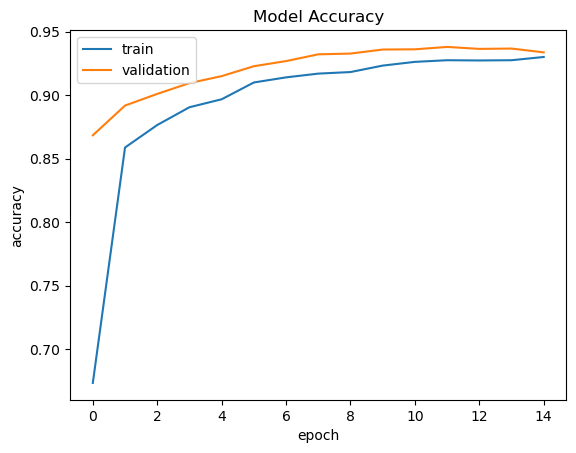

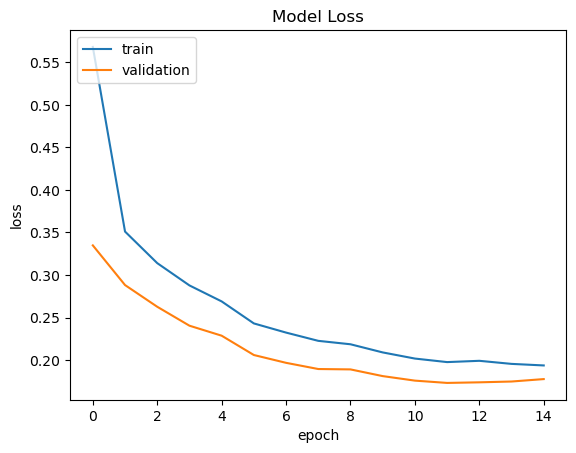

In [35]:
### we plot the validation and train accuracy and loss
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [38]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Load the input image
img_path = '/Users/shivanisahu/Desktop/Neural Modelling and Tools/TakehomeChallenge/male-female/Validation/HappySad/HappyMale/063438.jpg.jpg'  
img = image.load_img(img_path, target_size=(97, 77))  

# Convert the image to a numpy array
img_array = image.img_to_array(img)

img_array = np.expand_dims(img_array, axis=0)

# Normalize the image
img_array = img_array / 255.0


In [39]:
# Get predictions
predictions = model.predict(img_array)


class_labels = ['HappyFemale', 'HappyMale', 'SadFemale', 'SadMale']
predicted_class = class_labels[np.argmax(predictions)]

print(f"Predicted class: {predicted_class}")


1/1 [==============================] - 0s 120ms/step
Predicted class: HappyMale


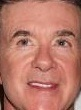

So finally we try our trained model to make predictions on a single image and it classifies really well.